In [137]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score

In [138]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [139]:
data_dir = "../Data/Data_Power/"
df = pd.read_csv("/content/drive/MyDrive/event_05.CSV", skiprows=[0,1,2,4])

df

,Time,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
0,0,-0.002934,-0.001368,-0.002883,-0.000112,0.04508,0.067282,-0.244665,-0.000550,0.000188,...,-0.023287,0.000081,-0.000039,0.000130,-0.081116,-0.117613,-0.05576,0.000453,-0.001614,0.000606
1,208,-0.002934,-0.001368,-0.002883,-0.000112,0.04508,0.067282,-0.244665,-0.000550,0.000188,...,-0.023287,0.000081,-0.000039,0.000130,-0.081116,-0.117613,-0.05576,0.000453,-0.001614,0.000606
2,417,-2.952545,0.134871,2.908653,-0.087328,185.03150,9.019005,-191.888600,-0.147661,0.076779,...,-14.103820,-0.010343,0.000550,0.009913,21.463490,0.533941,-21.40823,-0.087921,0.003065,0.082289
3,625,-59.591900,0.952302,60.348360,-1.703253,4822.05300,238.183100,-5049.003000,-4.277356,2.171021,...,-1571.959000,-0.697677,0.047035,0.680067,1767.272000,22.686780,-1783.38200,-6.534555,0.265079,6.453548
4,833,-121.721300,-8.754692,132.227900,-1.751707,11365.89000,1068.903000,-12438.870000,-13.147550,6.146880,...,-7043.420000,-2.322523,0.005846,2.382799,6816.355000,40.604510,-7327.11600,-30.228030,-0.263627,30.872170
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,20000080,-107.348300,3.012909,104.189700,0.140403,10035.23000,-254.877800,-9779.997000,-31.849460,24.298880,...,-7363.753000,-13.151780,6.346667,6.802612,9672.753000,-2105.289000,-7556.85300,-146.830200,42.131080,104.609100
96002,20000289,-102.386800,-6.574876,108.817900,0.150094,9573.42100,637.788000,-10211.570000,-32.447320,22.394400,...,-7861.656000,-13.057320,5.413432,7.641304,9376.340000,-1305.506000,-8049.54100,-143.193000,30.429370,112.595800
96003,20000497,-96.794510,-16.128600,112.756000,0.159785,9052.01600,1526.515000,-10579.580000,-32.846280,20.350460,...,-8310.669000,-12.882710,4.447833,8.431526,9021.549000,-497.579100,-8492.40800,-138.671900,18.549870,119.883700
96004,20000705,-90.605440,-25.580150,116.004100,0.167053,8474.09900,2405.932000,-10882.070000,-33.042820,18.180770,...,-8708.053000,-12.629280,3.456345,9.169273,8611.159000,313.279900,-8882.68300,-133.295100,6.562758,126.427400


In [140]:
# remove first 0.25 seconds to allow system to stabilise before using data
data = df[df['Time'] > 0.25e6].iloc[:, 1:]
data

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
1201,-104.46690,-3.015645,107.3368,0.145249,9766.355,306.5743,-10073.130,-30.13120,21.10951,9.022733,...,-8232.835,-13.37720,5.258677,8.115348,9578.582,-1217.2210,-8334.637,-86.45235,19.948840,66.48133
1202,-99.07918,-12.637490,111.5443,0.162207,9264.375,1202.4630,-10467.260,-30.55253,19.23818,11.315290,...,-8685.367,-13.18175,4.261304,8.917131,9209.891,-388.7696,-8784.620,-83.89881,12.879150,70.99658
1203,-93.07766,-22.191210,115.0785,0.181589,8705.442,2090.8320,-10796.350,-30.78555,17.24682,13.538720,...,-9083.925,-12.90552,3.237452,9.663772,8784.211,441.9618,-9180.036,-80.82899,5.729930,75.07618
1204,-86.51350,-31.591670,117.9059,0.196125,8092.647,2965.5940,-11058.440,-30.82910,15.14915,15.678730,...,-9426.551,-12.54914,2.193594,10.351270,8304.670,1269.7610,-9518.512,-77.26148,-1.456724,78.69291
1205,-79.40374,-40.787770,119.9928,0.210661,7430.405,3821.7370,-11252.550,-30.68199,12.95774,17.723270,...,-9710.900,-12.11459,1.135613,10.974730,7774.047,2089.7420,-9798.467,-73.21954,-8.634020,81.82409
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,-107.34830,3.012909,104.1897,0.140403,10035.230,-254.8778,-9779.997,-31.84946,24.29888,7.551060,...,-7363.753,-13.15178,6.346667,6.802612,9672.753,-2105.2890,-7556.853,-146.83020,42.131080,104.60910
96002,-102.38680,-6.574876,108.8179,0.150094,9573.421,637.7880,-10211.570,-32.44732,22.39440,10.053230,...,-7861.656,-13.05732,5.413432,7.641304,9376.340,-1305.5060,-8049.541,-143.19300,30.429370,112.59580
96003,-96.79451,-16.128600,112.7560,0.159785,9052.016,1526.5150,-10579.580,-32.84628,20.35046,12.496150,...,-8310.669,-12.88271,4.447833,8.431526,9021.549,-497.5791,-8492.408,-138.67190,18.549870,119.88370
96004,-90.60544,-25.580150,116.0041,0.167053,8474.099,2405.9320,-10882.070,-33.04282,18.18077,14.861140,...,-8708.053,-12.62928,3.456345,9.169273,8611.159,313.2799,-8882.683,-133.29510,6.562758,126.42740


In [141]:
corr_training = data.corr()
corr_training

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,1.000000,-0.506986,-0.499413,0.099407,-0.873094,0.348716,0.527749,0.707514,-0.816062,0.121448,...,0.420666,0.843527,-0.655317,-0.190536,-0.880565,0.461197,0.428268,0.810896,-0.499765,-0.316758
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,-0.506986,1.000000,-0.493509,-0.345391,0.530733,-0.872160,0.338710,0.098299,0.704953,-0.815548,...,0.454074,-0.208904,0.838454,-0.644831,0.437555,-0.879881,0.446495,-0.331413,0.808205,-0.488883
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,-0.499413,-0.493509,1.000000,0.236417,0.347265,0.525168,-0.873102,-0.812744,0.114542,0.697550,...,-0.881066,-0.641063,-0.181906,0.840682,0.448508,0.419435,-0.881115,-0.484915,-0.308472,0.811222
C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,0.099407,-0.345391,0.236417,1.000000,-0.101667,0.272564,-0.170281,-0.102469,-0.169584,0.275124,...,-0.200033,-0.007985,-0.231272,0.244848,-0.068748,0.264521,-0.198148,0.035681,-0.233270,0.202421
V_BUS20KV1_AN,-0.873094,0.530733,0.347265,-0.101667,1.000000,-0.501216,-0.502733,-0.719591,0.961938,-0.257829,...,-0.365367,-0.914937,0.820892,0.093984,0.990876,-0.624280,-0.375280,-0.944611,0.676455,0.272617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
V_DBU16_BN,0.461197,-0.879881,0.419435,0.264521,-0.624280,0.988617,-0.361185,-0.090746,-0.809091,0.914016,...,-0.498850,0.256657,-0.958503,0.718942,-0.514764,1.000000,-0.489610,0.423699,-0.961892,0.551459
V_DBU16_CN,0.428268,0.446495,-0.881115,-0.198148,-0.375280,-0.613736,0.989683,0.910971,-0.113407,-0.797115,...,0.999934,0.717061,0.220770,-0.958049,-0.495503,-0.489610,1.000000,0.549927,0.391638,-0.962291
C_DBU15_DBU16_1_DBU16_A,0.810896,-0.331413,-0.484915,0.035681,-0.944611,0.285838,0.662311,0.831717,-0.854146,0.035884,...,0.540319,0.947778,-0.654116,-0.298202,-0.962724,0.423699,0.549927,1.000000,-0.520929,-0.488463
C_DBU15_DBU16_1_DBU16_B,-0.499765,0.808205,-0.308472,-0.233270,0.676455,-0.938989,0.259251,-0.006056,0.838148,-0.846646,...,0.401627,-0.333881,0.947108,-0.628435,0.573032,-0.961892,0.391638,-0.520929,1.000000,-0.490360


In [142]:
df_test = pd.read_csv("/content/drive/MyDrive/Event 4.CSV", skiprows=[0,1,2,4])

df_test

,Time,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
0,0,-0.004329,-0.001515,-0.001623,-0.000095,0.04508,0.067282,-0.244665,-0.000550,0.000310,...,-0.023287,0.000081,-0.000039,-0.000175,0.006976,-0.170016,0.009497,-0.001304,0.000744,0.001239
1,208,-0.004329,-0.001515,-0.001623,-0.000095,0.04508,0.067282,-0.244665,-0.000550,0.000310,...,-0.023287,0.000081,-0.000039,-0.000175,0.006976,-0.170016,0.009497,-0.001304,0.000744,0.001239
2,417,-2.949805,0.129254,2.902578,-0.086547,185.03150,9.019005,-191.888600,-0.147661,0.077044,...,-14.103820,-0.010343,0.000550,0.010053,21.577300,0.534447,-21.554240,-0.085252,0.004687,0.085501
3,625,-59.594590,0.953098,60.338350,-1.701627,4822.05300,238.183100,-5049.003000,-4.277356,2.171564,...,-1571.959000,-0.697677,0.047035,0.680220,1767.359000,22.725030,-1783.271000,-6.532479,0.264938,6.454980
4,833,-121.711400,-8.763029,132.230300,-1.750747,11365.89000,1068.903000,-12438.870000,-13.147550,6.146612,...,-7043.420000,-2.322523,0.005846,2.382541,6816.230000,40.688840,-7326.779000,-30.226880,-0.263450,30.871960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,20000080,-107.363700,2.914632,104.303300,0.141372,10036.55000,-246.284100,-9789.851000,-31.042110,23.562030,...,-7589.041000,-13.282080,6.172494,7.107059,9714.433000,-1952.942000,-7746.662000,-123.451400,34.480090,88.890520
96002,20000289,-102.389100,-6.670727,108.918900,0.151196,9573.86300,647.097800,-10221.420000,-31.617610,21.703120,...,-8081.860000,-13.168070,5.220430,7.944878,9404.315000,-1143.866000,-8235.304000,-120.328600,24.622090,95.589390
96003,20000497,-96.799230,-16.229930,112.860300,0.159055,9051.57400,1536.183000,-10589.430000,-31.997740,19.709110,...,-8524.224000,-12.973920,4.237179,8.733336,9035.498000,-327.745300,-8672.682000,-116.471100,14.614240,101.690800
96004,20000705,-90.581010,-25.684520,116.101600,0.166915,8472.77400,2416.316000,-10891.430000,-32.181340,17.592980,...,-8913.785000,-12.700290,3.229803,9.466650,8610.810000,490.488500,-9056.354000,-111.891800,4.527538,107.160200


In [143]:
data_test = df_test[df_test['Time'] > 0.25e6].iloc[:, 1:]

data_test

,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C,C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_N,V_BUS20KV1_AN,V_BUS20KV1_BN,V_BUS20KV1_CN,C_WE919_WE910_1_WE910_A,C_WE919_WE910_1_WE910_B,C_WE919_WE910_1_WE910_C,...,V_2DBU17_CN,C_3DBX3_2DBU17_1_2DBU17_A,C_3DBX3_2DBU17_1_2DBU17_B,C_3DBX3_2DBU17_1_2DBU17_C,V_DBU16_AN,V_DBU16_BN,V_DBU16_CN,C_DBU15_DBU16_1_DBU16_A,C_DBU15_DBU16_1_DBU16_B,C_DBU15_DBU16_1_DBU16_C
1201,-104.45750,-3.022276,107.3242,0.145302,9766.355,306.5743,-10073.130,-30.13120,21.10978,9.022247,...,-8232.835,-13.37720,5.258677,8.115199,9578.646,-1217.1300,-8334.986,-86.45124,19.949390,66.48052
1202,-99.07707,-12.646870,111.5508,0.162985,9264.375,1202.4630,-10467.260,-30.55253,19.23790,11.314330,...,-8685.367,-13.18175,4.261304,8.916998,9209.828,-388.6814,-8784.569,-83.89921,12.879240,71.00006
1203,-93.08139,-22.179920,115.0774,0.180668,8705.442,2090.8320,-10796.350,-30.78555,17.24713,13.538670,...,-9083.925,-12.90552,3.237452,9.664098,8784.433,442.2328,-9180.040,-80.83090,5.730214,75.07913
1204,-86.50970,-31.582200,117.9038,0.196387,8092.647,2965.5940,-11058.440,-30.82910,15.14937,15.679100,...,-9426.551,-12.54914,2.193594,10.351160,8304.582,1269.9770,-9518.550,-77.26310,-1.458240,78.69476
1205,-79.41438,-40.788330,119.9912,0.212105,7430.405,3821.7370,-11252.550,-30.68199,12.95866,17.723470,...,-9710.900,-12.11459,1.135613,10.974640,7773.811,2089.6200,-9798.472,-73.22099,-8.630921,81.82396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96001,-107.36370,2.914632,104.3033,0.141372,10036.550,-246.2841,-9789.851,-31.04211,23.56203,7.479362,...,-7589.041,-13.28208,6.172494,7.107059,9714.433,-1952.9420,-7746.662,-123.45140,34.480090,88.89052
96002,-102.38910,-6.670727,108.9189,0.151196,9573.863,647.0978,-10221.420,-31.61761,21.70312,9.914006,...,-8081.860,-13.16807,5.220430,7.944878,9404.315,-1143.8660,-8235.304,-120.32860,24.622090,95.58939
96003,-96.79923,-16.229930,112.8603,0.159055,9051.574,1536.1830,-10589.430,-31.99774,19.70911,12.289000,...,-8524.224,-12.97392,4.237179,8.733336,9035.498,-327.7453,-8672.682,-116.47110,14.614240,101.69080
96004,-90.58101,-25.684520,116.1016,0.166915,8472.774,2416.3160,-10891.430,-32.18134,17.59298,14.588160,...,-8913.785,-12.70029,3.229803,9.466650,8610.810,490.4885,-9056.354,-111.89180,4.527538,107.16020


In [144]:
cols = data.columns

#one period is 70 timesteps

adj_list = {1:[29,65], 2:[30,66], 3:[31,67], 5:[12,26,19,62], 6:[13,27,20,63], 7:[14,28,21,64], 8:[15,22], 9:[16,23], 10:[17,24], 12:[5,26,33,19], 13:[6,27,34,20], 14:[7,28,35,21], 15:[8,29,52], 16:[9,53,30], 17:[10,54,31], 19:[26,5,33,12], 20:[27,34,6,13], 21:[28,35,7,14], 22:[8,36,29,40], 23:[9,37,30,41], 24:[10,38,31,42], 26:[12,33,5,19], 27:[13,20,34,6], 28:[14,21,35,7], 29:[1,65,15,48,22], 30:[2,66,49,16,23], 31:[3,67,50,17,24], 33:[56,19,26,12], 34:[57,13,27,20], 35:[58,14,28,21], 36:[22,40], 37:[23,41], 38:[24,42], 40:[36,48,22], 41:[37,49,23], 42:[38,50,24],44:[52,59],45:[53,60],46:[54,61],48:[40,52,29],49:[53,30,41],50:[31,42,54],52:[44,59,48,15],53:[45,60,49,16],54:[17,50,46,61],56:[33,74,68,59],57:[34,75,69,60],58:[35,76,70,61],59:[71,77,44,52,56],60:[45,78,72,53,57],61:[46,79,73,54,58],62:[5,86,80,65],63:[6,87,81,66],64:[7,88,82,67],65:[29,1,89,83,62],66:[2,30,90,84,63],67:[85,91,3,31,64],68:[56,74,71],69:[57,75,72],70:[58,76,73],71:[59,77,68],72:[60,78,69],73:[79,61,70],74:[56,68,77],75:[57,69,78],76:[58,70,79],77:[74,59,71],78:[60,72,75],79:[61,73,76],80:[62,86,83],81:[63,87,84],82:[64,88,85],83:[89,65,80],84:[90,66,81],85:[91,67,82],86:[62,80,89],87:[63,81,90],88:[64,82,91],89:[86,65,83],90:[66,84,87],91:[85,67,88]}
#adjacency list mapping out node:[neighbors]


# index_mapping = [(1, 'C_CTWE5_A'), (2, 'C_CTWE5_B'), (3, 'C_CTWE5_C'), (4, 'C_CTWE5_N'), (5, 'V_PTWE4_AN'), (6, 'V_ PTWE4_BN'), (7, 'V_ PTWE4_CN'), (8, 'C_CTWE1_A'), (9, 'C_CTWE1_B'), (10, 'C_CTWE1_C'), (11, 'C_CTWE1_N'), (12, 'V_PTWE1_AN'), (13, 'V_ PTWE1_BN'), (14, 'V_ PTWE1_CN'), (15, 'C_CTWE9_A'), (16, 'C_CTWE9_B'), (17, 'C_CTWE9_C'), (18, 'C_CTWE9_N'), (19, 'V_PTWE3_AN'), (20, 'V_ PTWE3_BN'), (21, 'V_ PTWE3_CN'), (22, 'C_CTWE3_A'), (23, 'C_ CTWE3_B'), (24, 'C_ CTWE3_C'), (25, 'C_ CTWE3_N'), (26, 'V_PTWE2_AN'), (27, 'V_ PTWE2_BN'), (28, 'V_ PTWE2_CN'), (29, 'C_CTWE7_A'), (30, 'C_CTWE7_B'), (31, 'C_CTWE7_C'), (32, 'C_CTWE7_N'), (33, 'V_PTWE5_AN'), (34, 'V_ PTWE5_BN'), (35, 'V_ PTWE5_CN'), (36, 'C_CTWE2_A'), (37, 'C_ CTWE2_B'), (38, 'C_ CTWE2_C'), (39, 'C_ CTWE2_N'), (40, 'C_CTWE4_A'), (41, 'C_ CTWE4_B'), (42, 'C_ CTWE4_C'), (43, 'C_ CTWE4_N'), (44, 'C_CTWE6_A'), (45, 'C_ CTWE6_B'), (46, 'C_ CTWE6_C'), (47, 'C_ CTWE6_N'), (48, 'C_CTWE10_A'), (49, 'C_ CTWE10_B'), (50, 'C_ CTWE10_C'), (51, 'C_ CTWE10_N'), (52, 'C_CTWE8_A'), (53, 'C_CTWE8_B'), (54, 'C_CTWE8_C'), (55, 'C_CTWE8_N'), (56, 'V_PT_DIST1_AN'), (57, 'V_PT_DIST1_BN'), (58, 'V_PT_DIST1_CN'), (59, 'C_ CT_ DIST1_A'), (60, 'C_ CT_ DIST1_B'), (61, ' C_ CT_ DIST1_C'), (62, 'V_PT_DIST2_AN'), (63, 'V_PT_DIST2_BN'), (64, 'V_PT_DIST2_CN'), (65, 'C_ CT_ DIST2_A'), (66, 'C_ CT_ DIST2_B'), (67, ' C_ CT_ DIST2_C'), (68, 'V_PT_FDR3_AN'), (69, 'V_PT_FDR3_BN'), (70, 'V_PT_FDR3_CN'), (71, 'C_CT_FDR3_A'), (72, 'C_CT_FDR3_B'), (73, 'C_CT_FDR3_C'), (74, 'V_PT_FDR1_AN'), (75, 'V_PT_FDR1_BN'), (76, 'V_PT_FDR1_CN'), (77, 'C_CT_FDR1_A'), (78, 'C_CT_FDR1_B'), (79, 'C_CT_FDR1_C'), (80, 'V_PT_FDR32_AN'), (81, 'V_PT_FDR32_BN'), (82, 'V_PT_FDR32_CN'), (83, 'C_CT_FDR32_A'), (84, 'C_CT_FDR32_B'), (85, 'C_CT_FDR32_C'), (86, 'V_PT_FDR12_AN'), (87, 'V_PT_FDR12_BN'), (88, 'V_PT_FDR12_CN'), (89, 'C_CT_FDR12_A'), (90, 'C_CT_FDR12_B'), (91, 'C_CT_FDR12_C')]

emptyr = [4,11,18,25,32,39,43,47,51,55] #nodes without connections to anything

#dictionary containing attack points with format number:(start time, end time, type, name)
attack_dict = { 52:(1.10,2.10,'CT','C_CTWE8_A'),   53:(1.10,2.10,'CT','C_CTWE8_B'), 54:(1.10,2.10,'CT','C_CTWE8_C'), 55:(1.10, 2.10,'CT','C_CTWE8_N'),
#                56:(2.30,3.00,'PT','V_PT_DIST1_AN'), 57:(2.30,3.00,'PT','V_PT_DIST1_BN'), 58:(2.30,3.00,'PT','V_PT_DIST1_CN'),
               5:(5.00,5.90,'Vphase','V_PTWE4_AN'), 66:(6.60,7.80,'Cphase','C_CT_DIST2_B'), 68:(9.00,10.10,'GPS','V_PT_FDR3_AN'), 69:(9.00,10.10,'GPS','V_PT_FDR3_BN'), 70:(9.00,10.10,'GPS','V_PT_FDR3_CN'), 71:(9.00,10.10,'GPS','C_CT_FDR3_A'), 72:(9.00,10.10,'GPS','C_CT_FDR3_B'), 73:(9.00,10.10,'GPS','C_CT_FDR3_C'), 36:(10.50,11.70,'GPS','C_CTWE2_A'), 37:(10.50,11.70,'GPS','C_CTWE2_B'), 38:(10.50,11.70,'GPS','C_CTWE2_C'),39:(10.50,11.70,'GPS','C_CTWE2_N'), 77:(16.20, 17.00, 'CT', 'C_CT_FDR1_A'), 78:(16.20, 17.00, 'CT', 'C_CT_FDR1_B'), 79:(16.20, 17.00, 'CT', 'C_CT_FDR1_C'), 86:(17.40, 18.30, 'PT','V_PT_FDR12_AN'), 87:(17.40, 18.30, 'PT','V_PT_FDR12_BN'), 88:(17.40, 18.30, 'PT','V_PT_FDR12_CN')}

#dictionary containing the only attack without a compromised unit
attack_wo_comp_dict = {'Load_decrease':(10.20, 10.20, 'Bus_3DB211', 'all')}

#dictionary contatining faults labeled    type:(start time, end time, location, effects?)
fault_dict = {'Downed_conductor':[3.25,3.50,'Bus_DBU3_A','all'], 'LG':[8.50,8.57,'Bus_FDR11LOAD_A','none'], 'LL':[12.00,12.08,'Bus_3DB12','none']}

#dictionary containing normal events labeled    time:(type, power, location)
normal_dict = { 6.10:('L+','1500kw+10kvar', 'Bus_3DB211'), 8.00:('L+','4500kw+1000kvar','Bus_TRAIN1'), 10.20:('L-','1500kw+10kvar', 'Bus_3DB211'), 13.50:('L+','6500kw+2000kvar', 'Bus_FDR12LOAD'), 14.00:('L+','1500kw+10kvar','Bus_2DB112'), 14.40:('L-','4500kw+1000kvar', 'Bus_TRAIN1'), 18.80:('L-','6500kw+2000kvar','FDR12LOAD'), 19.50:('L-','1500kw+10kvar','Bus_2DB112'), 19.80:('L+','1500kw+10kvar','Bus_3DB211')}

all_attack_times = set()
for k, values in attack_dict.items():
    all_attack_times.add((values[0], values[1]))

print(all_attack_times)

# delete low correlations

#for i in [36, 37, 38]:
    #del adj_list[i][-1]


def correlation_pair(dataframe, var1_index, var2_index, window):

    return dataframe.iloc[:, var1_index].rolling(window).corr(dataframe.iloc[:, var2_index])[window-1:]


def correlation_pair_plot(dataframe, var1_index, var2_index, window, freq=True,
                     attack_indices=[], other_attack_indices=[]):

    corrs = correlation_pair(dataframe, var1_index, var2_index, window)

    plt.title(f"Sample Correlation against Time, Window Length {window}, Variables: {cols[var1_index], cols[var2_index]}")
    plt.plot(corrs)

    for start, end in attack_indices:
        plt.axvline(start, color='red')
        plt.axvline(end, color='red')

    for start, end in other_attack_indices:
        plt.axvline(start, color='pink', alpha=0.75)
        plt.axvline(end, color='pink', alpha=0.75)

    plt.show()

    if freq:
        plt.title(f"Sample Correlation Frequency, Window Length {window}, Variables: {cols[var1_index], cols[var2_index]}")
        plt.hist(corrs, bins=500)
        plt.show()

    return corrs

def correlation_multi(dataframe, var1_index, var2_indices, window):

    corrs = []
    for var2_index in var2_indices:
        corrs.append(correlation_pair(dataframe, var1_index, var2_index, window))

    return np.prod(corrs, axis=0)


def correlation_multi_plot(dataframe, var1_index, var2_indices, window, freq=True,
                     attack_indices=[], other_attack_indices=[]):

    corrs = correlation_multi(dataframe, var1_index, var2_indices, window)

    plt.title(f"Sample Correlation against Time, Window Length {window}, Variables: {cols[var1_index]} with " + \
              f"{[cols[var2_index] for var2_index in var2_indices]}")
    plt.plot(corrs)

    for start, end in attack_indices:
        plt.axvline(start, color='red')
        plt.axvline(end, color='red')

    for start, end in other_attack_indices:
        plt.axvline(start, color='pink', alpha=0.75)
        plt.axvline(end, color='pink', alpha=0.75)

    plt.show()

    if freq:
        plt.title(f"Sample Correlation Frequency, Window Length {window}, Variables: {cols[var1_index]} with " + \
              f"{[cols[var2_index] for var2_index in var2_indices]}")
        plt.hist(corrs, bins=500)
        plt.show()

    return corrs


def covariance_pair(dataframe, var1_index, var2_index, window):

    return dataframe.iloc[:, var1_index].rolling(window).cov(dataframe.iloc[:, var2_index])[window-1:]


def covariance_pair_plot(dataframe, var1_index, var2_index, window, freq=True,
                     attack_indices=[], other_attack_indices=[]):

    covs = covariance_pair(dataframe, var1_index, var2_index, window)

    plt.title(f"Sample Covariance against Time, Window Length {window}, Variables: {cols[var1_index], cols[var2_index]}")
    plt.plot(covs)

    for start, end in attack_indices:
        plt.axvline(start, color='red')
        plt.axvline(end, color='red')

    for start, end in other_attack_indices:
        plt.axvline(start, color='pink', alpha=0.75)
        plt.axvline(end, color='pink', alpha=0.75)

    plt.show()

    if freq:
        plt.title(f"Sample Covariance Frequency, Window Length {window}, Variables: {cols[var1_index], cols[var2_index]}")
        plt.hist(covs, bins=500)
        plt.show()

    return covs


def covariance_multi(dataframe, var1_index, var2_indices, window):

    covs = []
    for var2_index in var2_indices:
        covs.append(covariance_pair(dataframe, var1_index, var2_index, window))

    return np.prod(covs, axis=0)

def covariance_multi_plot(dataframe, var1_index, var2_indices, window, freq=True,
                     attack_indices=[], other_attack_indices=[]):

    covs = covariance_multi(dataframe, var1_index, var2_indices, window)

    plt.title(f"Sample Covariance against Time, Window Length {window}, Variables: {cols[var1_index]} with " + \
              f"{[cols[var2_index] for var2_index in var2_indices]}")

    plt.plot(covs)


    for start, end in other_attack_indices:
        plt.axvline(start, color='pink', alpha=0.75)
        plt.axvline(end, color='pink', alpha=0.75)

    for start, end in attack_indices:
        plt.axvline(start, color='red')
        plt.axvline(end, color='red')

    plt.show()

    if freq:
        plt.title(f"Sample Covariance Frequency, Window Length {window}, Variables: {cols[var1_index]} with " + \
              f"{[cols[var2_index] for var2_index in var2_indices]}")
        plt.hist(covs, bins=500)
        plt.show()

    return covs


def get_labels(y, window):
    '''
    get cumlulative statistic for presence of anomaly
    if window has anomaly, label the whole window as anomalous
    y: array of presence of anomalies across time
    window: window size of statistic + roll sum window
    '''

    return (np.lib.stride_tricks.sliding_window_view(y, window) == 1).any(axis=0).squeeze()

def steps(x):
    return x.iloc[-1] - x.iloc[0]

def roll_sum(stat, window, axis=1):
    '''
    we calculate the rolling sum of the differences within a window

    Suppose we have something that is very different the rolling sum will change.

    stat: array of statistical property (eg. covariance) from training
    window: window for differences (different from window for calculating statistical property)
    axis: axis to perform difference on (time axis usually along axis 1)
    '''

    # calculate difference btw each time step
    diff = np.diff(stat, n=1)

    # calculate rolling sum
    csum = np.cumsum(diff, dtype=float)
    xsum = csum[window:] - csum[:-window]
    return np.abs(xsum)


def get_empirical_diff_threshold(stat, window, fn, axis=1, quantile=0.95, sensor_names=[]):
    '''
    we calculate the rolling sum of the differences within a window

    stat: array of statistical property (eg. covariance) from training
    window: window for differences (different from window for calculating statistical property)
    quantile: confidence level
    axis: axis to perform difference on
        (time axis usually along axis 1 for 2D array. for ID array, axis=-1)
    sensor_names: list of sensor names. if empty, don't plot
    '''

    # calculate difference btw each time step
    test_stat = fn(stat, window, axis=axis)

    # plot the histogram of the frequency of rolling sum (or whatever function)
    # --> can be commented out
    if len(sensor_names) > 0:
        fig, ax = plt.subplots(len(sensor_names), 1)
        #test_statdf = pd.DataFrame(test_stat)
        #test_statdf.plot.kde()
        if len(sensor_names) == 1:
            ax.hist(test_stat, bins=500)
            ax.set_title(f"Rolling Sum of Difference Frequency of {cols[sensor_names[0]]}{sensor_names[0]}")
        else:
            for i, n in enumerate(sensor_names):
                ax[0].hist(test_stat, bins=500)
                ax[0].set_title(f"Rolling Sum of Difference Frequency of {s}")
        plt.show()
    #########################################################

    # return the threshold
    # may need to make this 2-sided (for negative and positive)
    return np.quantile(test_stat, quantile)

def get_threshold(stat, window, fn, axis=1, quantile=0.95):


    test_stat = fn(stat, window, axis=axis)

    return np.quantile(test_stat, quantile)

# For Test Data

def detect(stat, window, threshold, multi=False):
    '''
    we use the critical regions (ie. thresholds) obtained from the previous function
    to detect local violations (anomaly detection on the local level)
    stat: array of statistical property from test data
    '''
    violation = (roll_sum(stat, window) > threshold)

    if not multi:
        violation = (violation > 0).any(axis=0).squeeze()

    return violation


def get_metrics(y_true, y_pred):
    '''
    get detection metrics
    expand this to obtain EDD and ARL
    '''

    labels = get_labels(y_true)

    # can get more metrics here
    precision, recall, f1, support = precision_recall_fscore_support(labels, y_pred)

    return precision, recall, f1


def evaluate(y_true, stat, window, threshold, multi=False):

    violation = detect(stat, window, threshold, multi=multi)
    metrics = get_metrics(y_true, violation)

    return metrics

def get_scores(y_true, y_pred):

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    return accuracy, precision, recall, f1

{(9.0, 10.1), (17.4, 18.3), (6.6, 7.8), (5.0, 5.9), (10.5, 11.7), (16.2, 17.0), (1.1, 2.1)}


In [145]:
all_attack_indices = set()

for start, end in all_attack_times:
    attack_indices = df_test.index[(df_test['Time'] >= start * 1e6) & (df_test['Time'] <= end * 1e6)] - 1201
    all_attack_indices.add((attack_indices[0], attack_indices[-1]))

all_attack_indices

{(4080, 8879),
 (22800, 27119),
 (30480, 36239),
 (42000, 47279),
 (49200, 54959),
 (76560, 80399),
 (82320, 86639)}

In [146]:
#delete low correlations

for i in [36, 37, 38]:
    print(corr_training.iloc[i][adj_list[i]])

 C_WE927_WE929_1_WE929_B   -1.000000
 C_WE957_WE950_1_WE950_B    0.371338
Name:  C_WE927_WE929_1_WE927_B, dtype: float64
 C_WE927_WE929_1_WE929_C   -1.000000
 C_WE957_WE950_1_WE950_C    0.362386
Name:  C_WE927_WE929_1_WE927_C, dtype: float64
 C_WE927_WE929_1_WE929_N   -1.000000
 C_WE957_WE950_1_WE950_N   -0.137933
Name:  C_WE927_WE929_1_WE927_N, dtype: float64


In [147]:
#delete low correlations

for i in [36, 37, 38]:
    del adj_list[i][-1]
    print(corr_training.iloc[i][adj_list[i]])

 C_WE927_WE929_1_WE929_B   -1.0
Name:  C_WE927_WE929_1_WE927_B, dtype: float64
 C_WE927_WE929_1_WE929_C   -1.0
Name:  C_WE927_WE929_1_WE927_C, dtype: float64
 C_WE927_WE929_1_WE929_N   -1.0
Name:  C_WE927_WE929_1_WE927_N, dtype: float64


In [148]:
# def average_run_length(predictions, anomaly_label=1):
#     run_lengths = []
#     current_run_length = 0

#     for index, prediction in enumerate(predictions):
#         if prediction == anomaly_label[index]:
#             if current_run_length > 0:
#                 run_lengths.append(current_run_length)
#                 current_run_length = 0
#         else:
#             current_run_length += 1

#     if len(run_lengths) == 0:
#         return None

#     return np.mean(run_lengths)

In [149]:
# def expectation_detection_delay(predictions, attack_times):
#   edd = []
#   for index, prediction in enumerate(predictions):
#     if prediction == 1:
#       delay = index-attack_times
#       edd.append(delay)
#   return edd

In [150]:
# def FPR ():
#   FPR = []
#   for sensor, ind in at_neighbor.items():
#     for i in ind:
#       x = i
#       if (x >= 4080-350 and x<= 8879+350) or (x>=30480-350 and x<=36239+350) or (x>=82320-350 and x<=86639+350) or (x>=76560-350 and x<=80399+350) or (x>=49200-350 and x<=54959+350) or (x>=22800-350 and x<=27119+350) or (x>=42000-350 and x<=47279+350):
#         continue
#       else:
#         print(i)
#         print(sensor)
#         FPR += [(sensor,i)]
#   return FPR

In [151]:
# def FPR_L(FLocal, at_neighbor):
#   FPR_L = 0
#   for index, sensor in enumerate(FLocal):
#     for i in at_neighbor[sensor]:
#       x = i
#       if (x > 4080-350 and x< 8879+350) or (x>30480-350 and x<36239+350) or (x>82320-350 and x<86639+350) or (x>76560-350 and x<80399+350) or (x>49200-350 and x<54959+350) or (x>22800-350 and x<27119+350) or (x>42000-350 and x<47279+350):
#         continue
#       else:
#         FPR_L += 1
#   return FPR_L

In [152]:
# def detection_delay (predictions, start, end):
#   dd = 0
#   for index, prediction in enumerate(predictions):
#     if prediction >= start-350 and prediction <= end+350:
#       dd = prediction-start+350
#       break
#   return dd

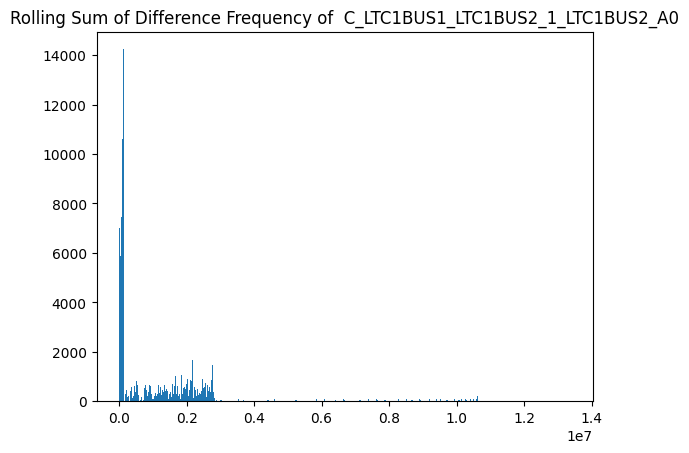

******************************************************************************


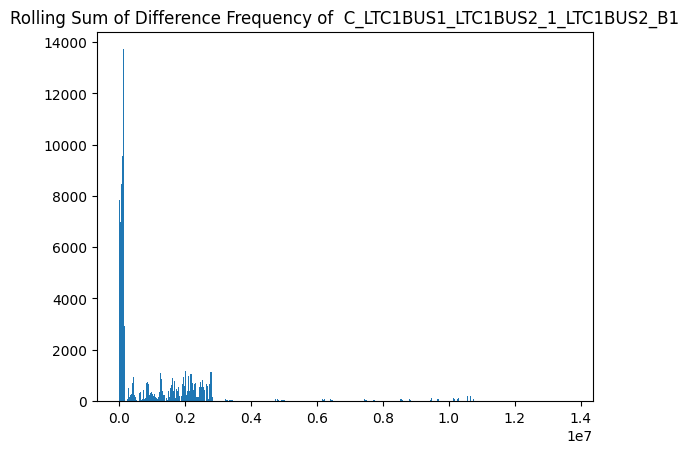

******************************************************************************


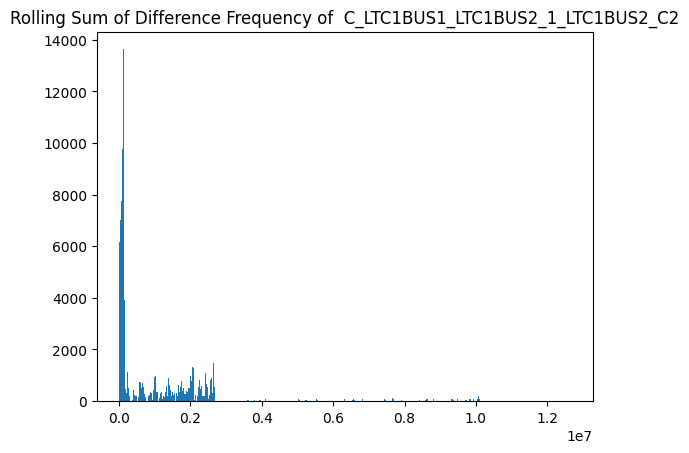

******************************************************************************


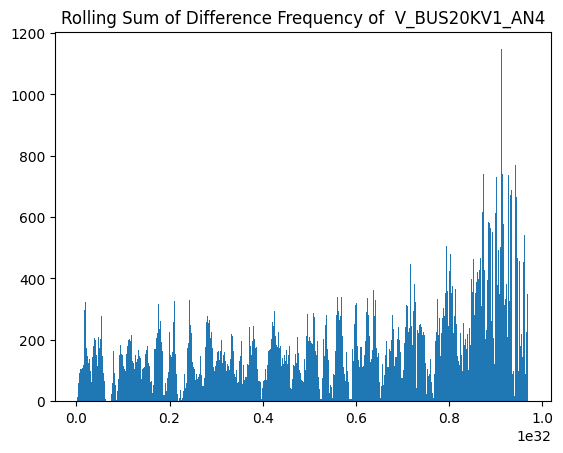

******************************************************************************


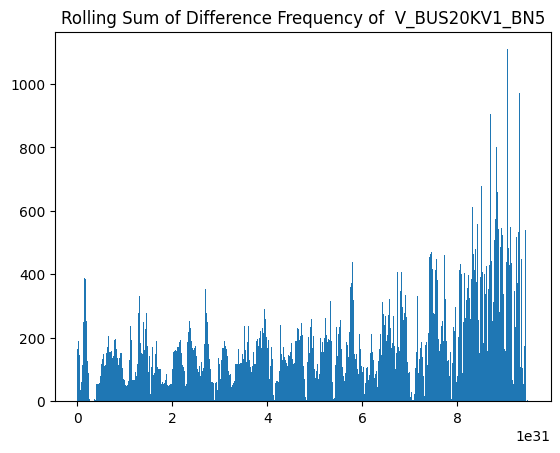

******************************************************************************


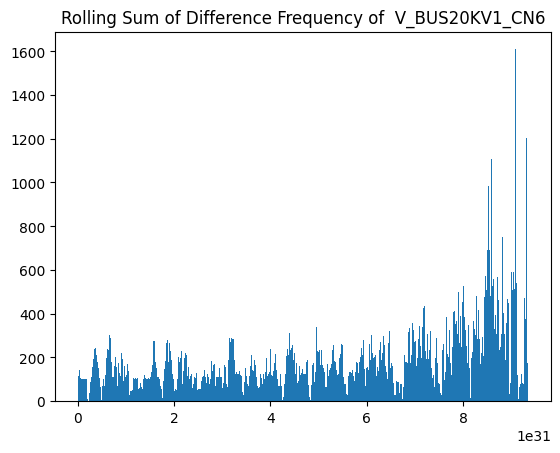

******************************************************************************


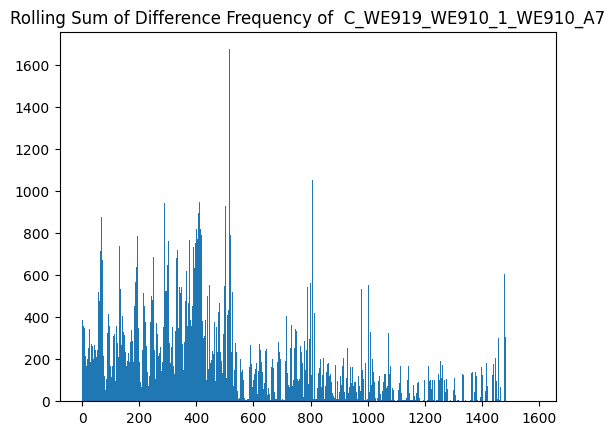

******************************************************************************


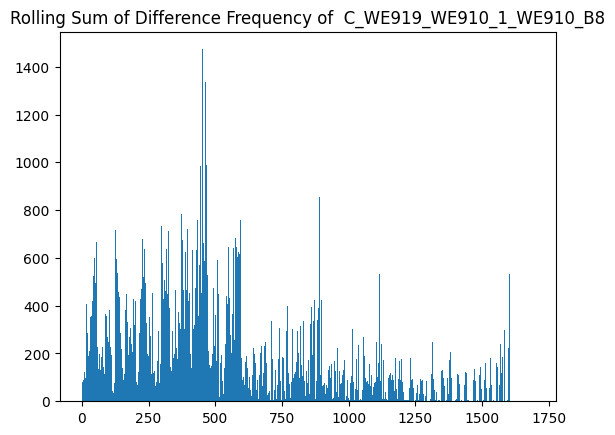

******************************************************************************


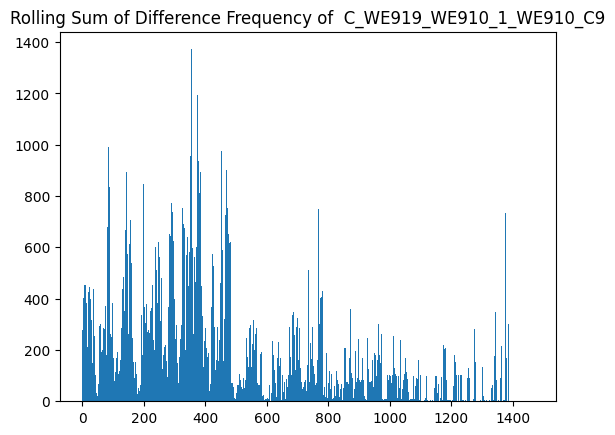

******************************************************************************


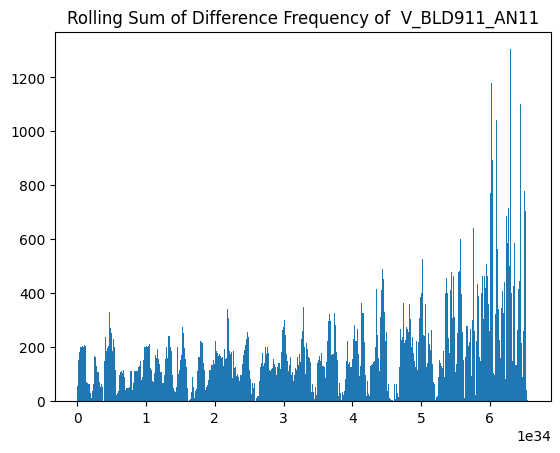

******************************************************************************


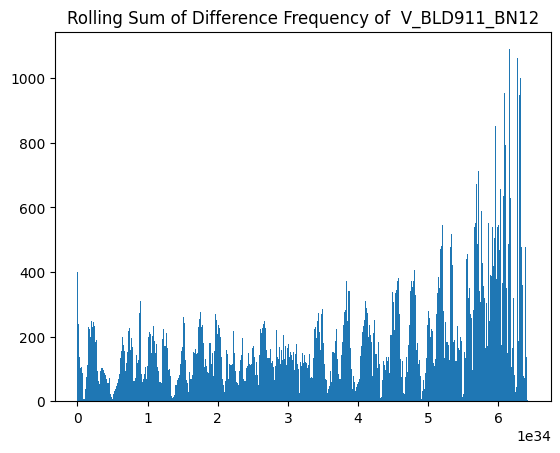

******************************************************************************


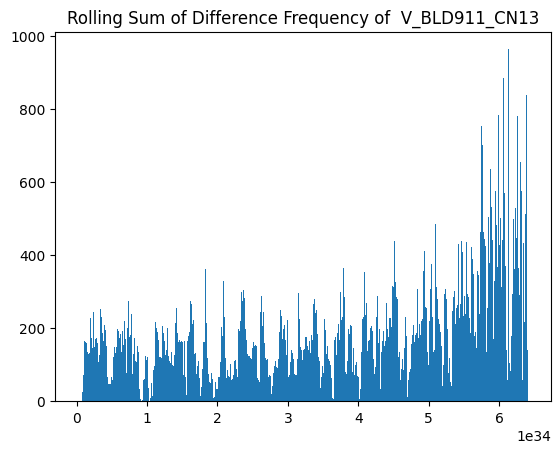

******************************************************************************


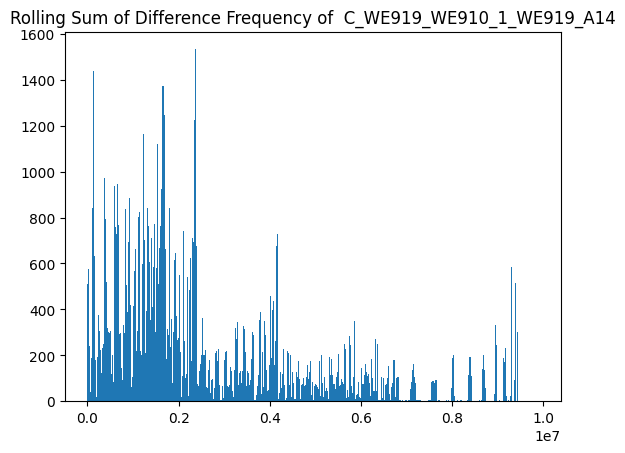

******************************************************************************


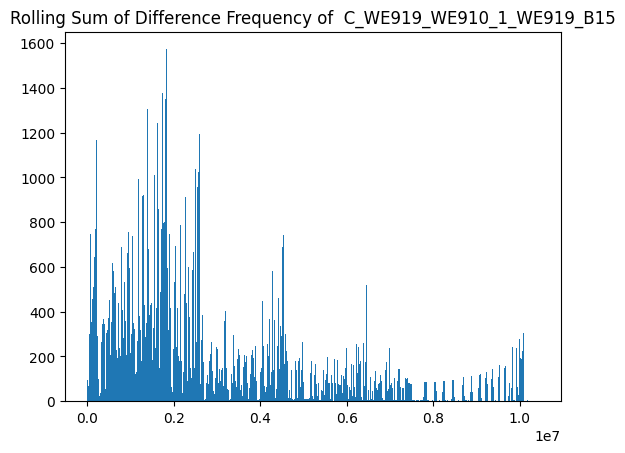

******************************************************************************


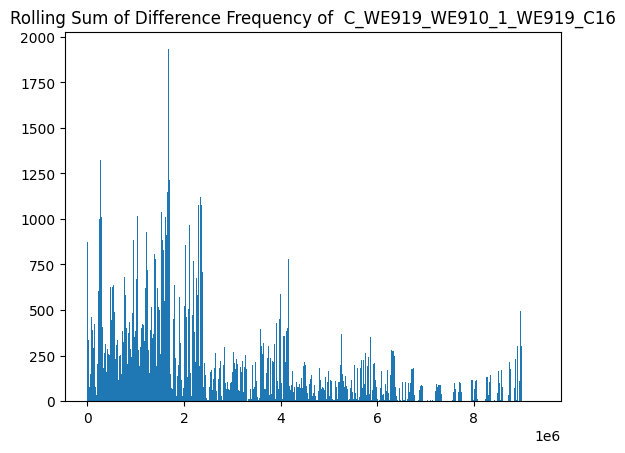

******************************************************************************


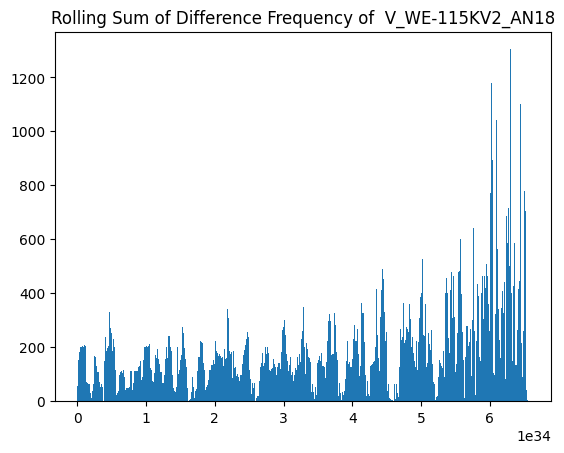

******************************************************************************


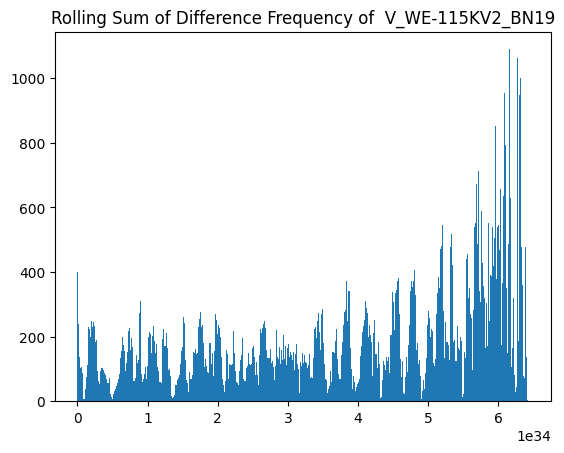

******************************************************************************


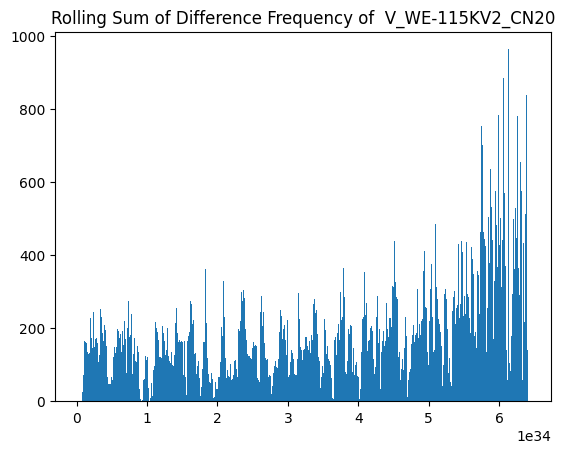

******************************************************************************


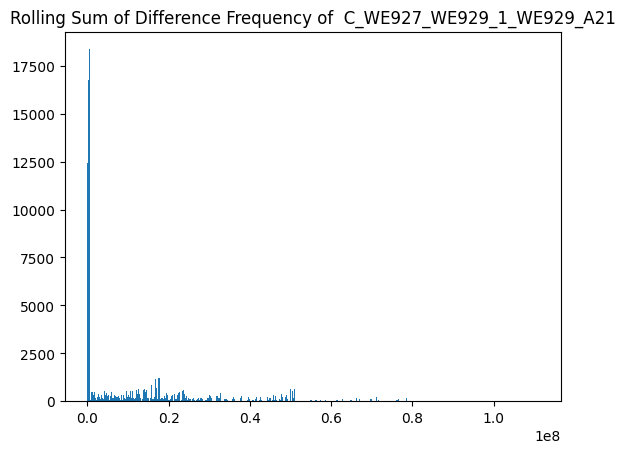

******************************************************************************


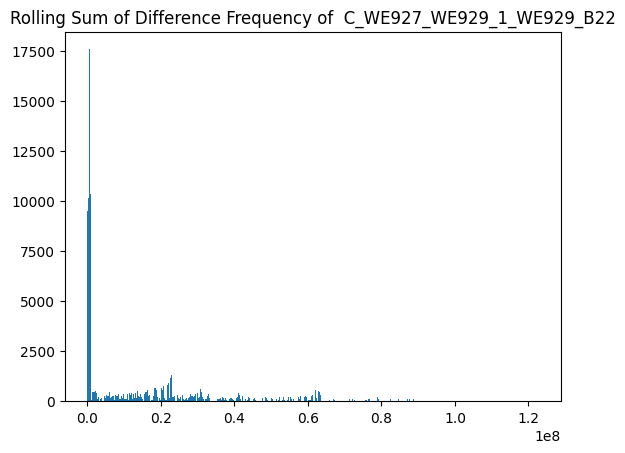

******************************************************************************


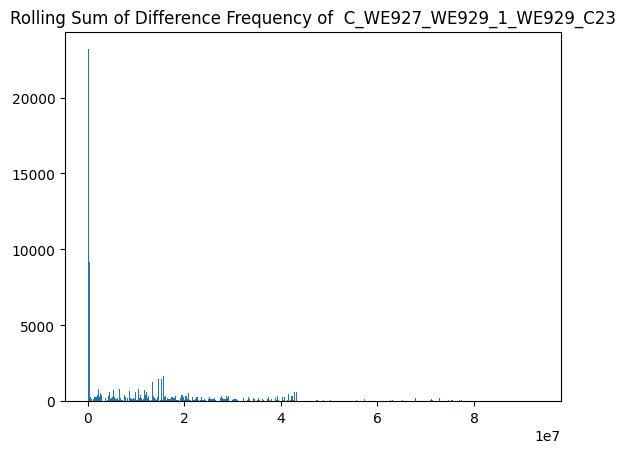

******************************************************************************


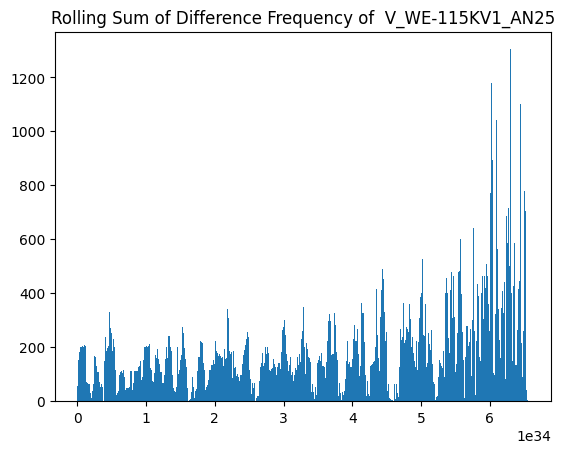

******************************************************************************


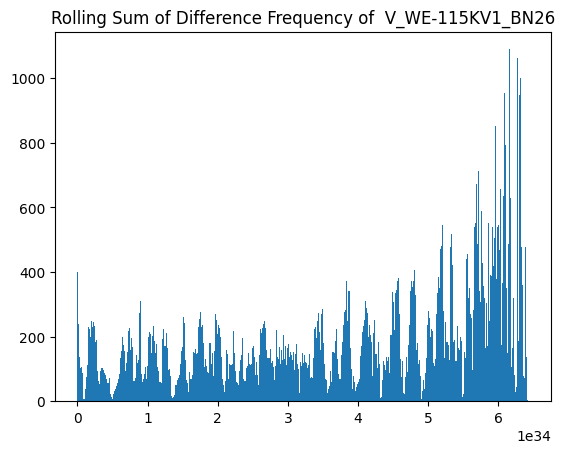

******************************************************************************


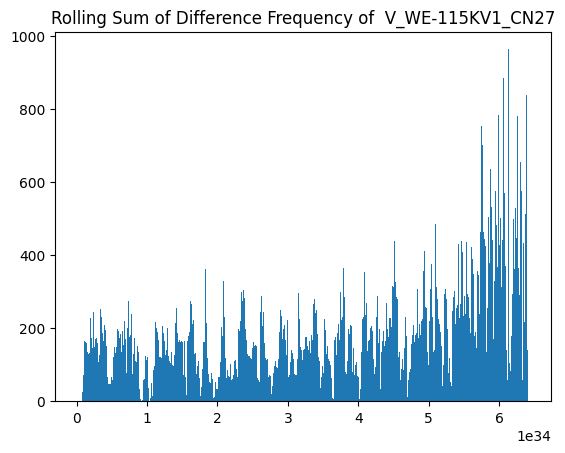

******************************************************************************


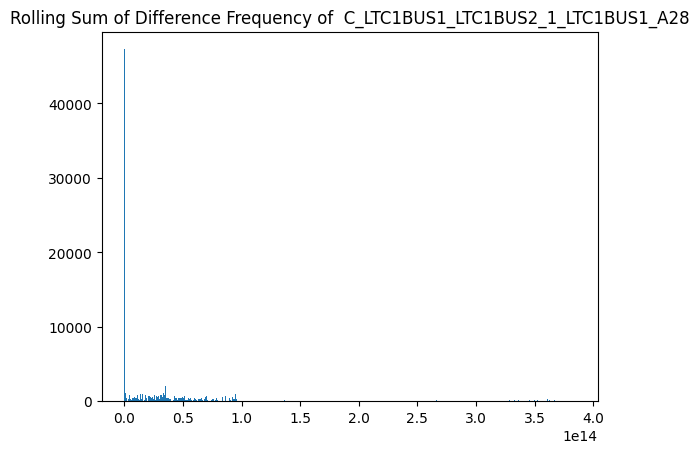

******************************************************************************


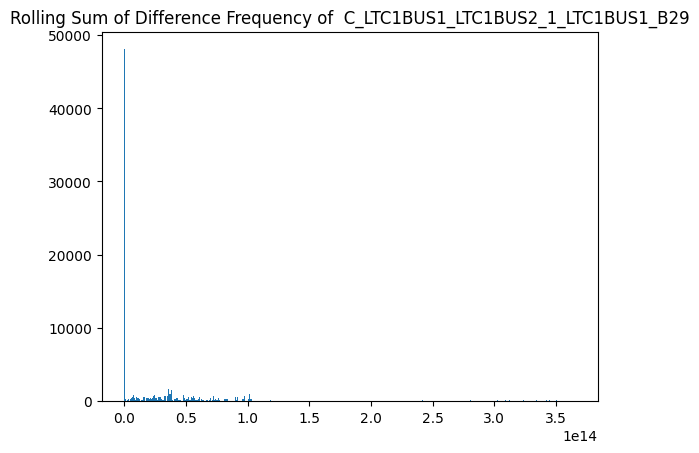

******************************************************************************


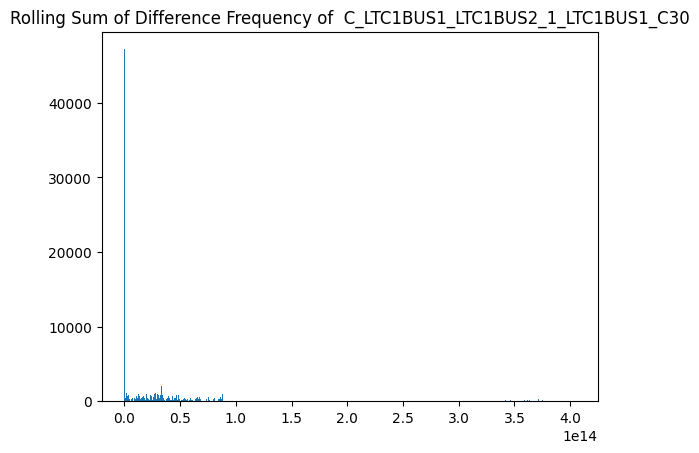

******************************************************************************


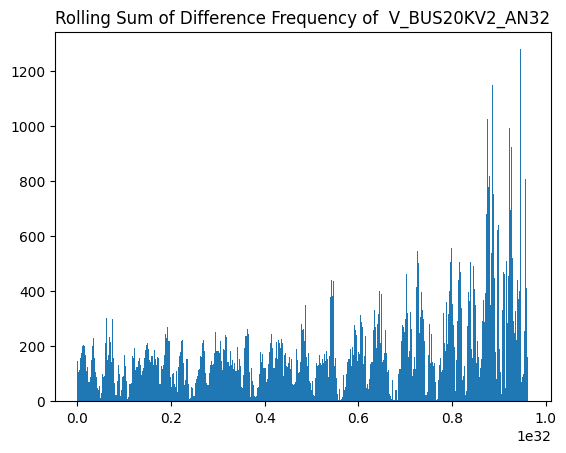

******************************************************************************


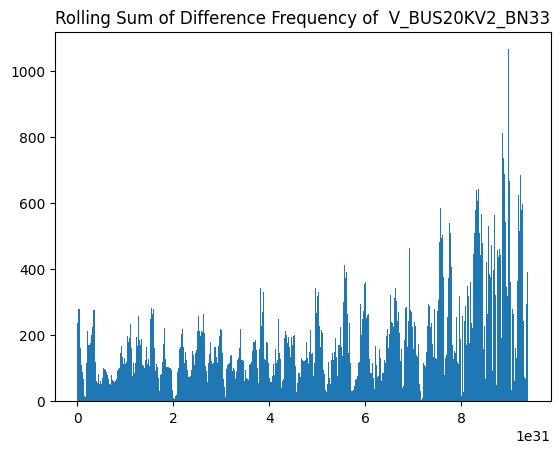

******************************************************************************


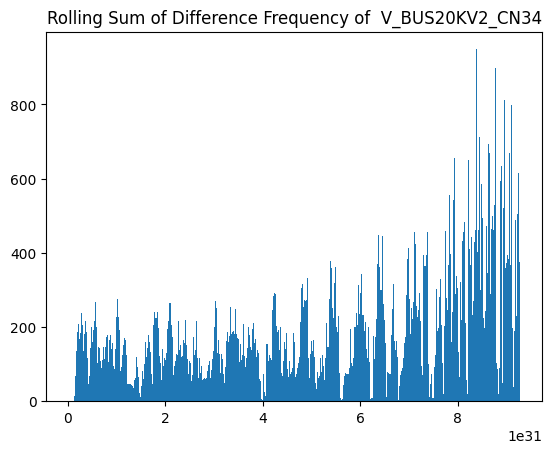

******************************************************************************


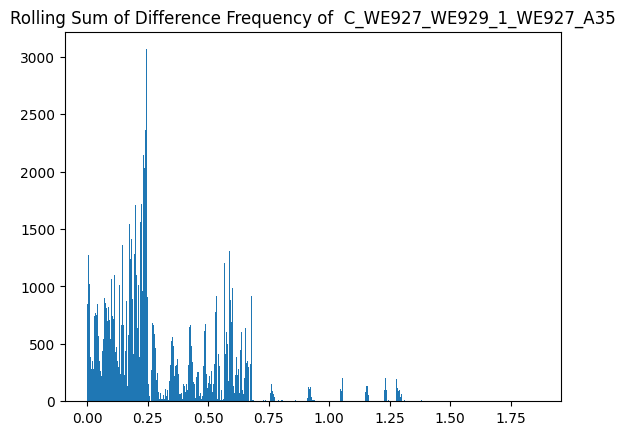

******************************************************************************


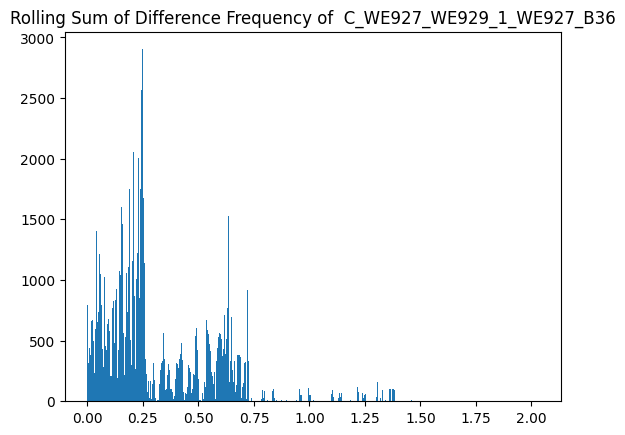

******************************************************************************


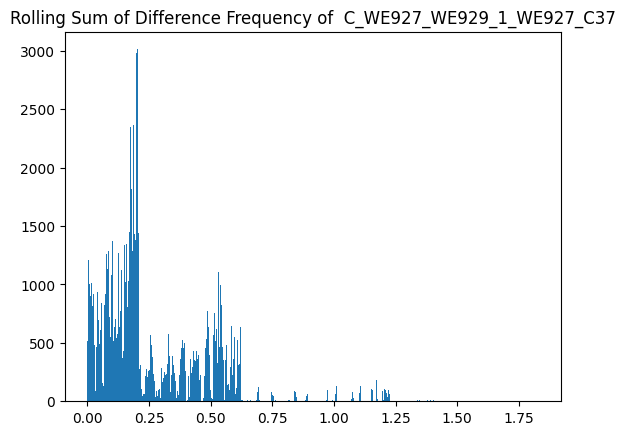

******************************************************************************


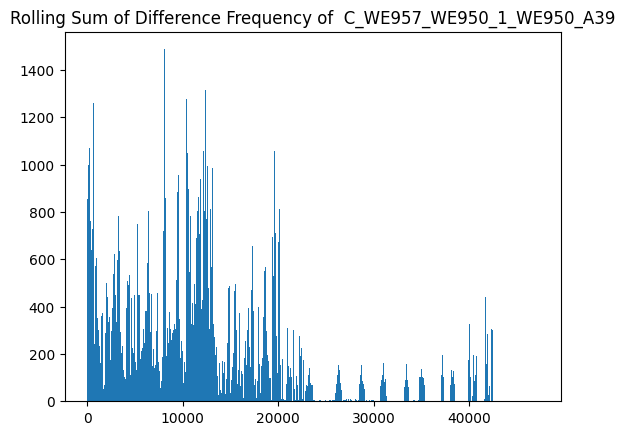

******************************************************************************


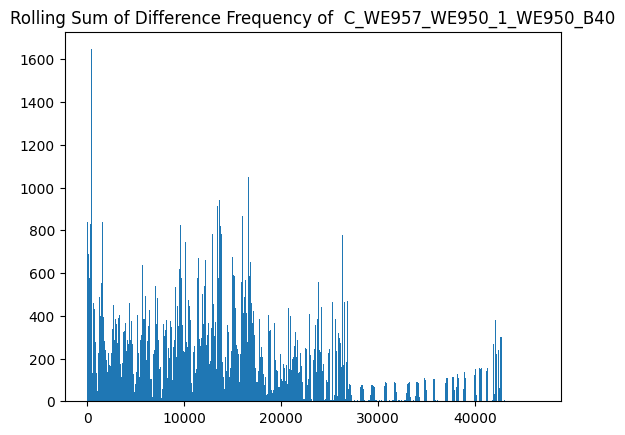

******************************************************************************


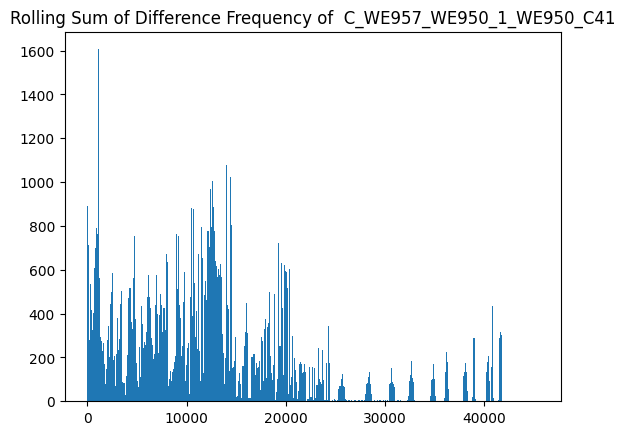

******************************************************************************


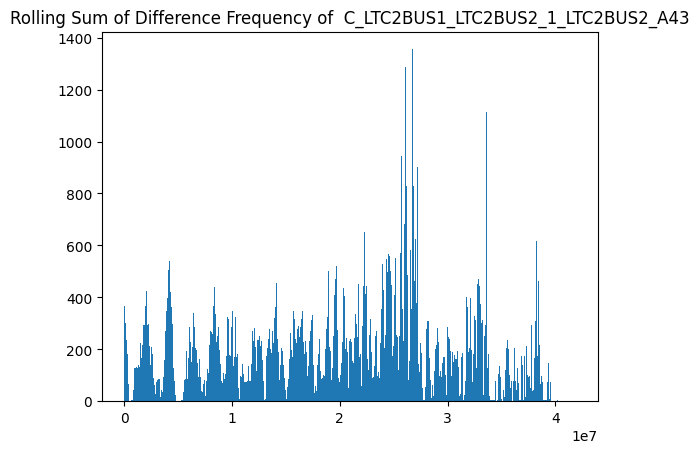

******************************************************************************


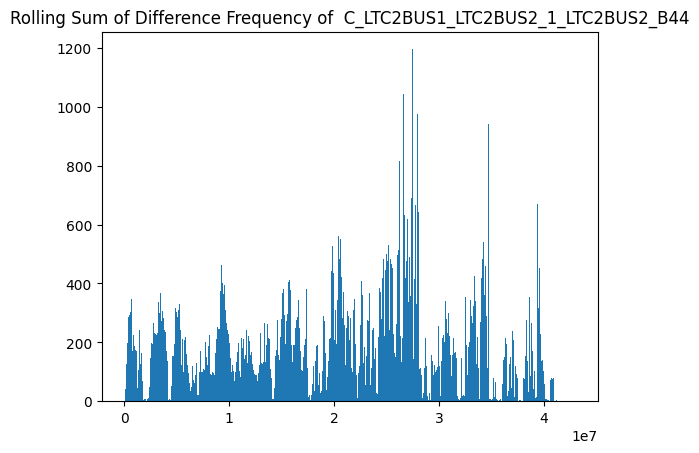

******************************************************************************


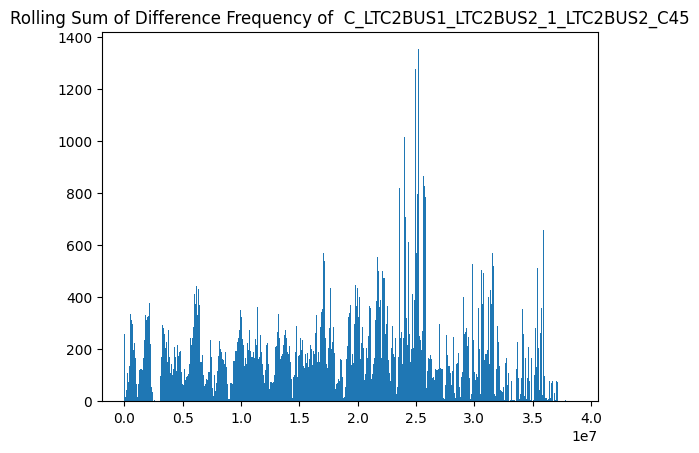

******************************************************************************


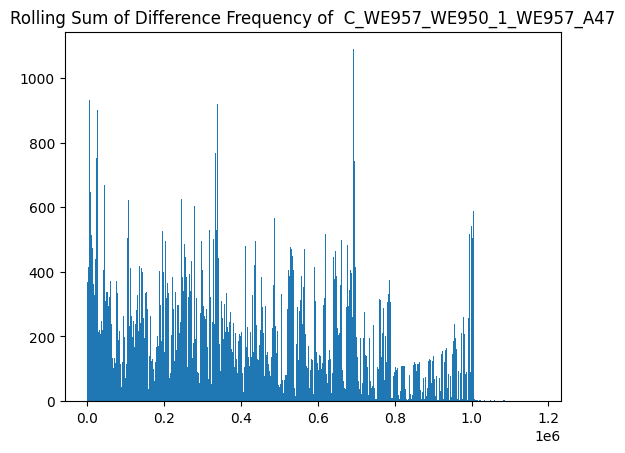

******************************************************************************


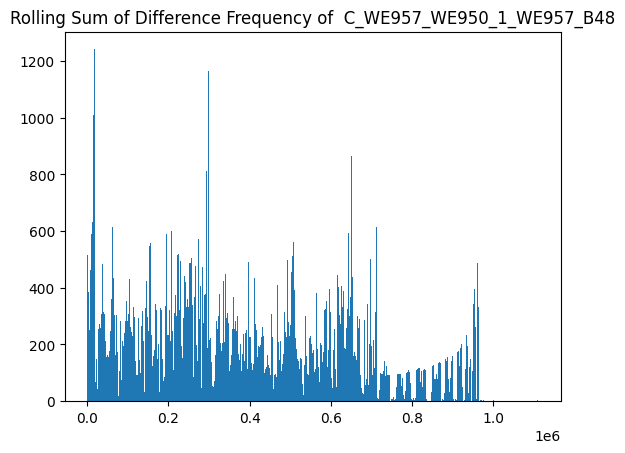

******************************************************************************


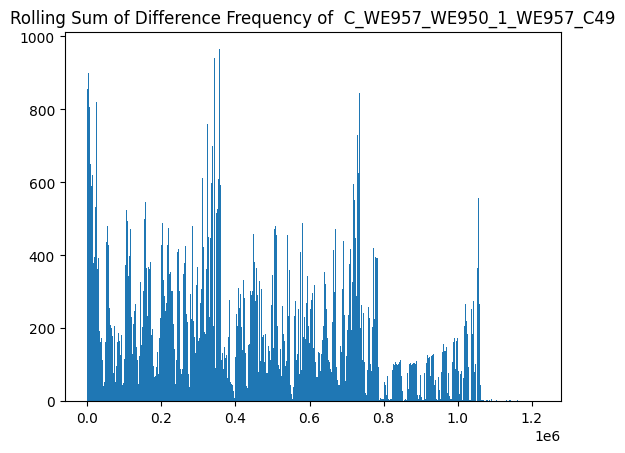

******************************************************************************


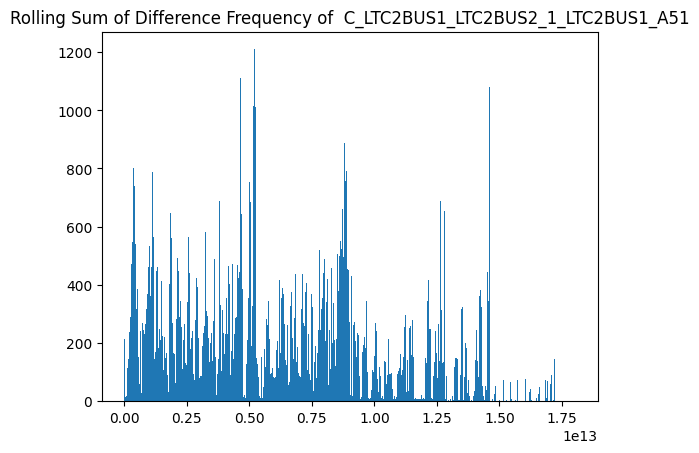

******************************************************************************


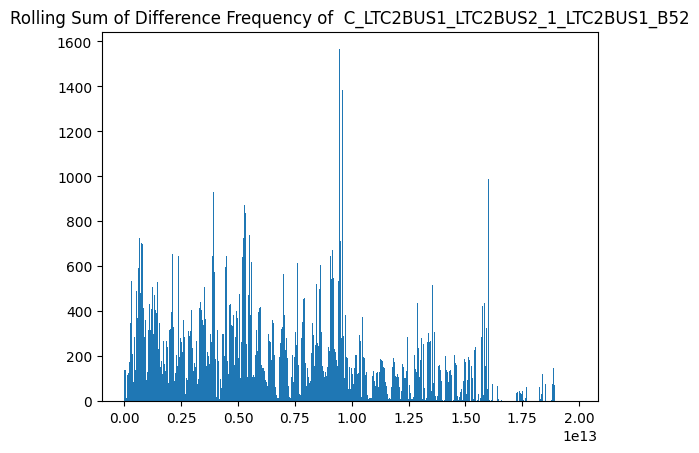

******************************************************************************


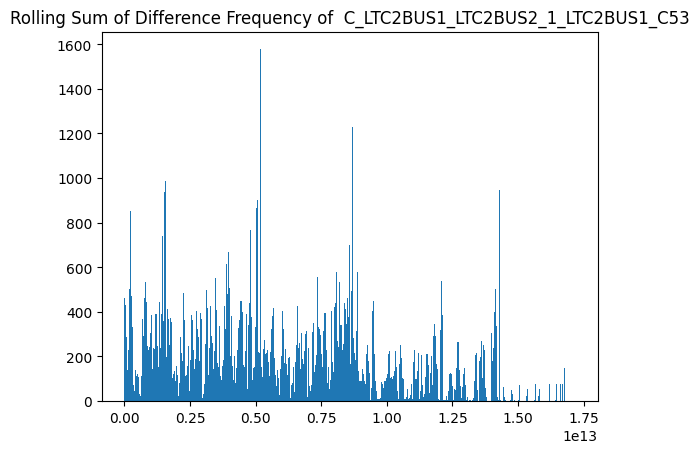

******************************************************************************


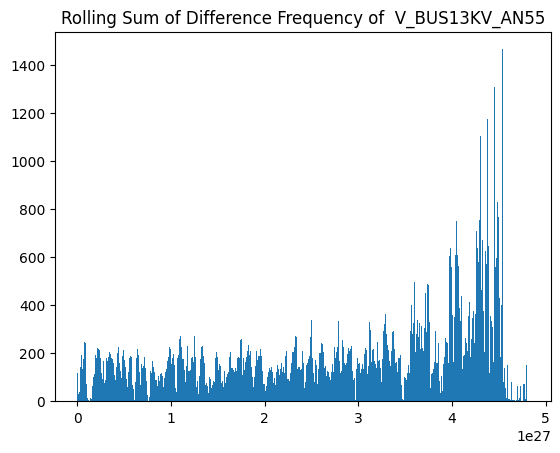

******************************************************************************


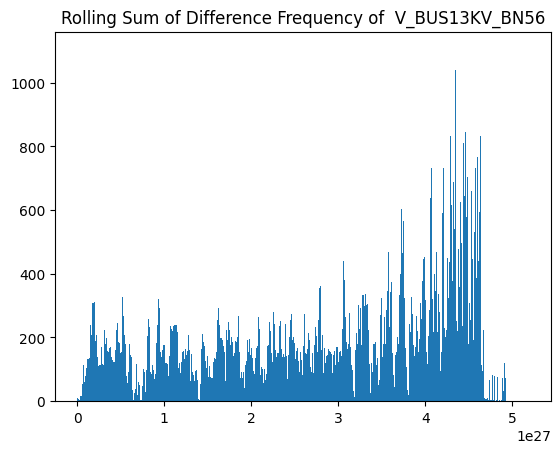

******************************************************************************


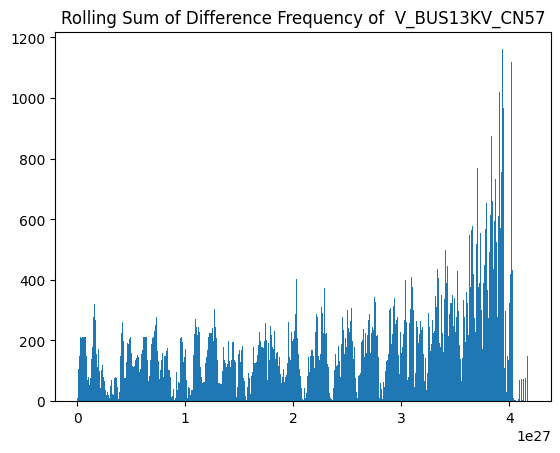

******************************************************************************


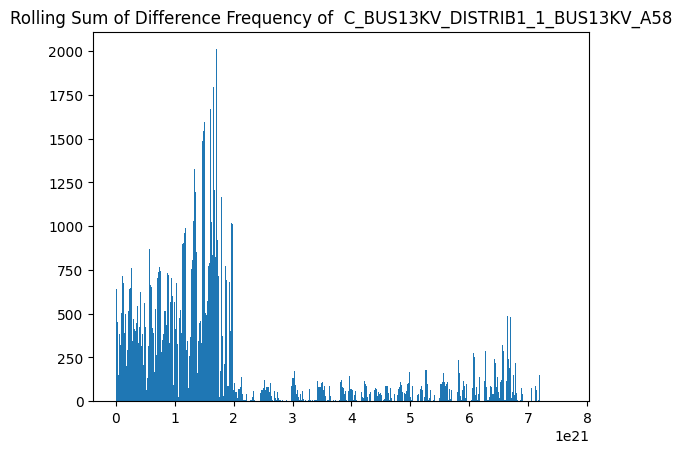

******************************************************************************


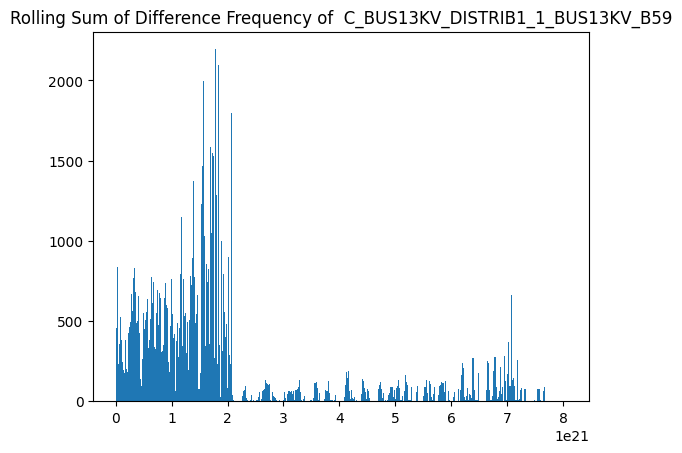

******************************************************************************


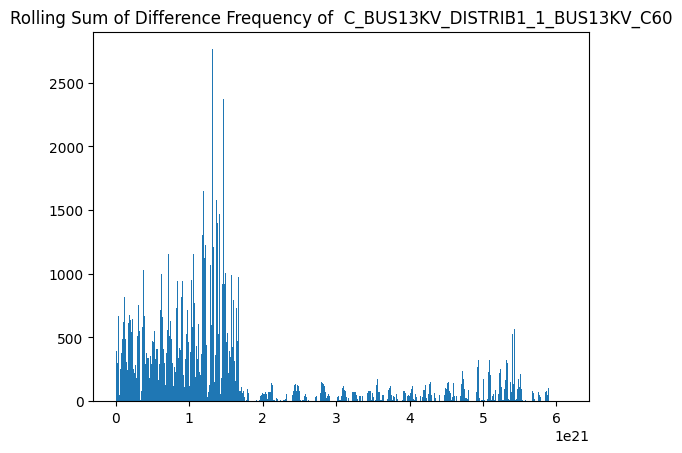

******************************************************************************


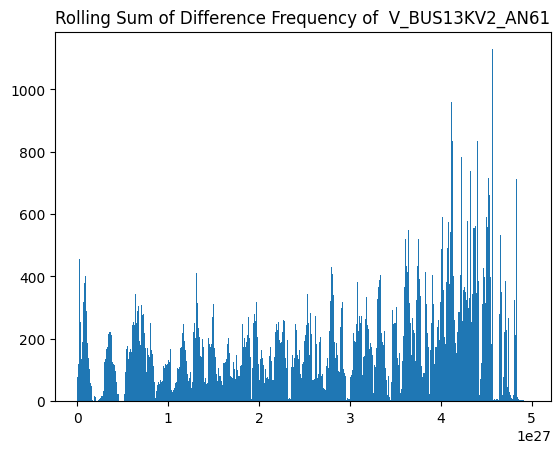

******************************************************************************


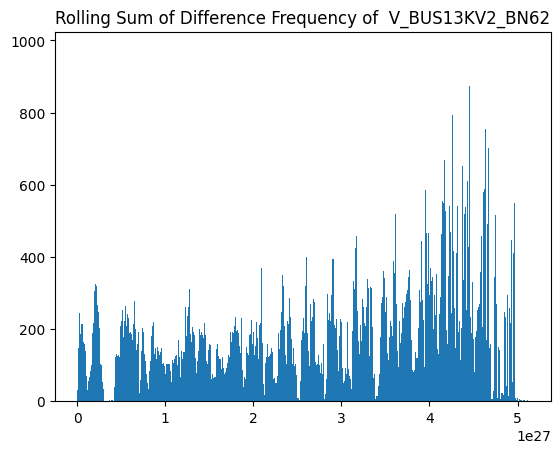

******************************************************************************


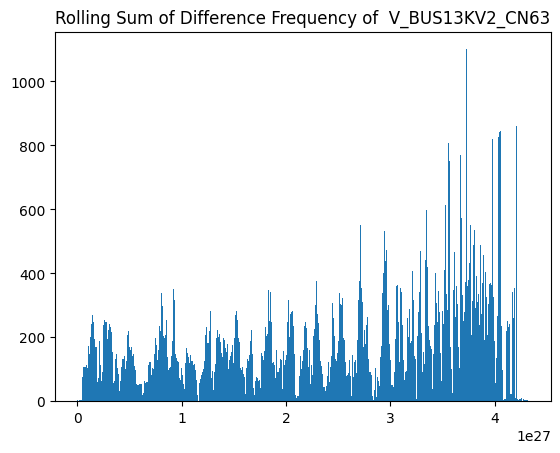

******************************************************************************


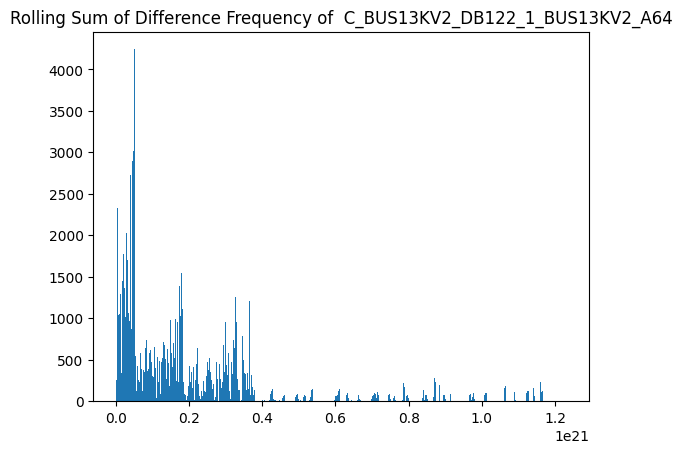

******************************************************************************


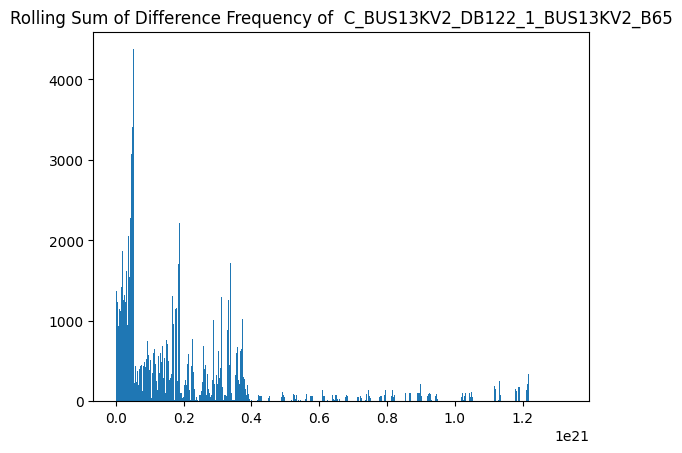

******************************************************************************


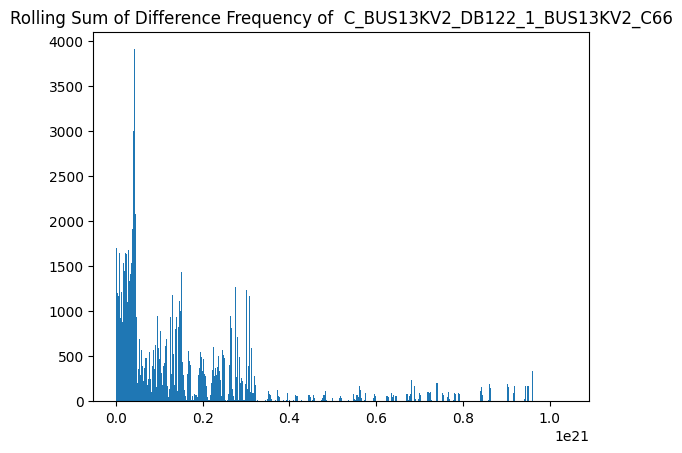

******************************************************************************


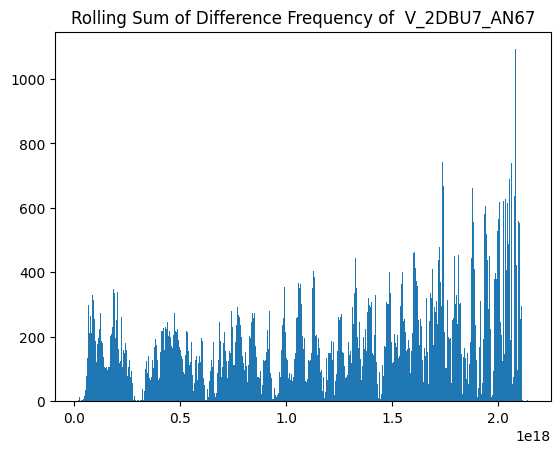

******************************************************************************


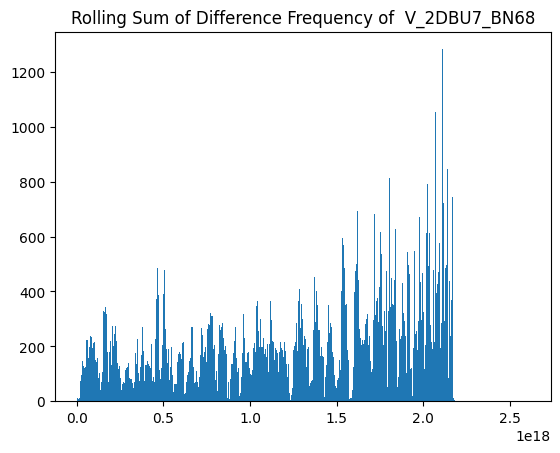

******************************************************************************


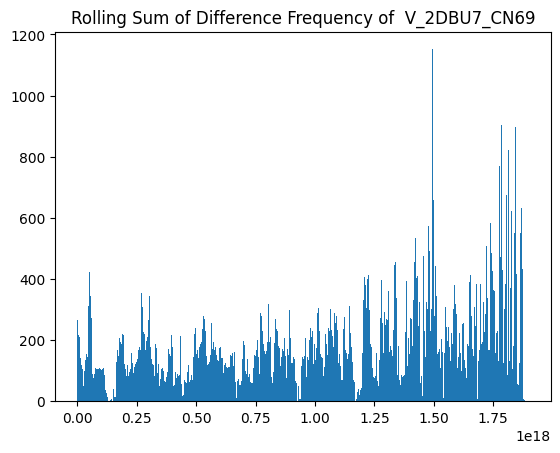

******************************************************************************


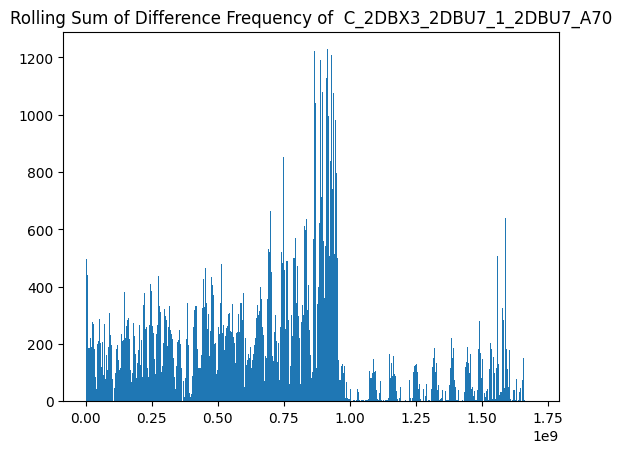

******************************************************************************


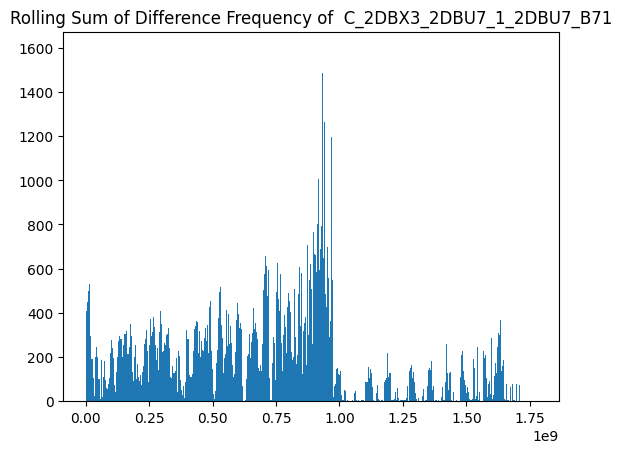

******************************************************************************


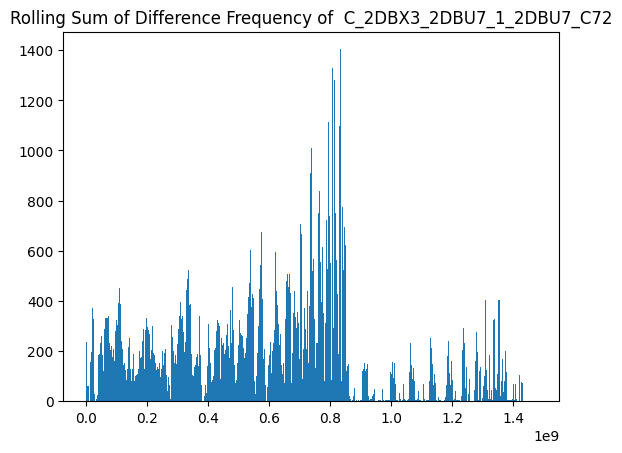

******************************************************************************


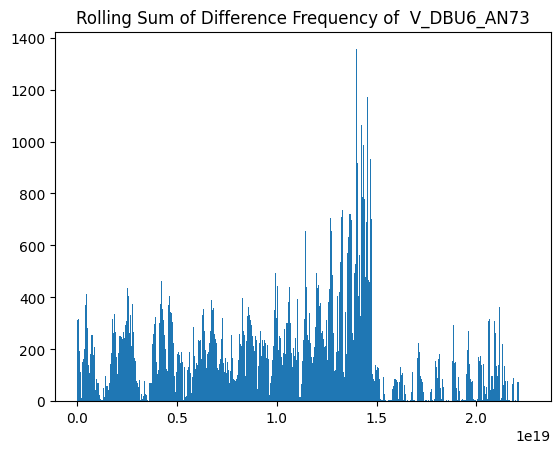

******************************************************************************


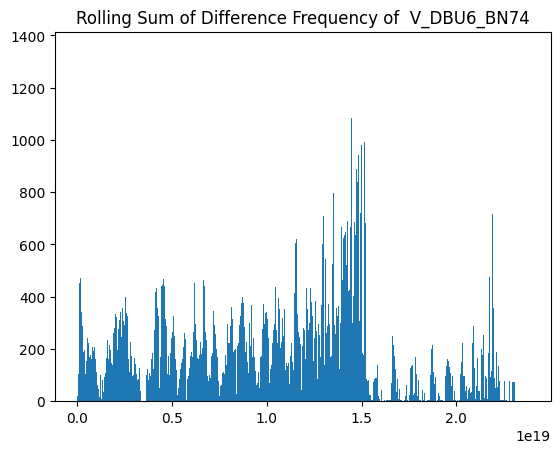

******************************************************************************


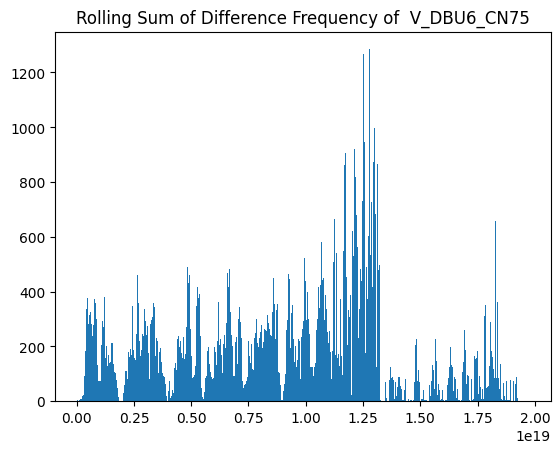

******************************************************************************


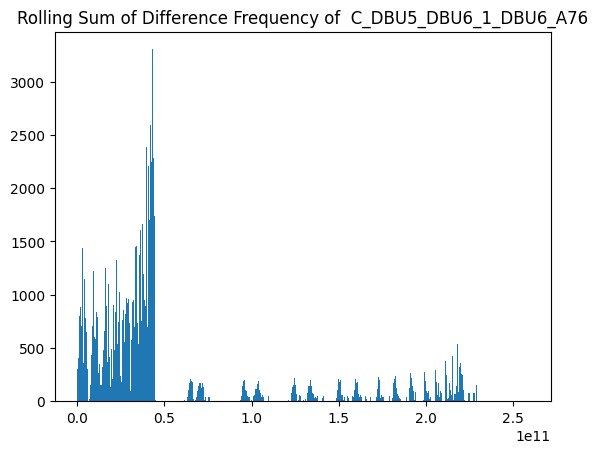

******************************************************************************


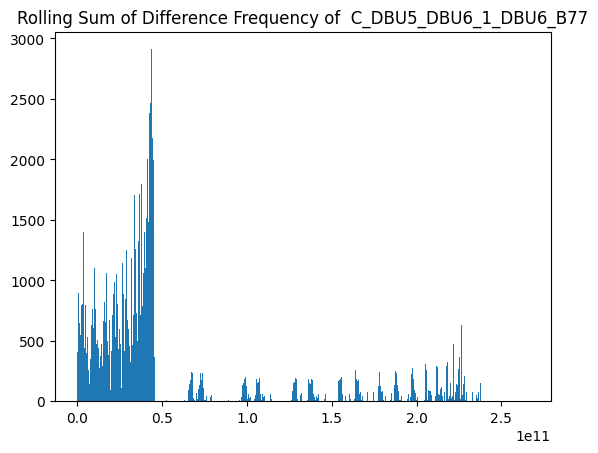

******************************************************************************


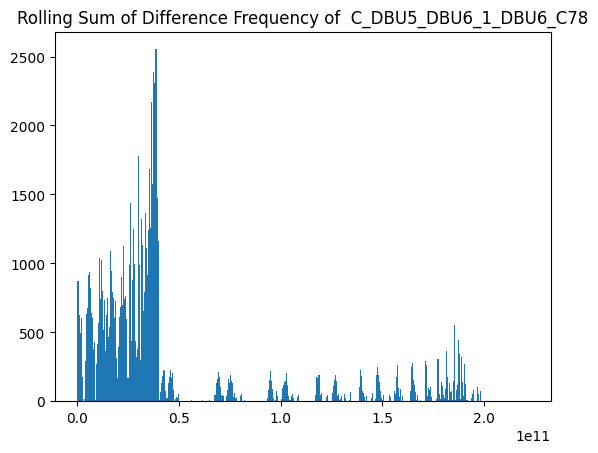

******************************************************************************


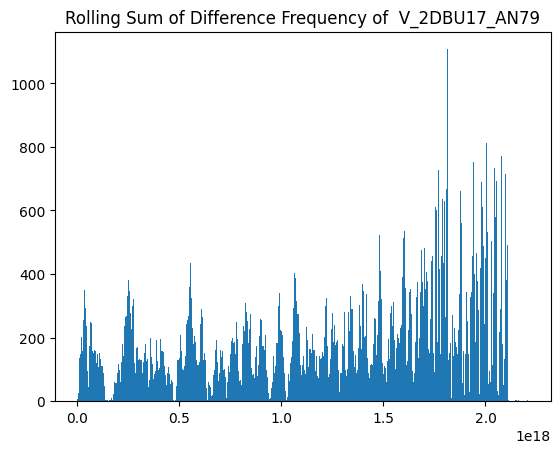

******************************************************************************


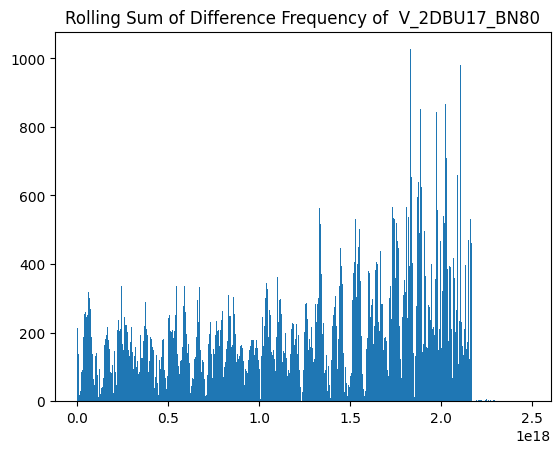

******************************************************************************


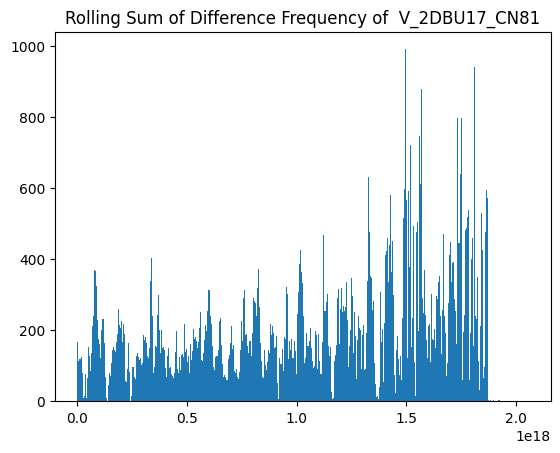

******************************************************************************


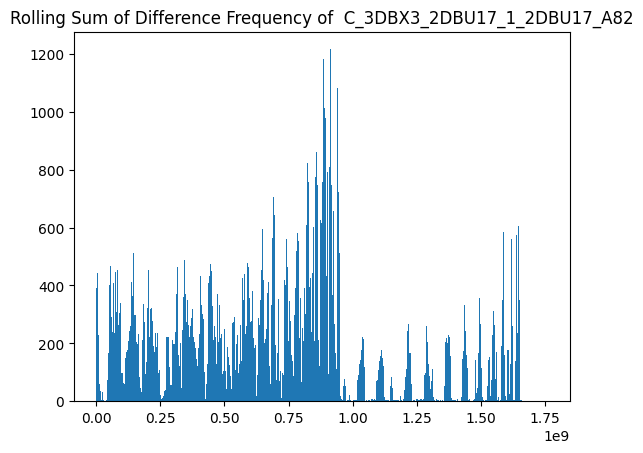

******************************************************************************


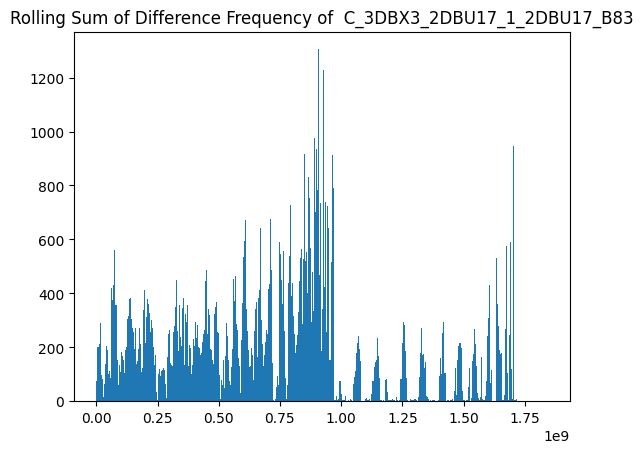

******************************************************************************


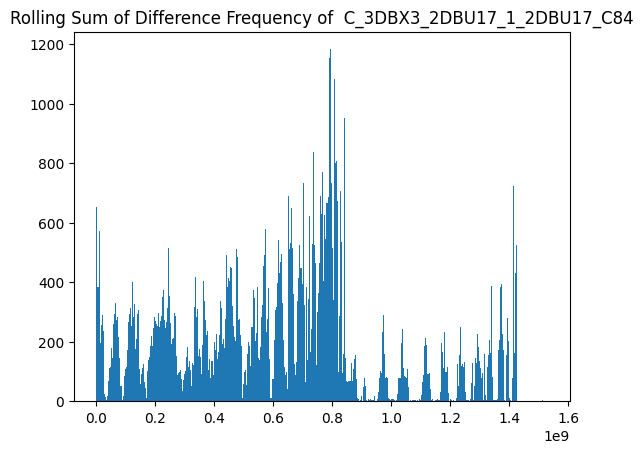

******************************************************************************


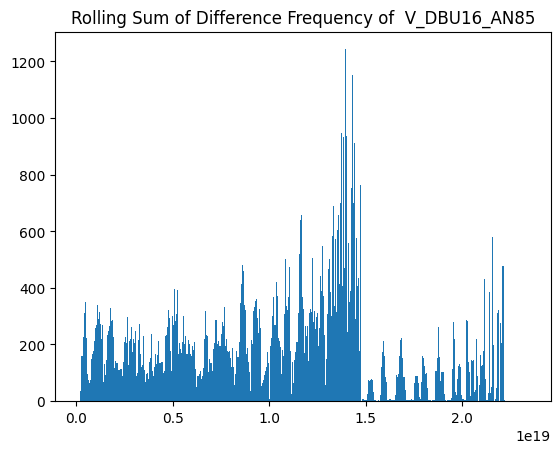

******************************************************************************


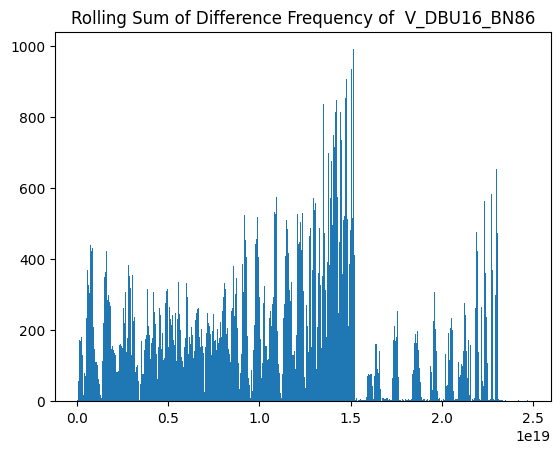

******************************************************************************


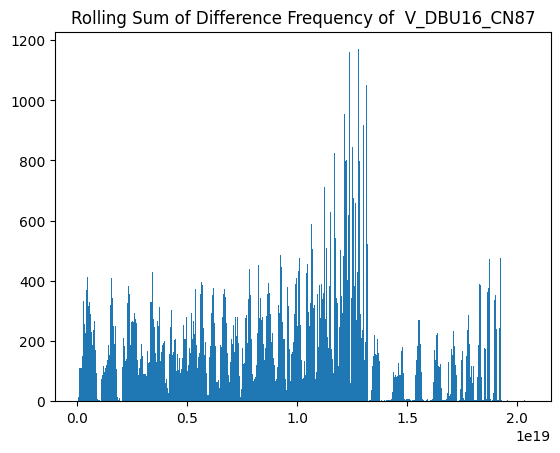

******************************************************************************


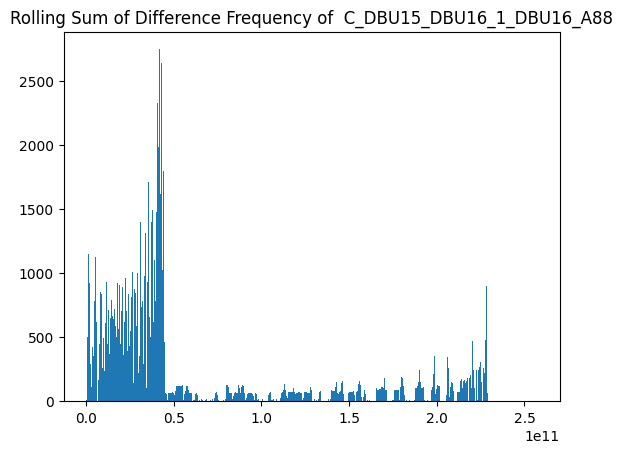

******************************************************************************


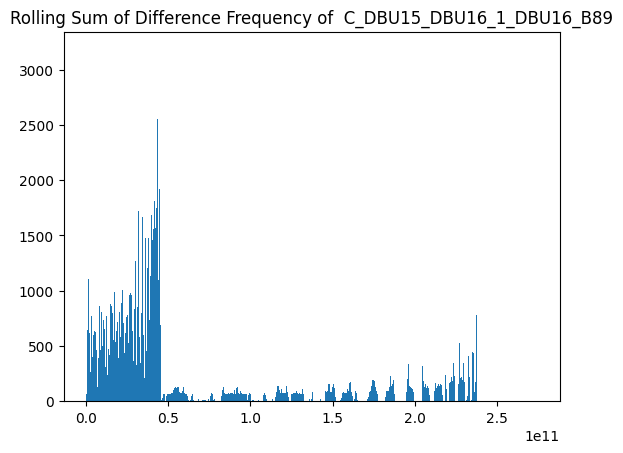

******************************************************************************


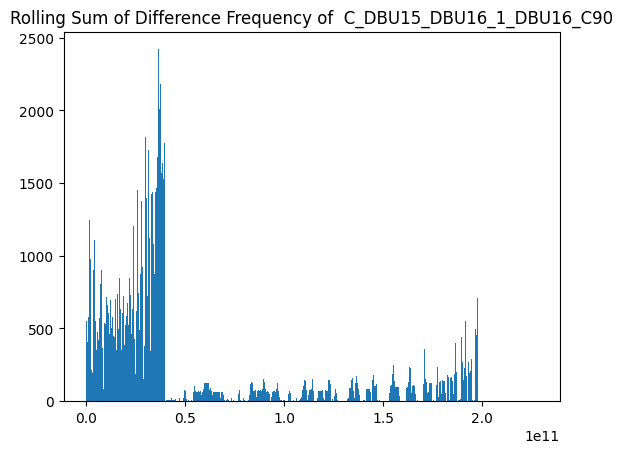

******************************************************************************


In [153]:
# do analysis for multi plot
thresholds_cov = []
# thresholds2c = []
cols = data.columns

cov_multi_list = []

# correlation window
window = 350

# rolling sum window
w = 1

quant = 1

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    cov_multi = covariance_multi(data, var1_index, var2_indices, window)
    thresholds_cov.append(
        get_empirical_diff_threshold(stat=cov_multi, window=w, fn=roll_sum, axis=-1, quantile=quant,
                                     sensor_names=[var1_index]))
    cov_multi_list.append(cov_multi)

    print("******************************************************************************")


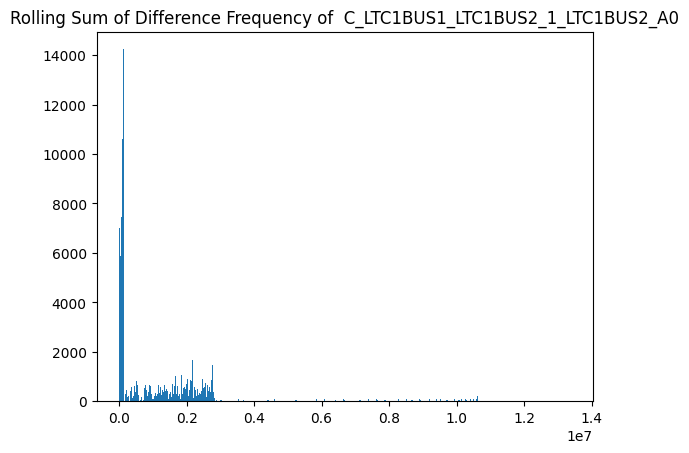

******************************************************************************


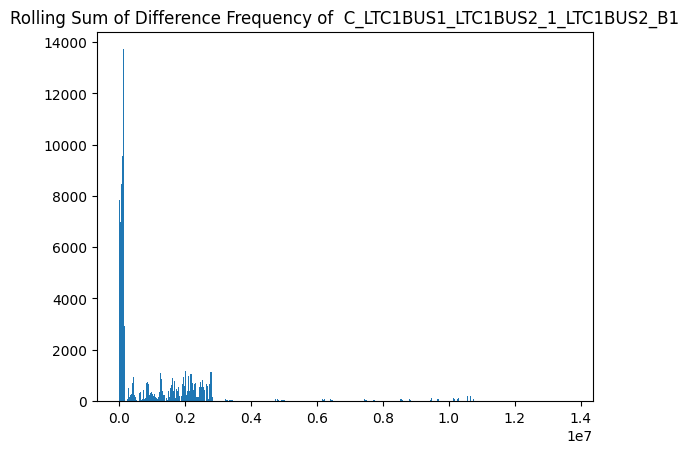

******************************************************************************


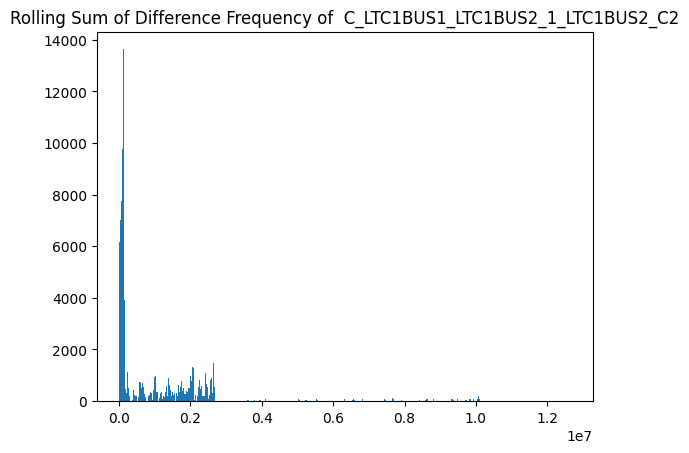

******************************************************************************


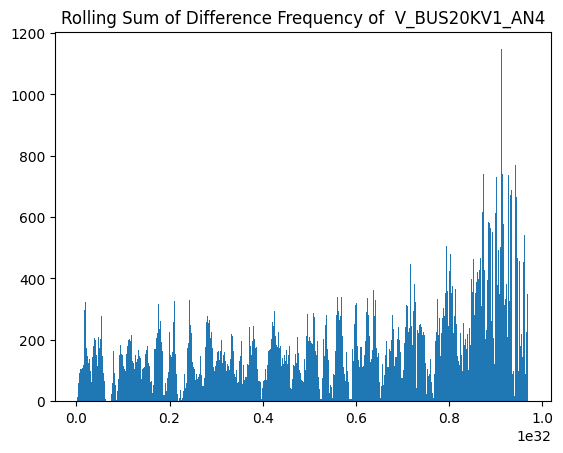

******************************************************************************


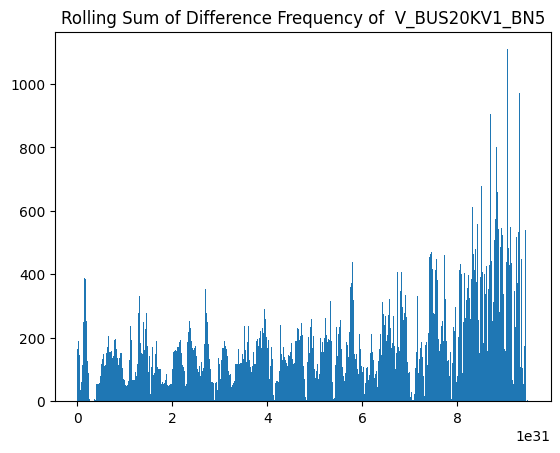

******************************************************************************


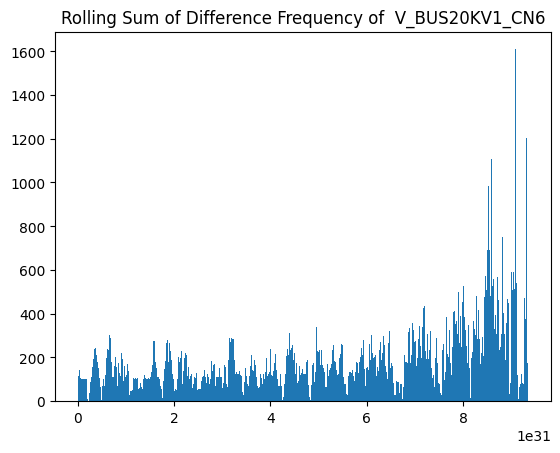

******************************************************************************


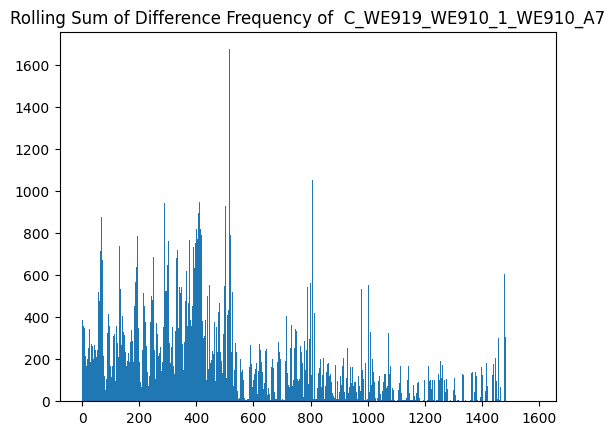

******************************************************************************


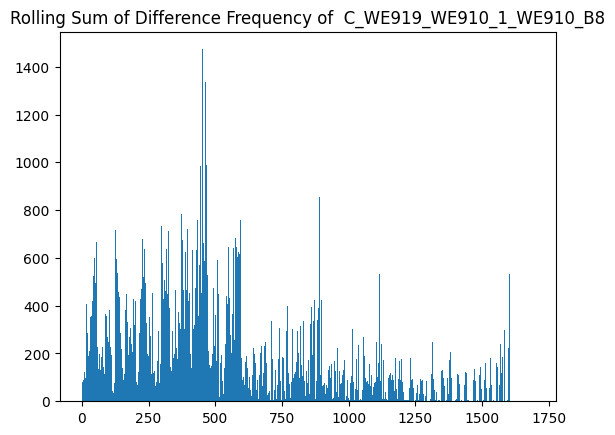

******************************************************************************


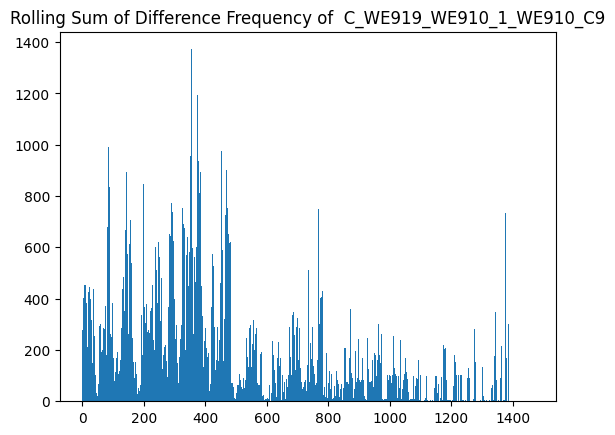

******************************************************************************


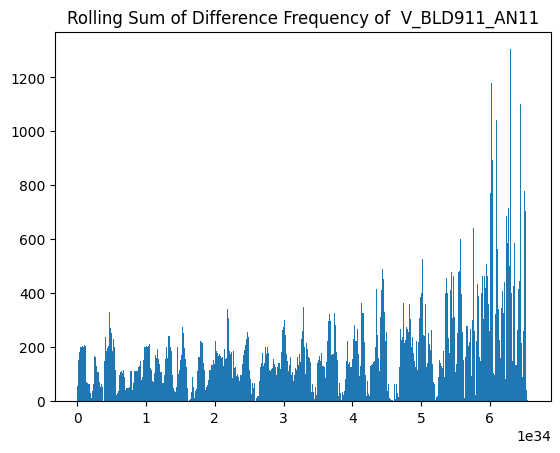

******************************************************************************


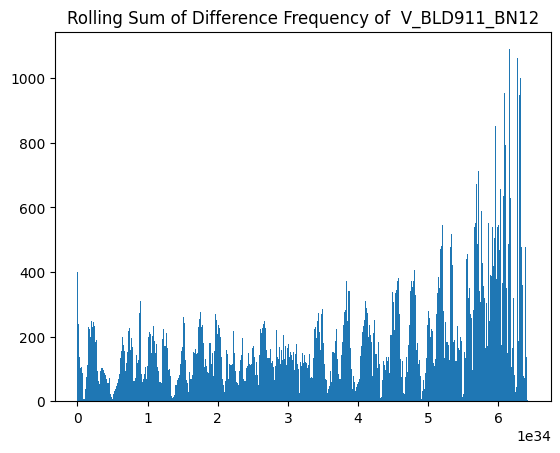

******************************************************************************


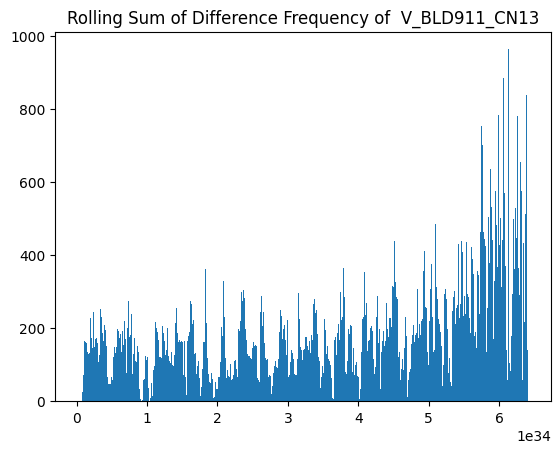

******************************************************************************


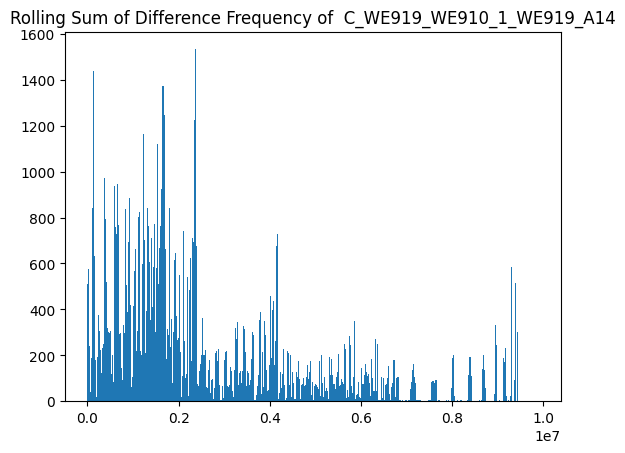

******************************************************************************


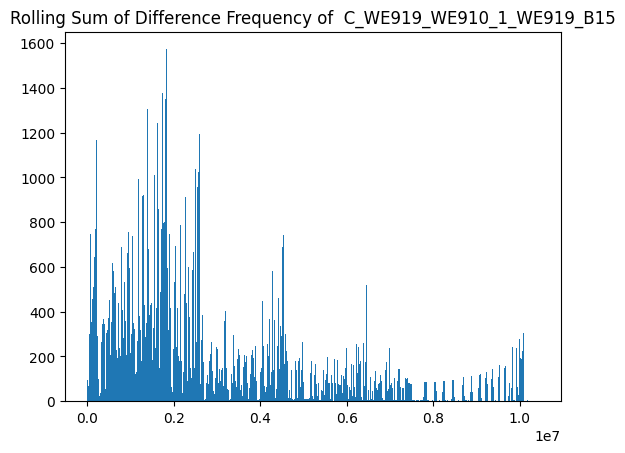

******************************************************************************


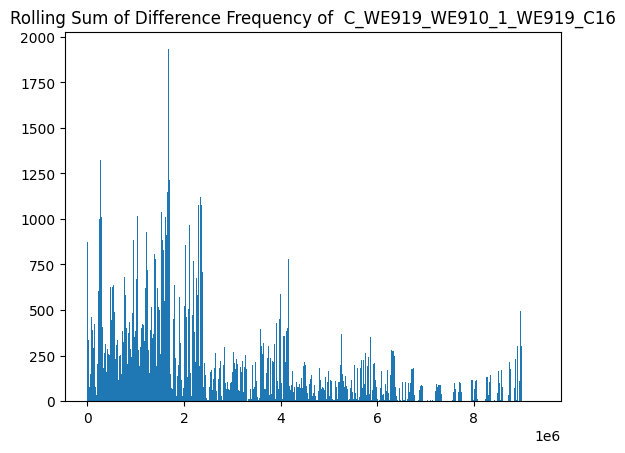

******************************************************************************


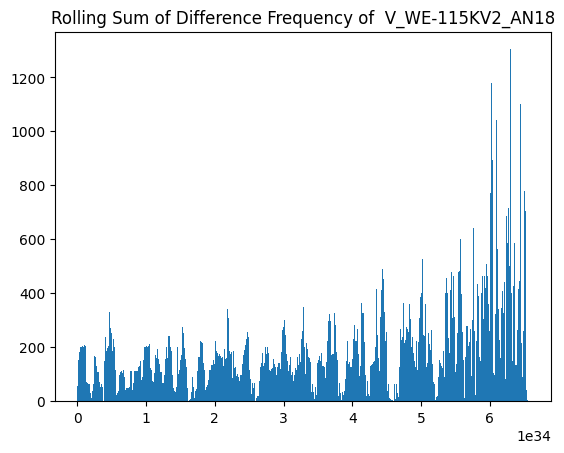

******************************************************************************


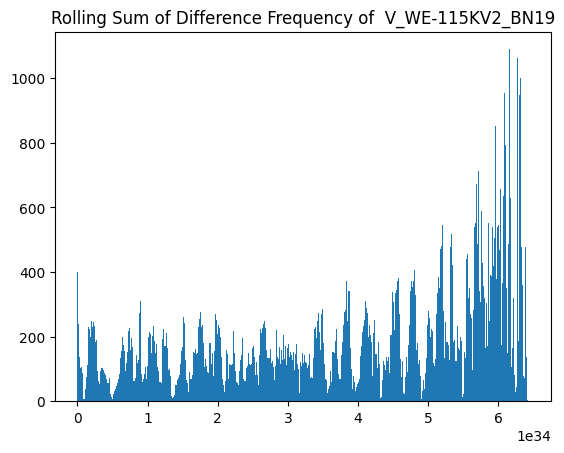

******************************************************************************


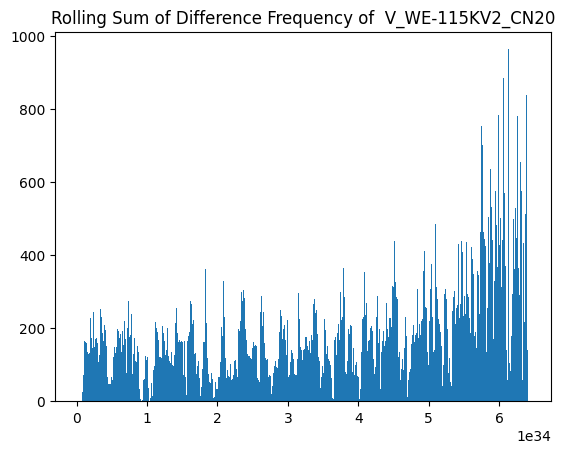

******************************************************************************


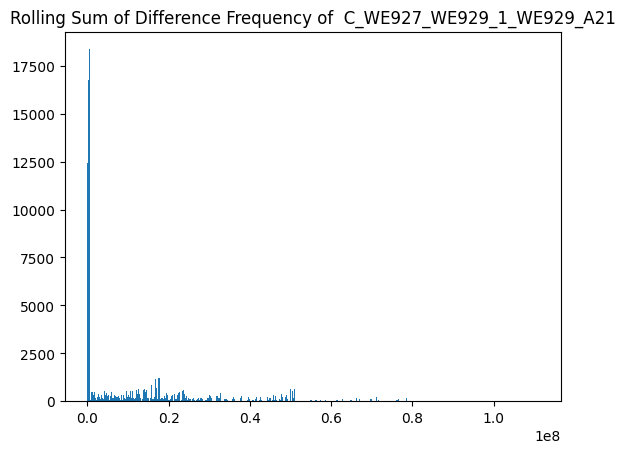

******************************************************************************


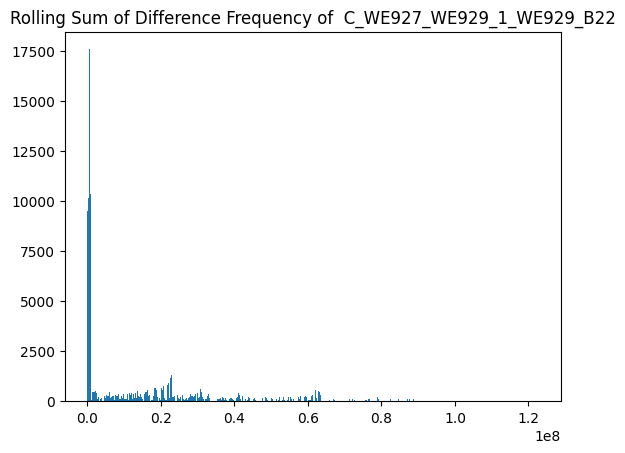

******************************************************************************


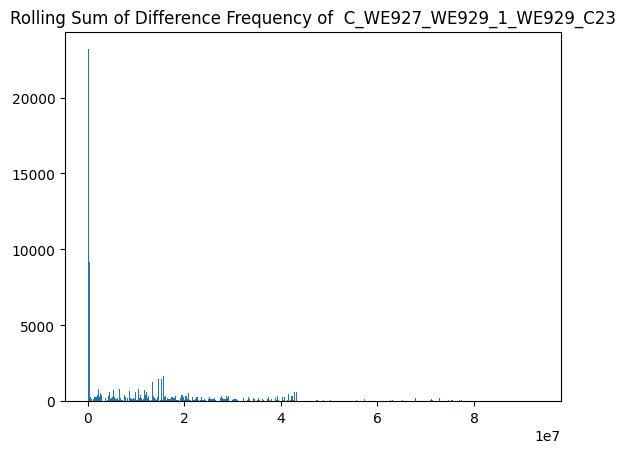

******************************************************************************


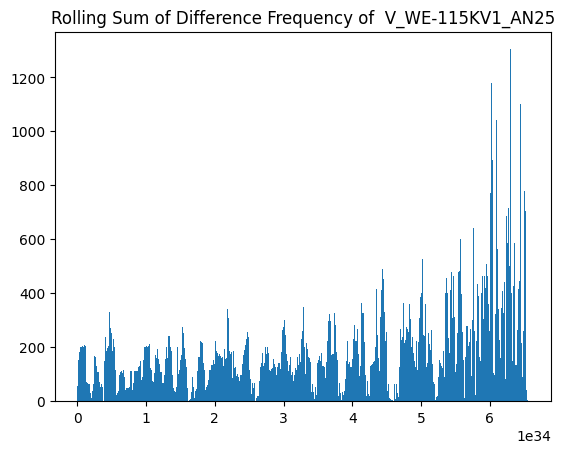

******************************************************************************


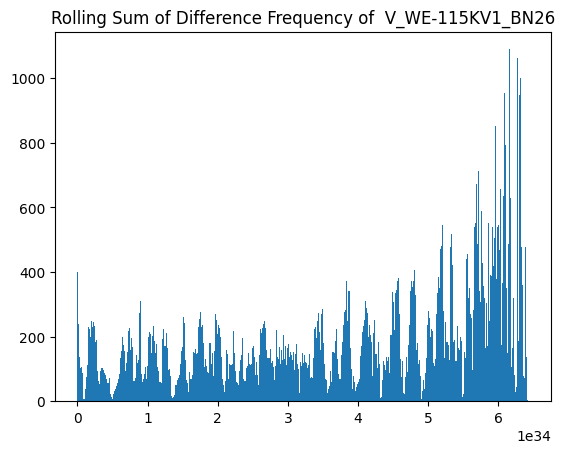

******************************************************************************


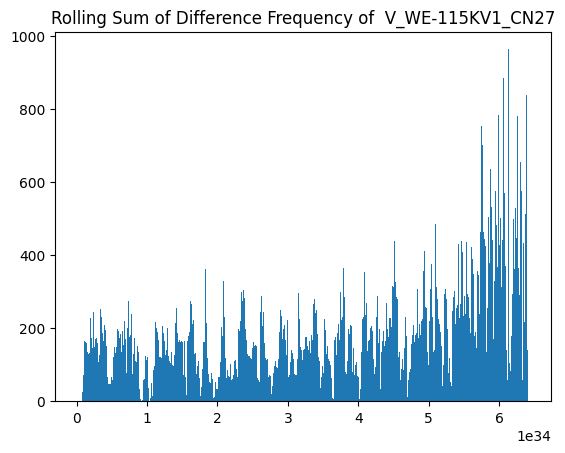

******************************************************************************


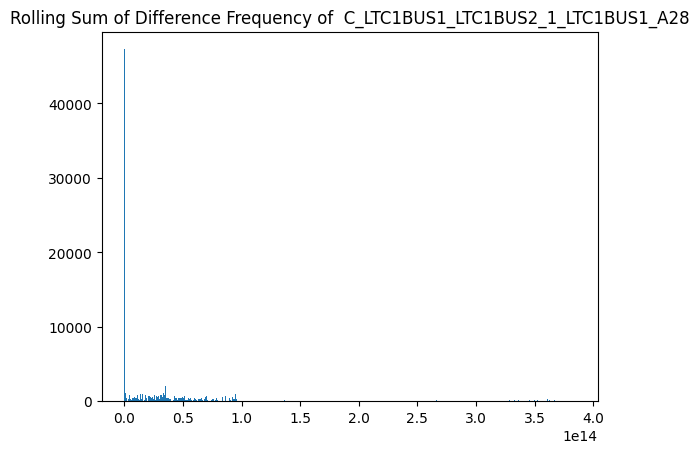

******************************************************************************


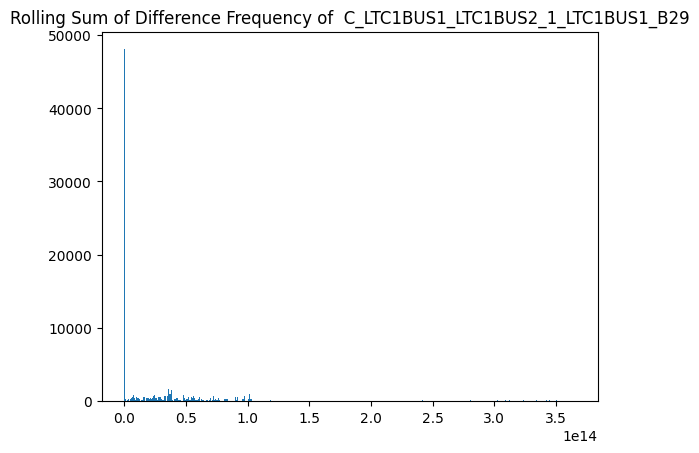

******************************************************************************


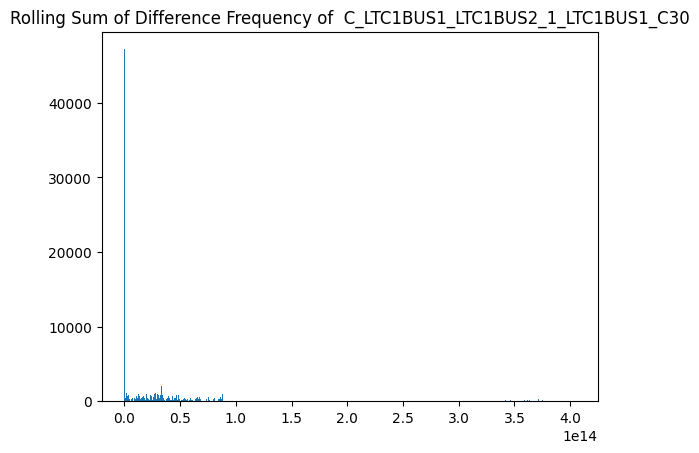

******************************************************************************


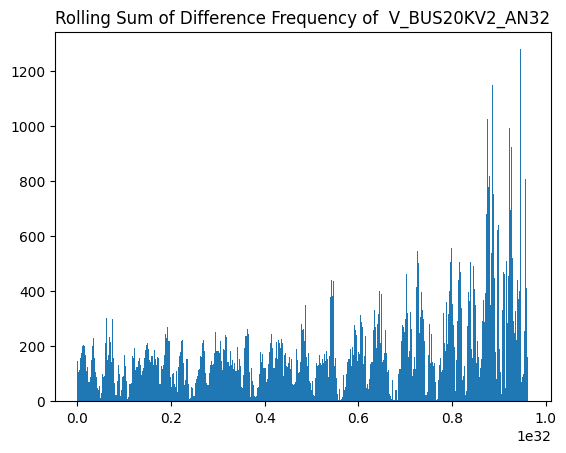

******************************************************************************


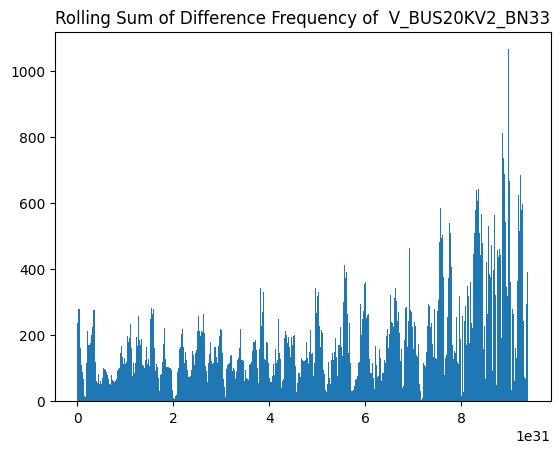

******************************************************************************


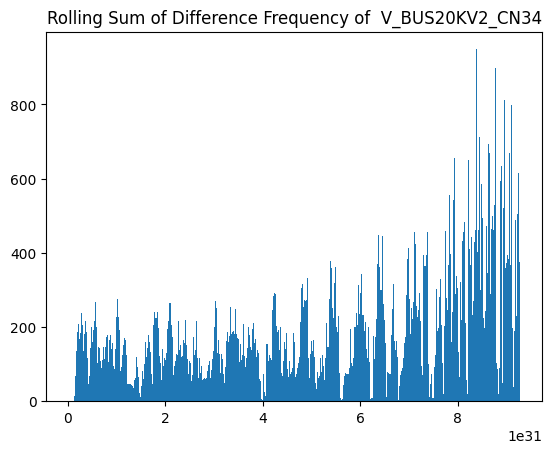

******************************************************************************


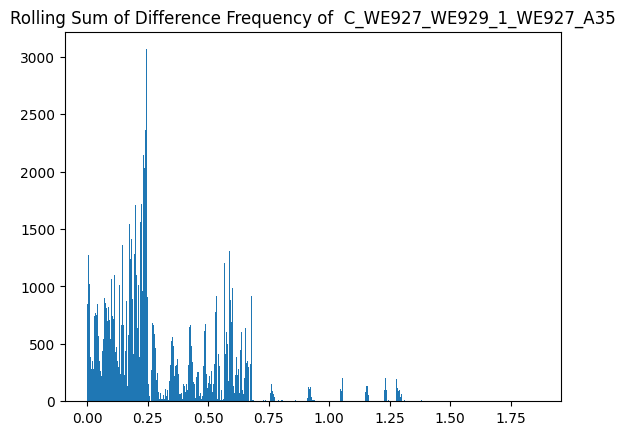

******************************************************************************


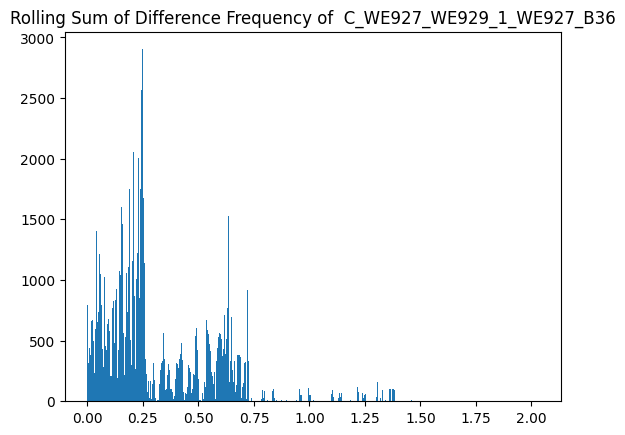

******************************************************************************


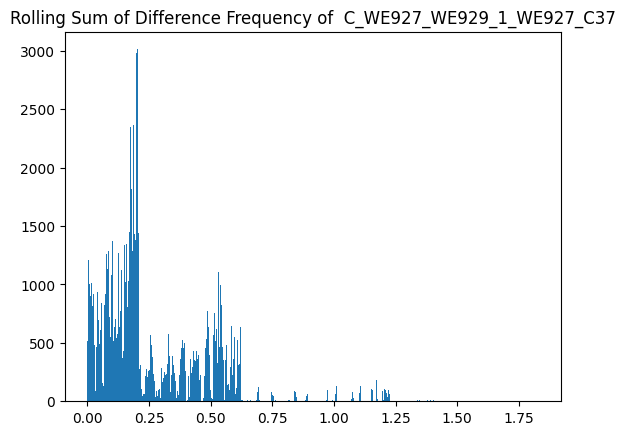

******************************************************************************


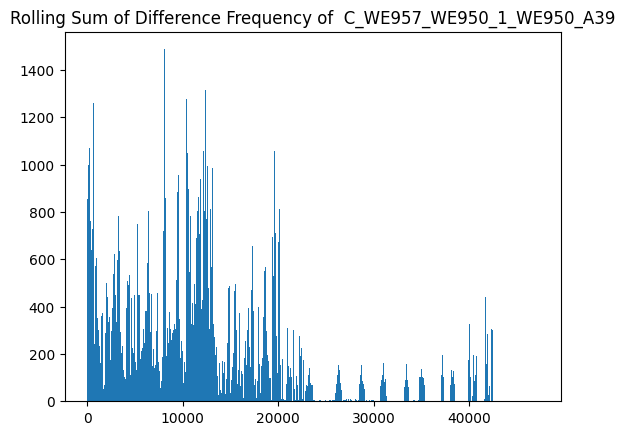

******************************************************************************


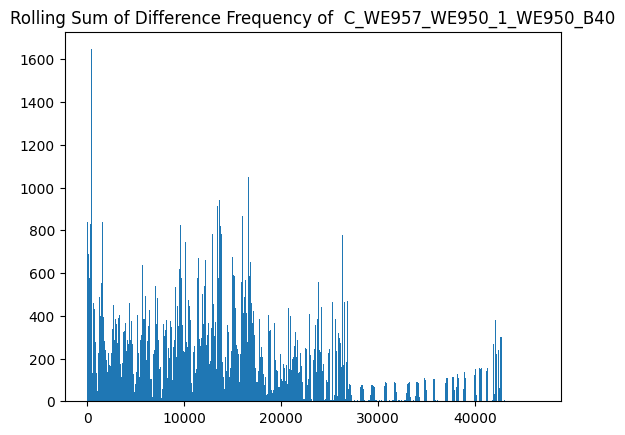

******************************************************************************


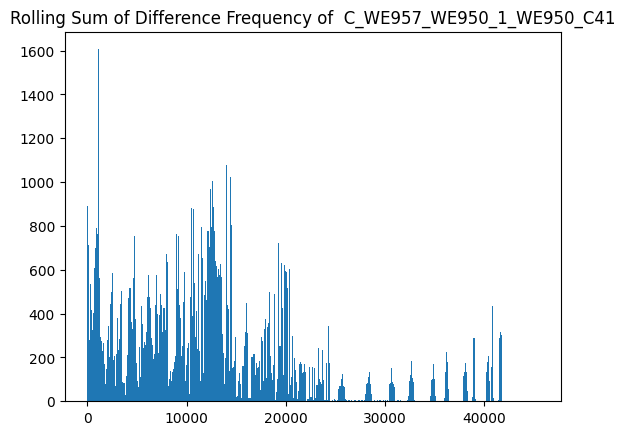

******************************************************************************


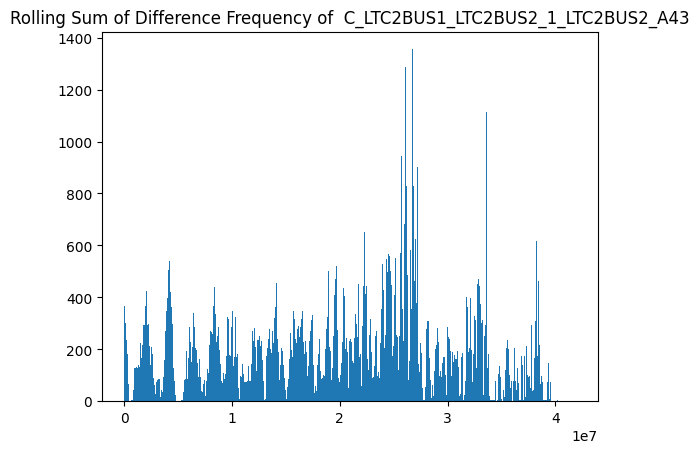

******************************************************************************


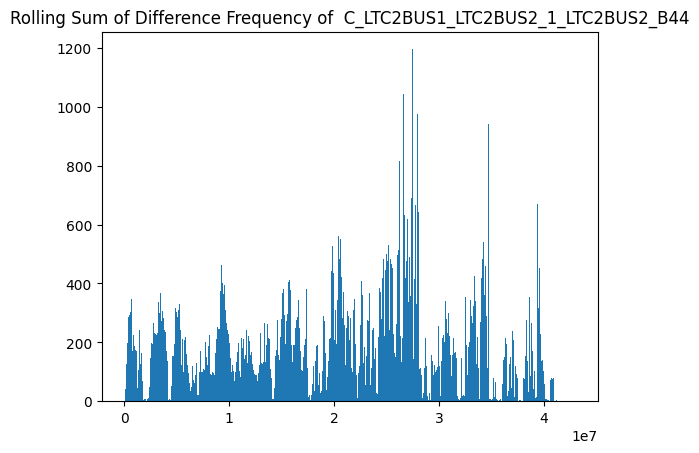

******************************************************************************


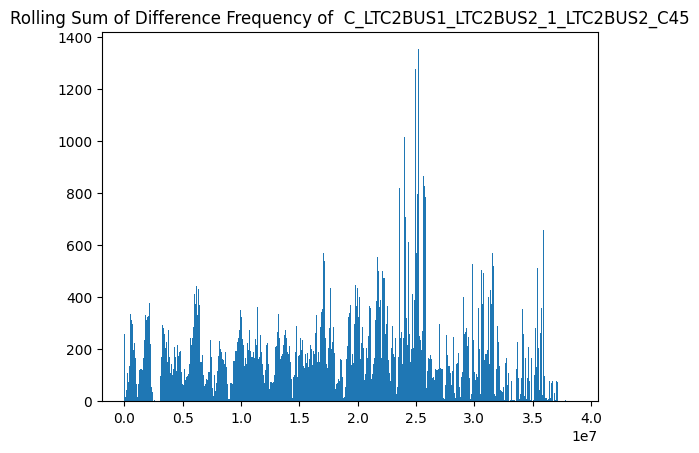

******************************************************************************


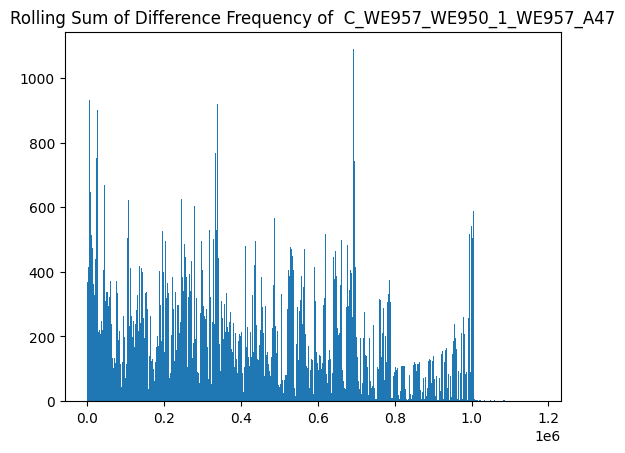

******************************************************************************


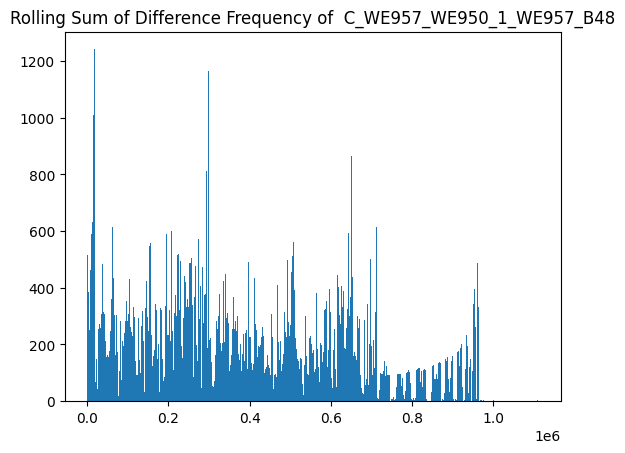

******************************************************************************


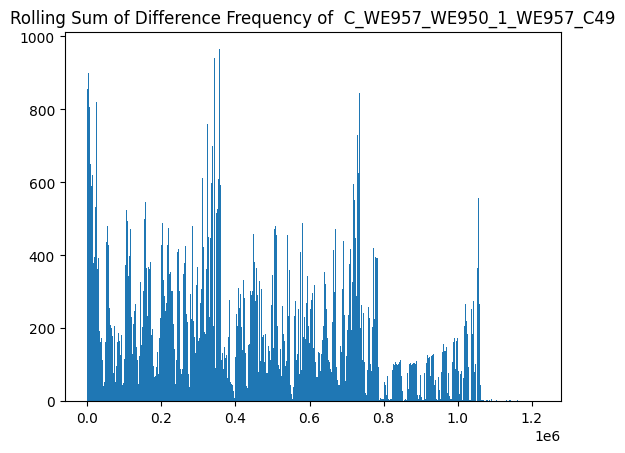

******************************************************************************


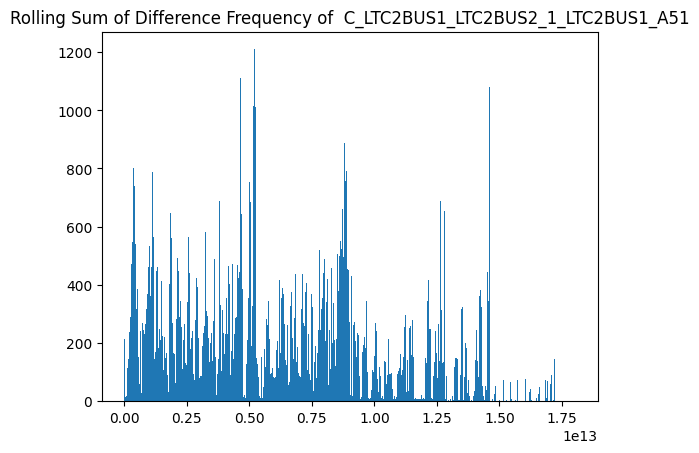

******************************************************************************


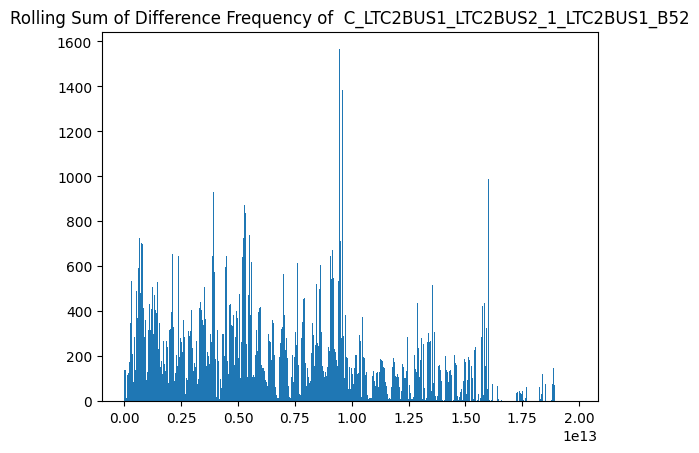

******************************************************************************


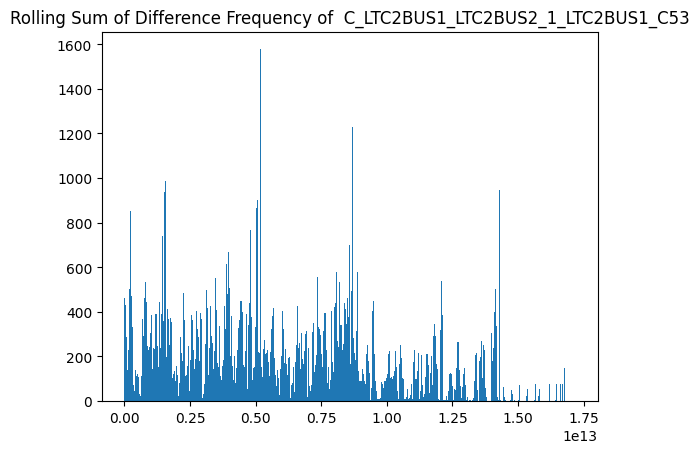

******************************************************************************


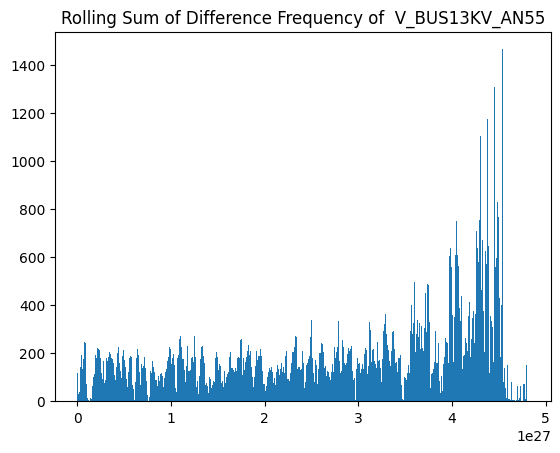

******************************************************************************


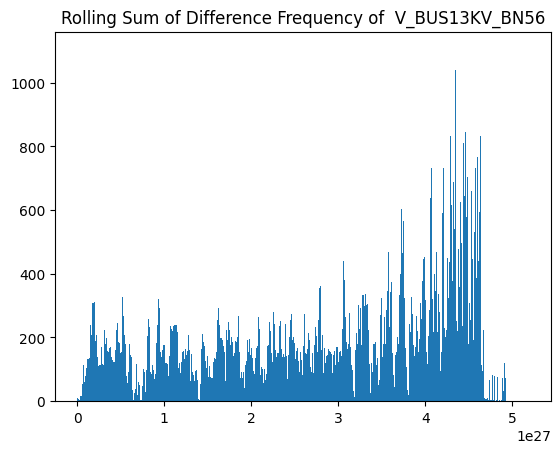

******************************************************************************


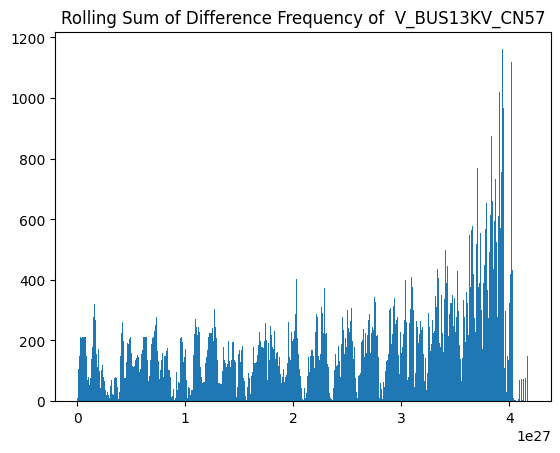

******************************************************************************


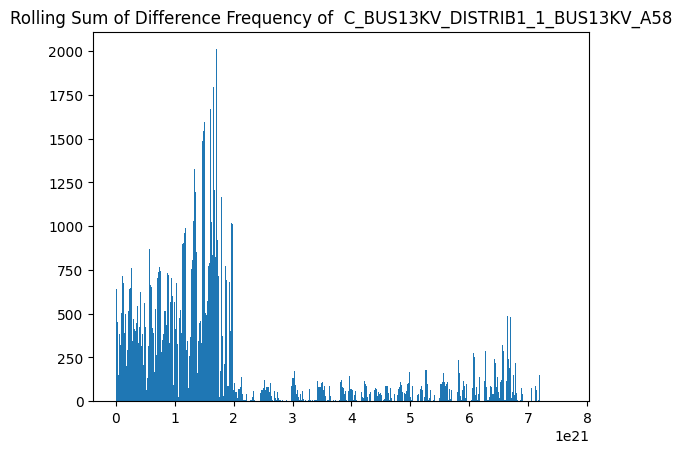

******************************************************************************


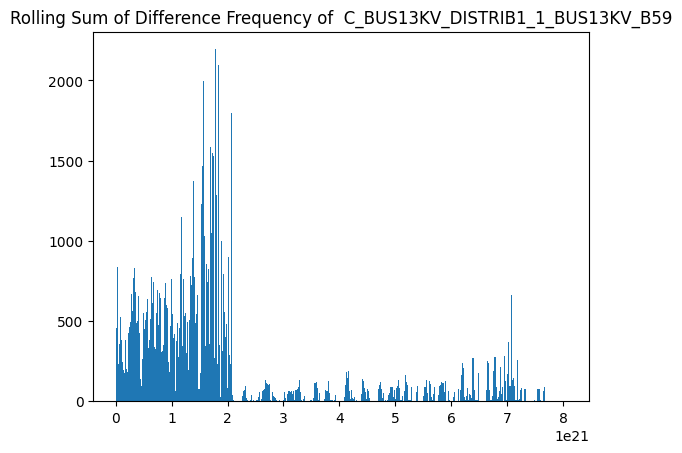

******************************************************************************


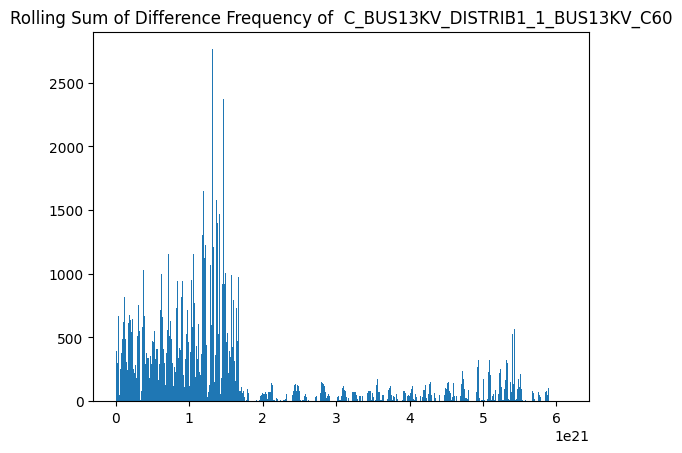

******************************************************************************


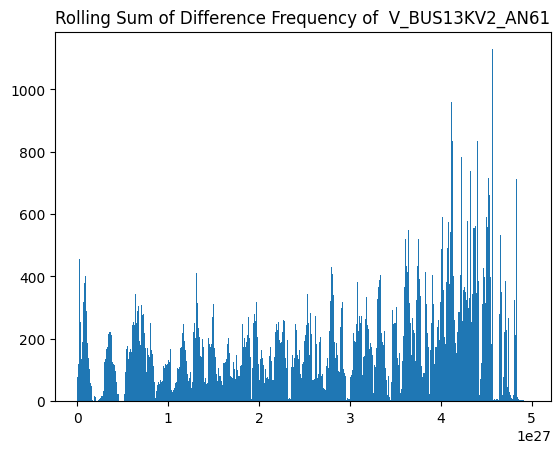

******************************************************************************


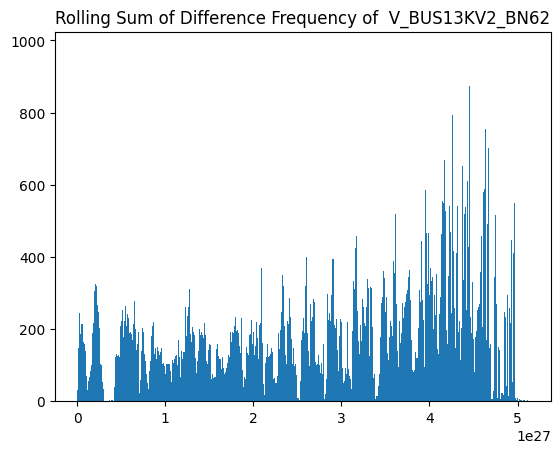

******************************************************************************


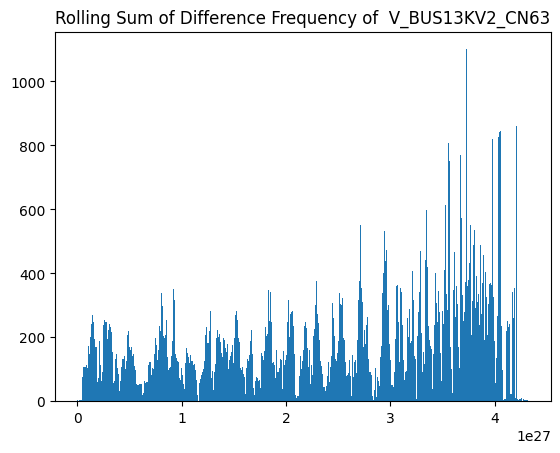

******************************************************************************


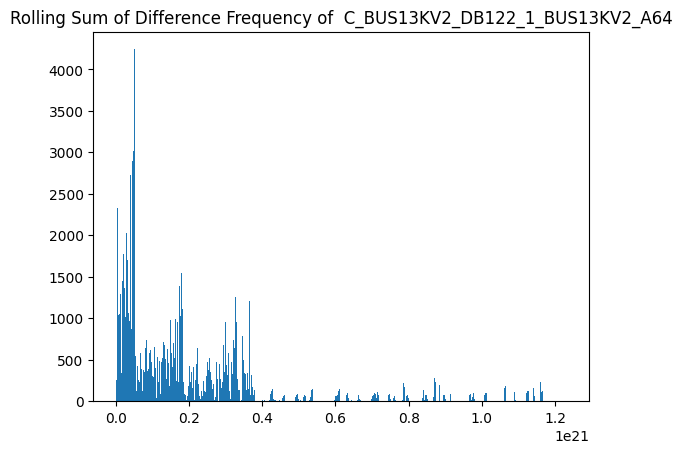

******************************************************************************


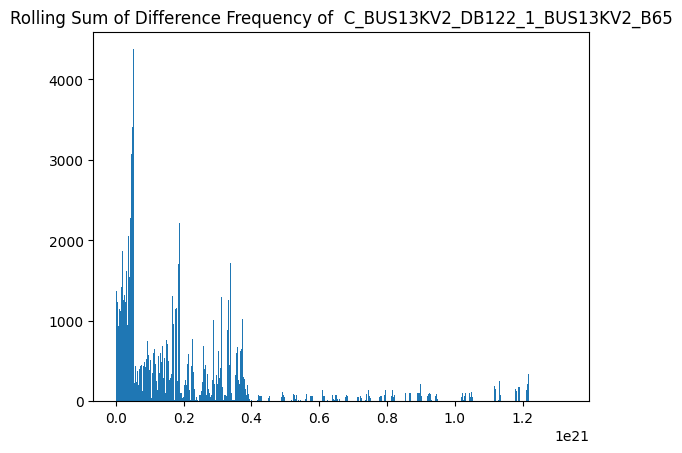

******************************************************************************


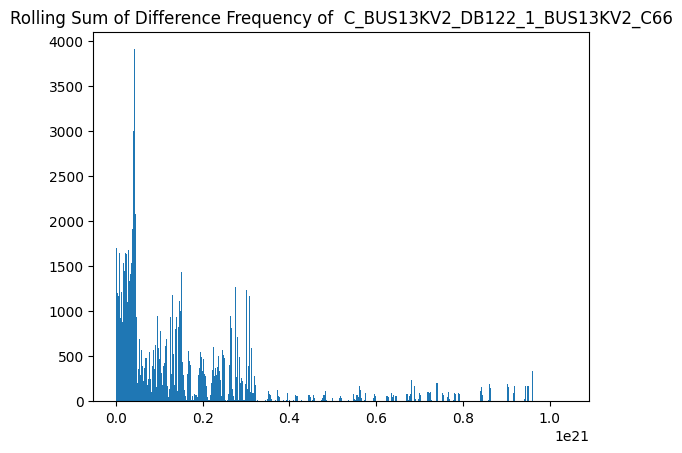

******************************************************************************


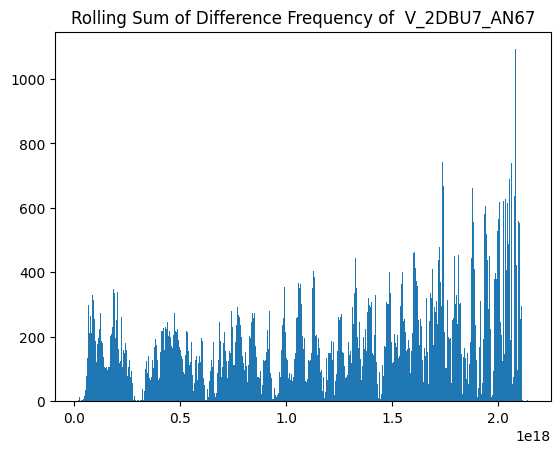

******************************************************************************


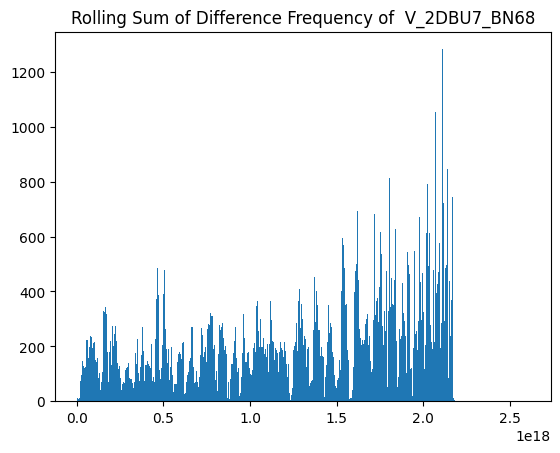

******************************************************************************


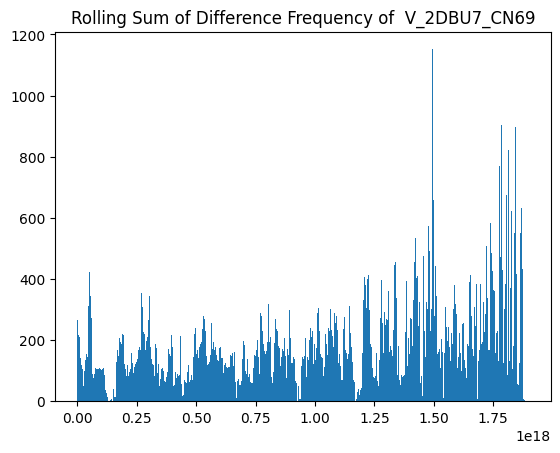

******************************************************************************


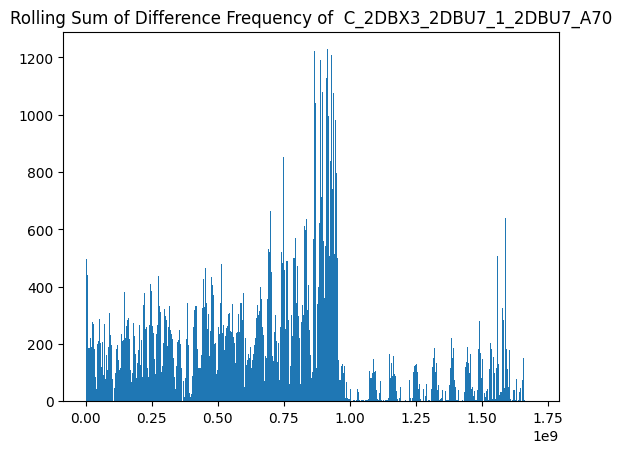

******************************************************************************


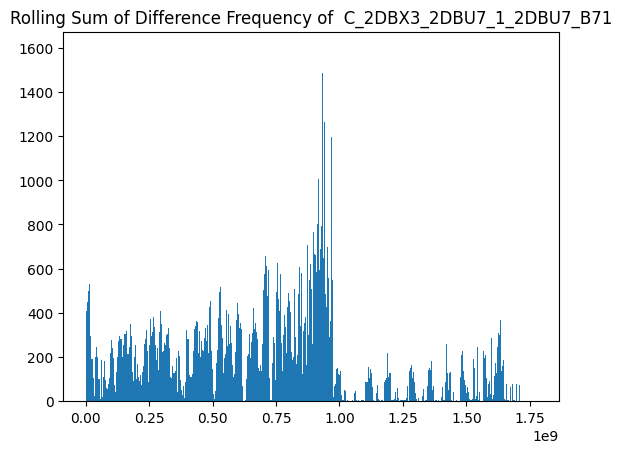

******************************************************************************


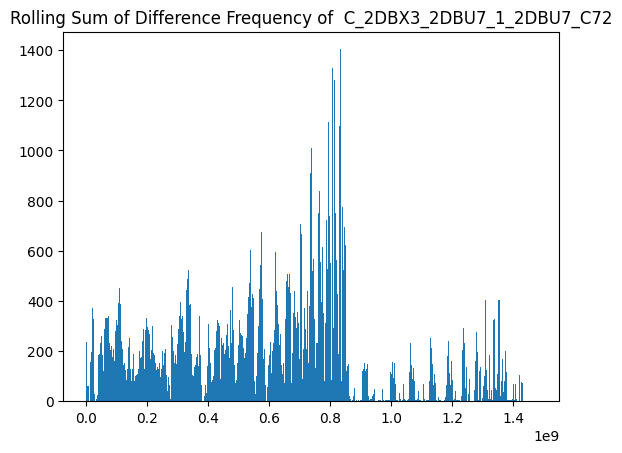

******************************************************************************


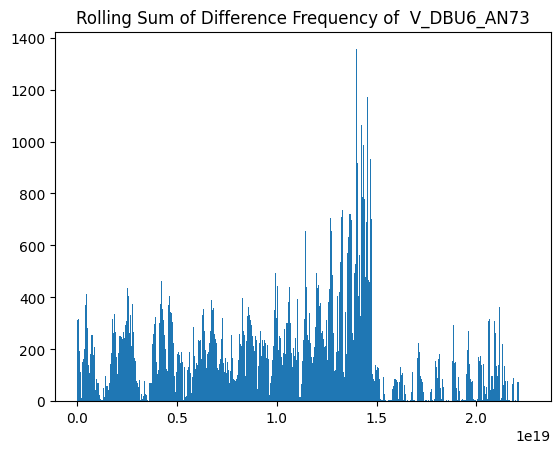

******************************************************************************


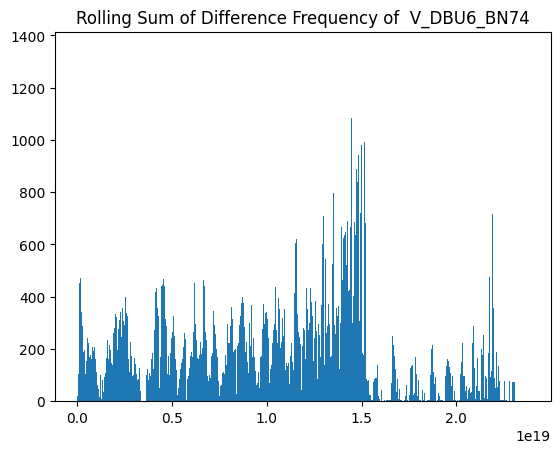

******************************************************************************


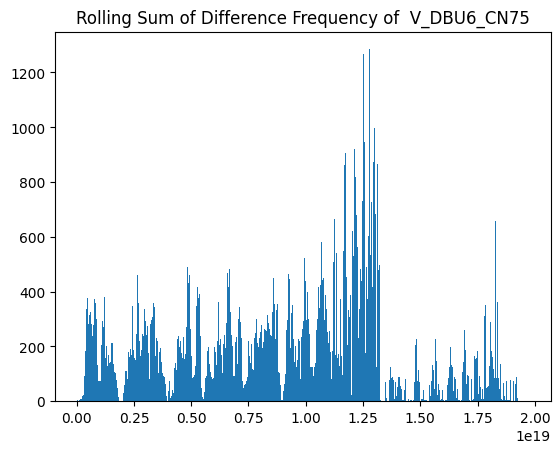

******************************************************************************


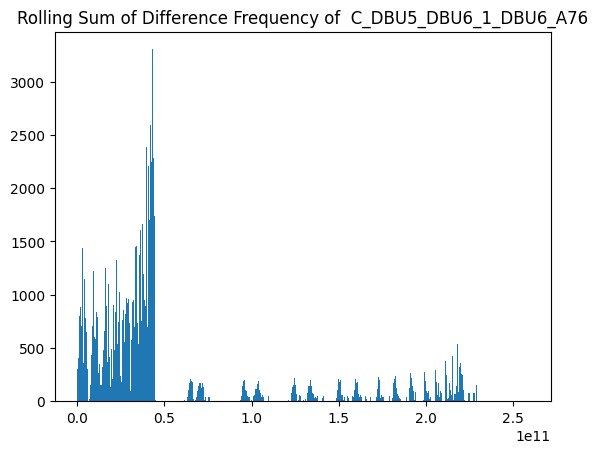

******************************************************************************


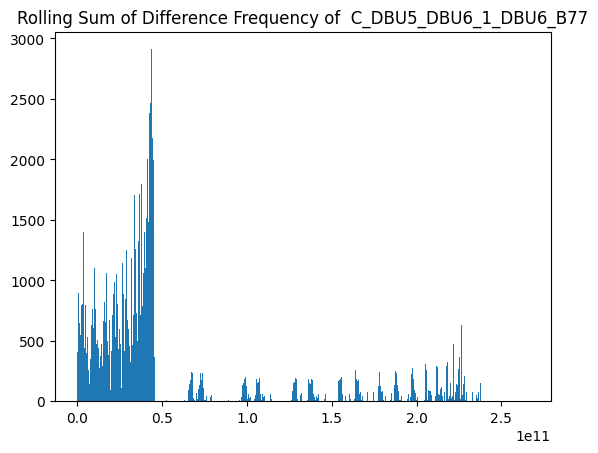

******************************************************************************


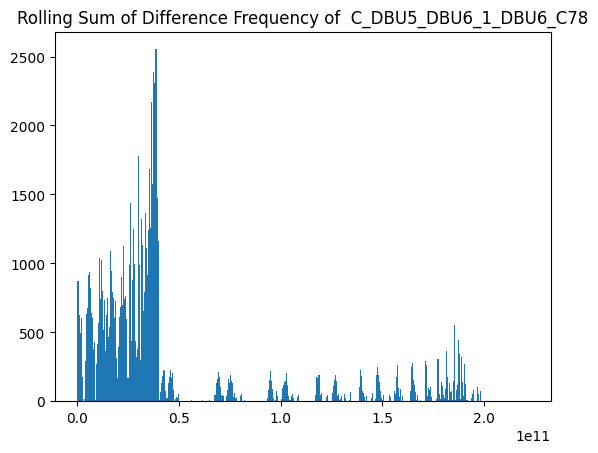

******************************************************************************


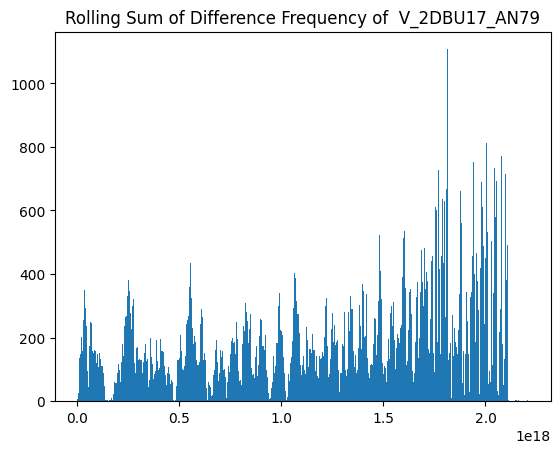

******************************************************************************


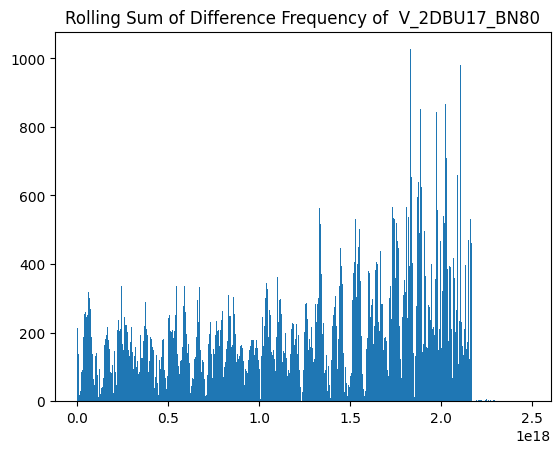

******************************************************************************


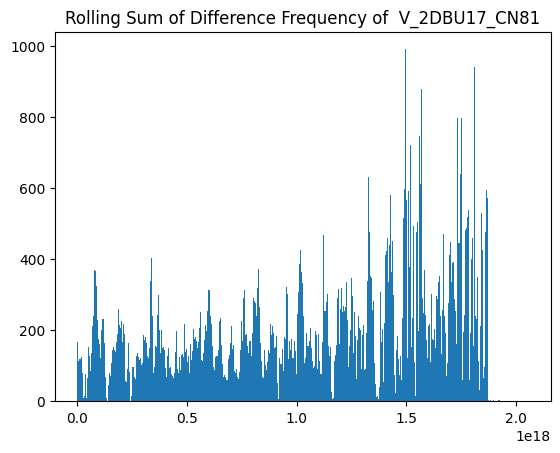

******************************************************************************


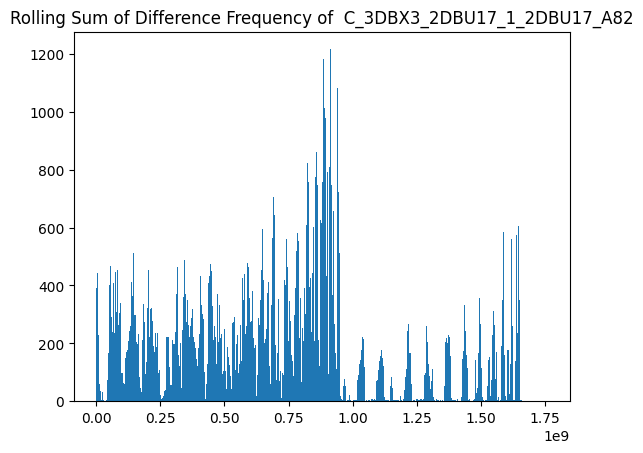

******************************************************************************


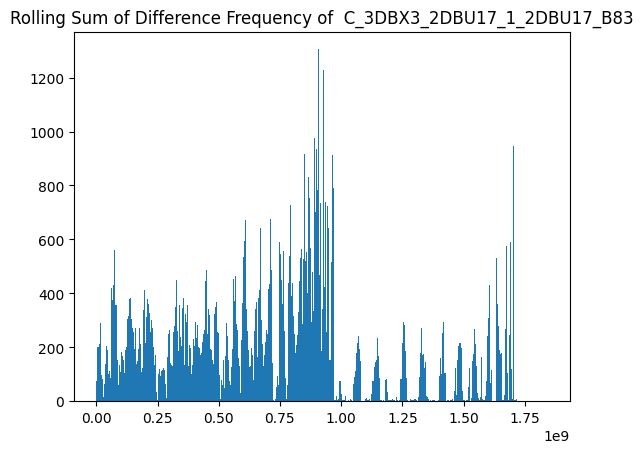

******************************************************************************


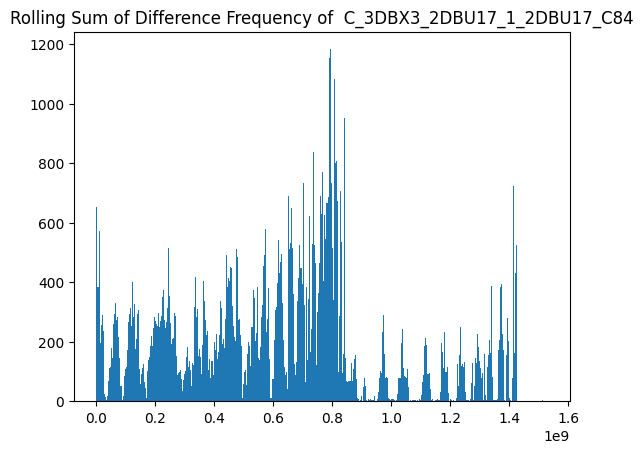

******************************************************************************


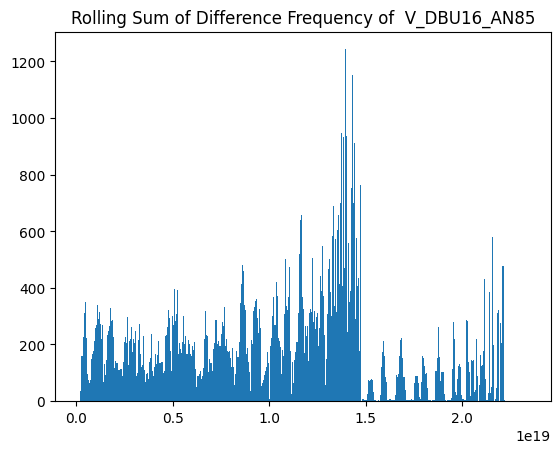

******************************************************************************


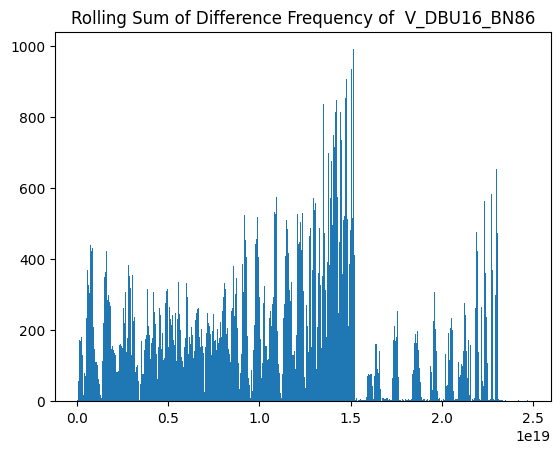

******************************************************************************


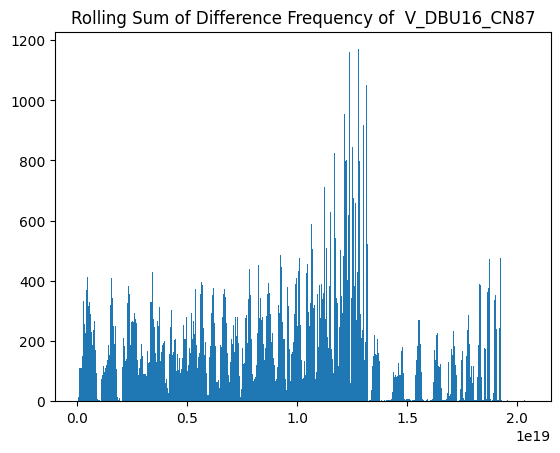

******************************************************************************


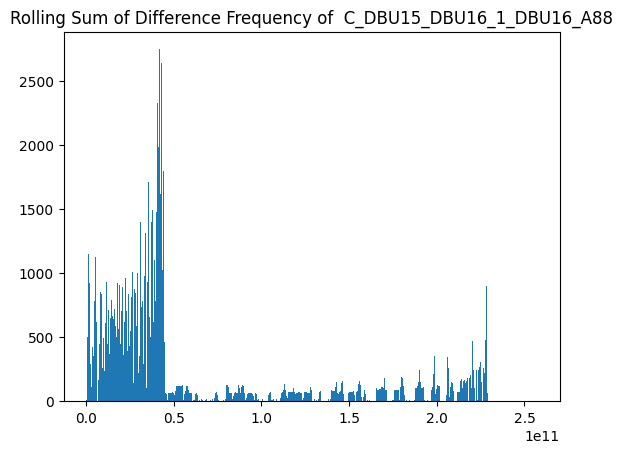

******************************************************************************


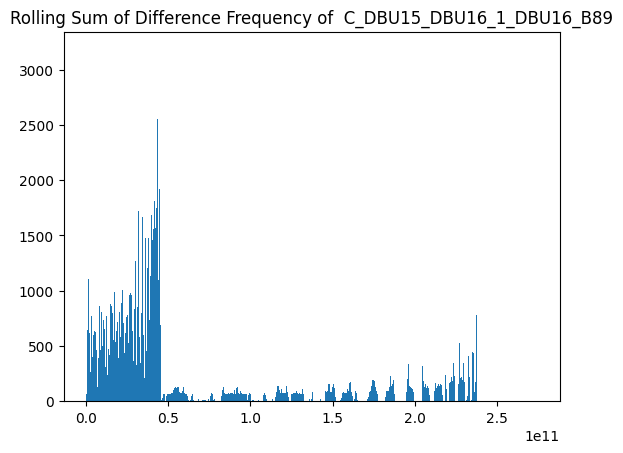

******************************************************************************


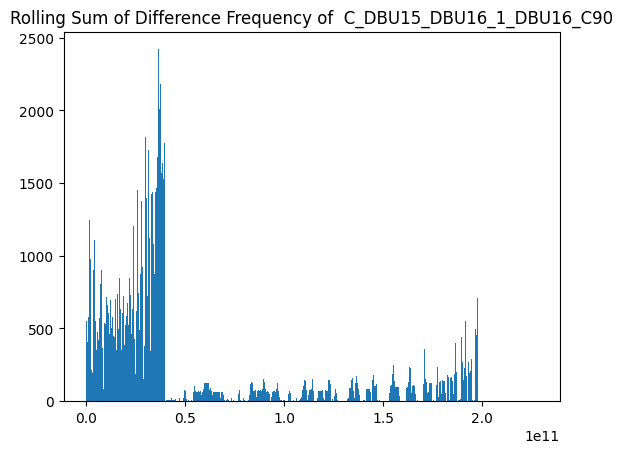

******************************************************************************


In [154]:
# do analysis for multi plot
thresholds_cov_99 = []
# thresholds2c = []
cols = data.columns

# correlation window
window = 350

# rolling sum window
w = 1

cov_multi_list = []

quant = 0.999

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    cov_multi = covariance_multi(data, var1_index, var2_indices, window)
    thresholds_cov_99.append(
        get_empirical_diff_threshold(stat=cov_multi, window=w, fn=roll_sum, axis=-1, quantile=quant,
                                     sensor_names=[var1_index]))
    cov_multi_list.append(cov_multi)

    print("******************************************************************************")


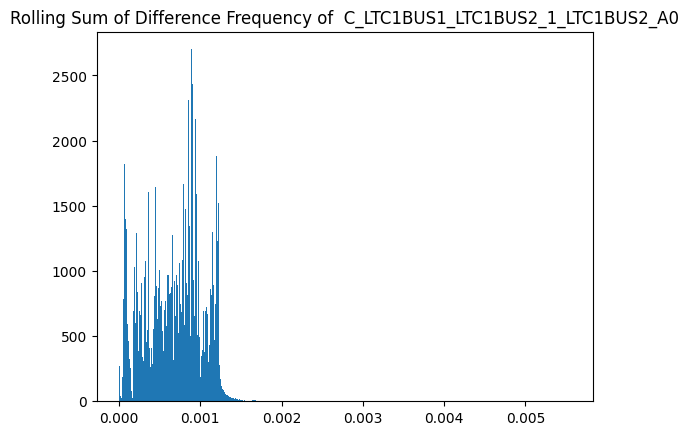

******************************************************************************


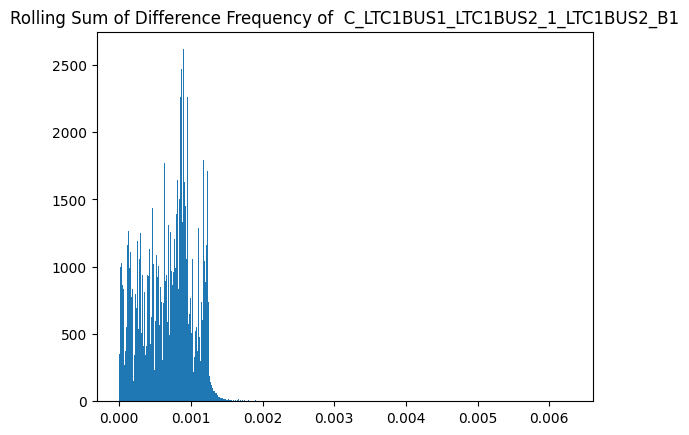

******************************************************************************


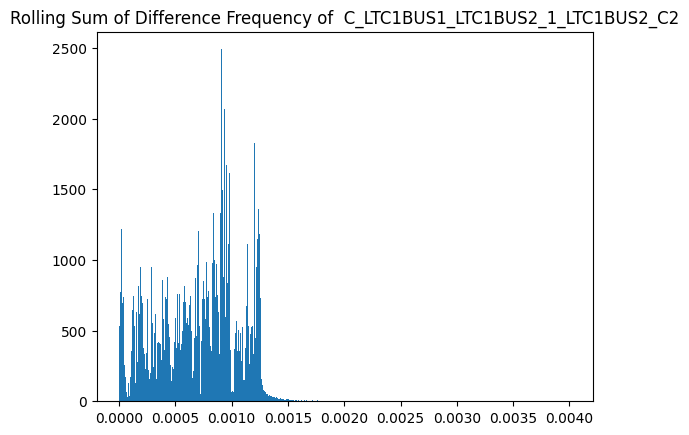

******************************************************************************


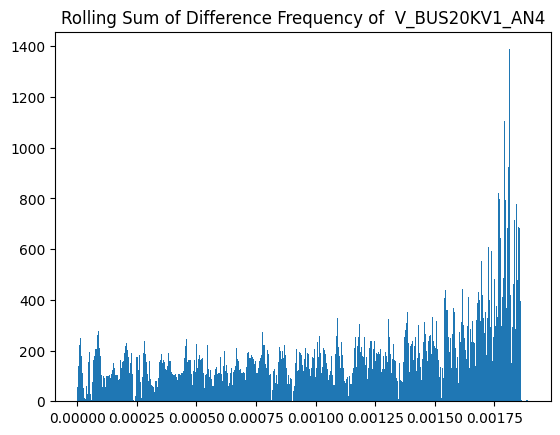

******************************************************************************


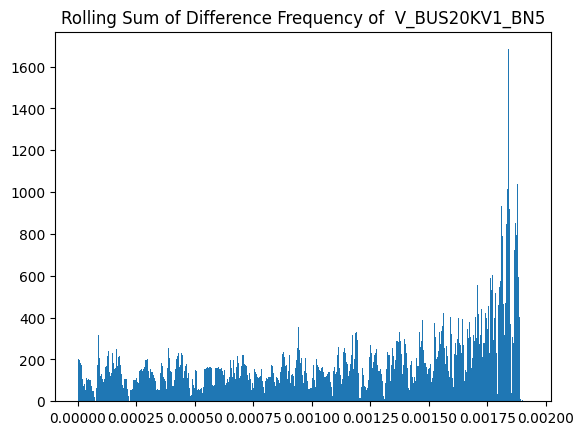

******************************************************************************


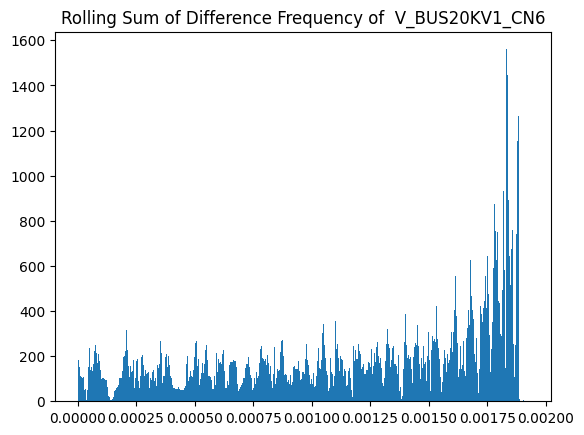

******************************************************************************


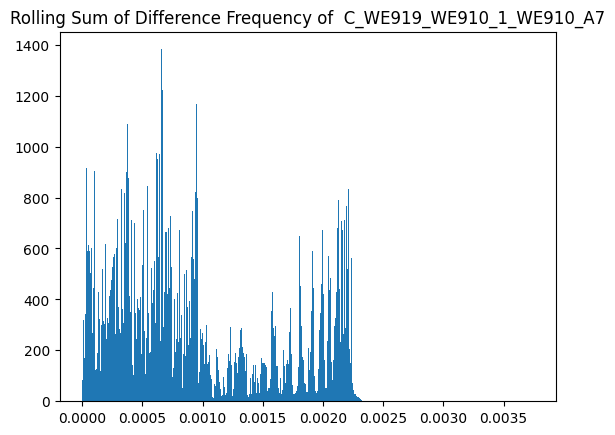

******************************************************************************


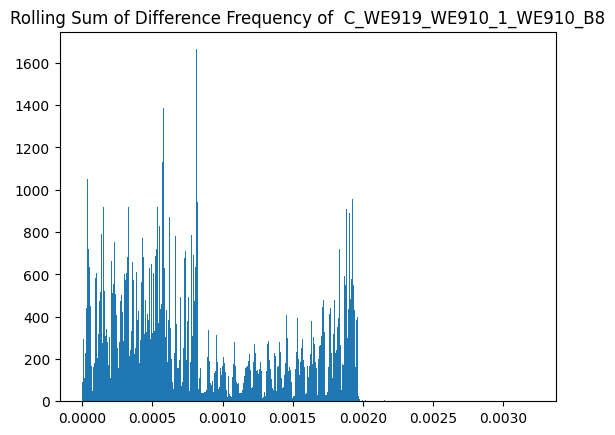

******************************************************************************


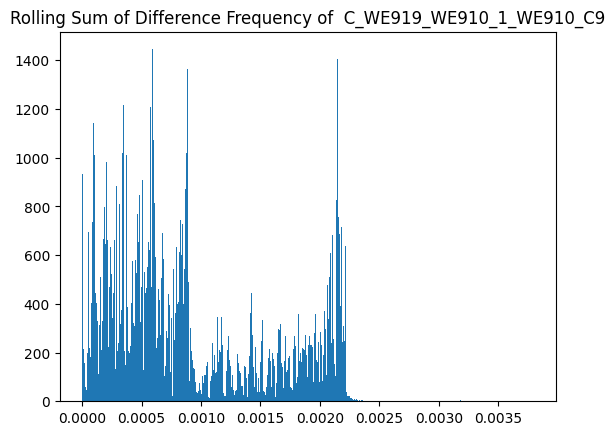

******************************************************************************


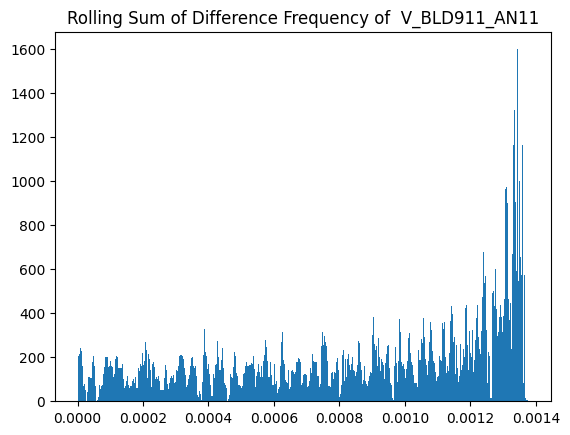

******************************************************************************


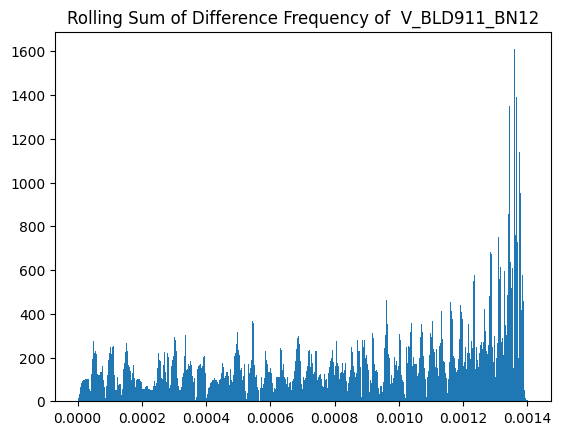

******************************************************************************


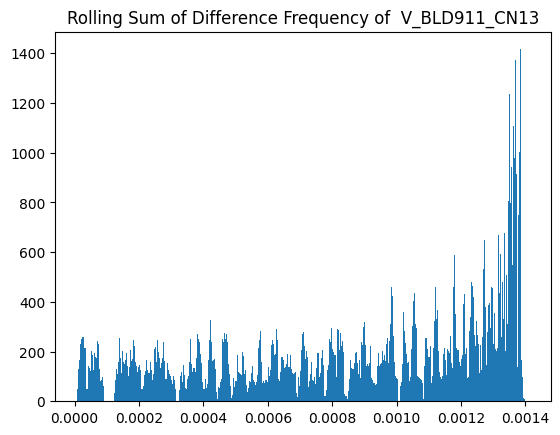

******************************************************************************


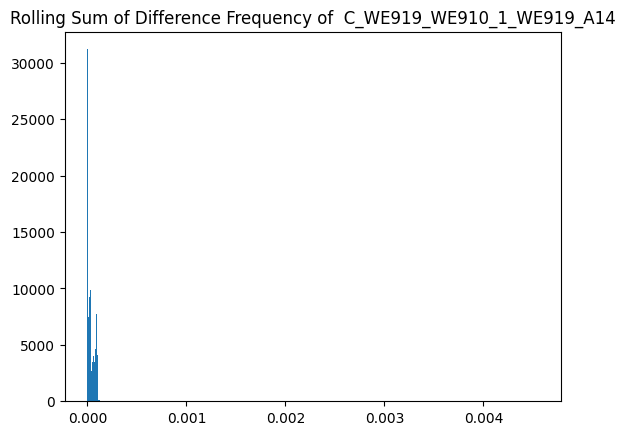

******************************************************************************


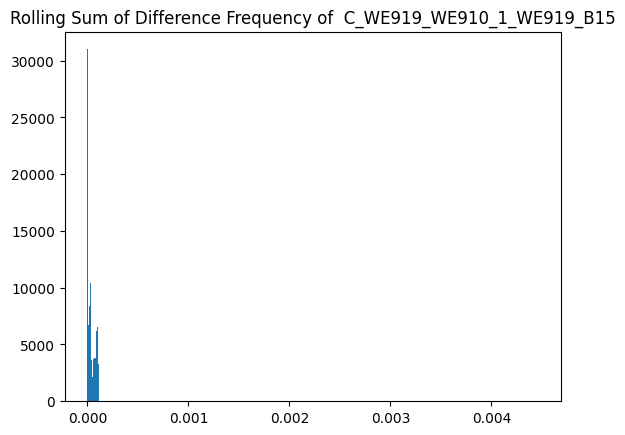

******************************************************************************


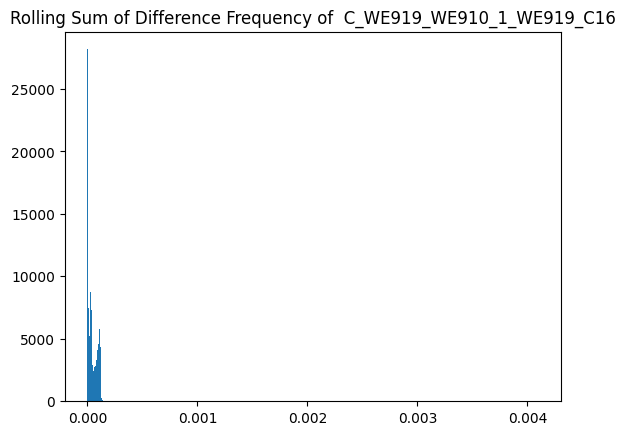

******************************************************************************


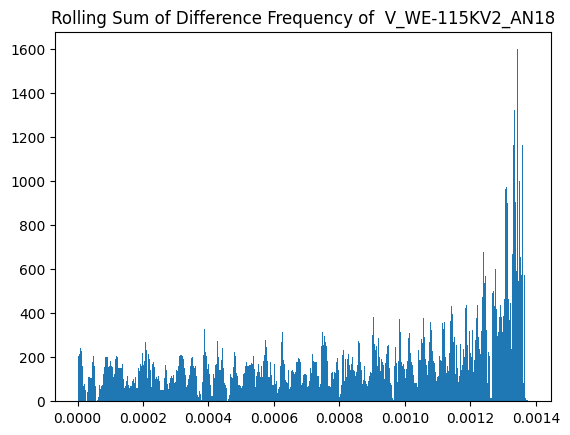

******************************************************************************


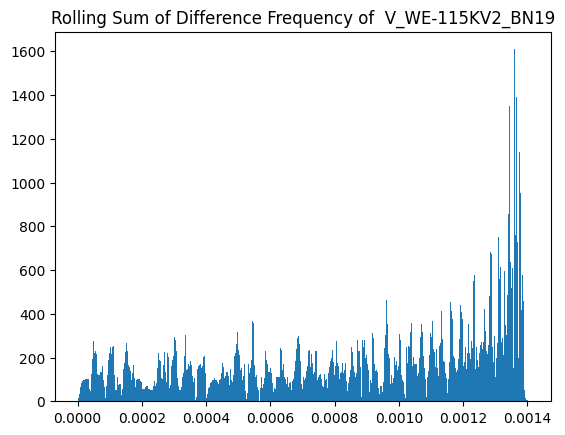

******************************************************************************


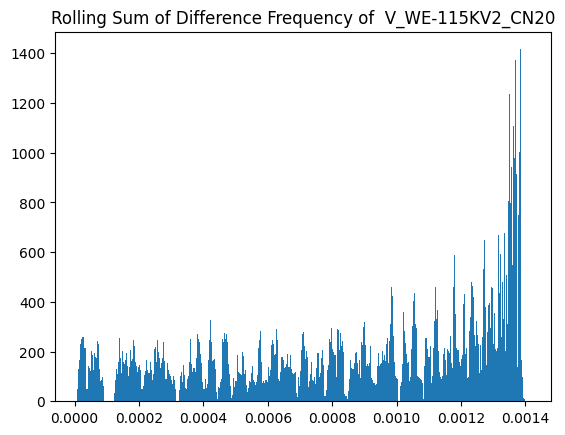

******************************************************************************


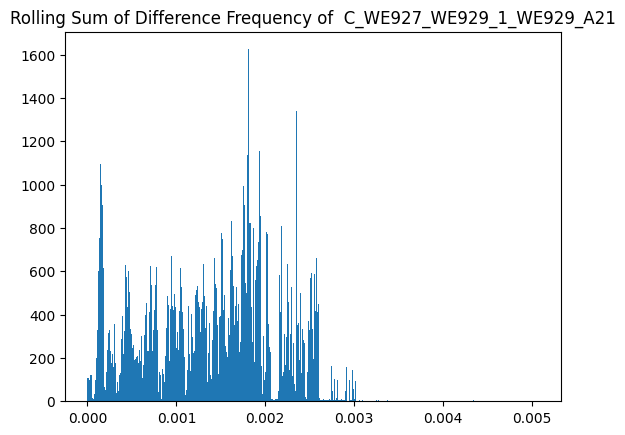

******************************************************************************


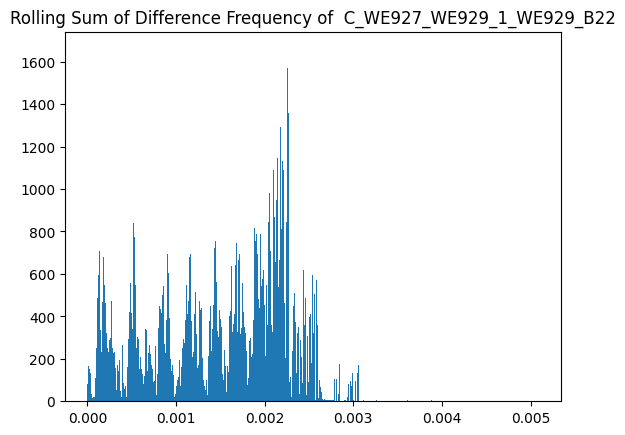

******************************************************************************


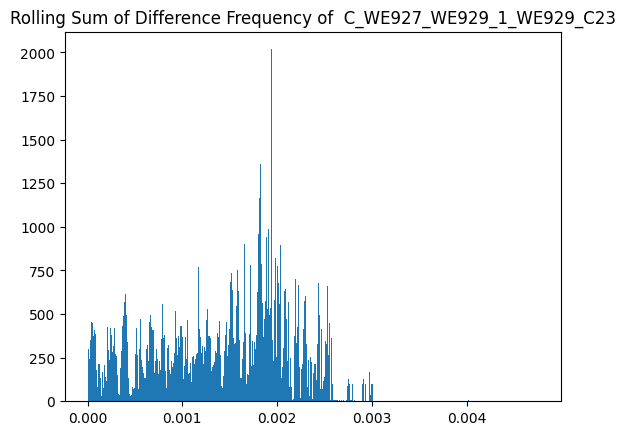

******************************************************************************


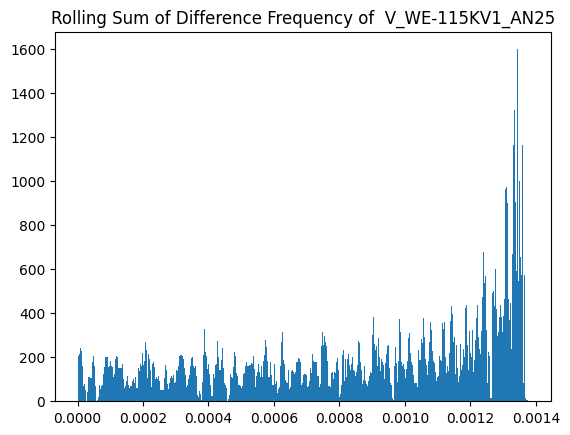

******************************************************************************


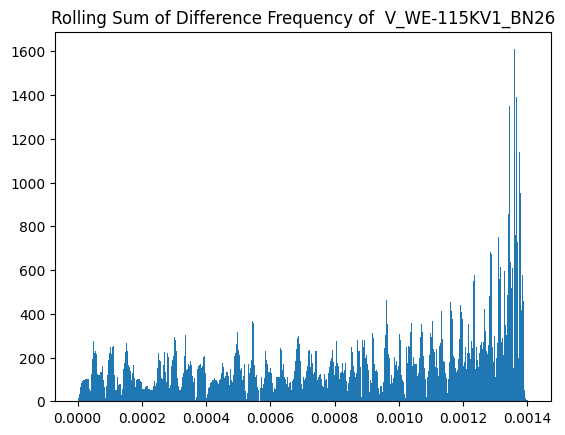

******************************************************************************


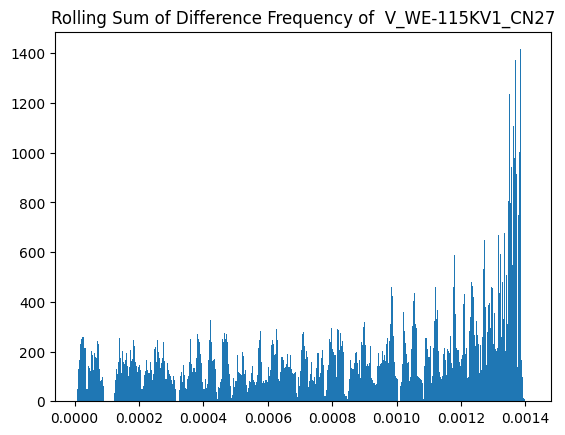

******************************************************************************


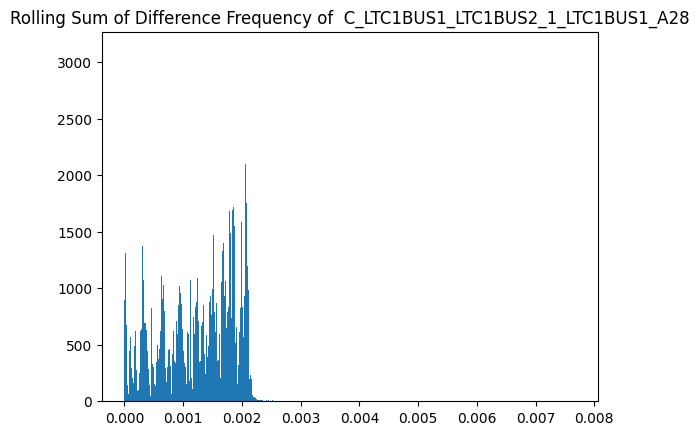

******************************************************************************


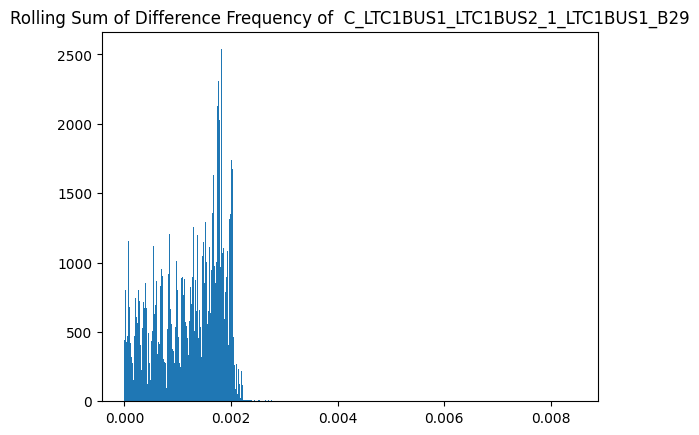

******************************************************************************


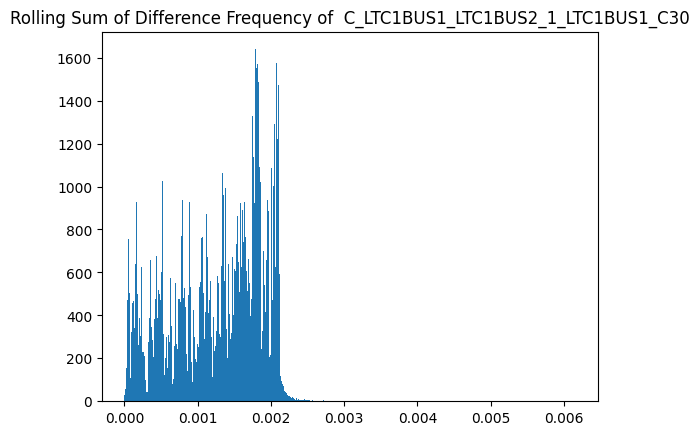

******************************************************************************


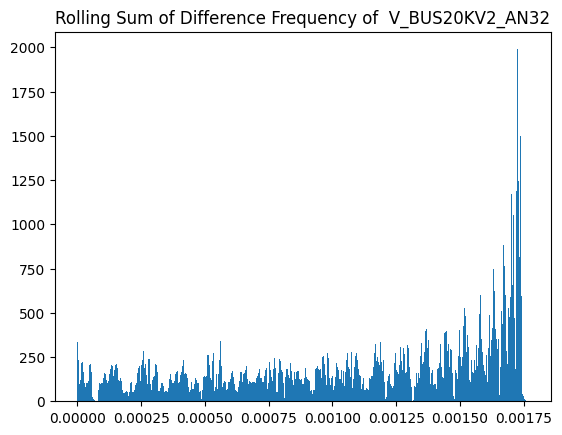

******************************************************************************


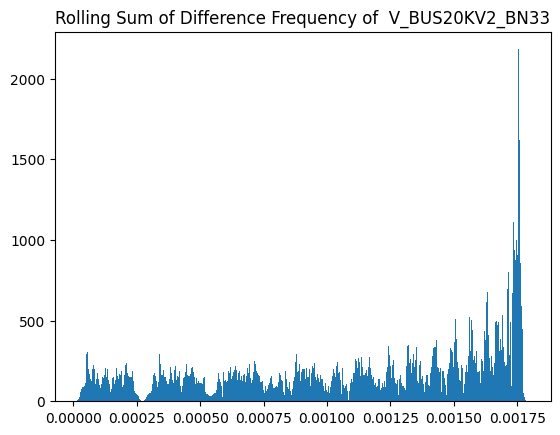

******************************************************************************


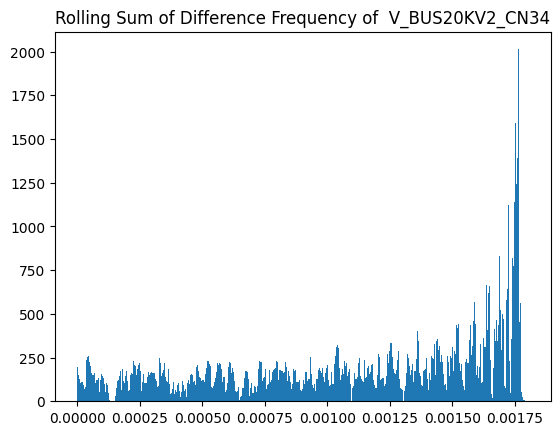

******************************************************************************


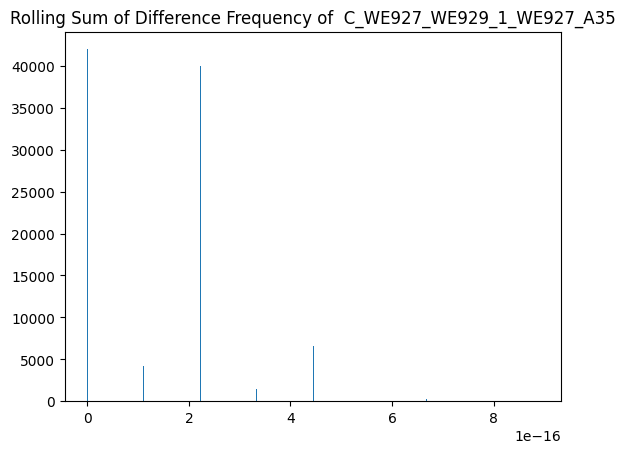

******************************************************************************


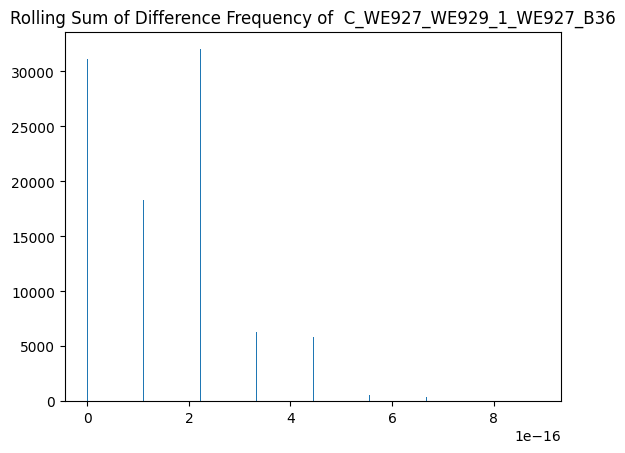

******************************************************************************


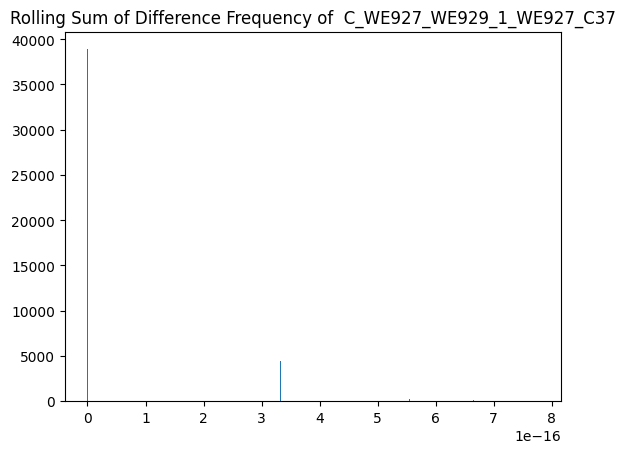

******************************************************************************


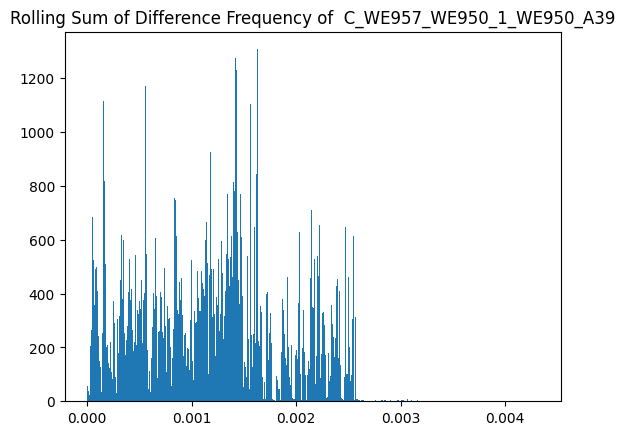

******************************************************************************


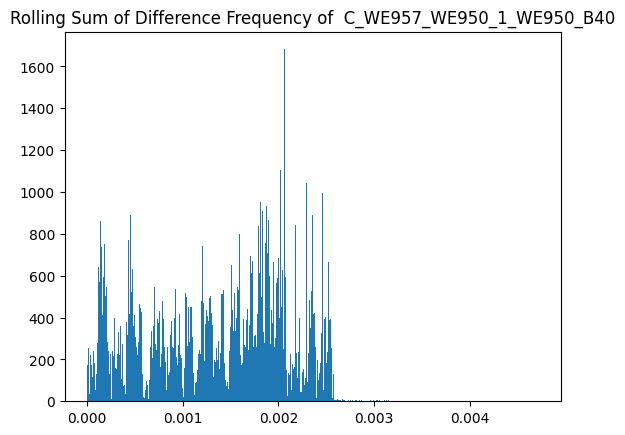

******************************************************************************


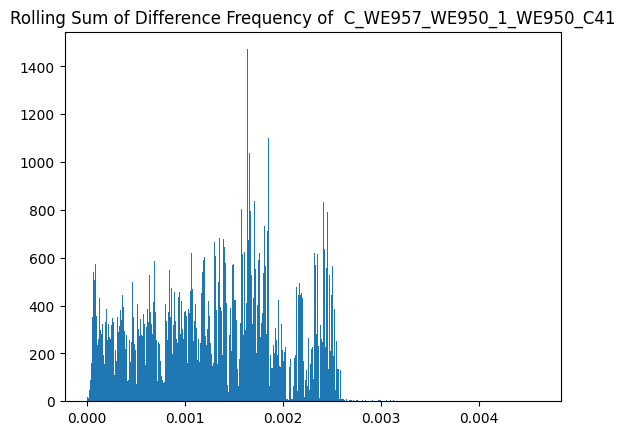

******************************************************************************


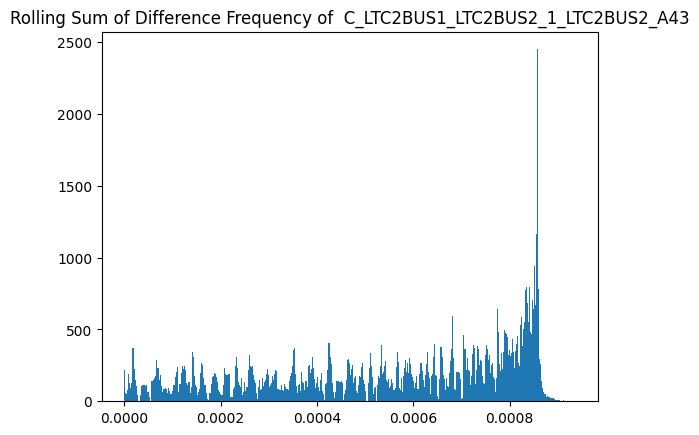

******************************************************************************


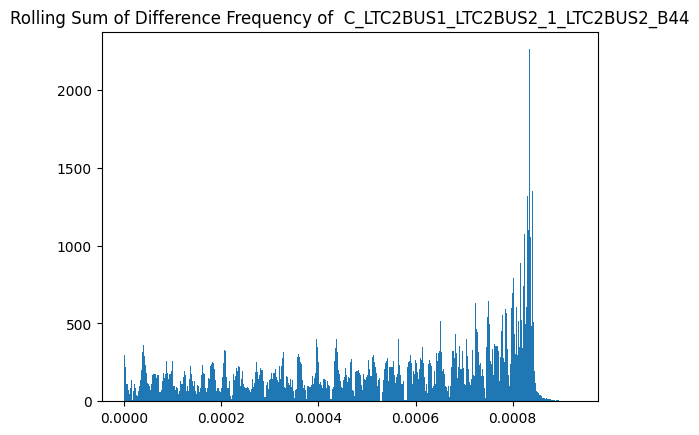

******************************************************************************


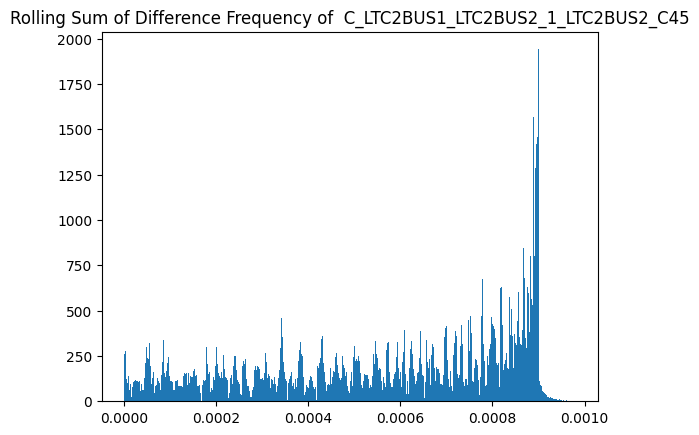

******************************************************************************


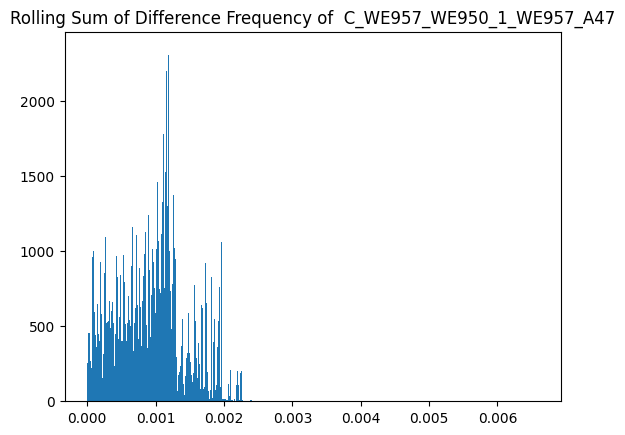

******************************************************************************


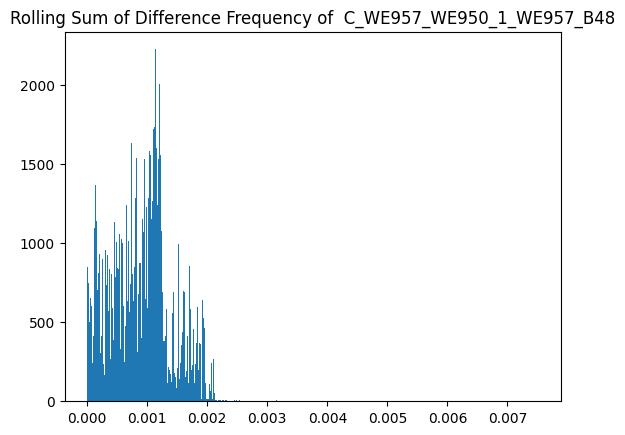

******************************************************************************


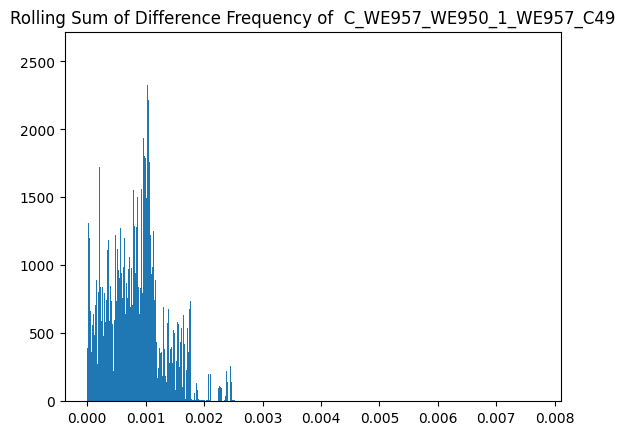

******************************************************************************


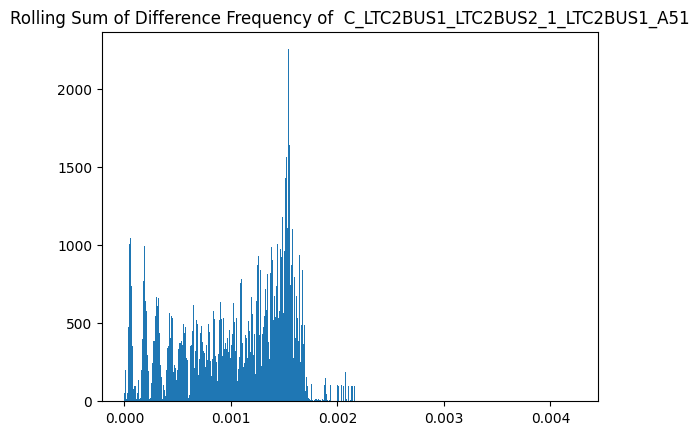

******************************************************************************


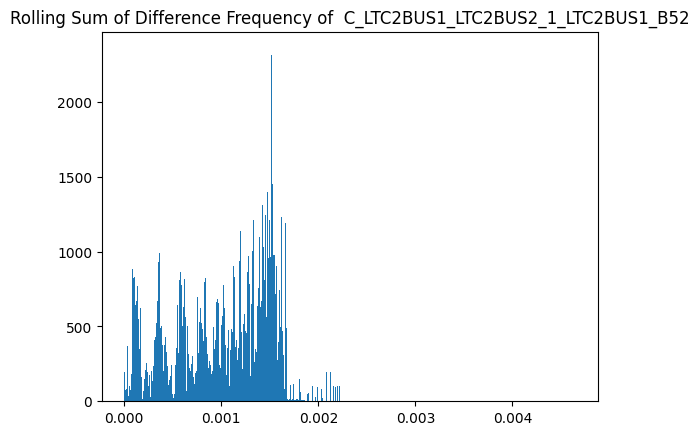

******************************************************************************


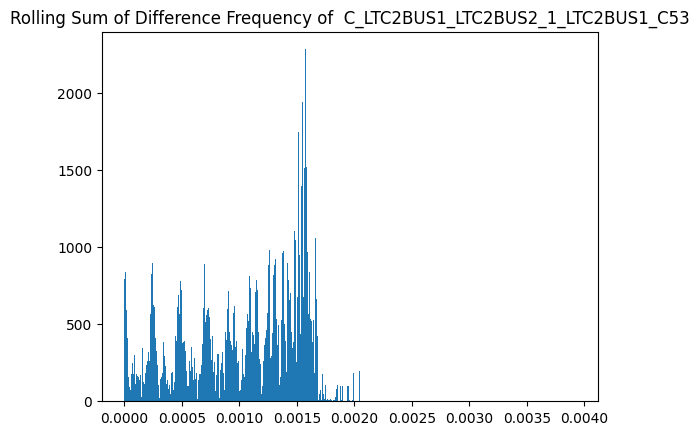

******************************************************************************


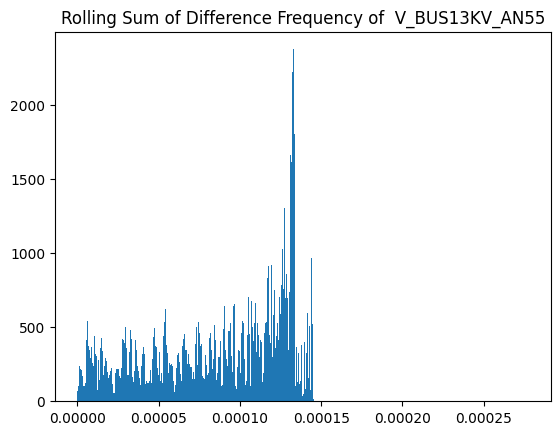

******************************************************************************


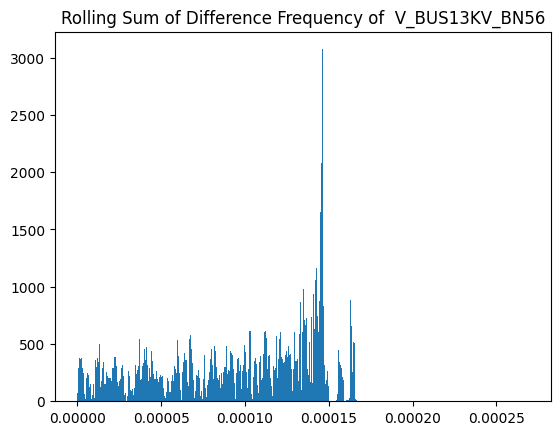

******************************************************************************


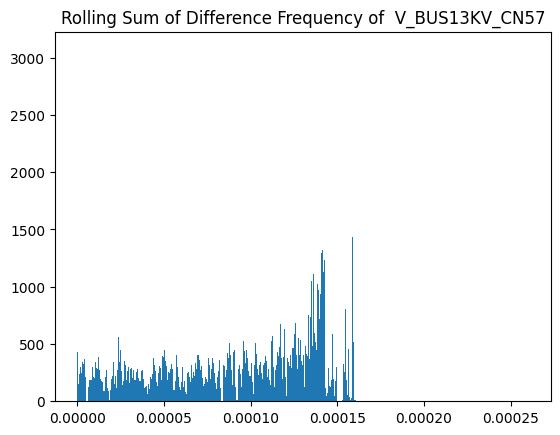

******************************************************************************


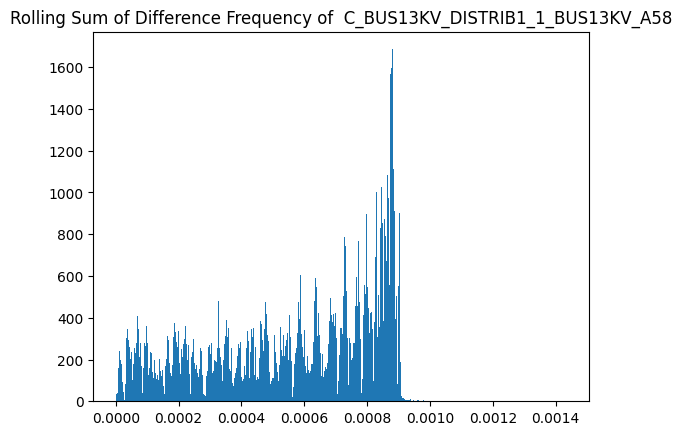

******************************************************************************


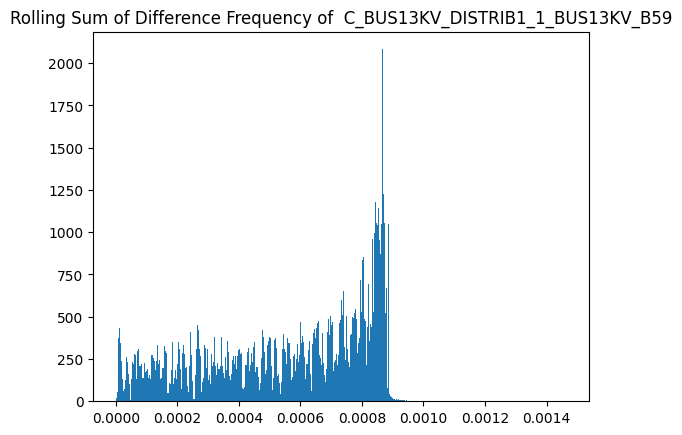

******************************************************************************


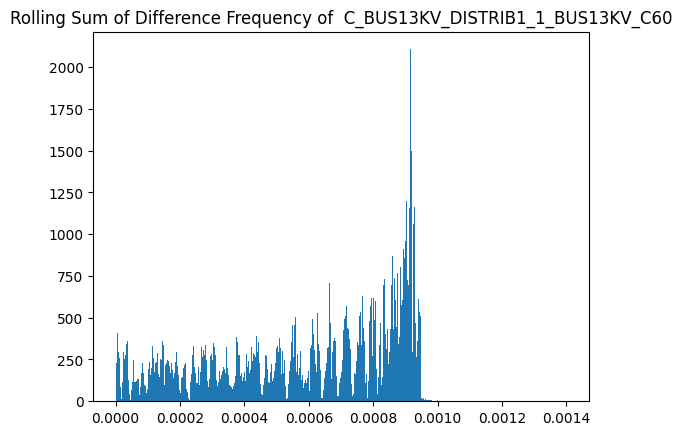

******************************************************************************


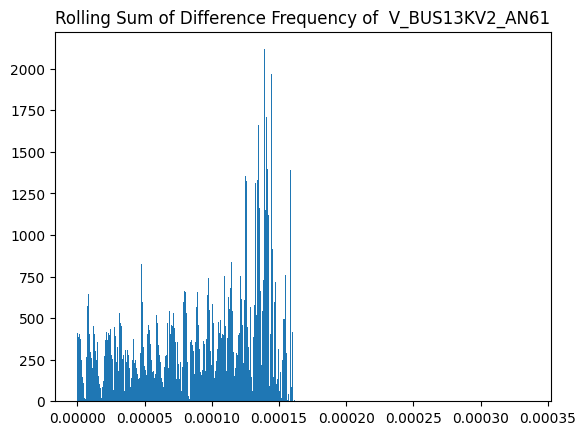

******************************************************************************


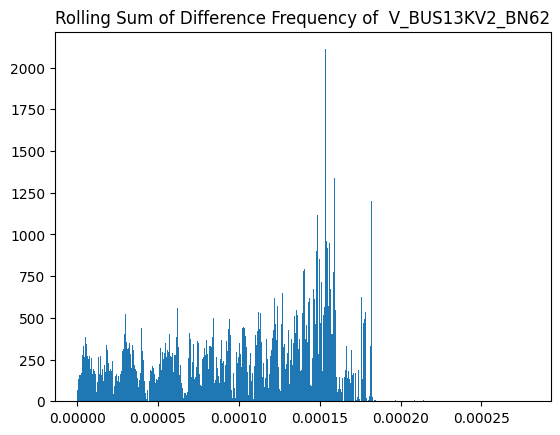

******************************************************************************


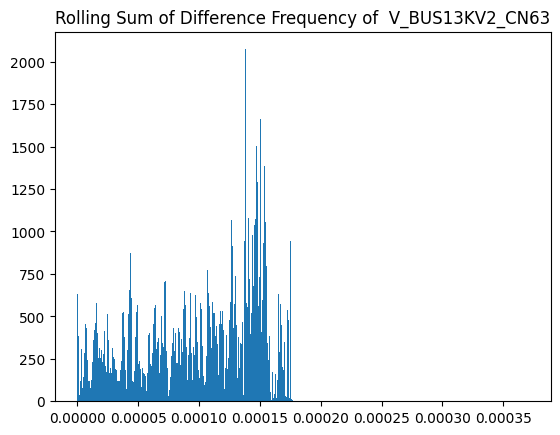

******************************************************************************


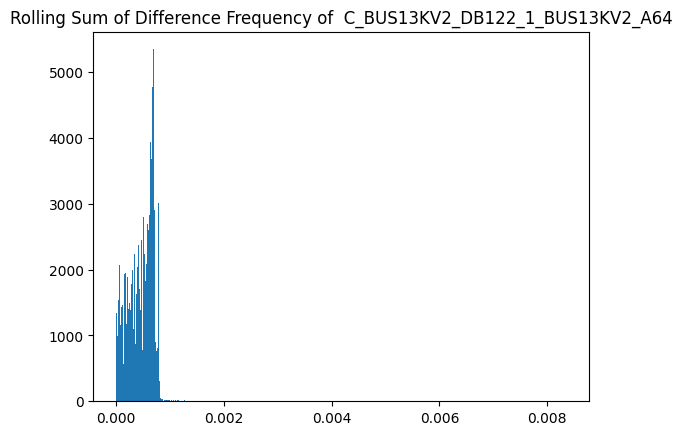

******************************************************************************


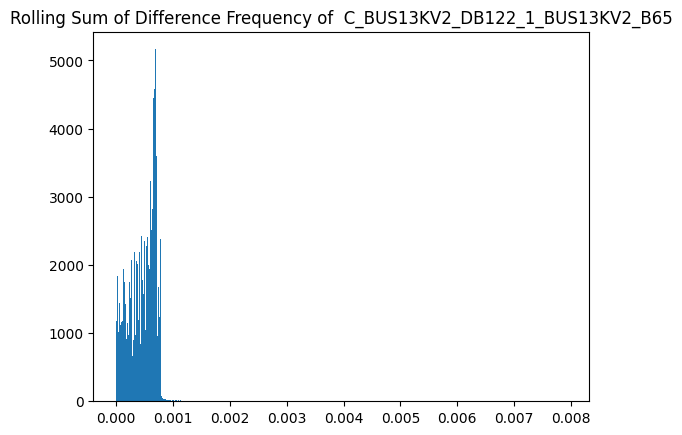

******************************************************************************


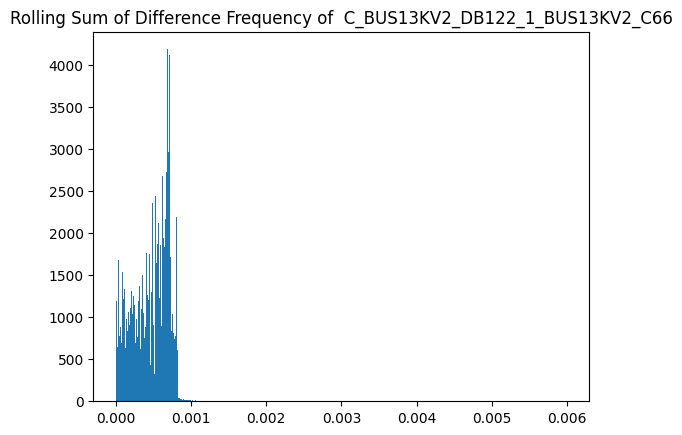

******************************************************************************


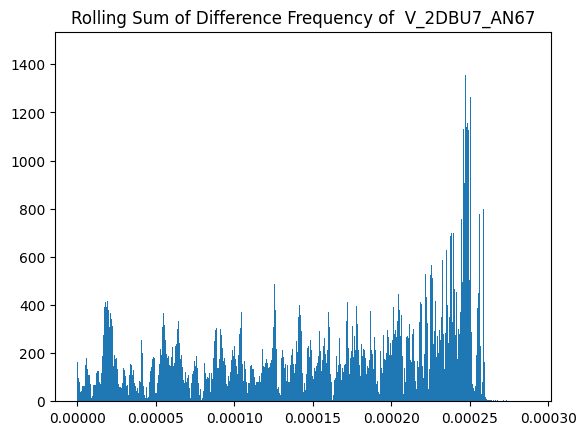

******************************************************************************


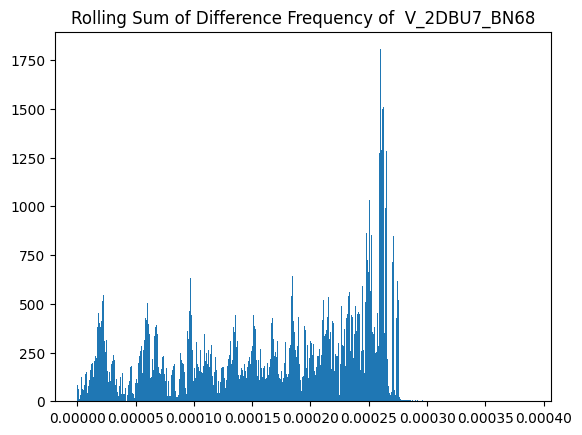

******************************************************************************


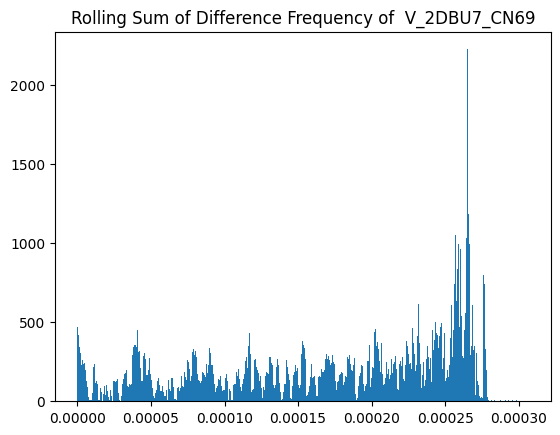

******************************************************************************


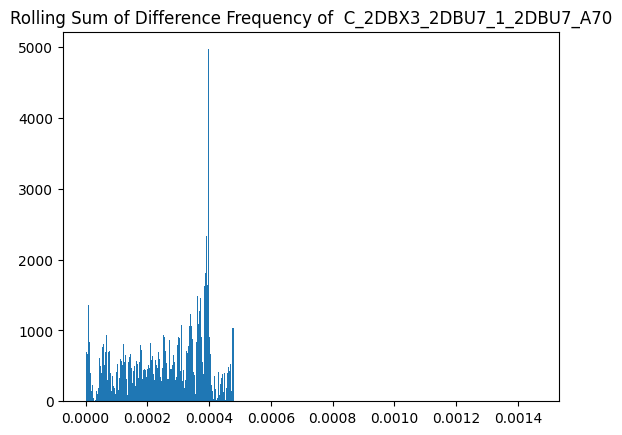

******************************************************************************


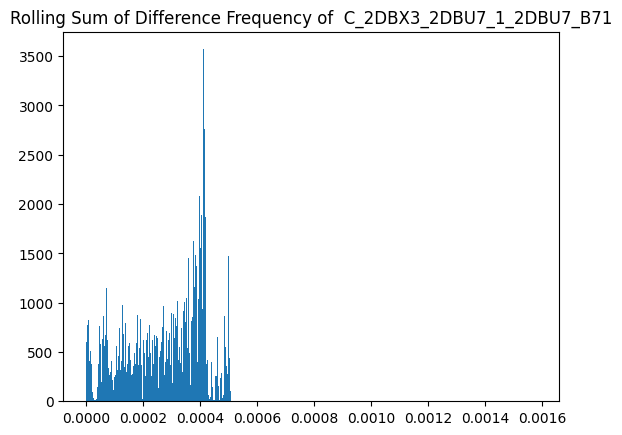

******************************************************************************


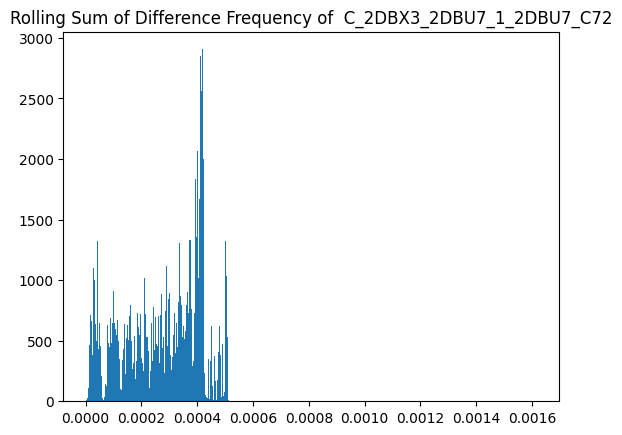

******************************************************************************


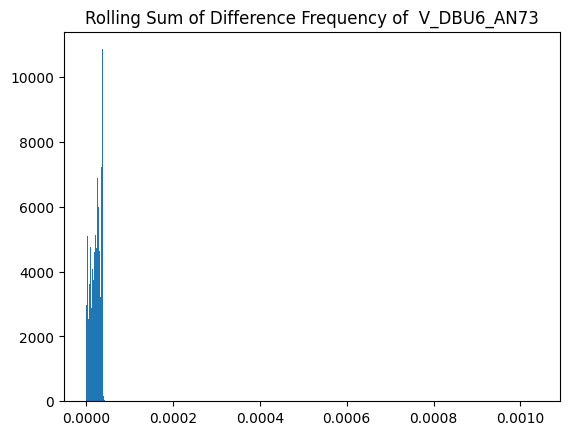

******************************************************************************


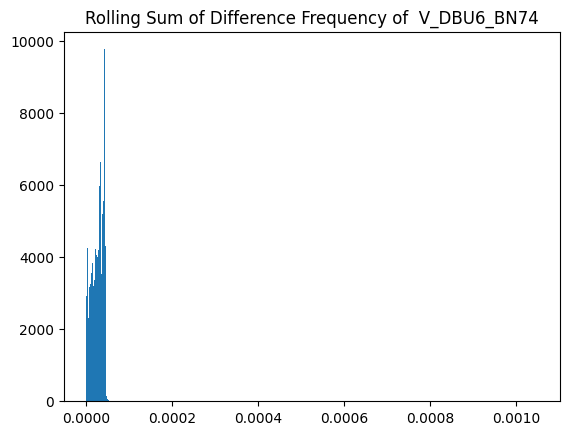

******************************************************************************


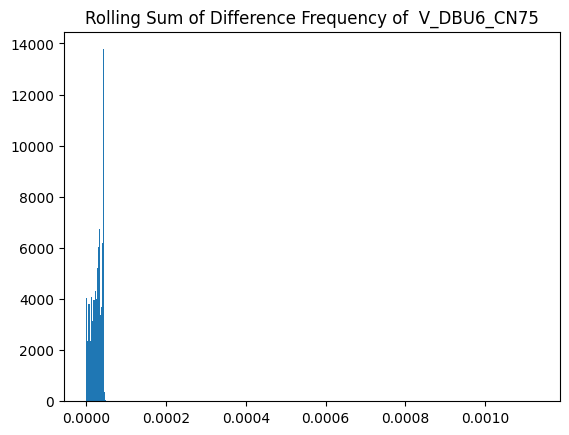

******************************************************************************


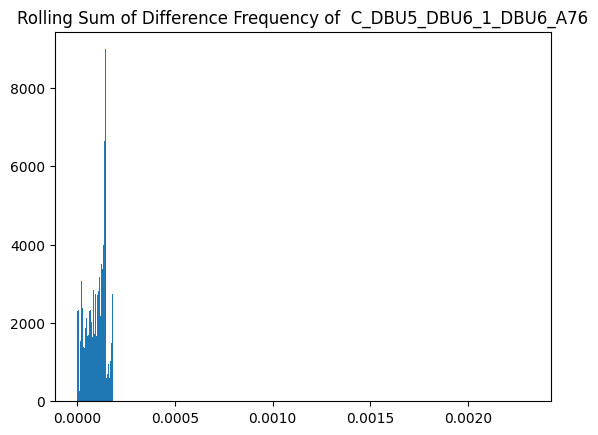

******************************************************************************


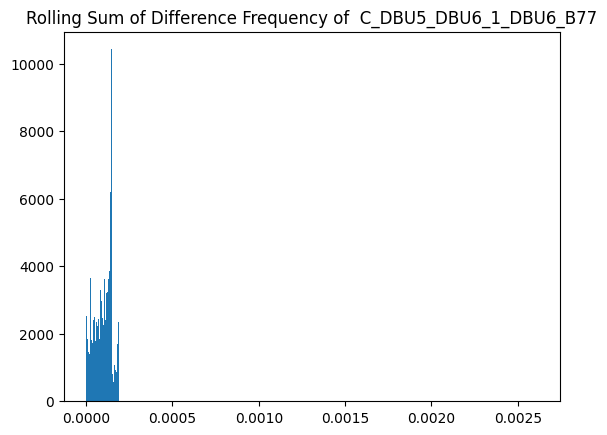

******************************************************************************


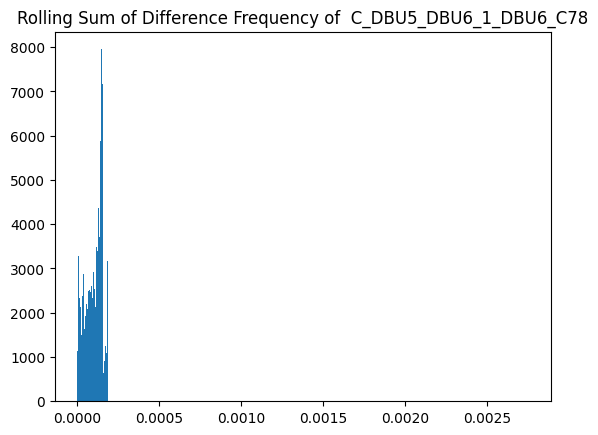

******************************************************************************


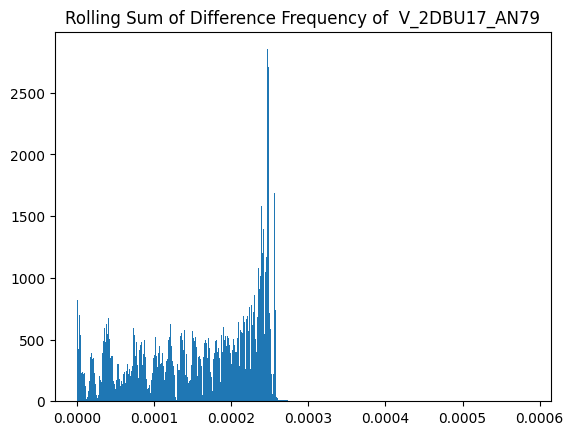

******************************************************************************


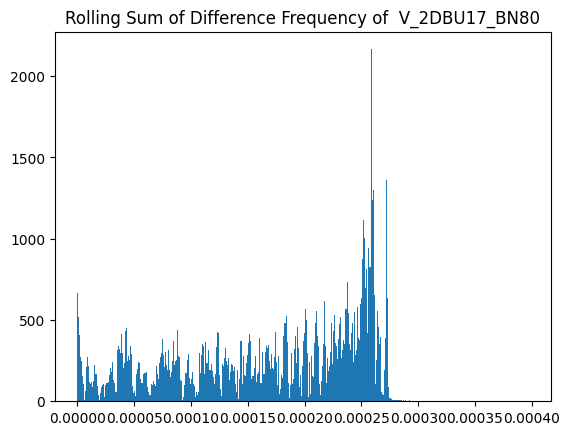

******************************************************************************


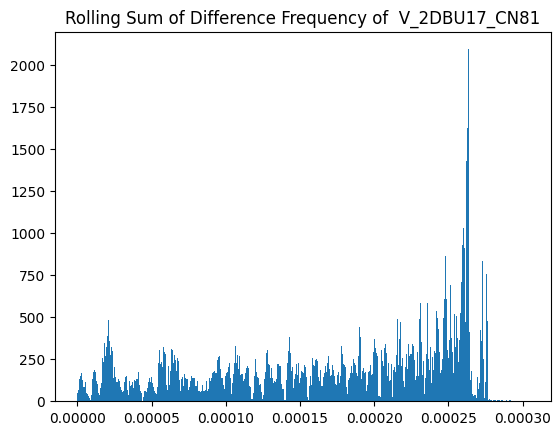

******************************************************************************


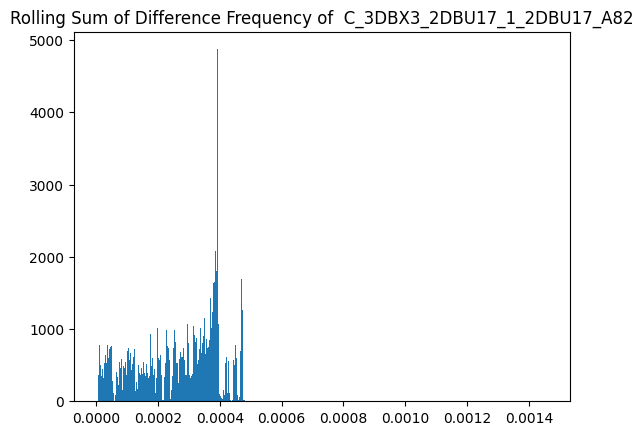

******************************************************************************


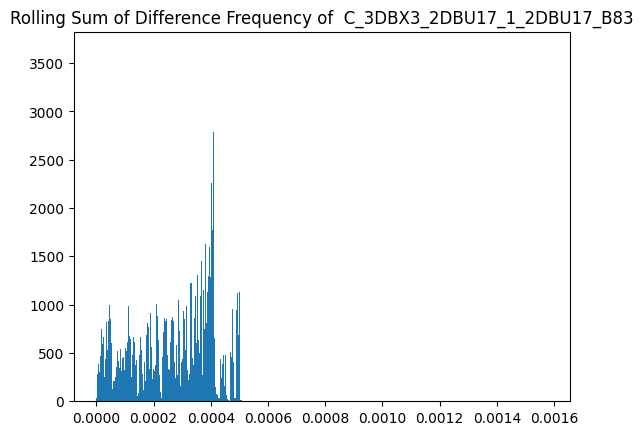

******************************************************************************


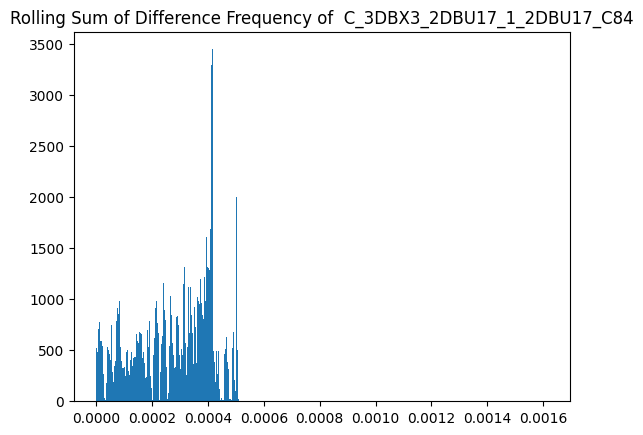

******************************************************************************


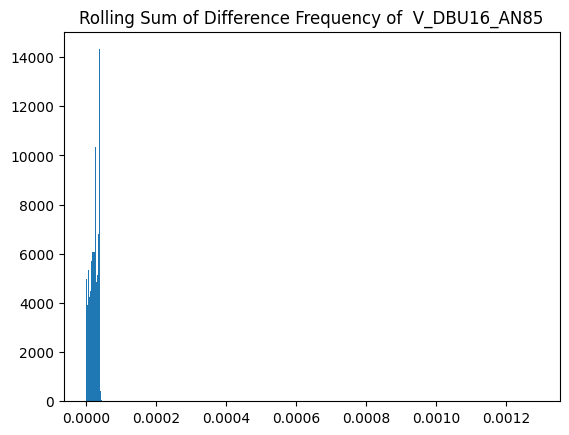

******************************************************************************


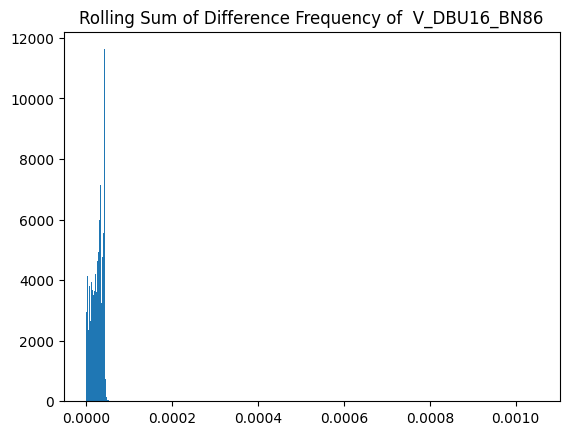

******************************************************************************


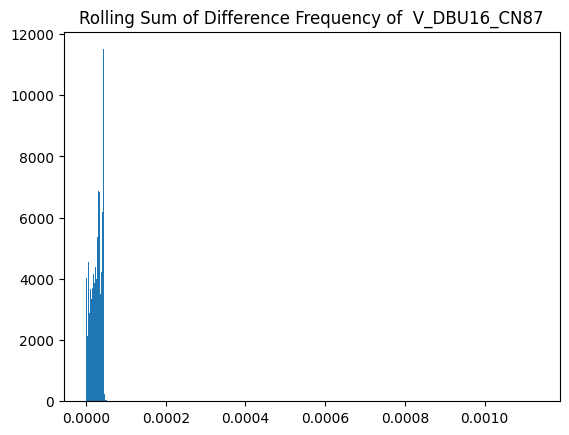

******************************************************************************


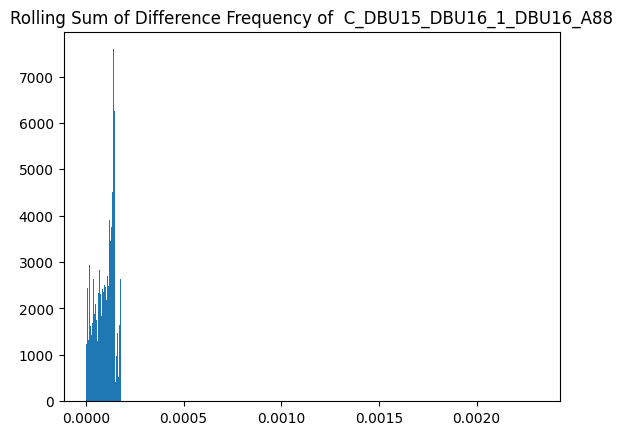

******************************************************************************


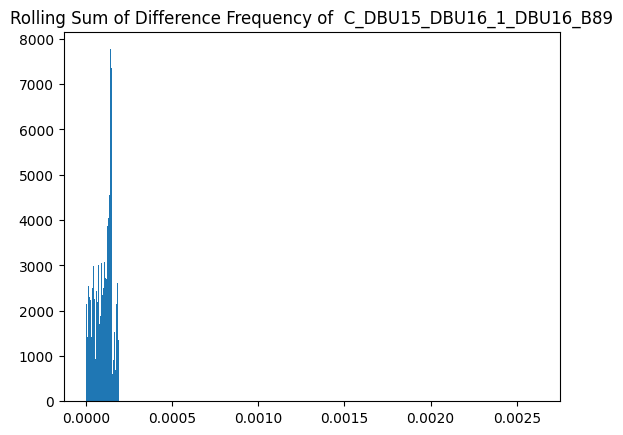

******************************************************************************


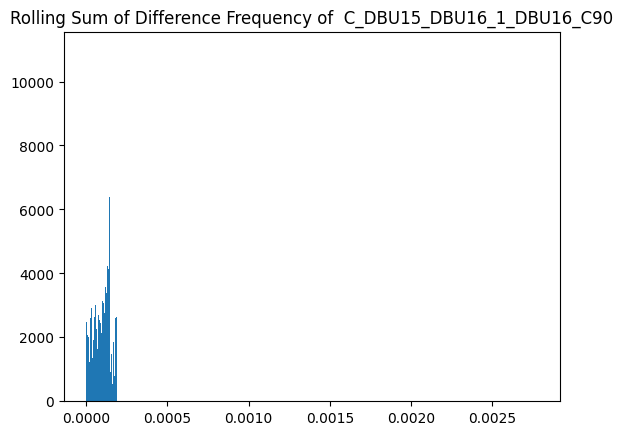

******************************************************************************


In [155]:
# do analysis for multi plot
thresholds_corr = []
# thresholds2 = []
cols = data.columns

corr_multi_list = []

# correlation window
window = 350

# rolling sum window
w = 1

quant = 1

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_multi = correlation_multi(data, var1_index, var2_indices, window)
    thresholds_corr.append(
        get_empirical_diff_threshold(stat=corr_multi, window=w, fn=roll_sum, axis=-1, quantile=quant,
                                     sensor_names=[var1_index]))
    corr_multi_list.append(corr_multi)

#     thresholds2.append(get_threshold(stat=corr_multi, window=w, fn=roll_sum, axis=-1, quantile=1-quant))
    print("******************************************************************************")



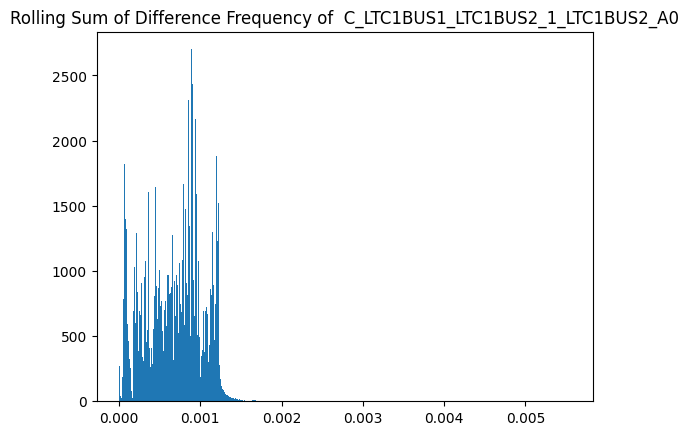

******************************************************************************


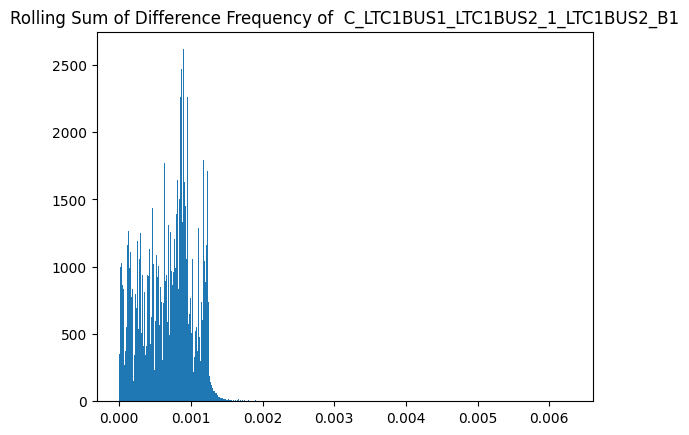

******************************************************************************


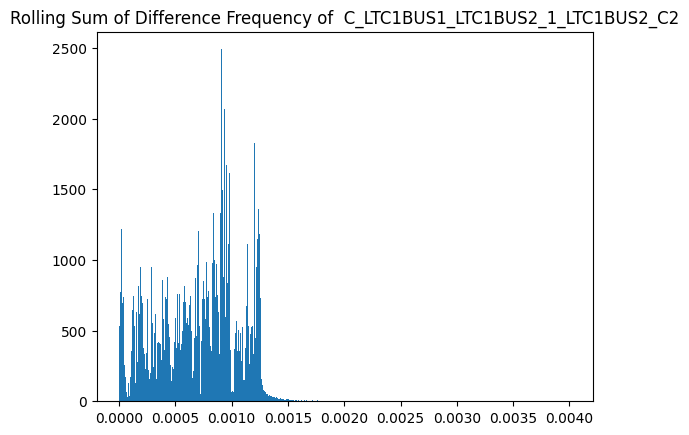

******************************************************************************


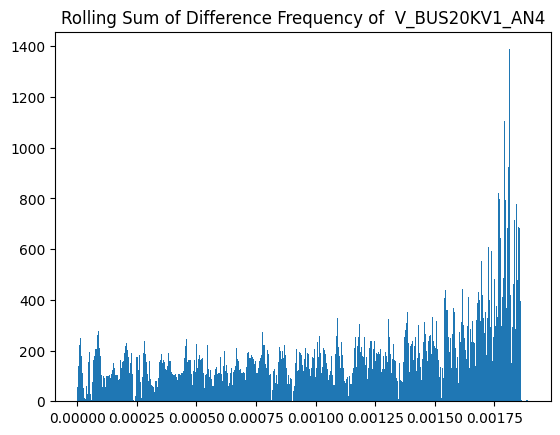

******************************************************************************


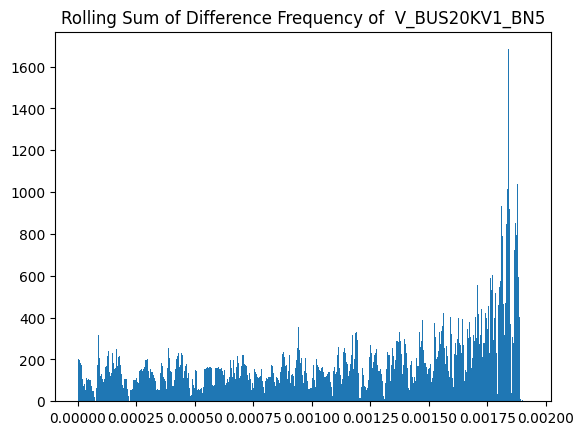

******************************************************************************


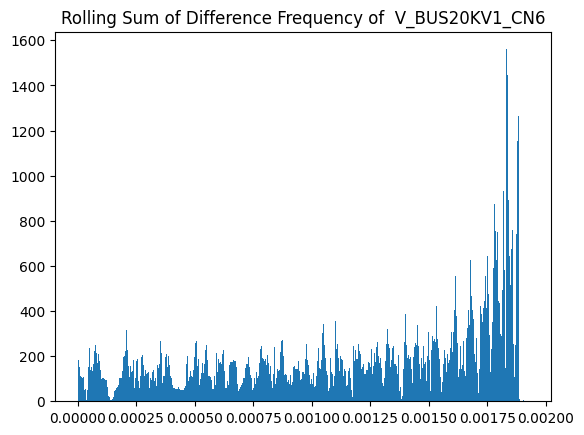

******************************************************************************


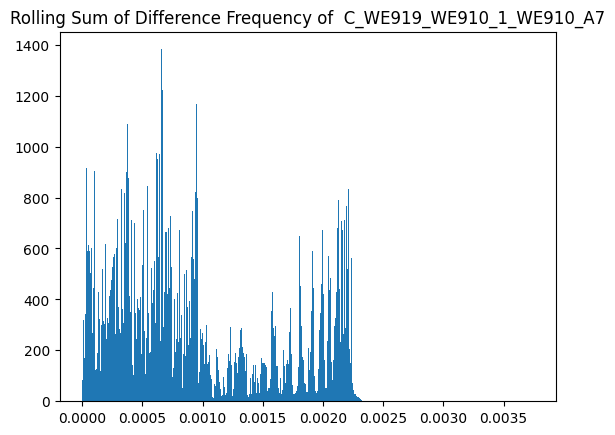

******************************************************************************


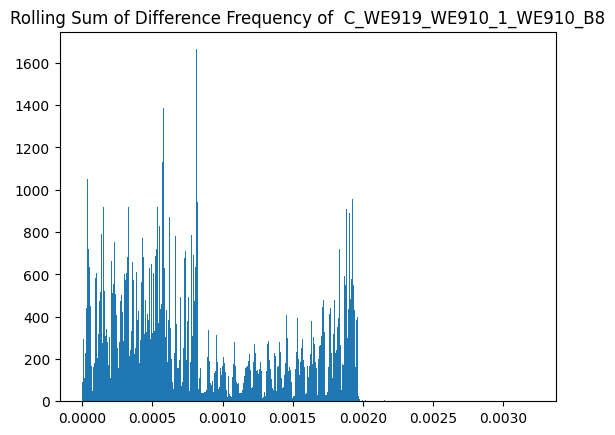

******************************************************************************


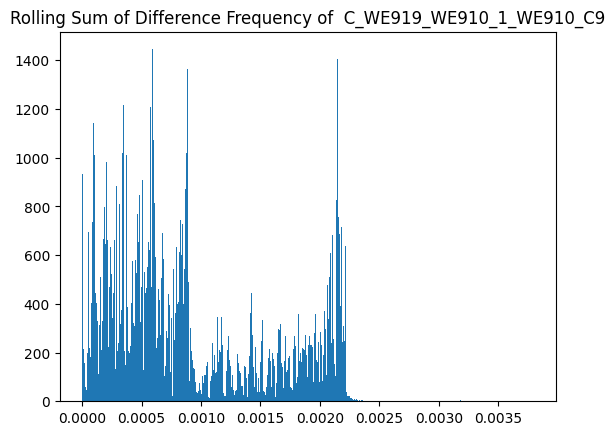

******************************************************************************


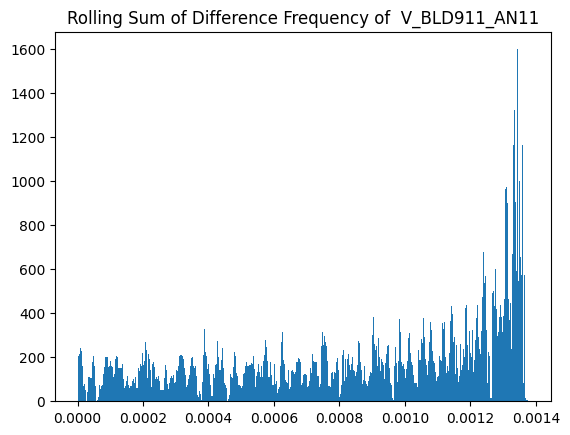

******************************************************************************


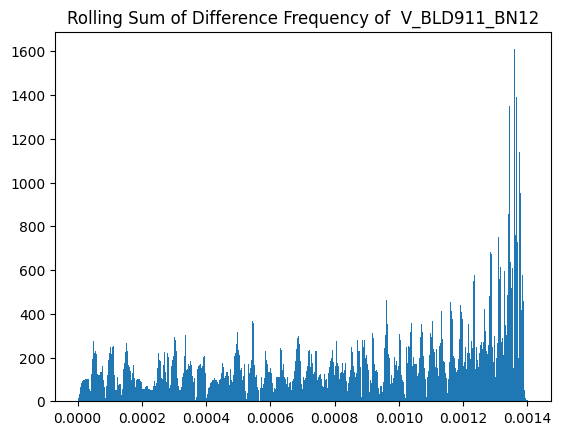

******************************************************************************


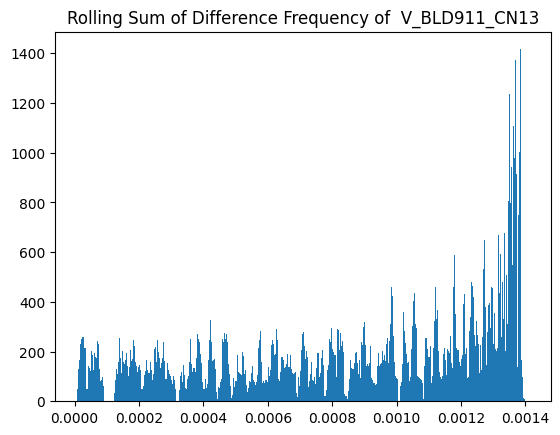

******************************************************************************


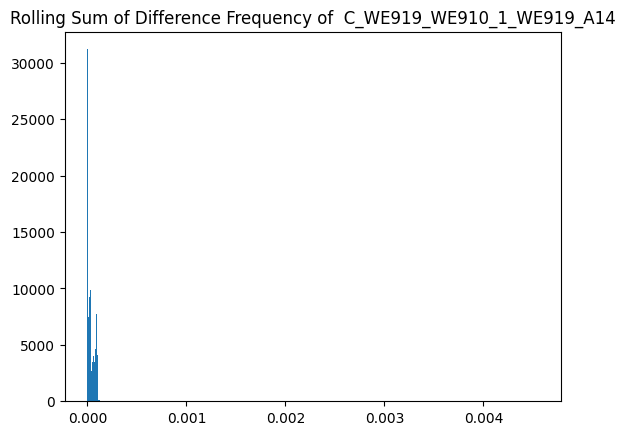

******************************************************************************


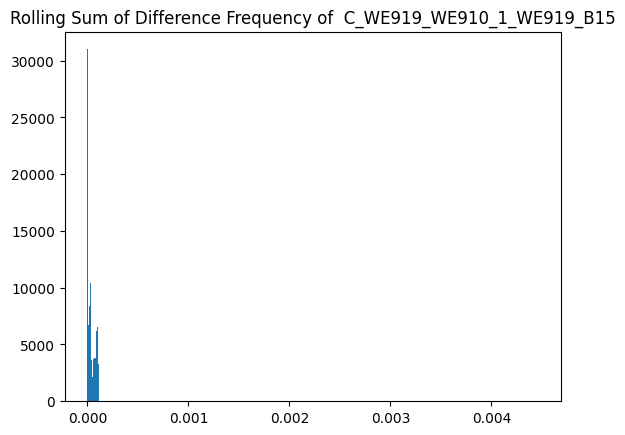

******************************************************************************


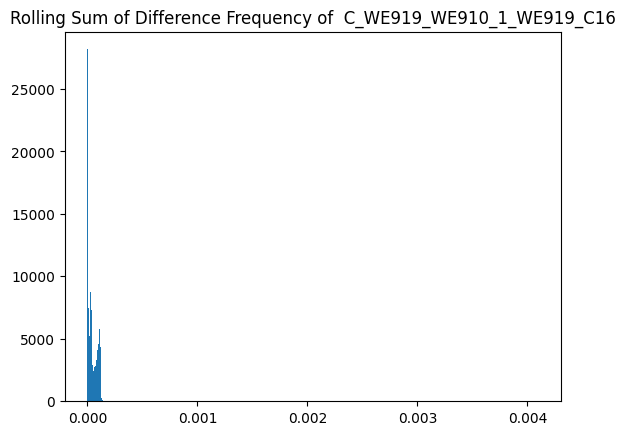

******************************************************************************


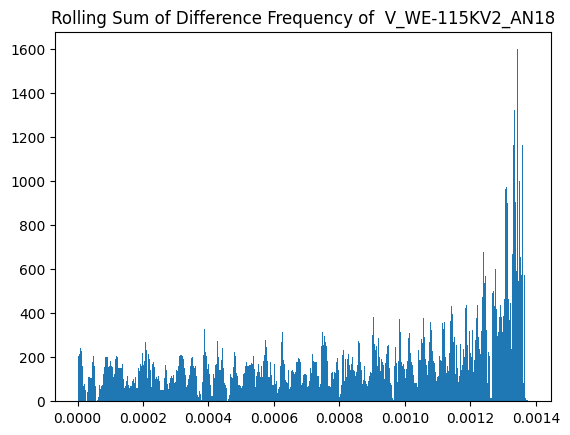

******************************************************************************


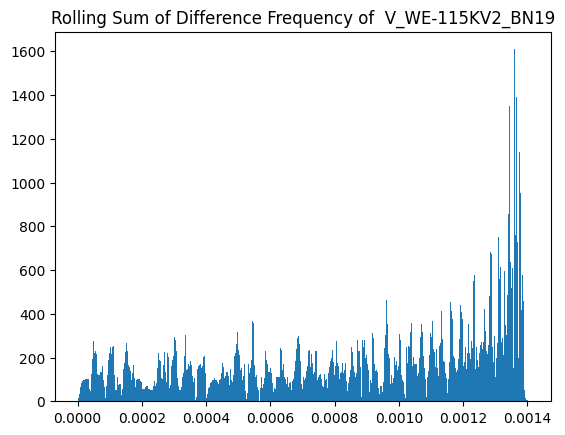

******************************************************************************


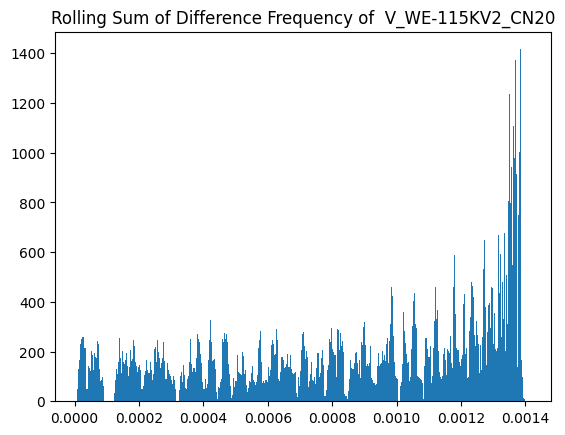

******************************************************************************


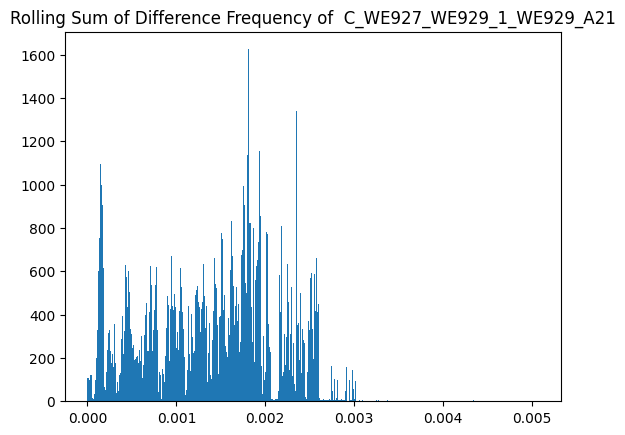

******************************************************************************


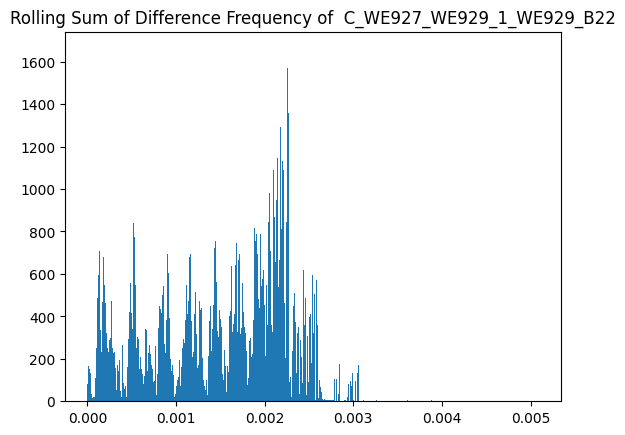

******************************************************************************


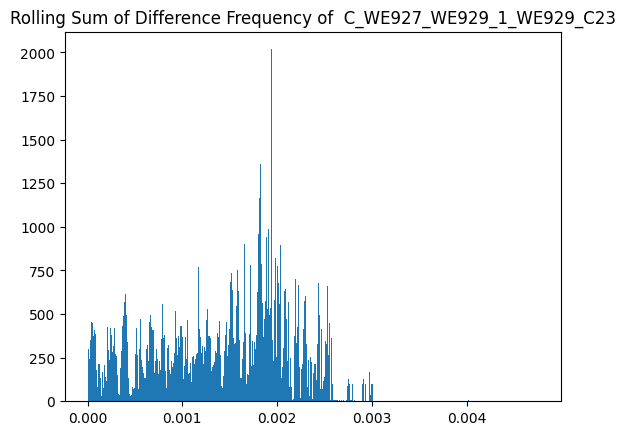

******************************************************************************


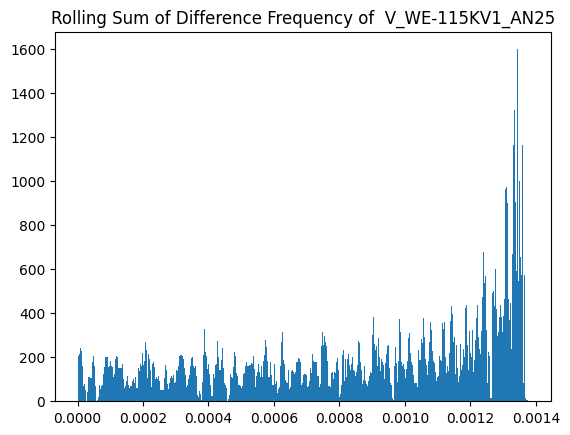

******************************************************************************


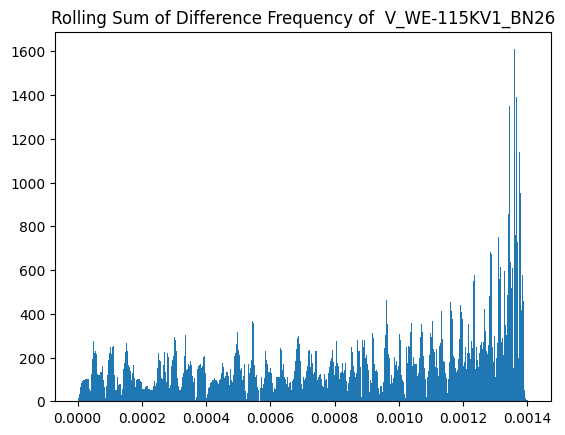

******************************************************************************


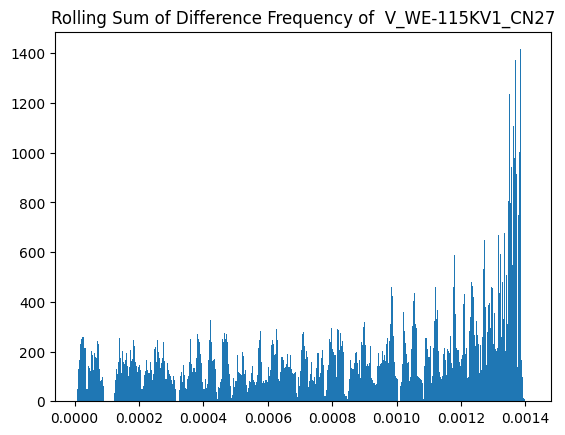

******************************************************************************


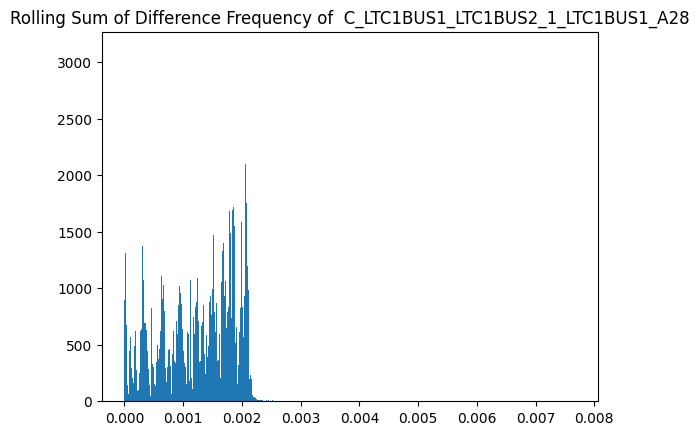

******************************************************************************


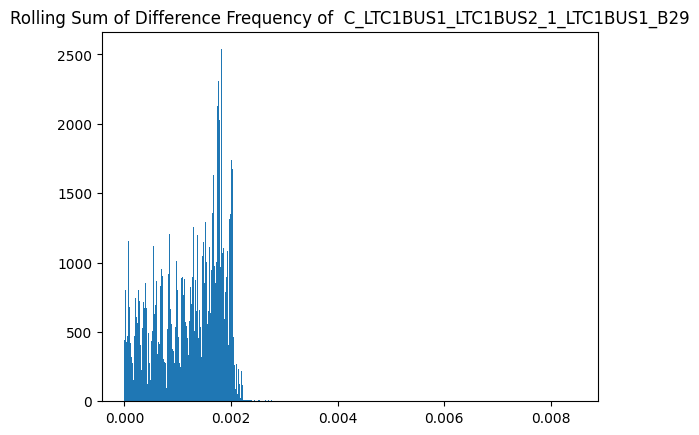

******************************************************************************


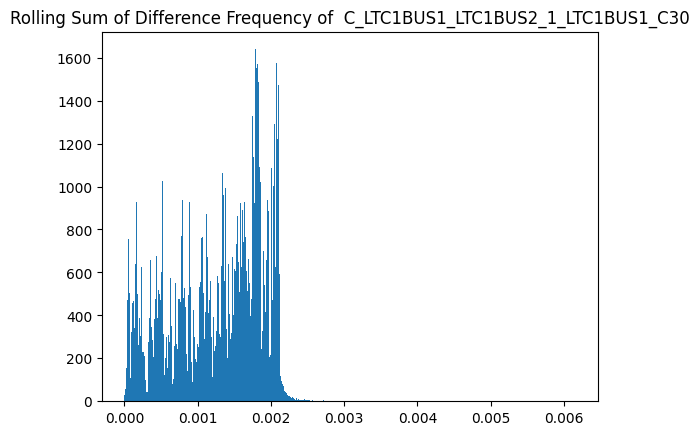

******************************************************************************


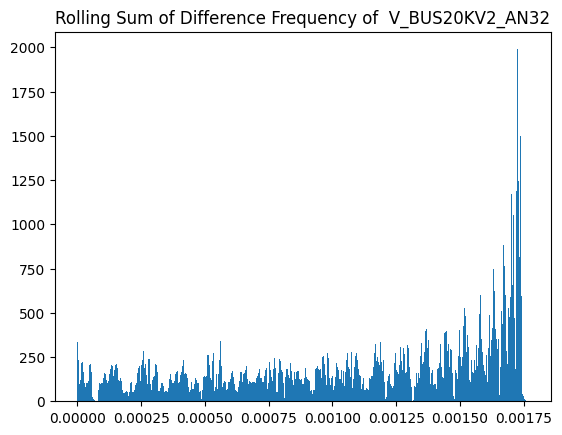

******************************************************************************


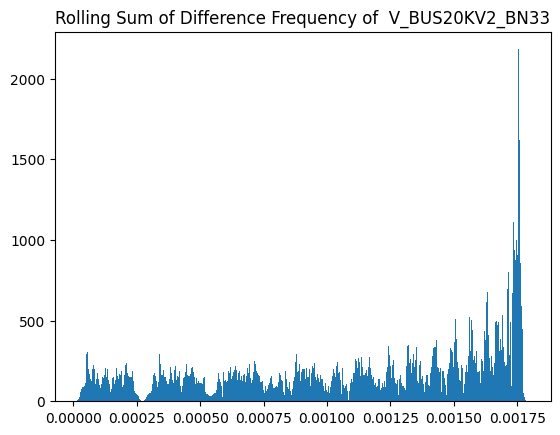

******************************************************************************


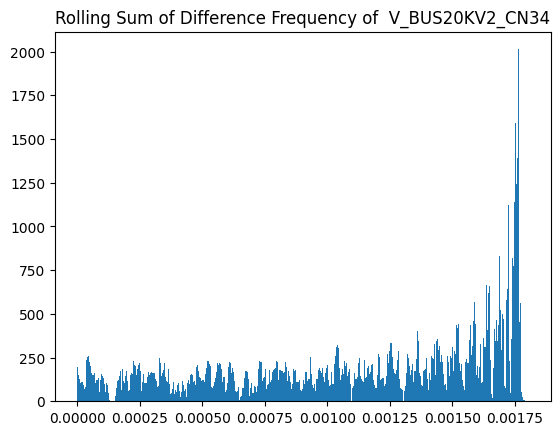

******************************************************************************


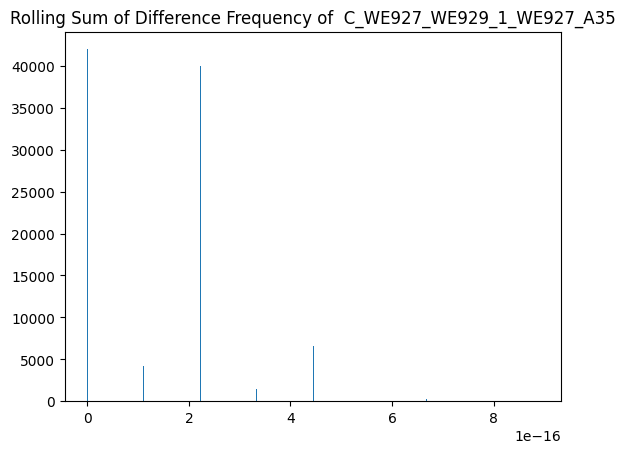

******************************************************************************


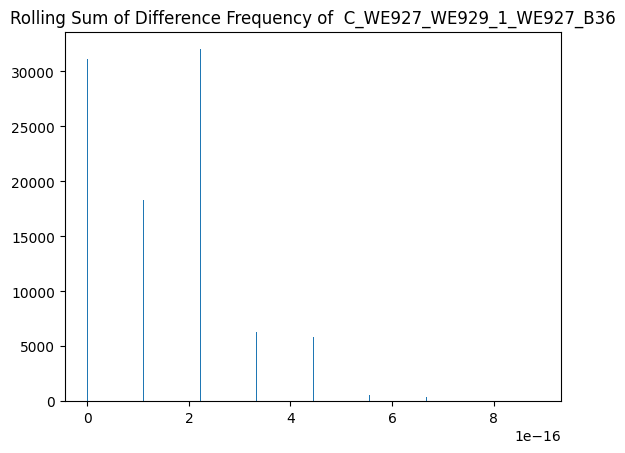

******************************************************************************


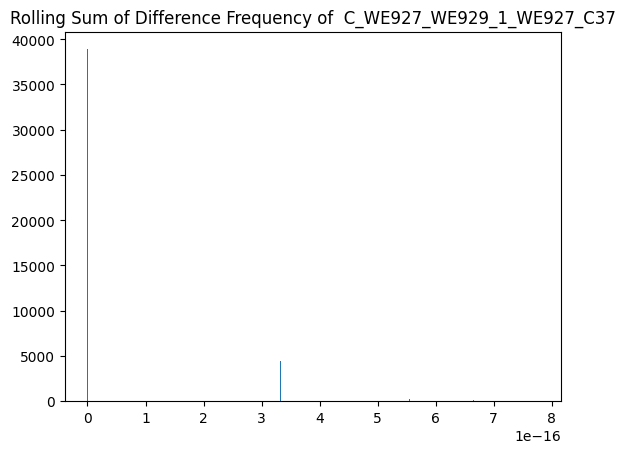

******************************************************************************


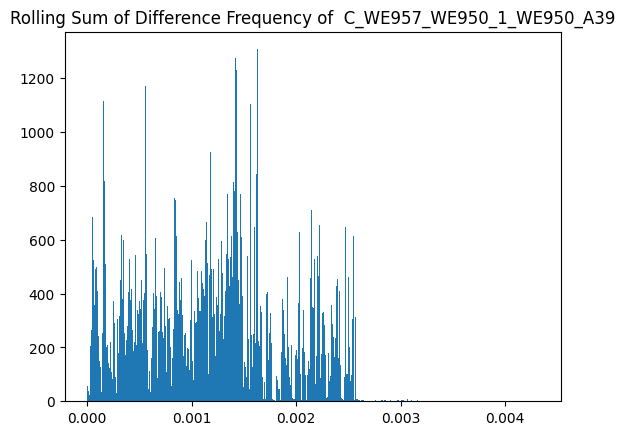

******************************************************************************


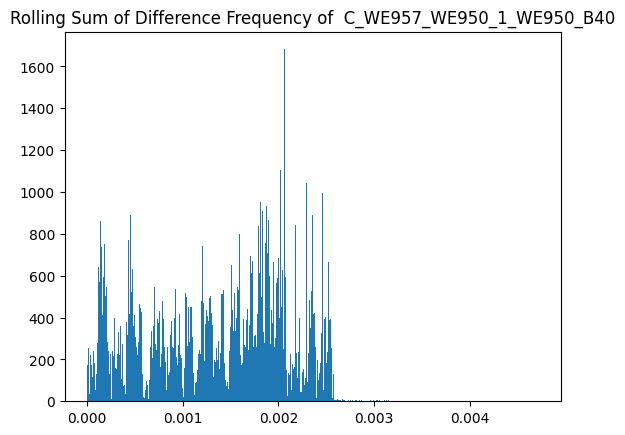

******************************************************************************


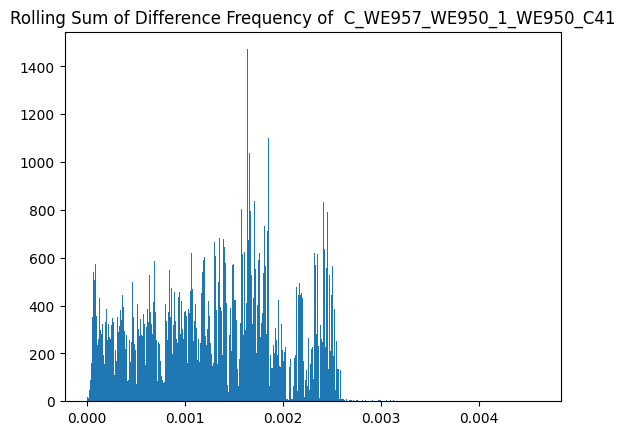

******************************************************************************


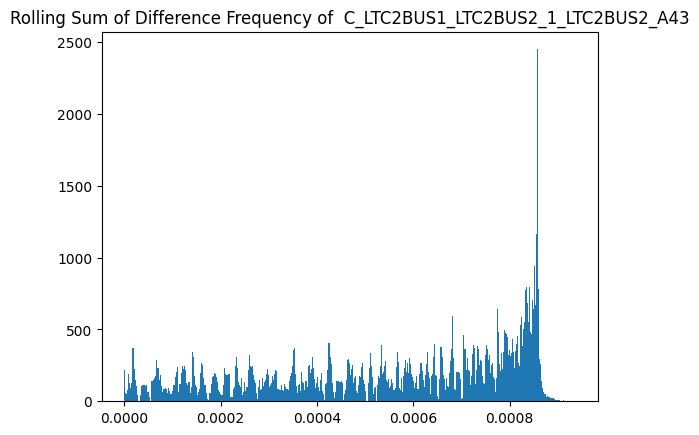

******************************************************************************


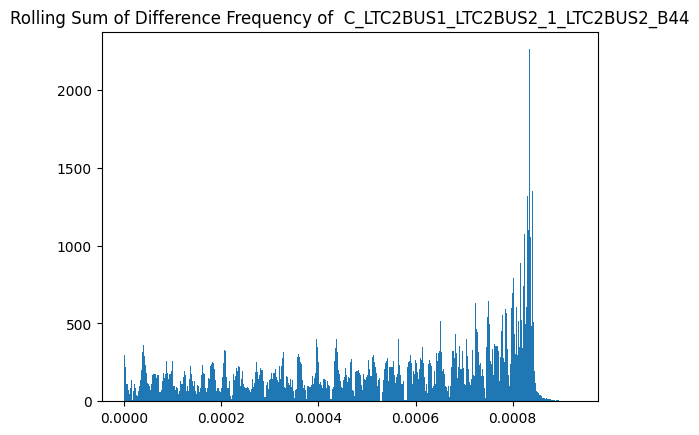

******************************************************************************


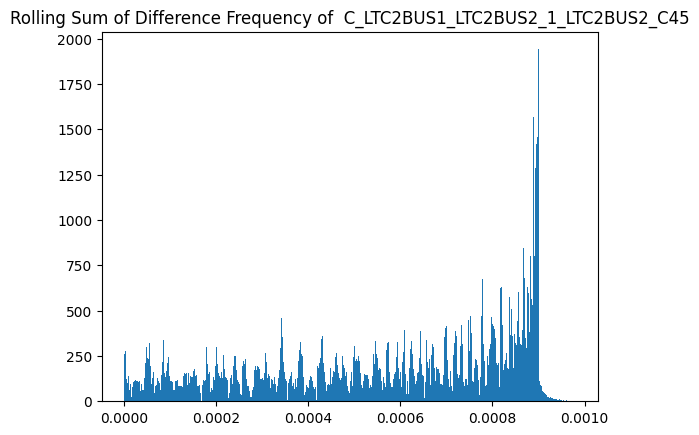

******************************************************************************


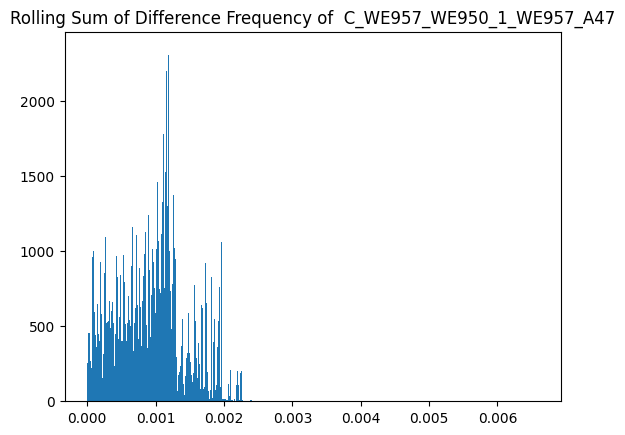

******************************************************************************


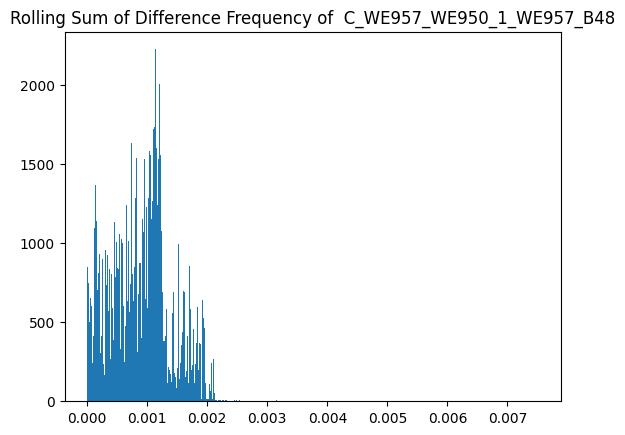

******************************************************************************


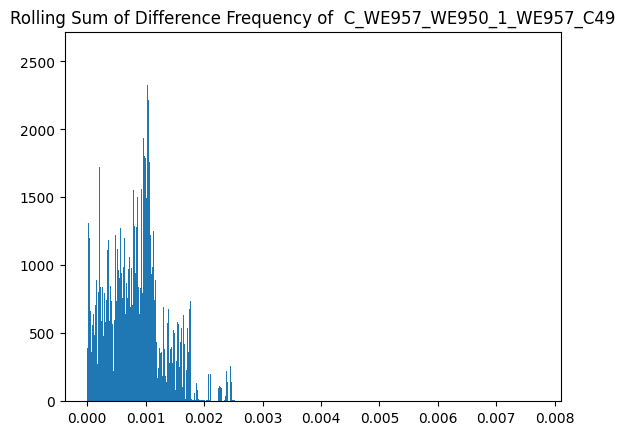

******************************************************************************


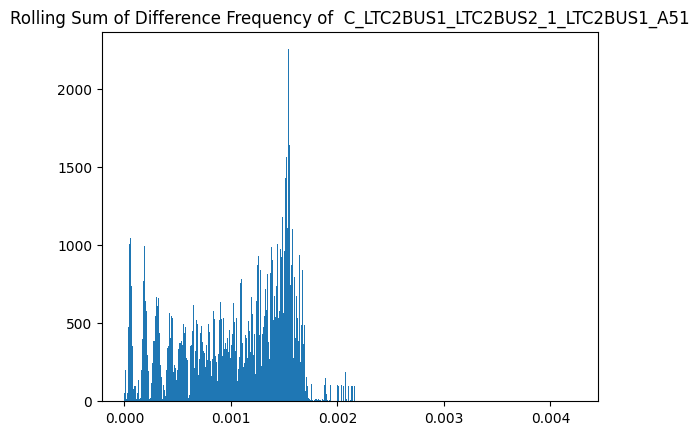

******************************************************************************


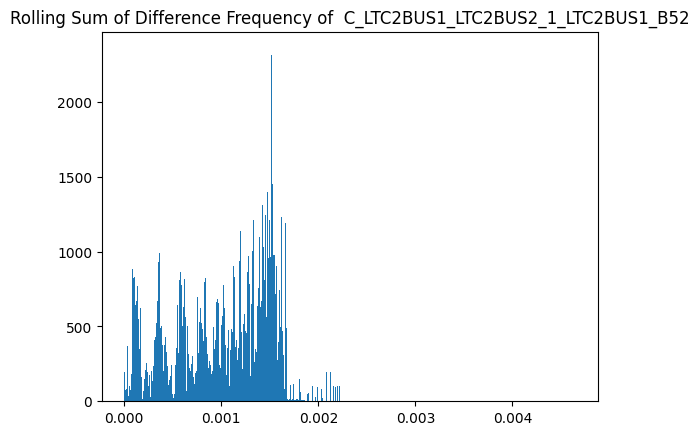

******************************************************************************


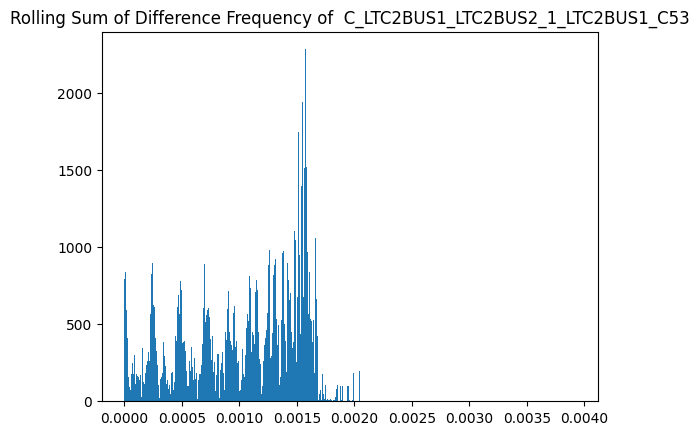

******************************************************************************


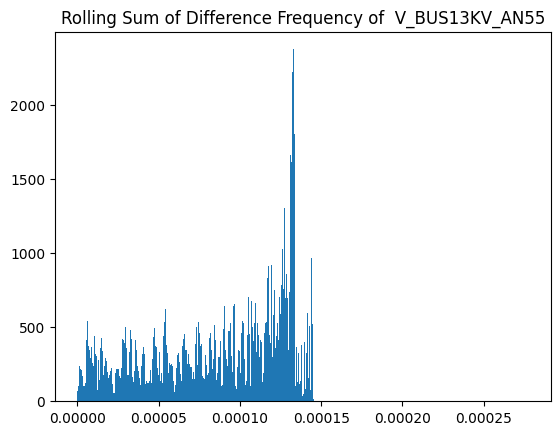

******************************************************************************


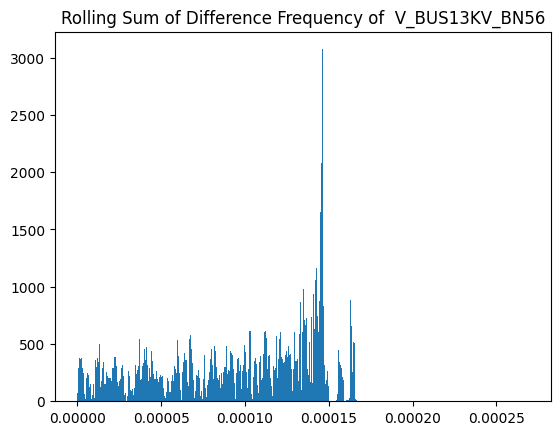

******************************************************************************


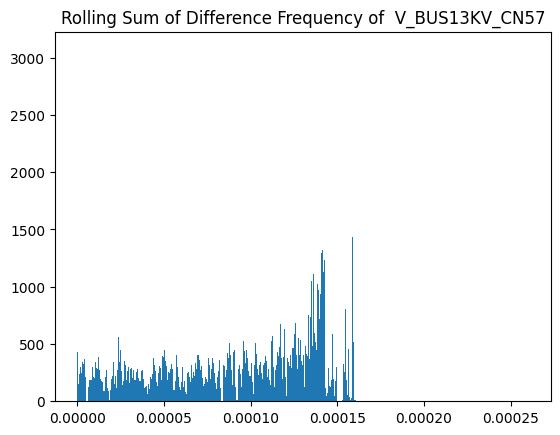

******************************************************************************


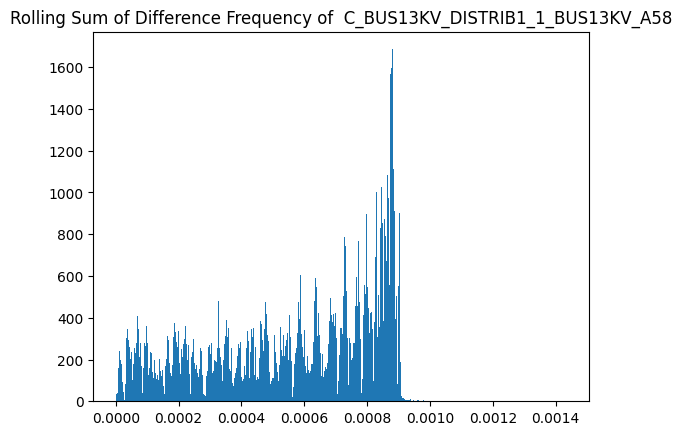

******************************************************************************


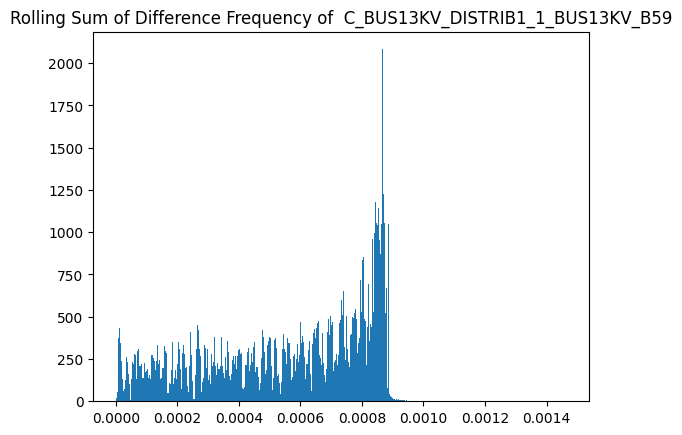

******************************************************************************


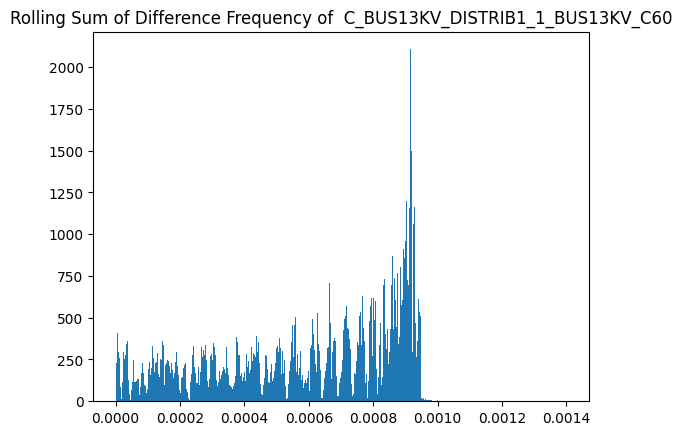

******************************************************************************


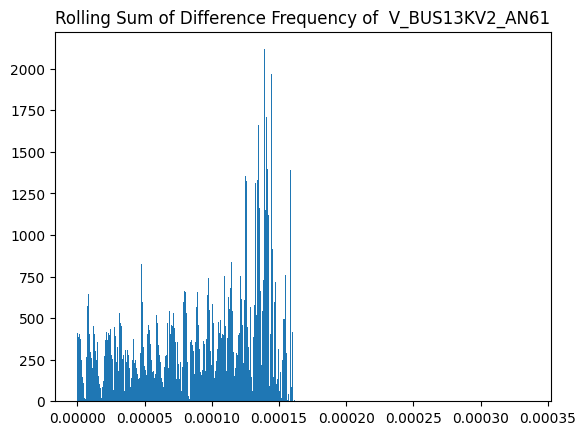

******************************************************************************


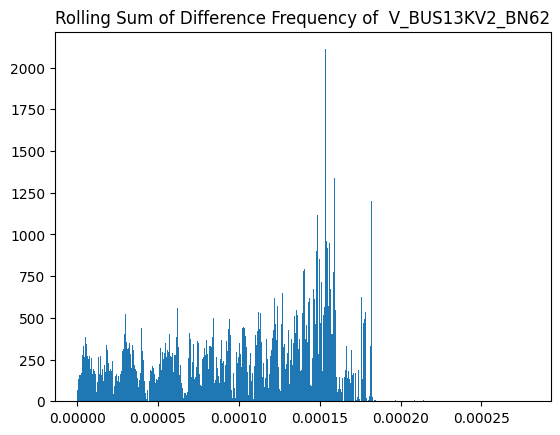

******************************************************************************


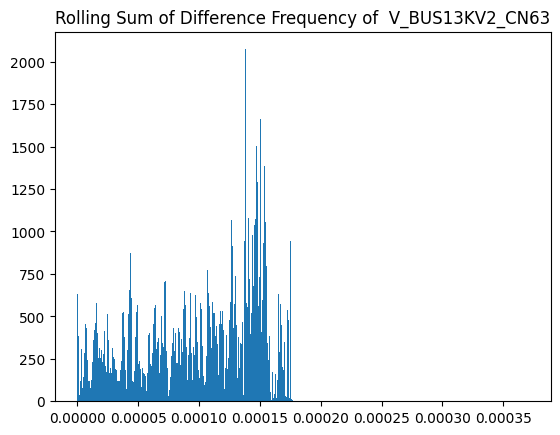

******************************************************************************


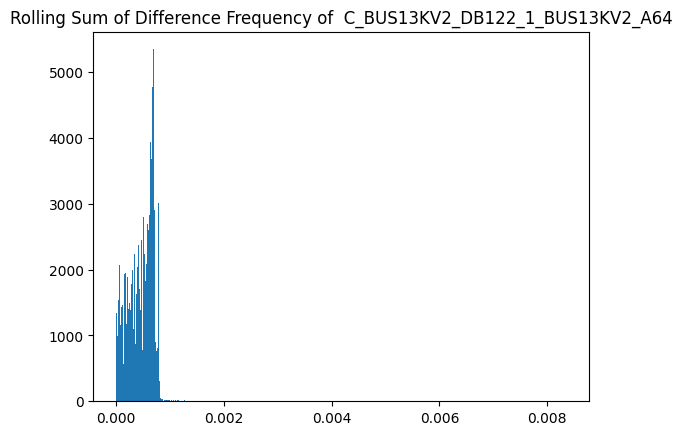

******************************************************************************


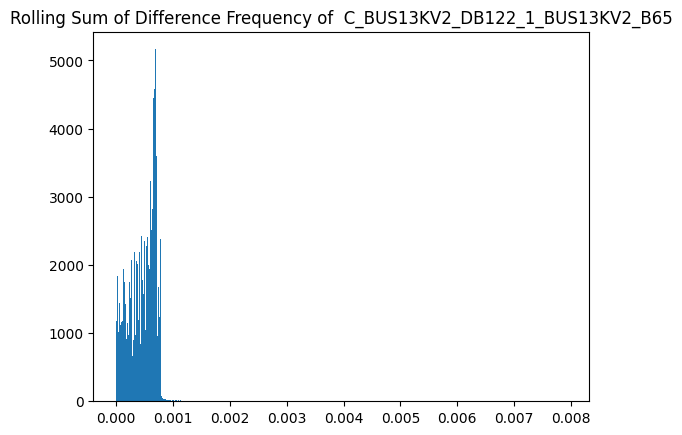

******************************************************************************


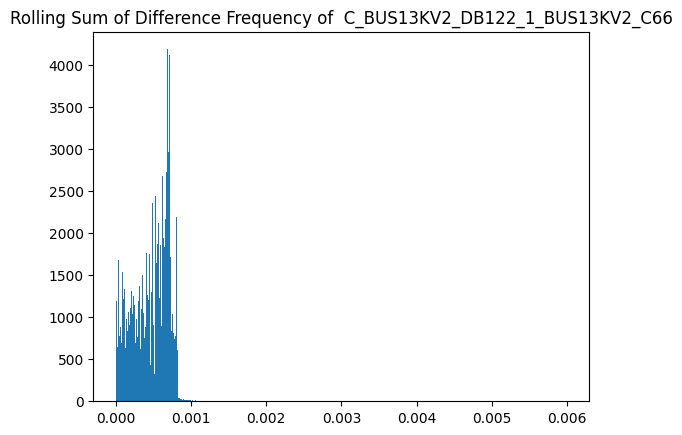

******************************************************************************


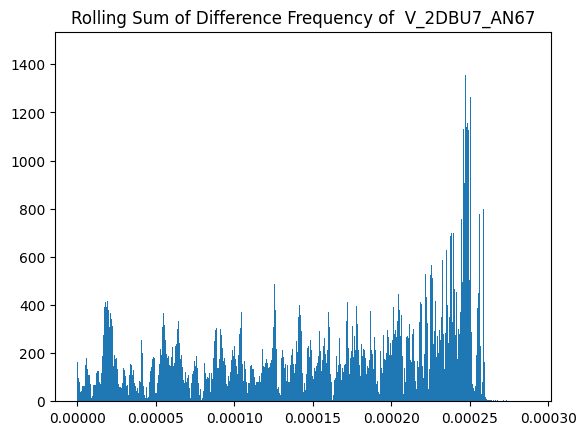

******************************************************************************


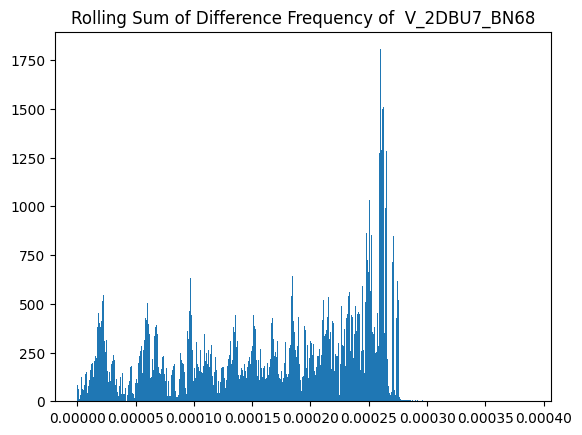

******************************************************************************


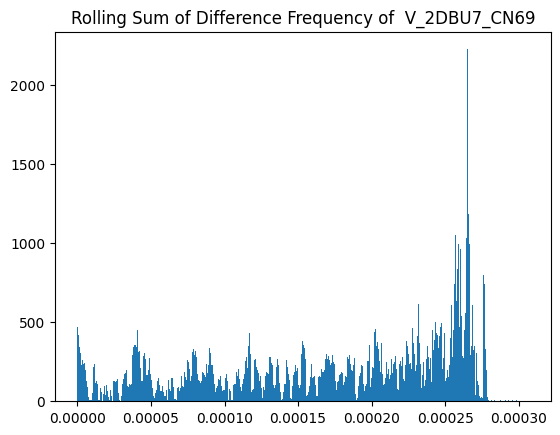

******************************************************************************


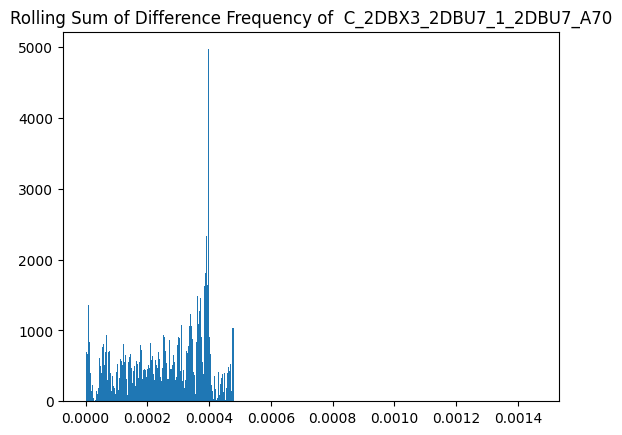

******************************************************************************


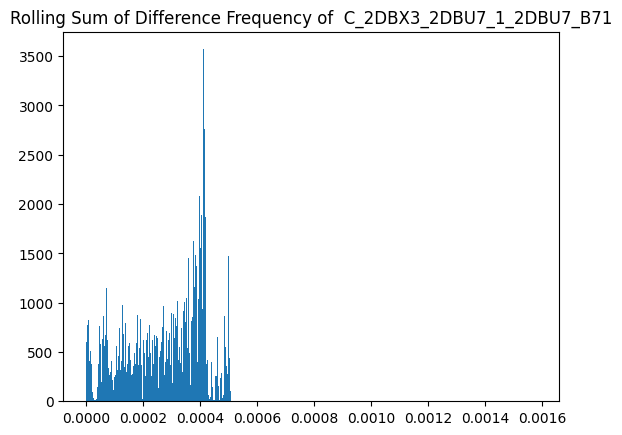

******************************************************************************


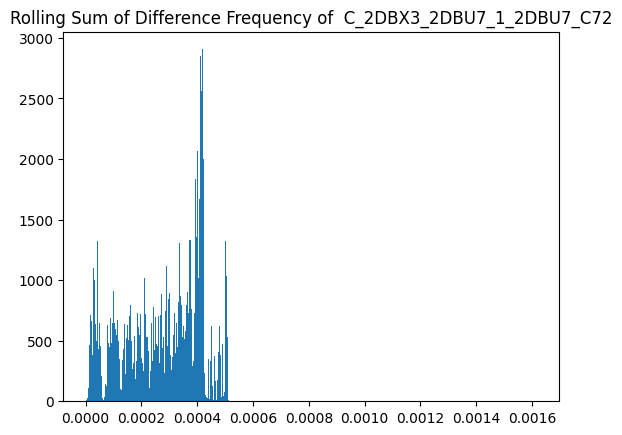

******************************************************************************


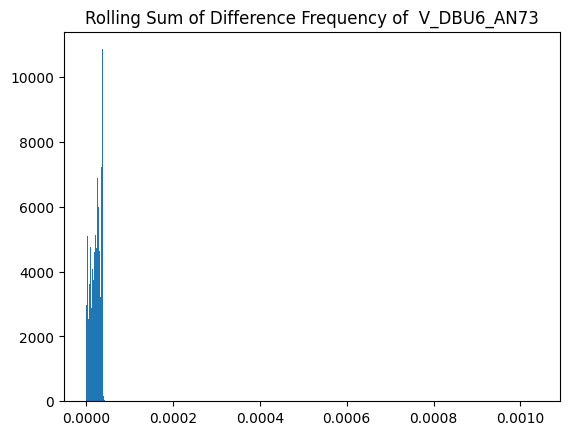

******************************************************************************


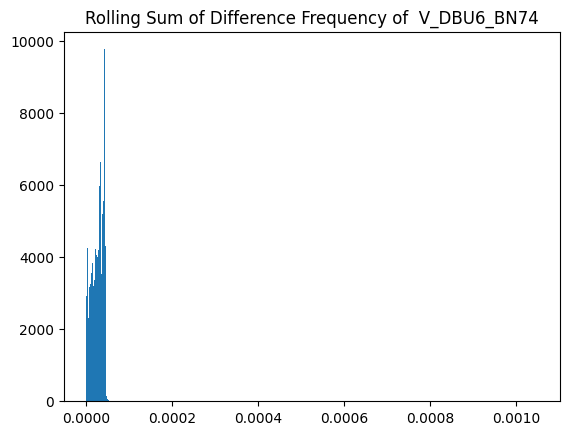

******************************************************************************


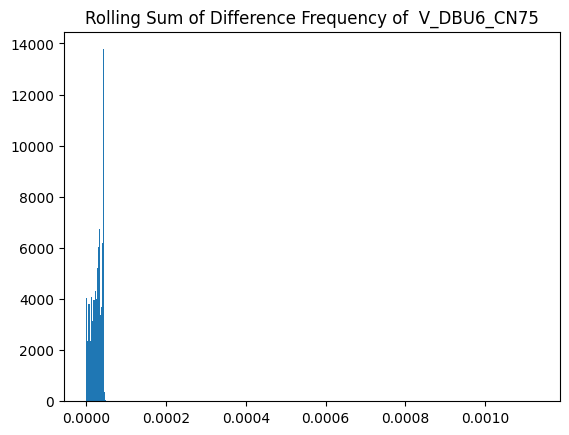

******************************************************************************


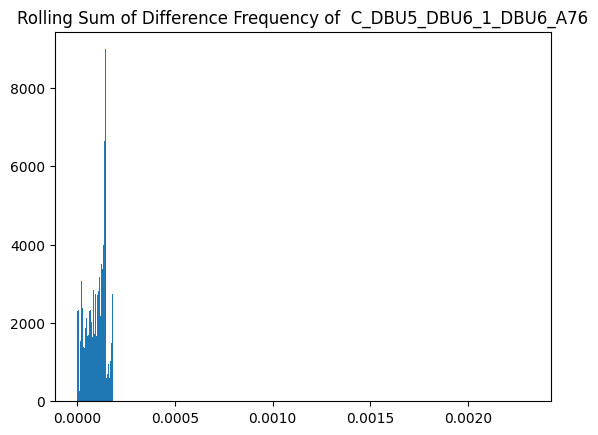

******************************************************************************


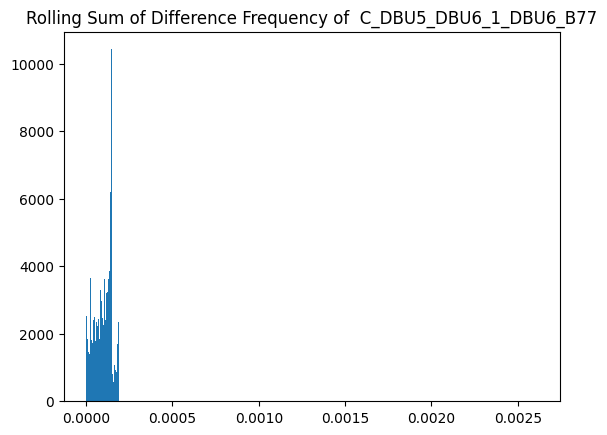

******************************************************************************


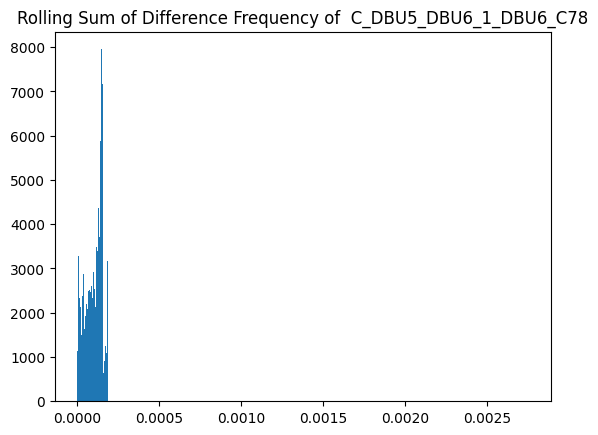

******************************************************************************


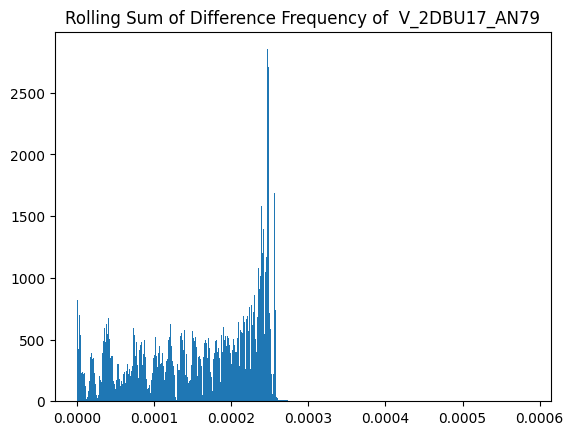

******************************************************************************


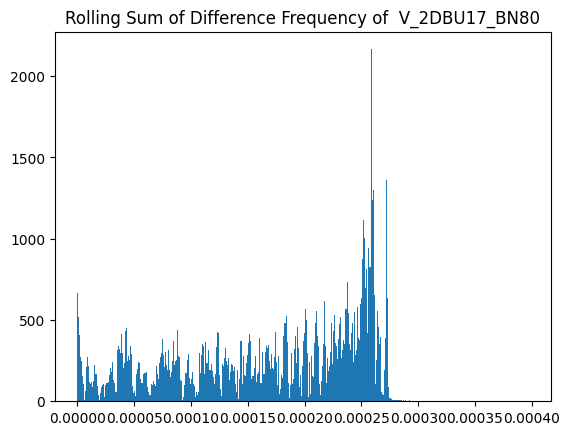

******************************************************************************


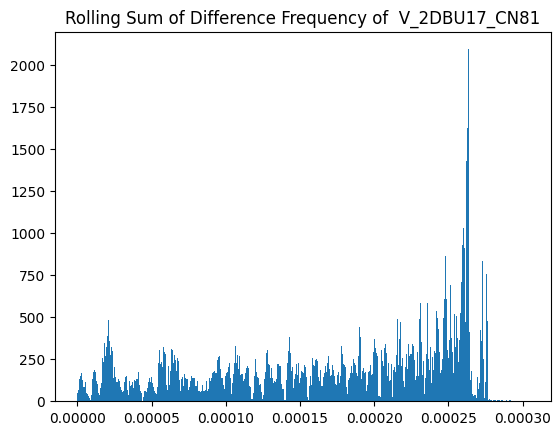

******************************************************************************


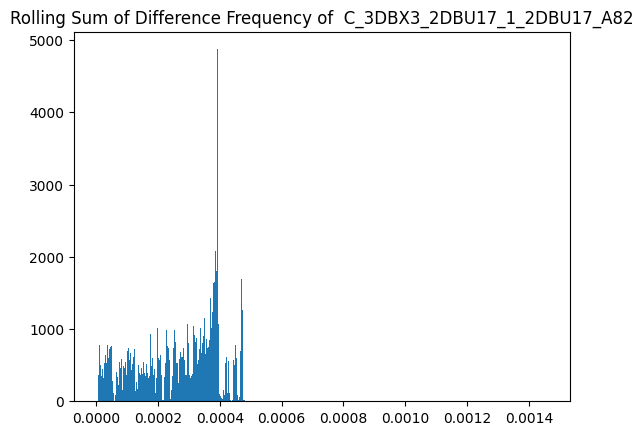

******************************************************************************


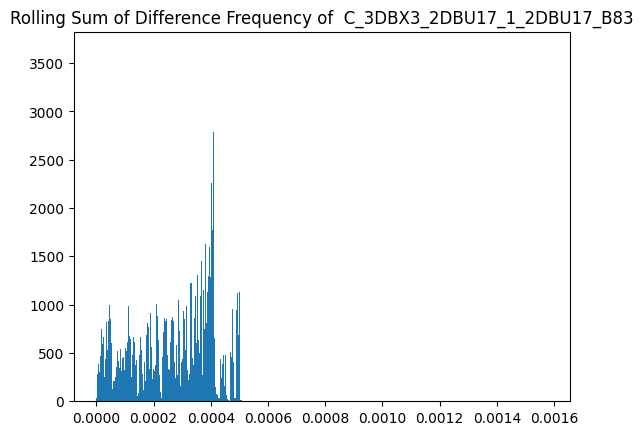

******************************************************************************


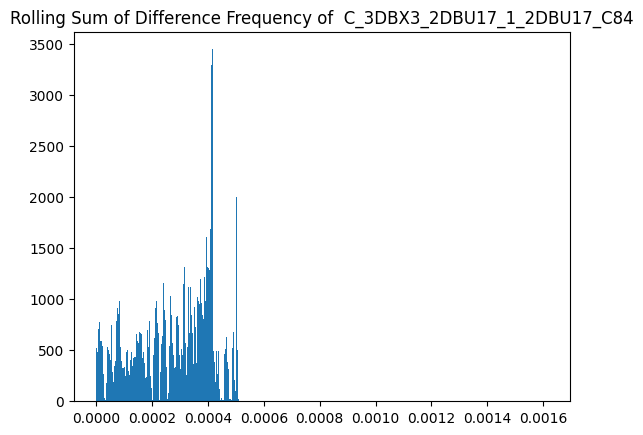

******************************************************************************


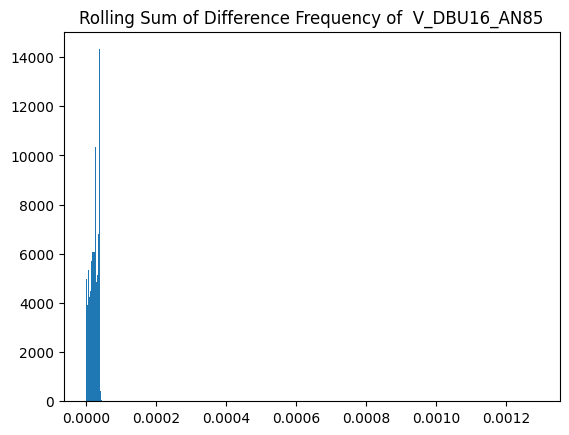

******************************************************************************


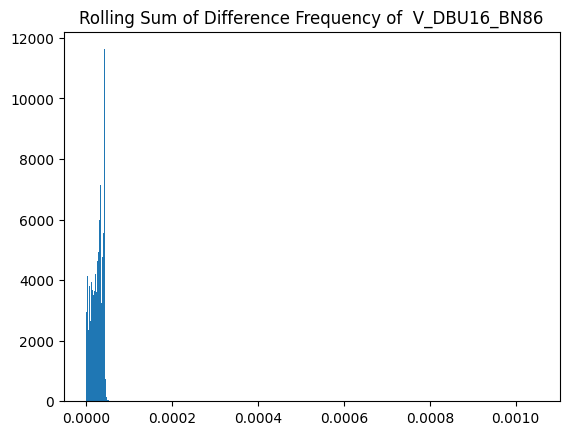

******************************************************************************


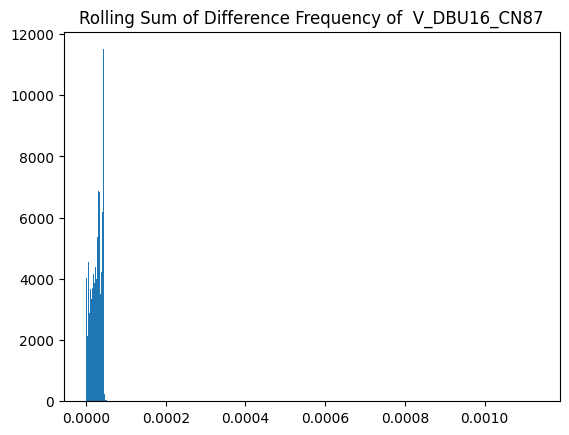

******************************************************************************


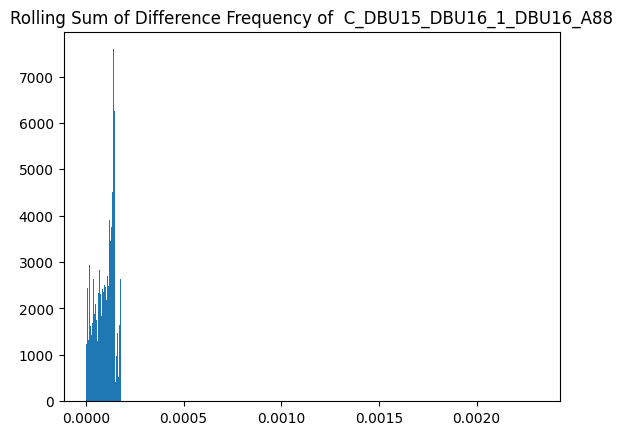

******************************************************************************


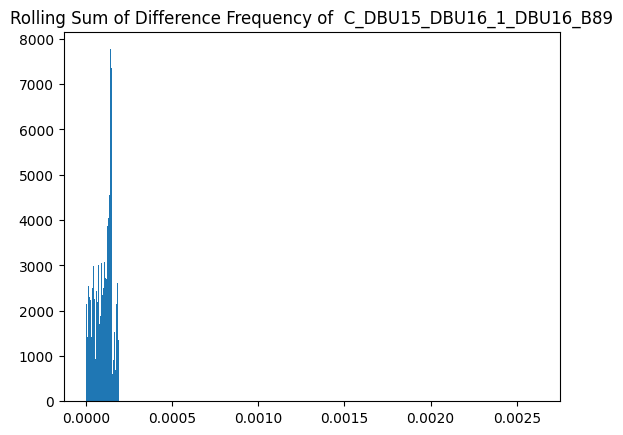

******************************************************************************


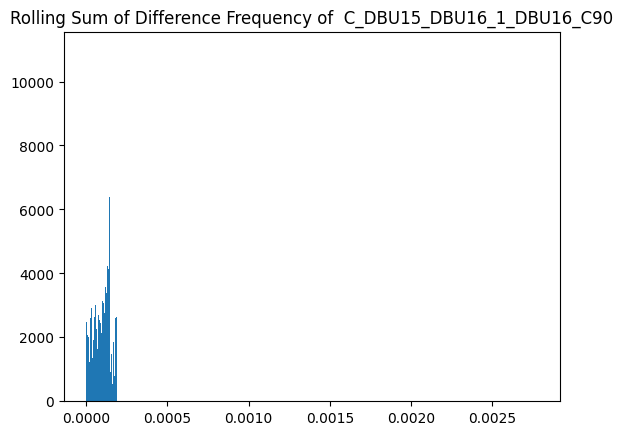

******************************************************************************


In [156]:
# do analysis for multi plot
thresholds_corr_99 = []
# thresholds2 = []
cols = data.columns

# correlation window
window = 350

# rolling sum window
w = 1

quant = 0.999

for i, (var1_index, var2_indices) in enumerate(adj_list.items()):

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_multi = corr_multi_list[i]
    thresholds_corr_99.append(
        get_empirical_diff_threshold(stat=corr_multi, window=w, fn=roll_sum, axis=-1, quantile=quant,
                                     sensor_names=[var1_index]))

#     thresholds2.append(get_threshold(stat=corr_multi, window=w, fn=roll_sum, axis=-1, quantile=1-quant))
    print("******************************************************************************")



In [157]:
len(corr_multi_list)

81

### Testing Data

In [158]:
y_true = np.zeros(len(data_test))
for start, end in all_attack_indices:
    y_true[slice(start, end)] = 1

In [159]:
cov_list = []

w = 1

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    cov_multi = covariance_multi(data_test, var1_index, var2_indices, window=350)
    cov_list.append(
        roll_sum(stat=cov_multi,window=w, axis=0)
    )

rsum_list_cov = np.array(cov_list)




In [160]:
corr_list = []

w = 1

for var1_index, var2_indices in adj_list.items():

    var1_index -= 1
    var2_indices = np.array(var2_indices) - 1

    corr_multi = correlation_multi(data_test, var1_index, var2_indices, window=350)
    corr_list.append(
        roll_sum(stat=corr_multi, window=w, axis=0)
    )

rsum_list_corr = np.array(corr_list)

In [161]:
things = []
for i in adj_list:
  things+=[i]

In [162]:
def persistency_check(attack_window, persistency):
    # check for persistency
    if len(attack_window) < persistency:
        return None
    if persistency == 1:
        return attack_window[0]
    windows = np.lib.stride_tricks.sliding_window_view(attack_window, persistency)
    # check if timesteps are consecutive
#     print(windows.shape)
#     print(np.diff(windows, axis=0).shape)
    diff_windows = (np.diff(windows, axis=0) == 1).all(axis=1).squeeze()
#     print(diff_windows.shape)
#     attacks = np.argmax(diff_windows)

    # indices of persistent detection
    attacks = diff_windows.nonzero()[0]
#     print(attacks)

    if len(attacks) == 0:
        return None

    detection = windows[attacks[0]]
    return detection[-1]


# def localisation_delay(start_of_attack, end_of_attack, attack_pred, window, w, persistency):

#     start = start_of_attack - window - w + 1
#     end = end_of_attack + window + w - 1

#     # get all indices that are after the start of attack
#     idx = np.logical_and((attack_pred >= start), (attack_pred <= end))
#     attack_window = attack_pred[idx]

#     # check for persistency
#     return persistency_check(attack_window, persistency)


def detection_delay(detection, attack_times, window, w, persistency=5):
    detection_idx = []
    attack_pred = detection.nonzero()[0]
#     if not localise:
#         detection = violations.any(axis=1)
#     else:
#         detection = attack_times.squeeze()
    for start, end in attack_times:
#         print(start, end)
        start_w = start - window - w + 1
        end_w = end + window + w - 1
        # get all indices that are after the start of attack
        indices = np.logical_and((attack_pred >= start_w), (attack_pred <= end_w))
#         print(idx.sum())
#         print(attack_pred.shape())
        attack_window = attack_pred[indices]
#         print(attack_window)

        # check for persistency
        idx = persistency_check(attack_window, persistency)
        if idx is not None:
            idx -= start_w
        detection_idx.append(idx)
    return detection_idx

In [163]:
attacks = {}

for sensor, (start, end, attack_type, sensor_name) in attack_dict.items():
    if sensor in emptyr:
        continue
    neighbour_list = [sensor] + adj_list[sensor]
    try:
        attacks[start].append(neighbour_list)
    except:
        attacks[start] = [neighbour_list]
attacks

{1.1: [[52, 44, 59, 48, 15], [53, 45, 60, 49, 16], [54, 17, 50, 46, 61]],
 5.0: [[5, 12, 26, 19, 62]],
 6.6: [[66, 2, 30, 90, 84, 63]],
 9.0: [[68, 56, 74, 71],
  [69, 57, 75, 72],
  [70, 58, 76, 73],
  [71, 59, 77, 68],
  [72, 60, 78, 69],
  [73, 79, 61, 70]],
 10.5: [[36, 22], [37, 23], [38, 24]],
 16.2: [[77, 74, 59, 71], [78, 60, 72, 75], [79, 61, 73, 76]],
 17.4: [[86, 62, 80, 89], [87, 63, 81, 90], [88, 64, 82, 91]]}

In [164]:
attack_start_times = sorted(attacks.keys())
attack_start_times

[1.1, 5.0, 6.6, 9.0, 10.5, 16.2, 17.4]

In [165]:
hops = {}
types = 1.1
for key, value in attack_dict.items():
  if types == value[0]:
    if value[1] not in hops:
      hops[value[1]]= [key]
    else:
      hops[value[1]] += [key]
  else:
    types = value[0]
    hops[value[1]]= [key]

In [166]:
stu = []
for i in hops:
  stu += [i]

In [167]:
all_attack_indice = []
for i in all_attack_indices:
  all_attack_indice += [i]
sorted(all_attack_indice)

[(4080, 8879),
 (22800, 27119),
 (30480, 36239),
 (42000, 47279),
 (49200, 54959),
 (76560, 80399),
 (82320, 86639)]

In [168]:
attacks_in = {}
co = 0
for key, value in attacks.items():
  attacks_in[sorted(all_attack_indice)[co][0]] = value
  co+=1

In [169]:
def localisation_delay(detection, attack_times, window, w, persistency=5):
    detection_idx = []
    attack_pred = detection.nonzero()
#     if not localise:
#         detection = violations.any(axis=1)
#     else:
#         detection = attack_times.squeeze()
    for i, (start, end) in enumerate(attack_times):
        localisation_idx = []
#         print(start, end)
        start_w = start - window - w + 1
        end_w = end + window + w - 1
        # get all indices that are after the start of attack
        indices = np.logical_and((attack_pred[1] >= start_w), (attack_pred[1] <= end_w))
#         print(idx.sum())
#         print(attack_pred.shape())
        attack_window = attack_pred[1][indices]
        attack_sensors = attack_pred[0][indices]

        sensor_list = attacks[attack_start_times[i]]

        for sensor_nbd in sensor_list:

            sensor_nbd_indices = np.isin(attack_sensors, sensor_nbd)
            sensor_nbd_attack_window = attack_window[sensor_nbd_indices]

#         print(attack_window)

            # check for persistency
            idx = persistency_check(attack_window, persistency)
            if idx is not None:
                idx -= start_w
            localisation_idx.append(idx)
        detection_idx.append(localisation_idx)
    return detection_idx

In [170]:
persistency = 1

In [171]:
total_normal = rsum_list_corr.shape[1] - persistency + 1
for start, end in all_attack_indices:
    total_normal -= (end - start + 1 + 2 * (window + w - 1))
print(total_normal)


def persistency_check_fpr(attack_window, persistency):
    # check for persistency
    if len(attack_window) < persistency:
        return 0
    if persistency == 1:
        return len(attack_window)
    windows = np.lib.stride_tricks.sliding_window_view(attack_window, persistency)
    # check if timesteps are consecutive
#     print(windows.shape)
#     print(np.diff(windows, axis=0).shape)
#     print((np.diff(windows, axis=0) == 1).all(axis=1).shape)
    return (np.diff(windows, axis=0) == 1).all(axis=1).sum()
#     print(diff_windows.shape)
#     attacks = np.argmax(diff_windows)

    # indices of persistent detection
#     attacks = diff_windows.nonzero()[0]
#     print(attacks)

#     if len(attacks) == 0:
#         return None

#     detection = windows[attacks[0]]
#     return detection[-1]


def FPR(violations, attack_times, window, w, total_normal, persistency):

    attack_pred = (violations)

    shift = window + w - 1

    # go from back to prevent index issue when removing
    attack_times = sorted(list(attack_times), reverse=True)

    for start, end in attack_times:
        start_w = start - shift
        end_w = end + shift
        attack_indices = np.arange(start_w, end_w+1)
#         print("attack_pred:", attack_pred.shape)
#         print("attack_indices:", attack_indices.shape)
        attack_pred = np.delete(attack_pred, attack_indices)

    attack_num = persistency_check_fpr(attack_pred.nonzero()[0], persistency)

    return attack_num / total_normal


#   FPR = []
#   for sensor, ind in at_neighbor.items():
#     for i in ind:
#       x = i
#       if (x >= 4080-350 and x<= 8879+350) or (x>=30480-350 and x<=36239+350) or (x>=82320-350 and x<=86639+350) or (x>=76560-350 and x<=80399+350) or (x>=49200-350 and x<=54959+350) or (x>=22800-350 and x<=27119+350) or (x>=42000-350 and x<=47279+350):
#         continue
#       else:
#         print(i)
#         print(sensor)
#         FPR += [(sensor,i)]
#   return FPR

55474


Visualization of the rolling sum of the correlation

In [172]:
persistency = 1

thresholds_cov = np.array(thresholds_cov)

# each row is sensor, each col is timestep
violations_cov = (rsum_list_cov > thresholds_cov.reshape(-1, 1))
ADD_cov = detection_delay(violations_cov.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD_cov

[285, 17, 4, 0, None, None, 240]

In [173]:
ADD_cov

[285, 17, 4, 0, None, None, 240]

In [174]:
persistency = 1

thresholds_cov_99 = np.array(thresholds_cov_99)

# each row is sensor, each col is timestep
violations_cov = (rsum_list_cov > thresholds_cov_99.reshape(-1, 1))
ADD_cov = detection_delay(violations_cov.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD_cov

[284, 14, 3, 0, None, None, 0]

In [175]:
persistency = 1

thresholds_cov_99 = np.array(thresholds_cov_99)

# each row is sensor, each col is timestep
violations_cov = (rsum_list_cov > thresholds_cov_99.reshape(-1, 1))
LD_cov = localisation_delay(violations_cov, sorted(list(all_attack_indices)), window, w, persistency)
LD_cov

[[1280, 1280, 1280],
 [18],
 [3],
 [0, 0, 0, 0, 0, 0],
 [None, None, None],
 [None, None, None],
 [293, 293, 293]]

In [176]:
violations_cov.any(axis=0).shape

(94454,)

In [177]:
fpr_cov = FPR(violations_cov.any(axis=0), all_attack_indices, window, w, total_normal, persistency=5)
fpr_cov

0.0

In [178]:
fpr_cov_l = []
for v in violations_cov:
    fpr_cov_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=5))
fpr_cov_l, np.mean(fpr_cov_l)

([0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0],
 0.0)

In [179]:
persistency = 1

thresholds_corr = np.array(thresholds_corr)

# each row is sensor, each col is timestep
violations_corr = (rsum_list_corr > thresholds_corr.reshape(-1, 1))
ADD_corr = detection_delay(violations_corr.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD_corr

[4798, 0, 0, 0, 0, None, 3802]

In [180]:
ADD_corr

[4798, 0, 0, 0, 0, None, 3802]

In [181]:
persistency = 1

thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
violations_corr = (rsum_list_corr > thresholds_corr_99.reshape(-1, 1))
ADD_corr = detection_delay(violations_corr.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD_corr

[67, 0, 0, 0, 0, 366, 3467]

In [182]:
# combined
persistency = 5

thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
violations = np.logical_or(violations_corr, violations_cov)
ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD

[300, 11, 4, 4, 4, None, None]

In [183]:
# combined
persistency = 1

thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
violations = np.logical_or(violations_corr, violations_cov)
ADD = detection_delay(violations.any(axis=0), sorted(list(all_attack_indices)), window, w, persistency)
ADD

[67, 0, 0, 0, 0, 366, 0]

In [184]:
np.mean(ADD)

61.857142857142854

In [185]:
persistency = 1

thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
violations_corr = (rsum_list_corr > thresholds_corr_99.reshape(-1, 1))
LD_corr = localisation_delay(violations_corr, sorted(list(all_attack_indices)), window, w, persistency)
LD_corr

[[400, 400, 400],
 [0],
 [1],
 [1816, 1816, 1816, 1816, 1816, 1816],
 [0, 0, 0],
 [366, 366, 366],
 [3467, 3467, 3467]]

In [186]:
persistency = 5

thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
violations_corr = (rsum_list_corr > thresholds_corr_99.reshape(-1, 1))
LD_corr = localisation_delay(violations_corr, sorted(list(all_attack_indices)), window, w, persistency)
LD_corr

[[4827, 4827, 4827],
 [18],
 [5],
 [17, 17, 17, 17, 17, 17],
 [4, 4, 4],
 [None, None, None],
 [None, None, None]]

In [187]:
# combined
persistency = 1

# thresholds_corr_99 = np.array(thresholds_corr_99)

# each row is sensor, each col is timestep
LD = localisation_delay(violations, sorted(list(all_attack_indices)), window, w, persistency)
LD

[[1280, 1280, 1280],
 [0],
 [1],
 [1816, 1816, 1816, 1816, 1816, 1816],
 [0, 0, 0],
 [366, 366, 366],
 [3467, 3467, 3467]]

In [188]:
np.mean(np.concatenate(LD))

1311.8

In [189]:
np.mean(np.concatenate(LD)) * 208.5 * 1e-6

0.2735103

In [190]:
fpr_corr = FPR(violations_corr.any(axis=0), all_attack_indices, window, w, total_normal, persistency=1)
fpr_corr

0.02813930850488517

In [191]:
fpr_corr = FPR(violations_corr.any(axis=0), all_attack_indices, window, w, total_normal, persistency=5)
fpr_corr

0.008490464001153693

In [192]:
fpr = FPR(violations.any(axis=0), all_attack_indices, window, w, total_normal, persistency=5)
fpr

0.008905072646645276

In [193]:
fpr_corr_l = []
for v in violations_corr:
    fpr_corr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=5))
fpr_corr_l, np.mean(fpr_corr_l)

([0.0003244763312542813,
  0.00034250279410174135,
  0.00027039694271190106,
  0.0,
  0.0,
  0.0,
  0.0005588203482712622,
  0.0005407938854238021,
  0.0005588203482712622,
  0.0,
  0.0,
  0.0,
  0.00046868803403396183,
  0.0005407938854238021,
  0.00048671449688142193,
  0.0,
  0.0,
  0.0,
  7.210585138984029e-05,
  1.8026462847460072e-05,
  0.00016223816562714065,
  0.0,
  0.0,
  0.0,
  0.00028842340555936116,
  0.000252370479864441,
  0.0003064498684068212,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0003785557197966615,
  0.00041460864549158164,
  0.0005948732739661823,
  0.0,
  0.0,
  0.0,
  3.6052925694920145e-05,
  5.407938854238022e-05,
  1.8026462847460072e-05,
  0.0,
  0.0,
  0.0,
  7.210585138984029e-05,
  1.8026462847460072e-05,
  1.8026462847460072e-05,
  9.013231423730036e-05,
  0.00010815877708476043,
  7.210585138984029e-05,
  7.210585138984029e-05,
  3.6052925694920145e-05,
  1.8026462847460072e-05,
  0.0003965821826441216,
  0.0004506615711865018,
  0.00043263510833

In [194]:
fpr_l = []
for v in violations:
    fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=5))
fpr_l, np.mean(fpr_l)

([0.0003244763312542813,
  0.00034250279410174135,
  0.00027039694271190106,
  0.0,
  0.0,
  0.0,
  0.0005588203482712622,
  0.0005407938854238021,
  0.0005588203482712622,
  0.0,
  0.0,
  0.0,
  0.00046868803403396183,
  0.0005407938854238021,
  0.00048671449688142193,
  0.0,
  0.0,
  0.0,
  7.210585138984029e-05,
  1.8026462847460072e-05,
  0.00016223816562714065,
  0.0,
  0.0,
  0.0,
  0.00028842340555936116,
  0.000252370479864441,
  0.0003064498684068212,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0,
  0.0003785557197966615,
  0.00041460864549158164,
  0.0005948732739661823,
  0.0,
  0.0,
  0.0,
  3.6052925694920145e-05,
  5.407938854238022e-05,
  1.8026462847460072e-05,
  0.0,
  0.0,
  0.0,
  7.210585138984029e-05,
  1.8026462847460072e-05,
  1.8026462847460072e-05,
  9.013231423730036e-05,
  0.00010815877708476043,
  7.210585138984029e-05,
  7.210585138984029e-05,
  3.6052925694920145e-05,
  1.8026462847460072e-05,
  0.0003965821826441216,
  0.0004506615711865018,
  0.00043263510833

In [195]:
fpr_l = []
for v in violations:
    fpr_l.append(FPR(v, all_attack_indices, window, w, total_normal, persistency=1))
fpr_l, np.mean(fpr_l)

([0.0010635613080001442,
  0.0009734289937628439,
  0.001045534845152684,
  0.0012257994736272848,
  0.0021631755416952085,
  0.0031005516097631323,
  0.001514222879186646,
  0.0013339582507120452,
  0.0016043551934239464,
  0.001748566896203627,
  0.002740022352813931,
  0.0032087103868478927,
  0.0008111908281357032,
  0.0008111908281357032,
  0.000757111439593323,
  0.001748566896203627,
  0.002740022352813931,
  0.0032087103868478927,
  0.00041460864549158164,
  0.00018026462847460072,
  0.0007210585138984029,
  0.001748566896203627,
  0.002740022352813931,
  0.0032087103868478927,
  0.0007931643652882432,
  0.0005768468111187223,
  0.0009193496052204637,
  0.0018386992104409273,
  0.0029383134441359916,
  0.0024335724844071096,
  0.00014421170277968058,
  0.000504740959728882,
  0.00016223816562714065,
  0.001730540433356167,
  0.0018206727475934671,
  0.002036990301762988,
  0.0010815877708476042,
  0.001045534845152684,
  0.0011356671593899844,
  0.0001261852399322205,
  0.00021

In [196]:
all_sensors =[]
for i in attacks.values():
  for a in i:
    all_sensors += a
all_sensors

[52,
 44,
 59,
 48,
 15,
 53,
 45,
 60,
 49,
 16,
 54,
 17,
 50,
 46,
 61,
 5,
 12,
 26,
 19,
 62,
 66,
 2,
 30,
 90,
 84,
 63,
 68,
 56,
 74,
 71,
 69,
 57,
 75,
 72,
 70,
 58,
 76,
 73,
 71,
 59,
 77,
 68,
 72,
 60,
 78,
 69,
 73,
 79,
 61,
 70,
 36,
 22,
 37,
 23,
 38,
 24,
 77,
 74,
 59,
 71,
 78,
 60,
 72,
 75,
 79,
 61,
 73,
 76,
 86,
 62,
 80,
 89,
 87,
 63,
 81,
 90,
 88,
 64,
 82,
 91]

In [197]:
attacks

{1.1: [[52, 44, 59, 48, 15], [53, 45, 60, 49, 16], [54, 17, 50, 46, 61]],
 5.0: [[5, 12, 26, 19, 62]],
 6.6: [[66, 2, 30, 90, 84, 63]],
 9.0: [[68, 56, 74, 71],
  [69, 57, 75, 72],
  [70, 58, 76, 73],
  [71, 59, 77, 68],
  [72, 60, 78, 69],
  [73, 79, 61, 70]],
 10.5: [[36, 22], [37, 23], [38, 24]],
 16.2: [[77, 74, 59, 71], [78, 60, 72, 75], [79, 61, 73, 76]],
 17.4: [[86, 62, 80, 89], [87, 63, 81, 90], [88, 64, 82, 91]]}

In [198]:
attack_i = {}
for key, items in attacks_in.items():
  attack_i[key] = []
  for i in items:
    attack_i[key] += i
attack_i

{4080: [52, 44, 59, 48, 15, 53, 45, 60, 49, 16, 54, 17, 50, 46, 61],
 22800: [5, 12, 26, 19, 62],
 30480: [66, 2, 30, 90, 84, 63],
 42000: [68,
  56,
  74,
  71,
  69,
  57,
  75,
  72,
  70,
  58,
  76,
  73,
  71,
  59,
  77,
  68,
  72,
  60,
  78,
  69,
  73,
  79,
  61,
  70],
 49200: [36, 22, 37, 23, 38, 24],
 76560: [77, 74, 59, 71, 78, 60, 72, 75, 79, 61, 73, 76],
 82320: [86, 62, 80, 89, 87, 63, 81, 90, 88, 64, 82, 91]}

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


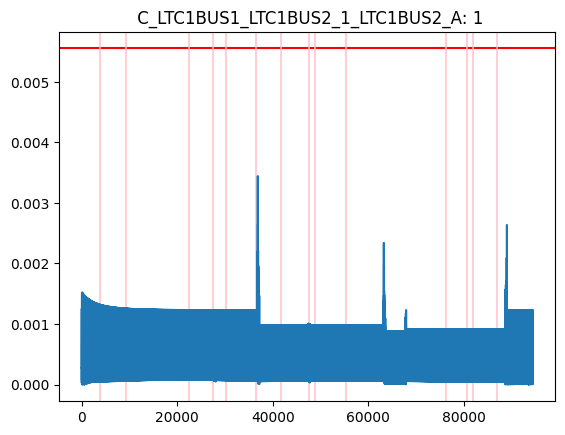

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 1


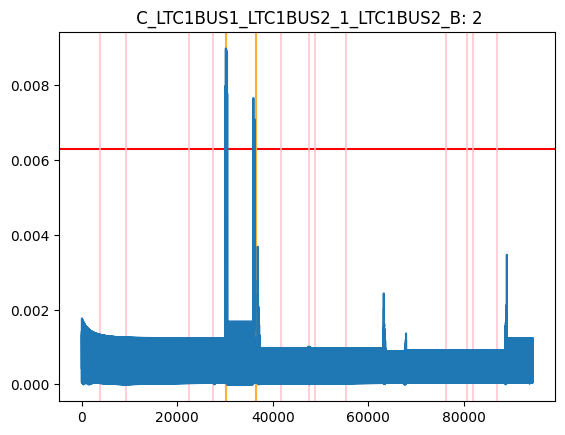

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


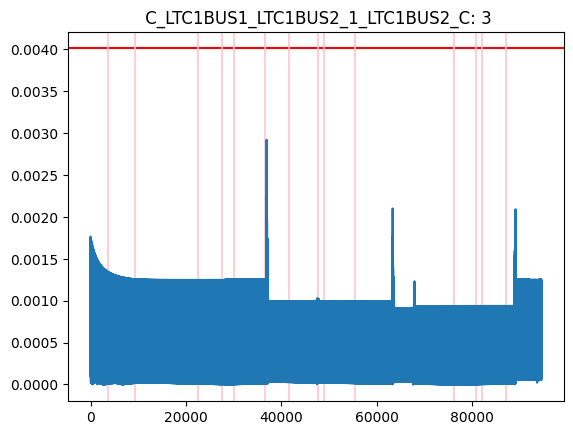

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 0
DD = 0


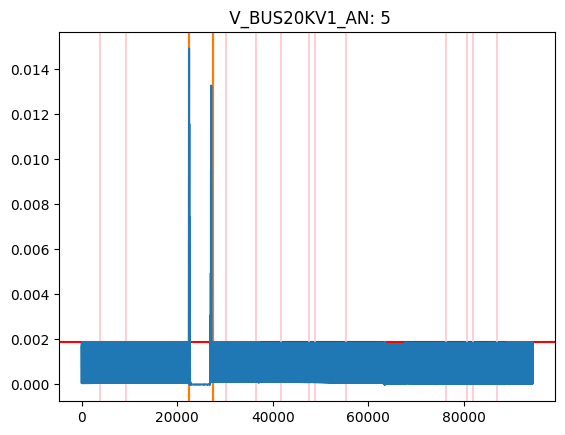

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


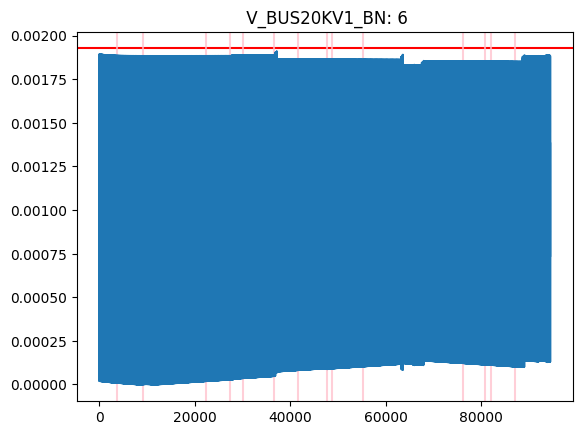

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


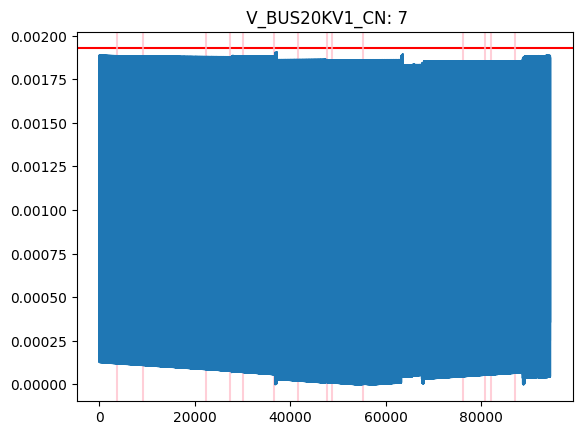

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


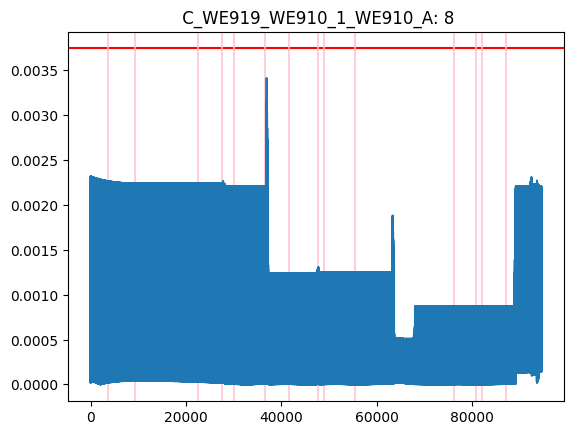

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


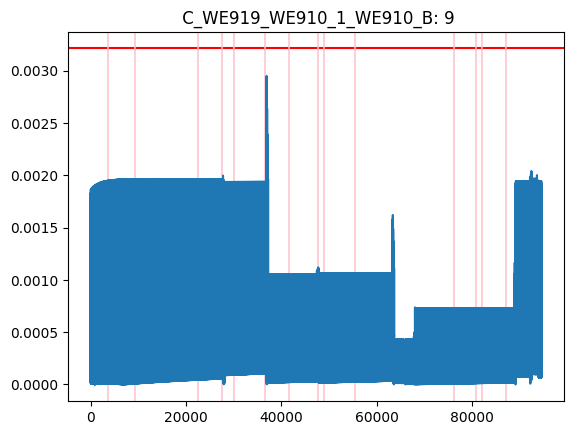

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


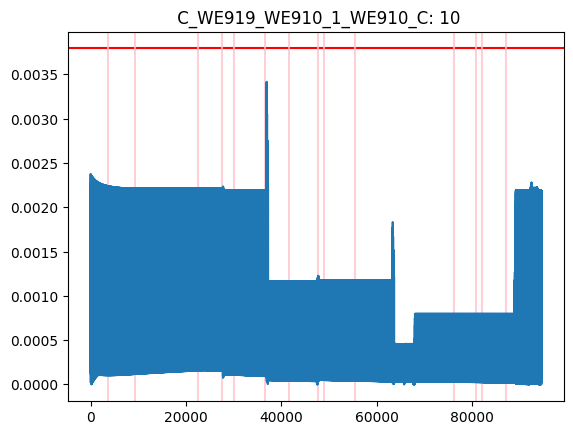

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 16


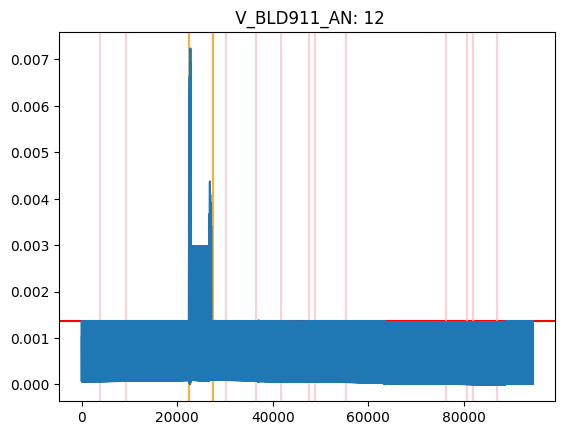

***********************************************************************************************
Sensor: 13  V_BLD911_BN


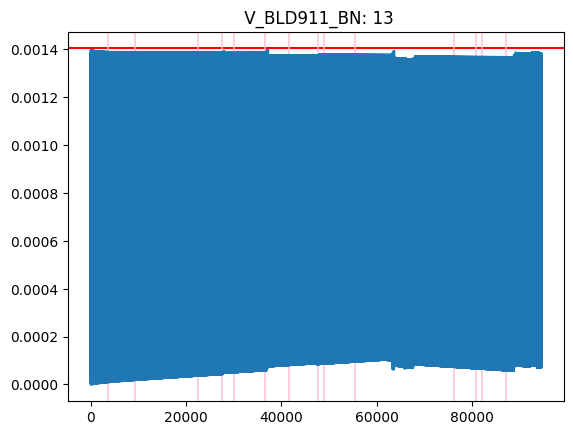

***********************************************************************************************
Sensor: 14  V_BLD911_CN


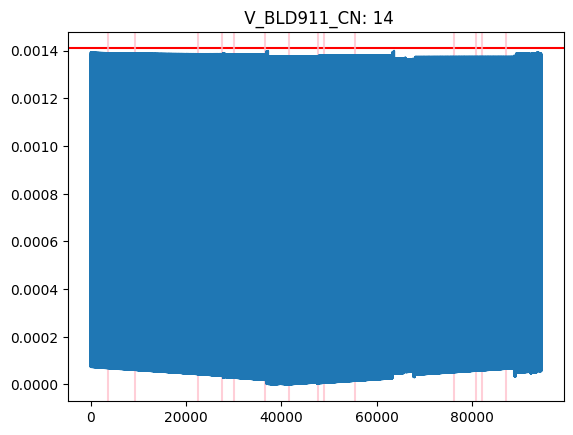

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = None


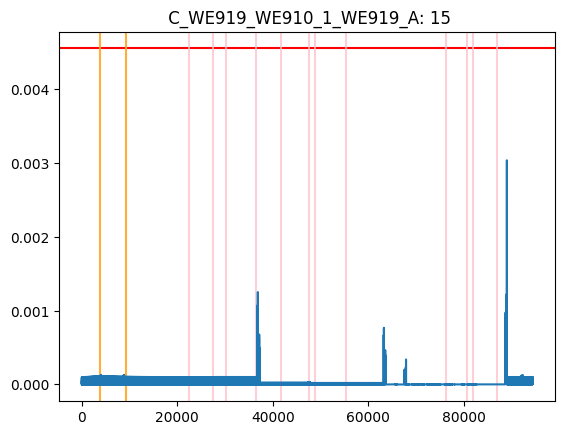

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = None


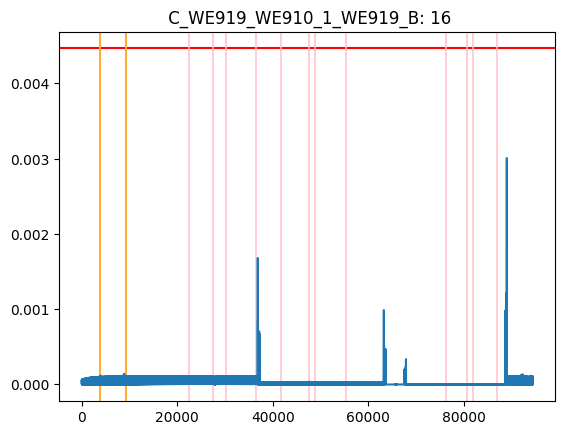

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = None


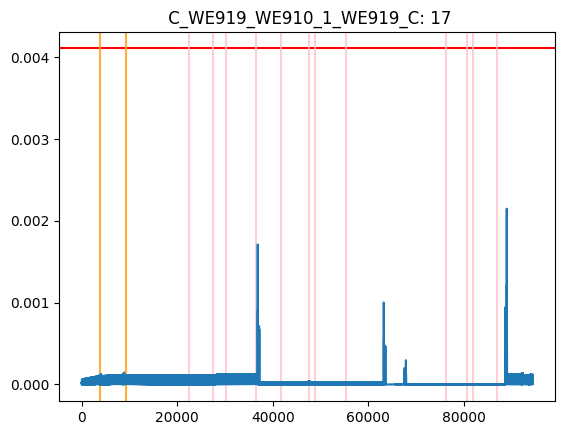

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 16


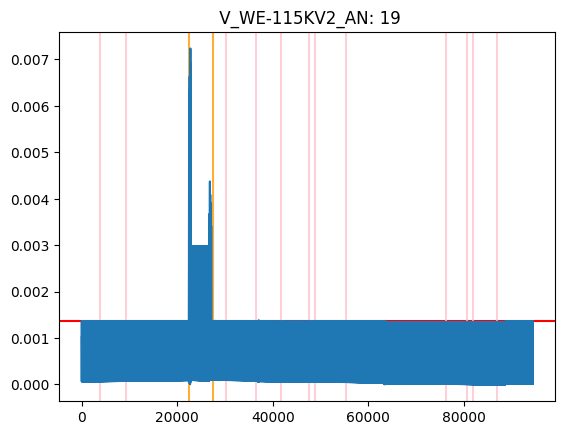

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


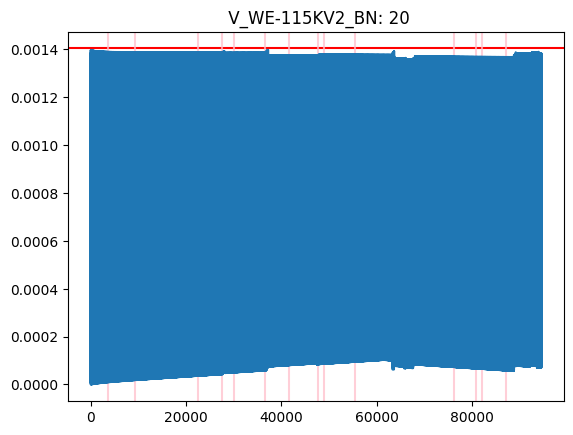

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


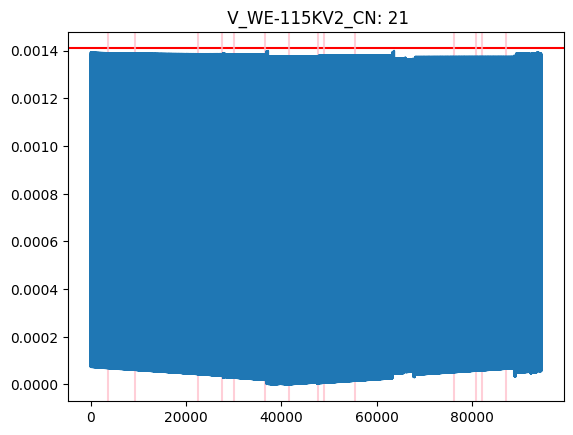

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


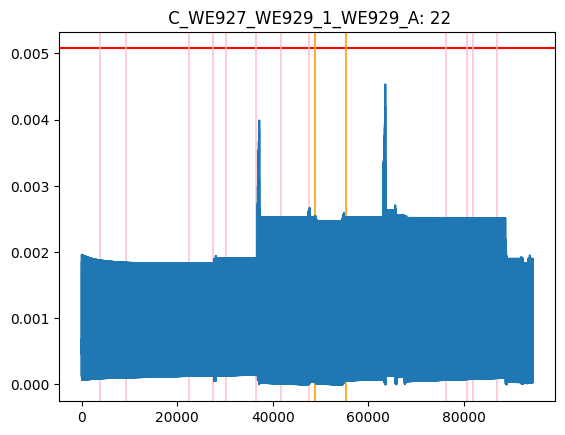

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


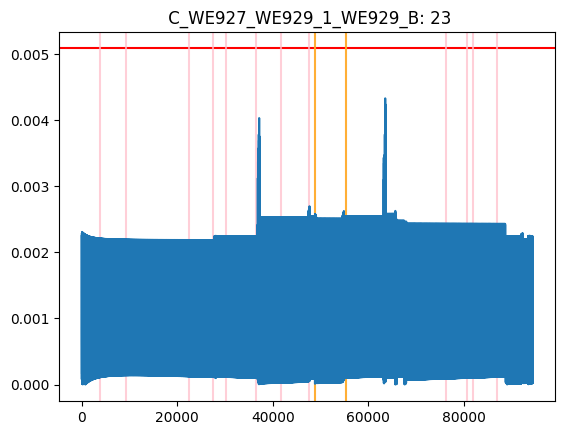

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


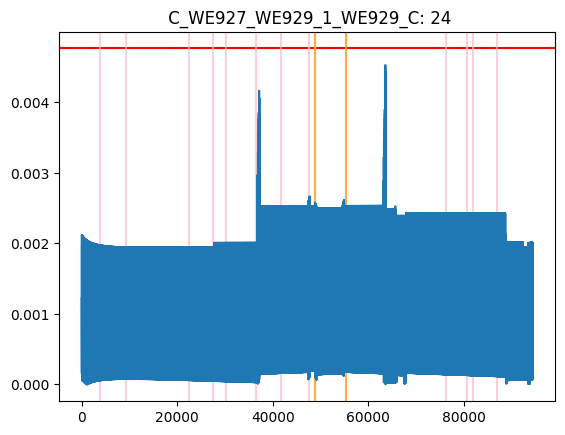

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 16


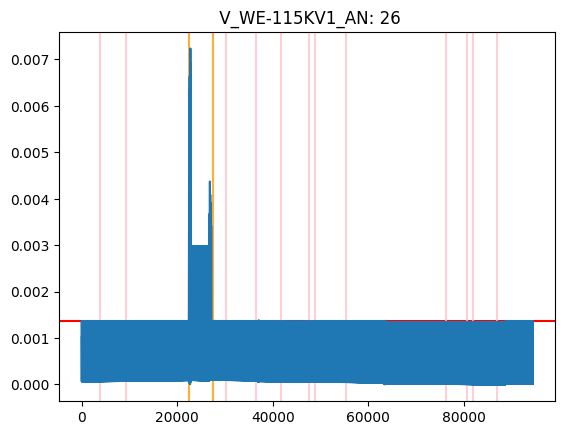

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


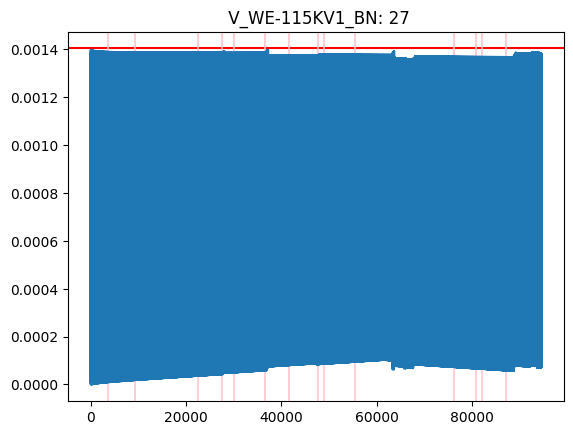

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


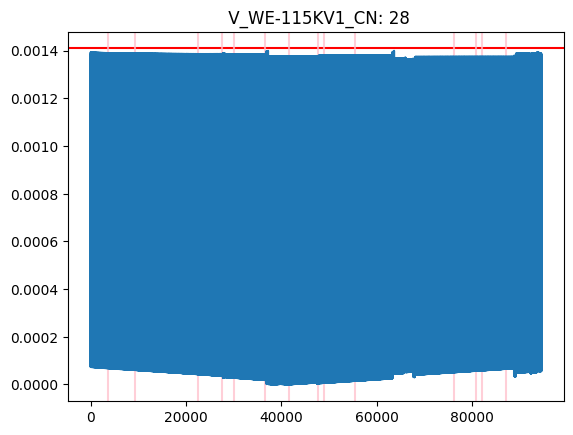

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


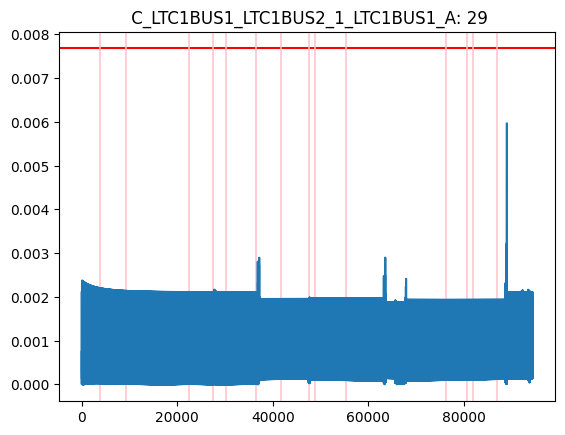

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = 6


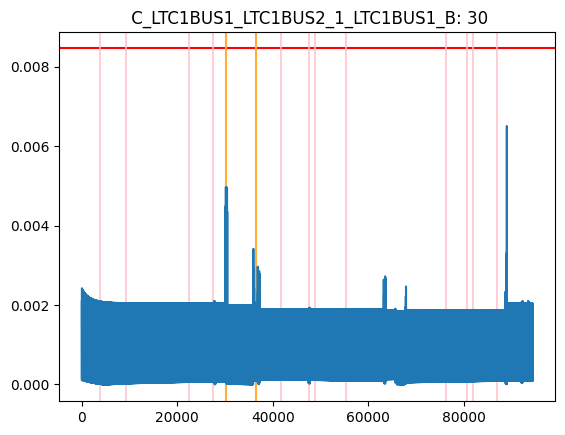

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


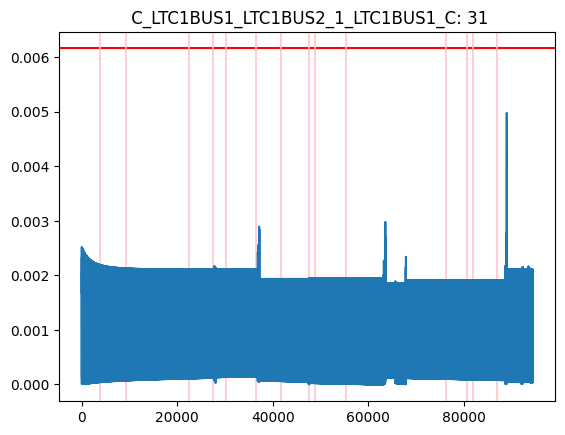

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


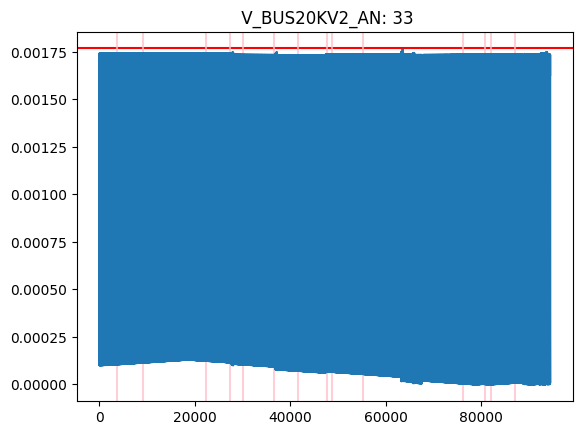

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


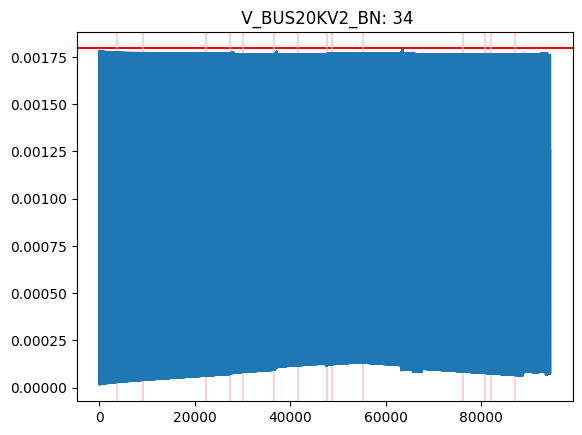

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


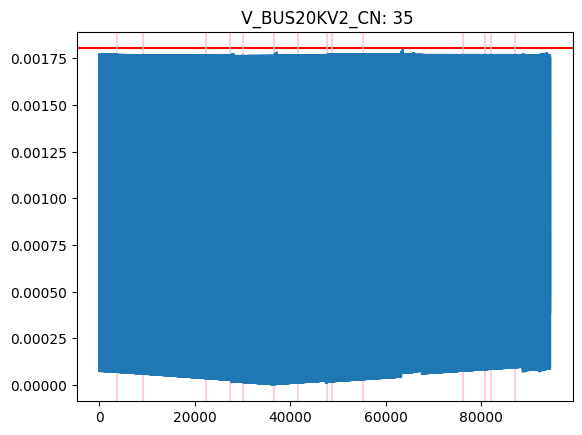

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = 0
DD = 0


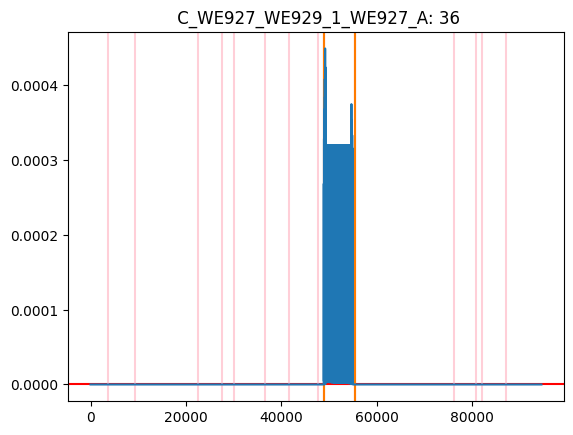

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = 0
DD = 0


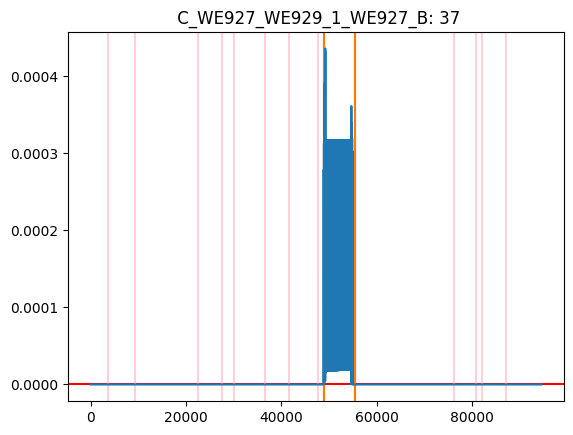

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = 0
DD = 0


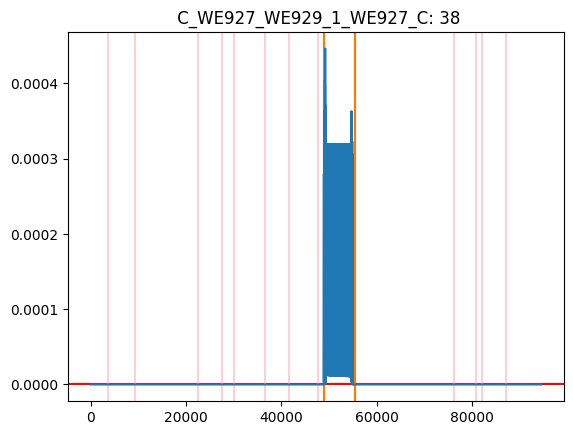

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


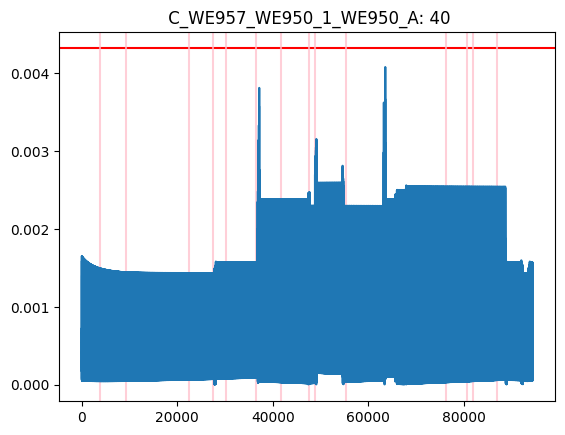

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


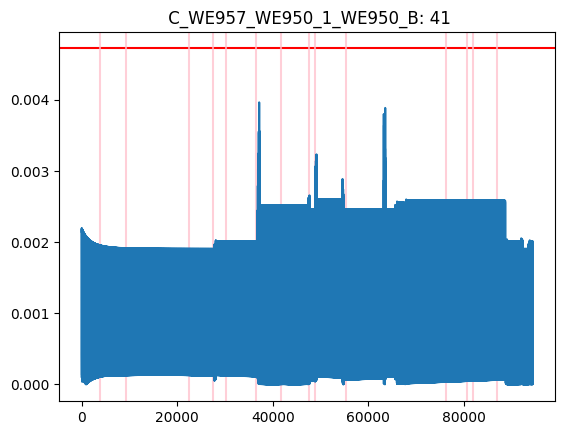

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


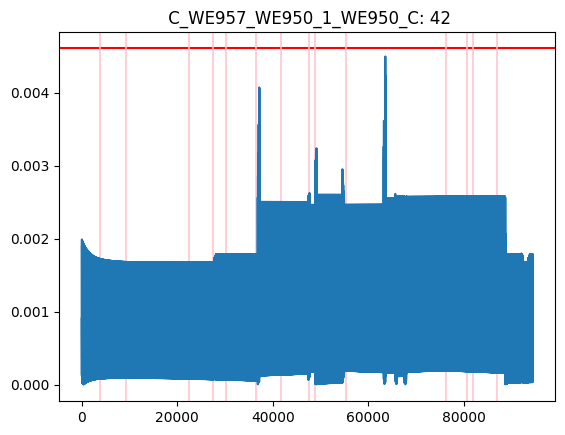

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 4804


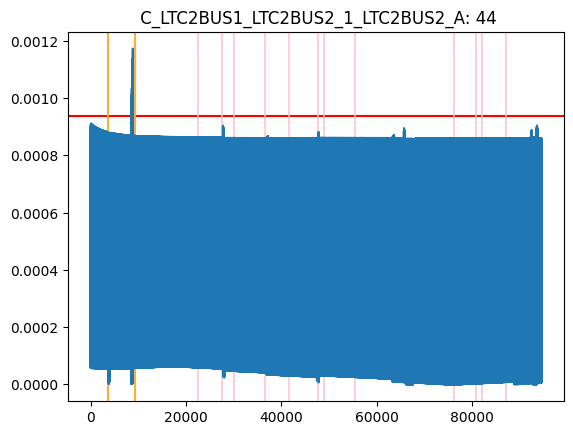

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 4810


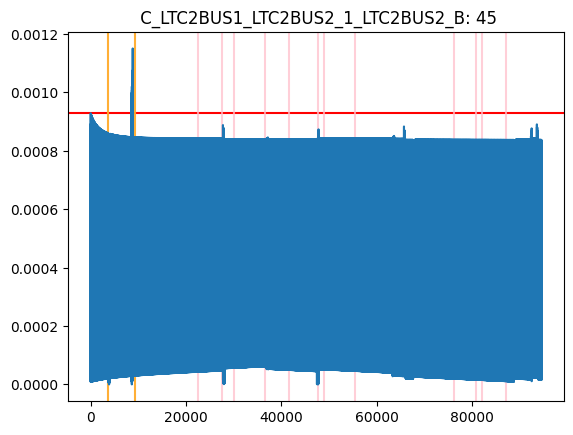

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 4798


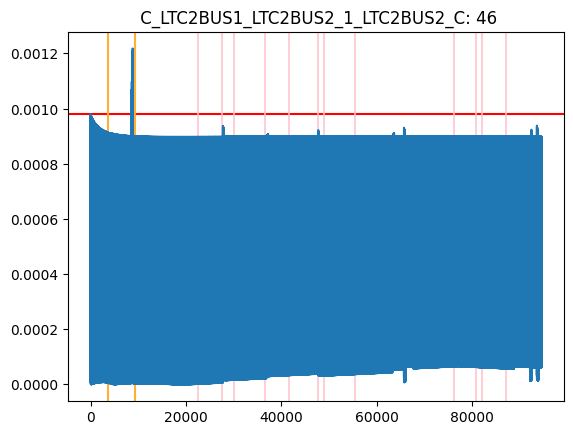

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = None


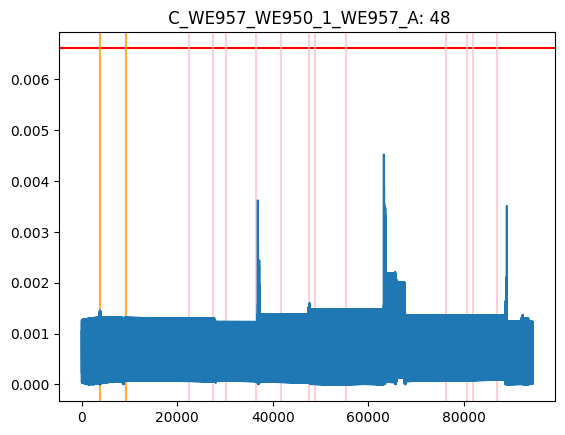

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


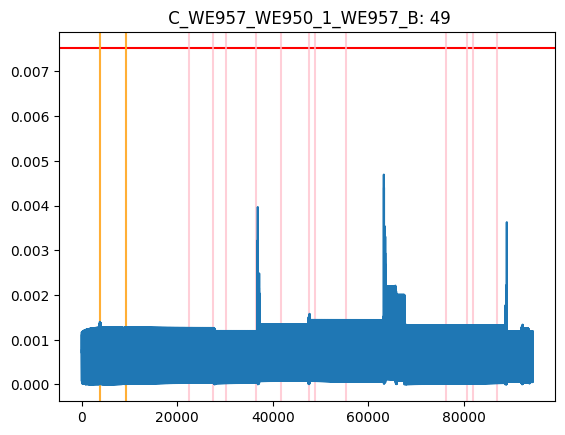

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = None


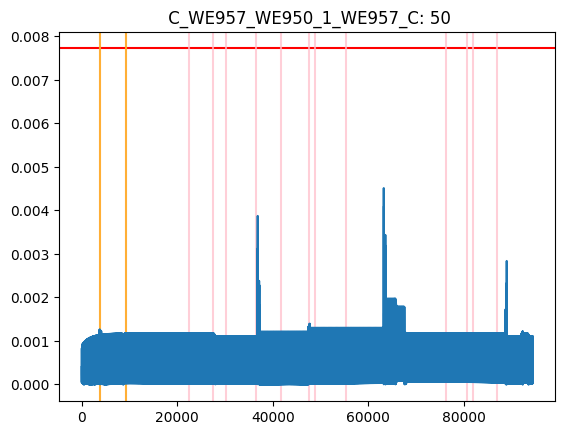

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = None
DD = None


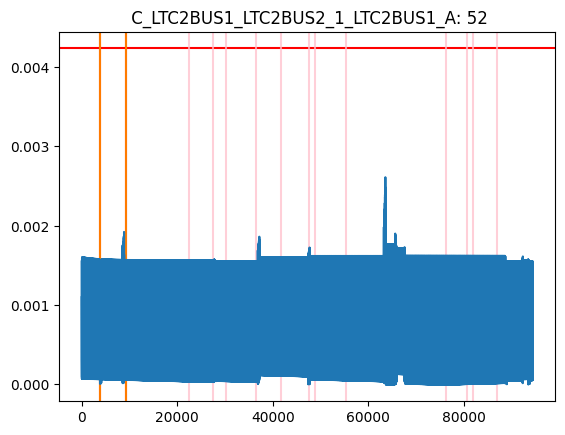

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = None
DD = None


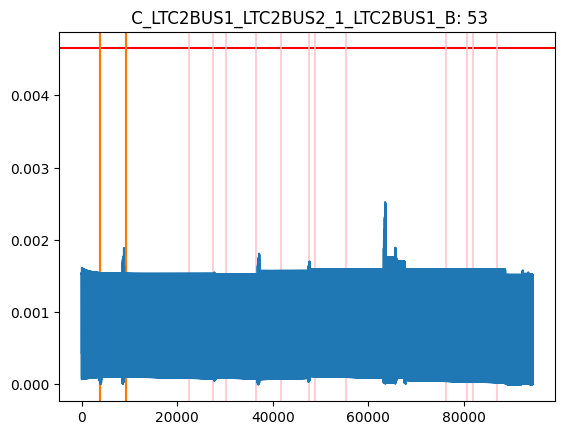

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = None
DD = None


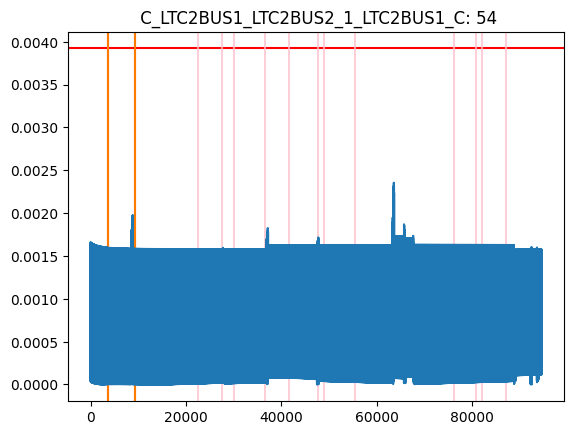

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = 13


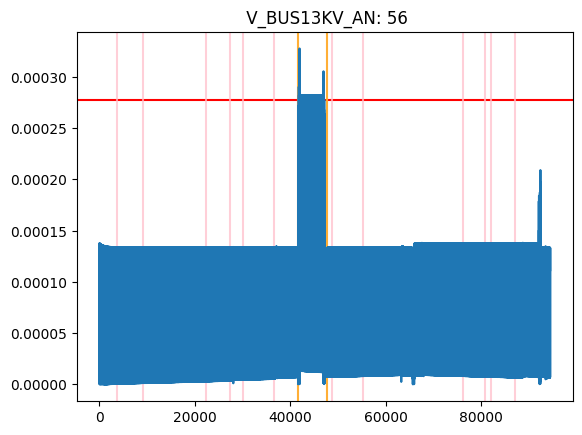

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = 0


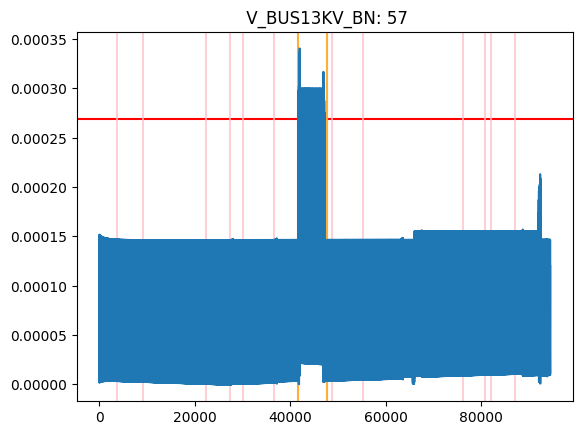

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = 26


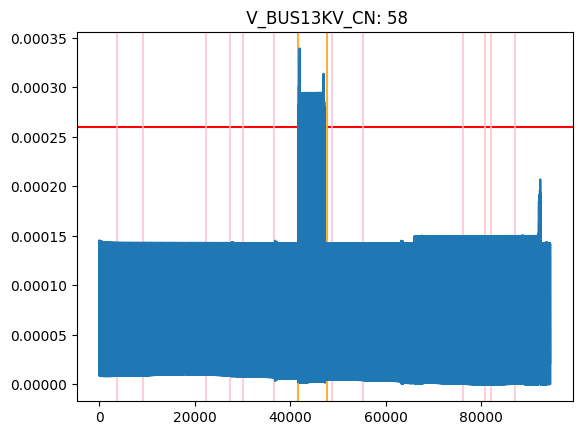

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = 4823
59
DD = None
59
DD = 21


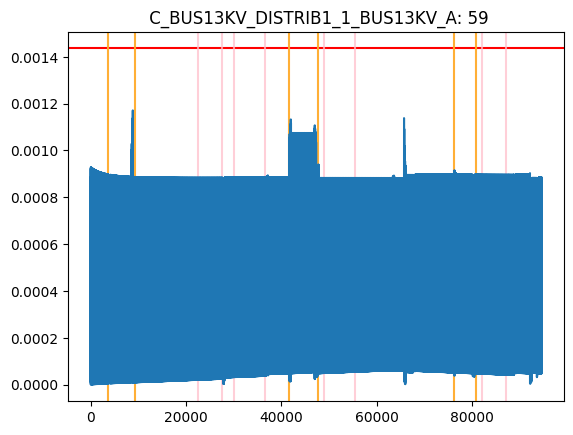

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = 4811
60
DD = None
60
DD = 7


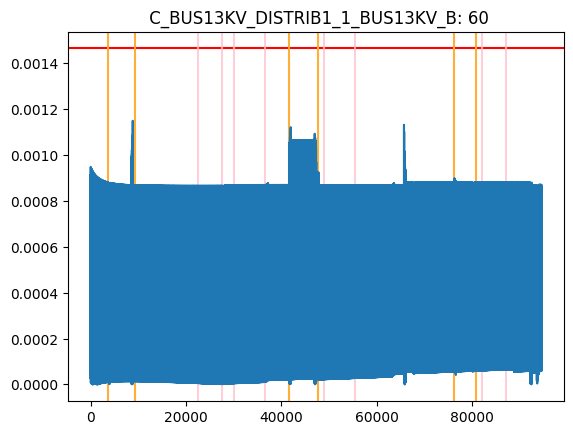

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = 4798
61
DD = None
61
DD = 34


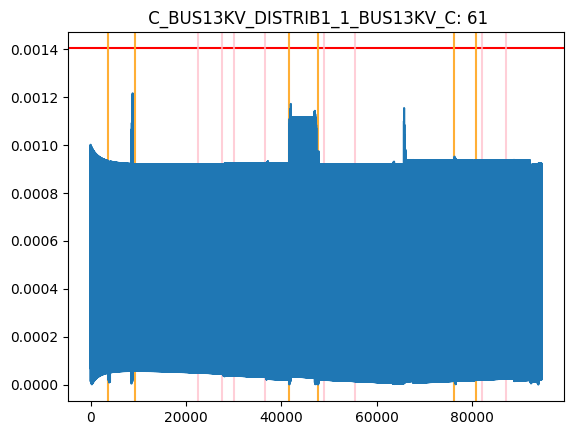

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = None
62
DD = 0


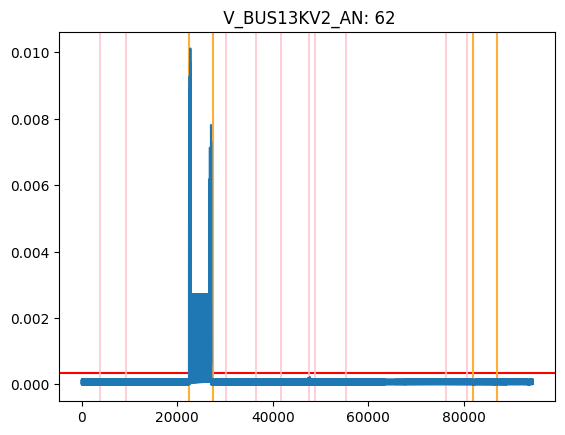

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 0
63
DD = None


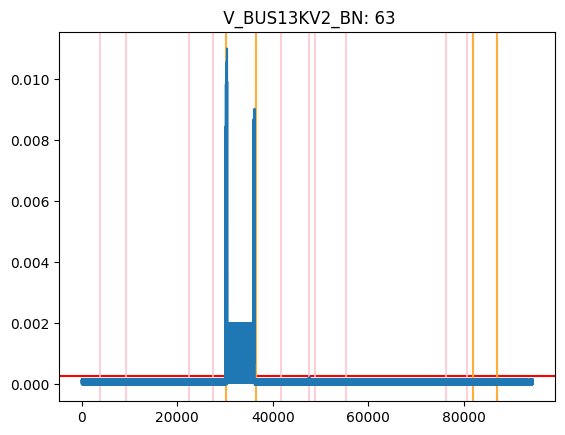

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = None


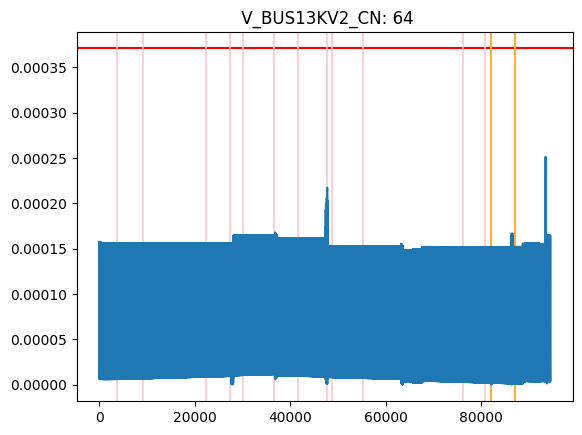

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


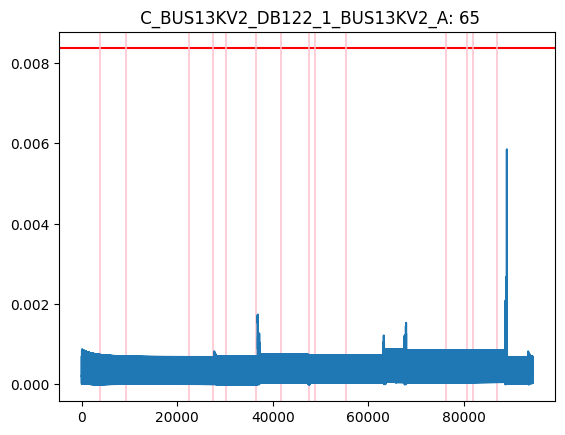

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = 0
DD = 0


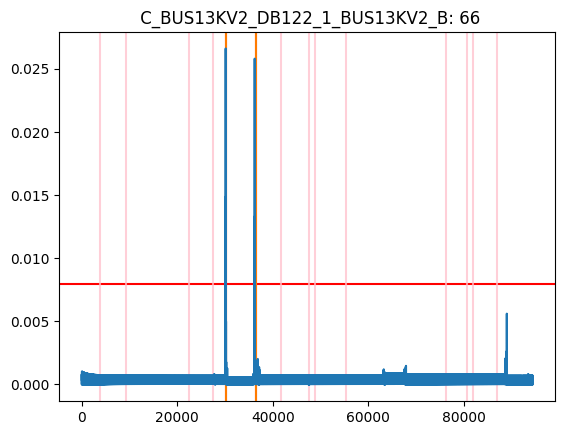

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


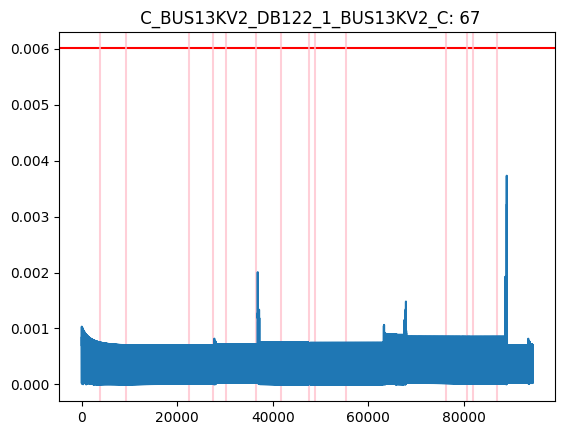

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 14
DD = 14


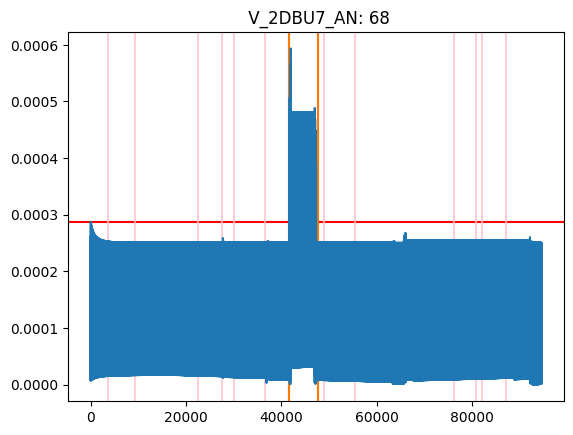

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 1
DD = 1


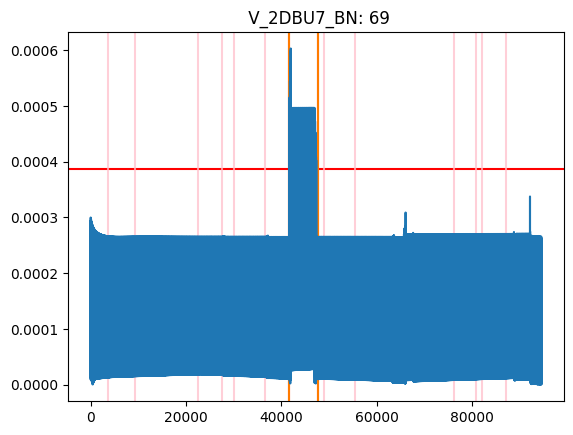

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 0
DD = 0


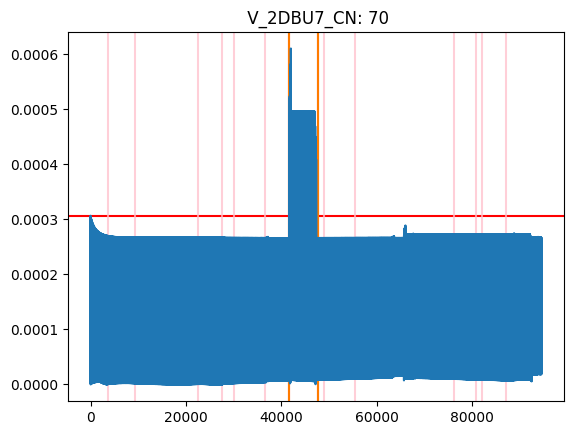

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
DD = None
DD = 17
DD = 17


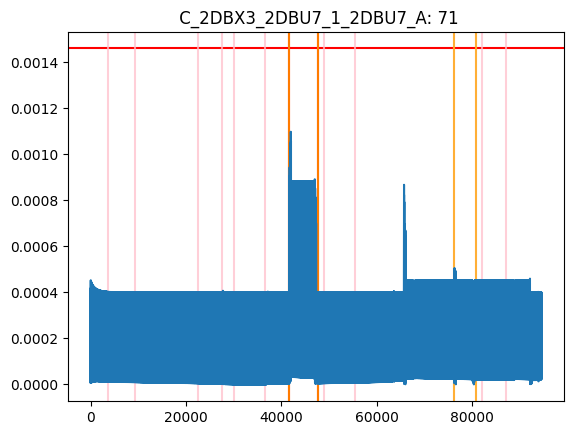

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
DD = None
DD = 4
DD = 4


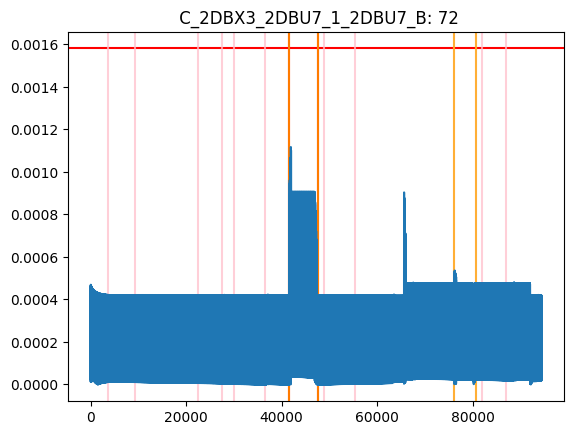

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
DD = None
DD = 30
DD = 30


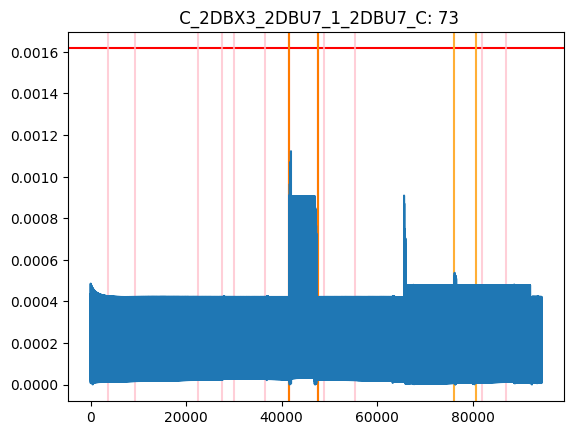

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None
74
DD = None


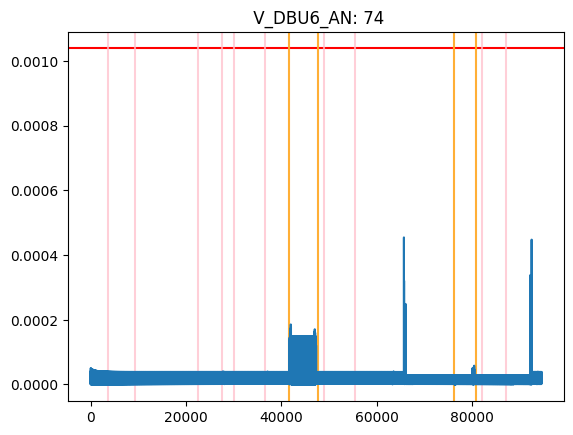

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None
75
DD = None


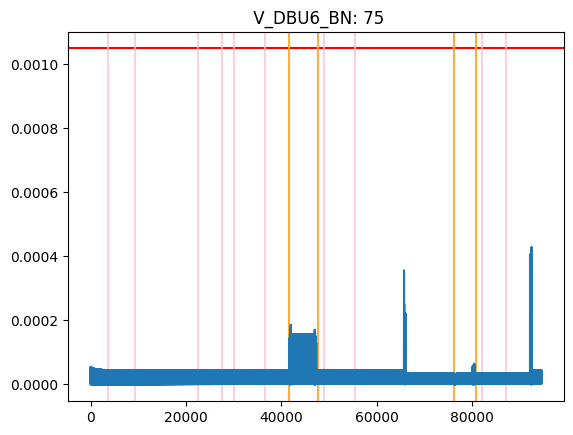

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None
76
DD = None


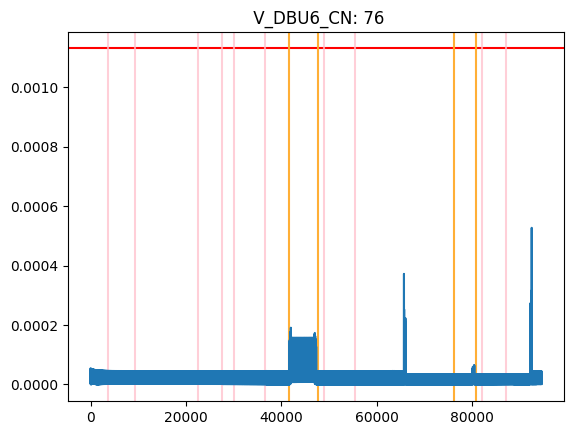

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = None
DD = None
DD = None


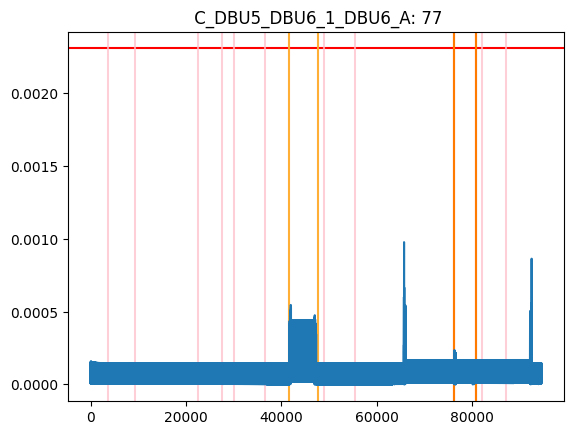

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = None
DD = None
DD = None


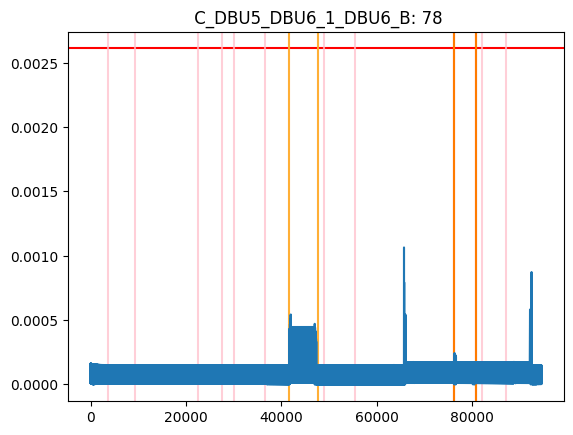

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = None
DD = None
DD = None


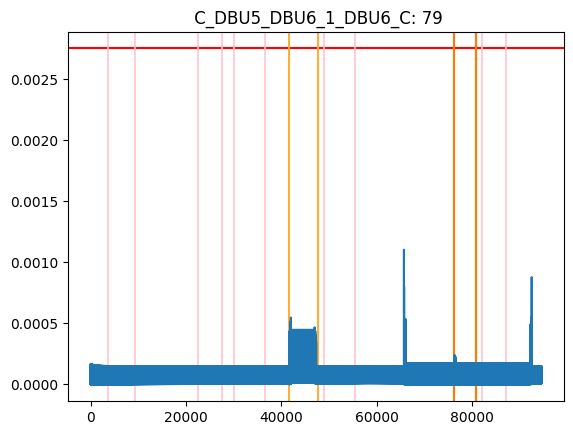

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = None


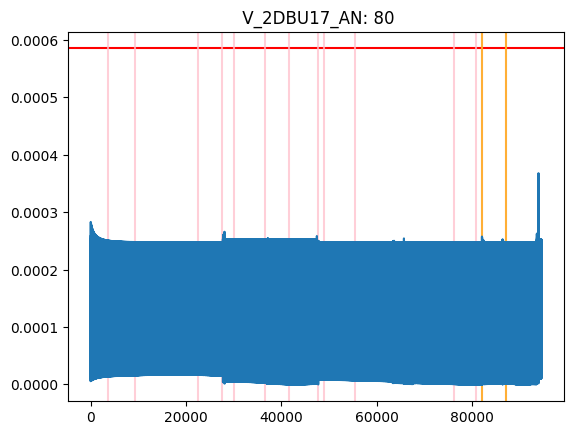

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = None


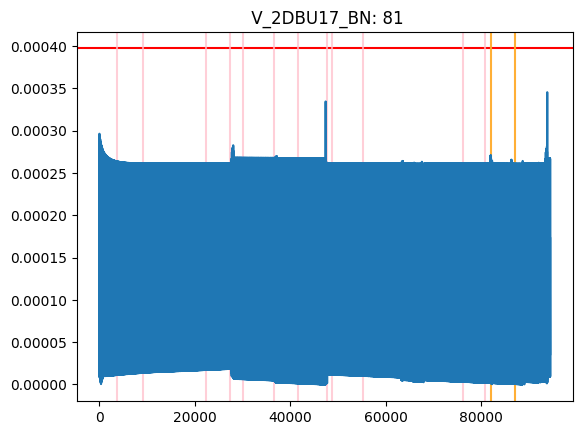

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = None


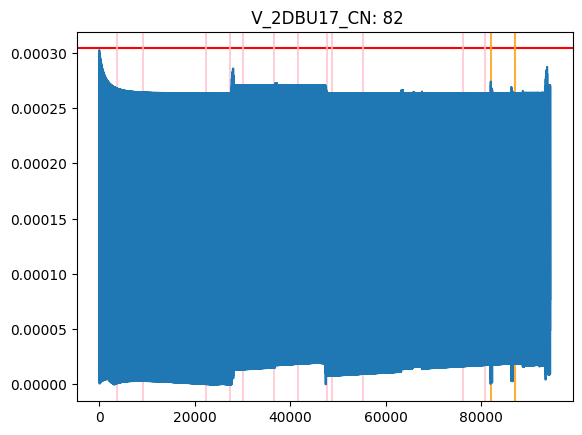

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


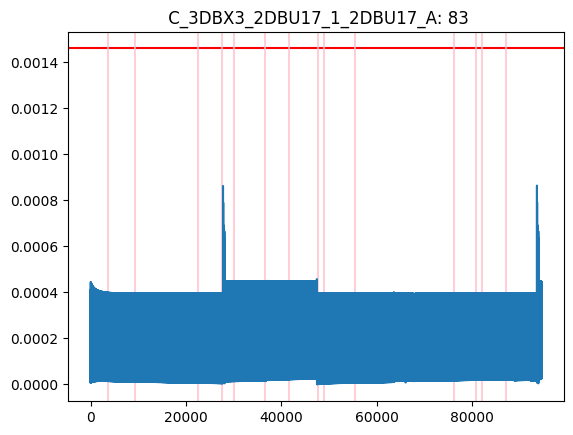

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 2


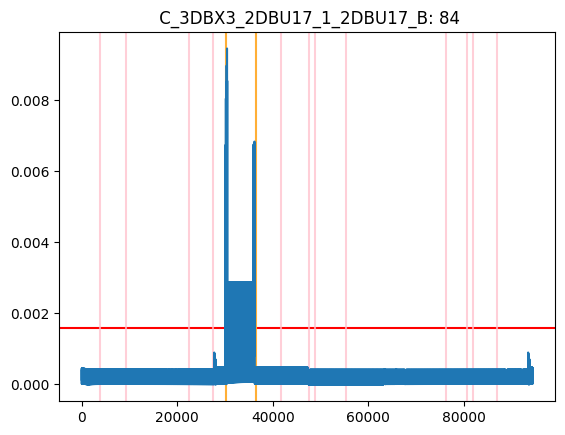

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


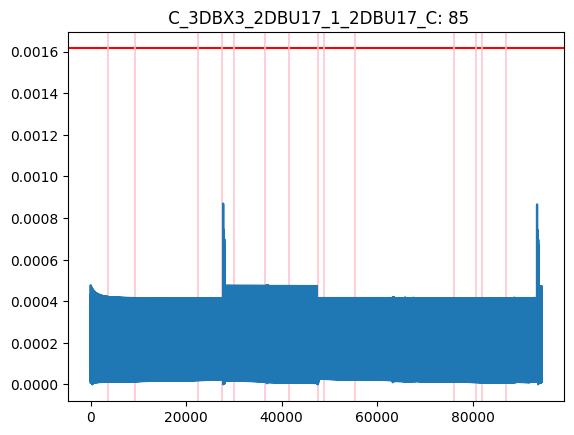

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = None
DD = None


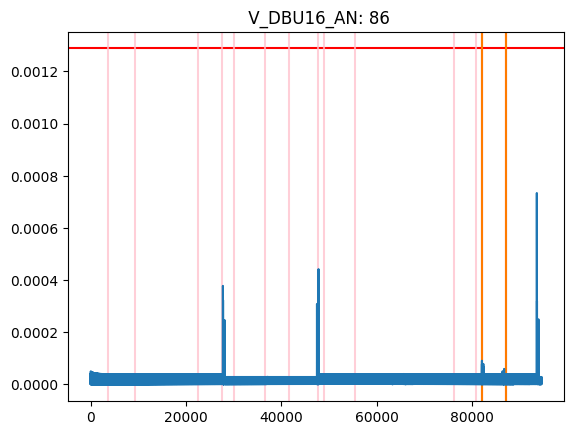

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = None
DD = None


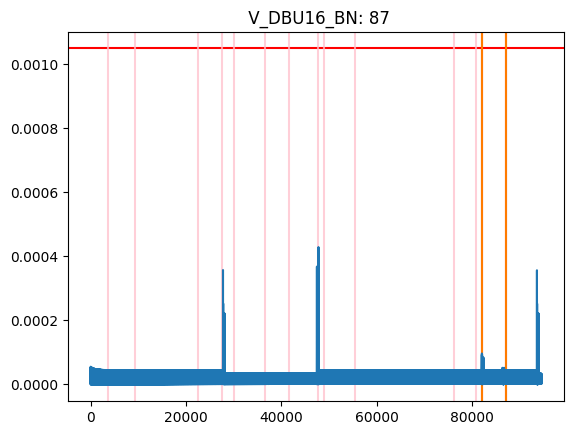

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = None
DD = None


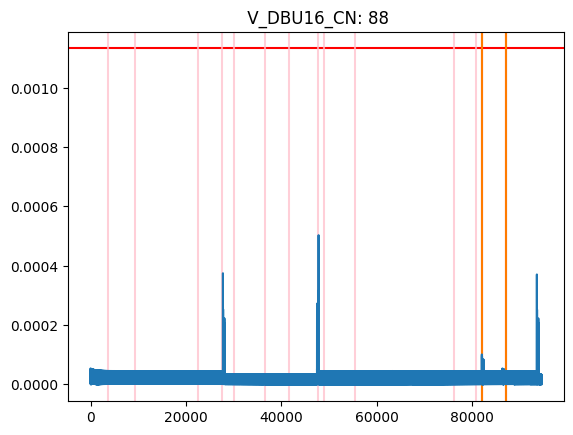

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A
89
DD = None


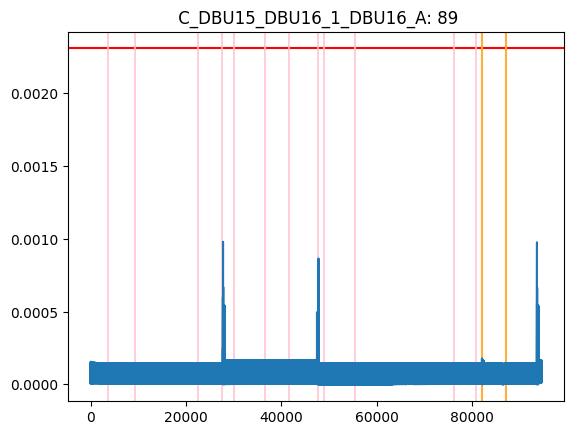

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 1
90
DD = None


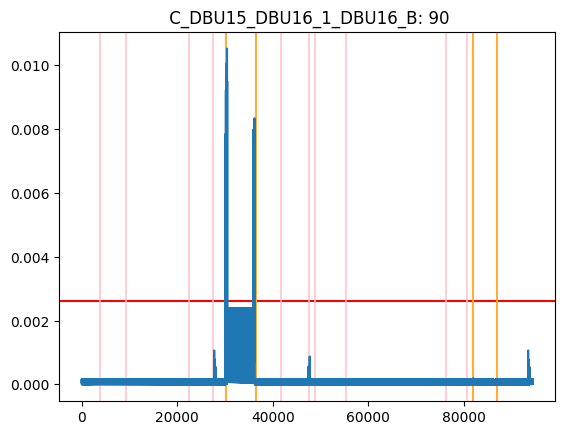

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C
91
DD = None


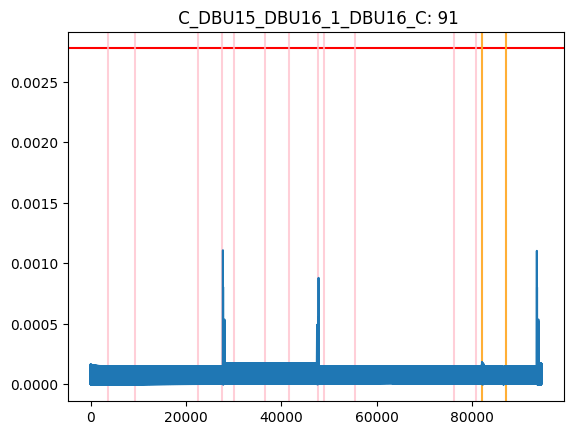

In [199]:
ADD_corr = []
at_neighbor = {}
for index, i in enumerate(rsum_list_corr):
    print("***********************************************************************************************")
    attack_in = (i > thresholds_corr[index]).nonzero()

    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
    at_neighbor[things[index]] = attack_in
    plt.title(f"{cols[things[index]-1]}: {things[index]}")
    plt.axhline(thresholds_corr[index], color='red')

    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[
            (df_test['Time'] >= attack_dict[things[index]][0] * 1e6) &
            (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201

        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD_corr = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                ADD_corr.append(DD_corr)
                print(f"DD = {DD_corr}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')

            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

            start_w = start-window-w
            end_w = end+window+w-1
            for starts, ate in attack_i.items():
              if starts == start and things[index] in ate:
                DD_corr = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                ADD_corr.append(DD_corr)
                print(f"DD = {DD_corr}")
                plt.axvline(start_w, color='orange', alpha=0.75)
                plt.axvline(end_w, color='orange', alpha=0.75)

    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_corr = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_corr.append(DD_corr)
                  print(f"DD = {DD_corr}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


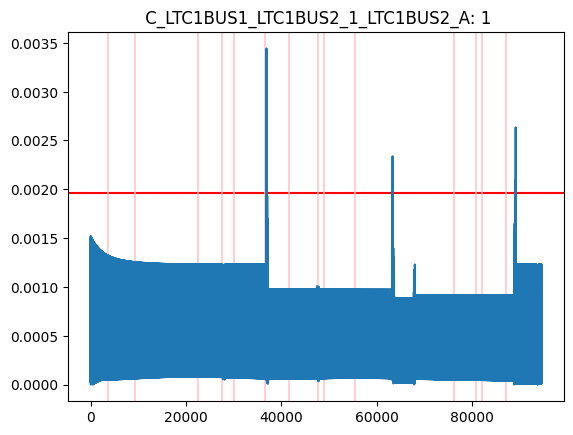

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 1


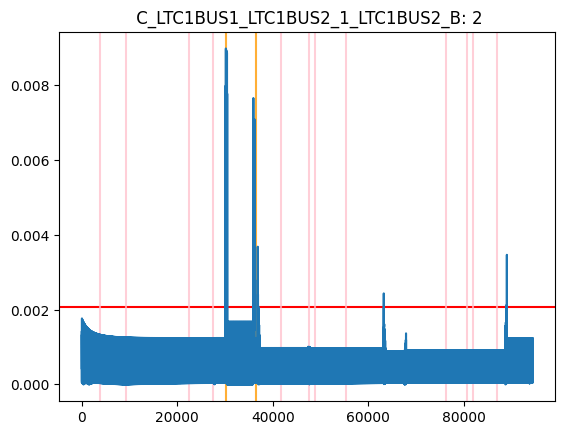

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


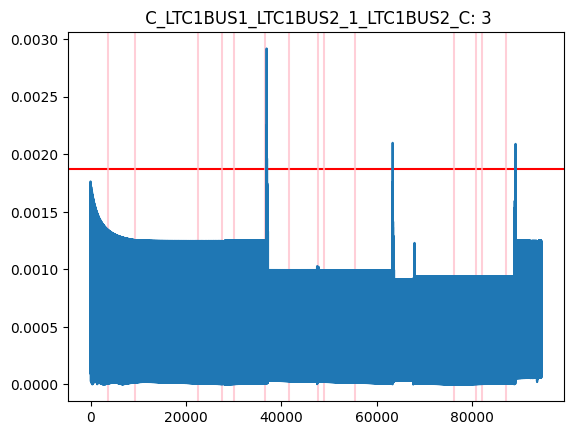

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 0
DD = 0


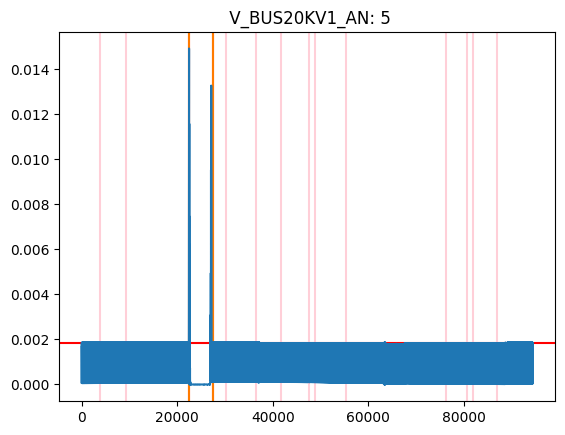

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


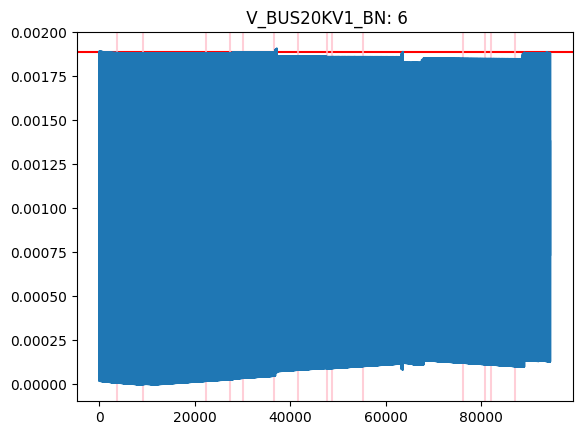

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


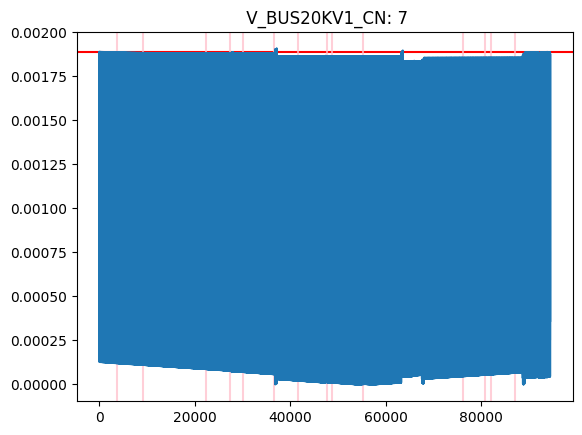

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


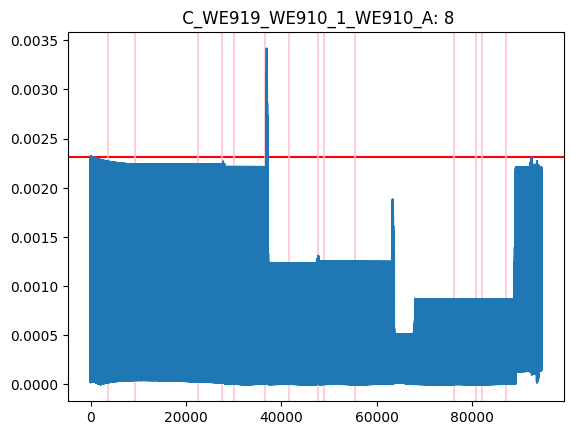

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


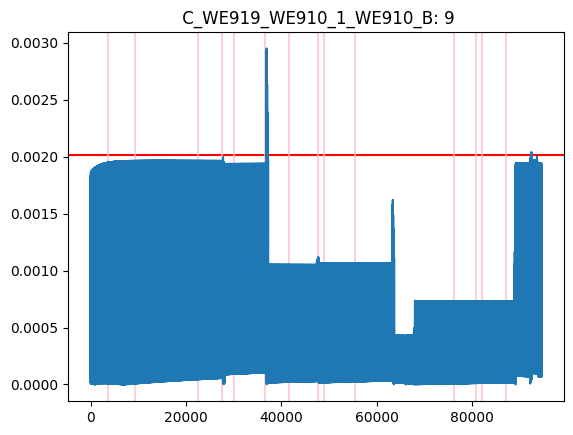

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


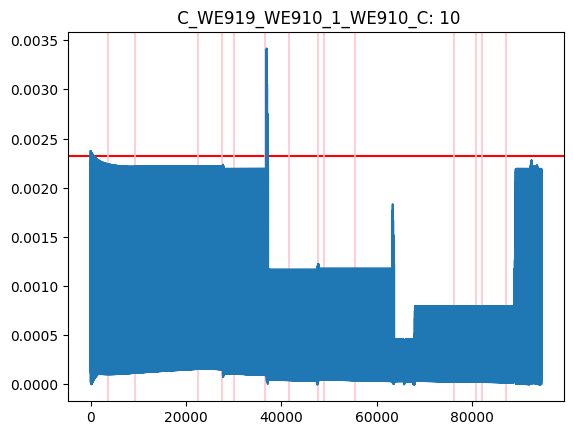

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 16


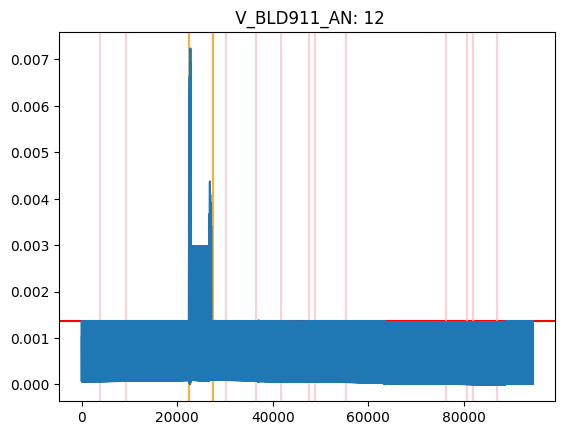

***********************************************************************************************
Sensor: 13  V_BLD911_BN


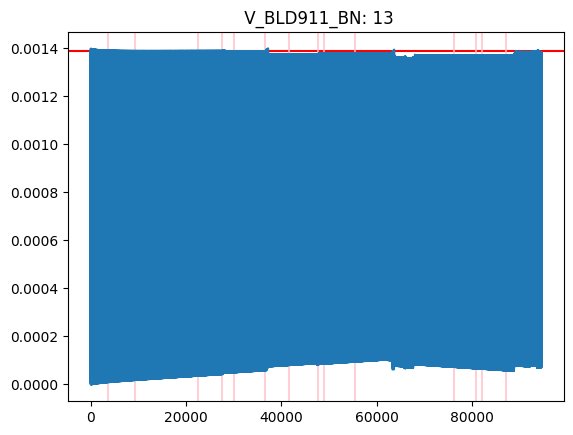

***********************************************************************************************
Sensor: 14  V_BLD911_CN


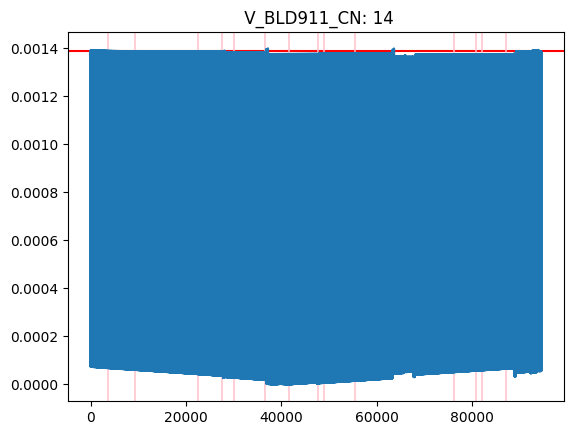

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = None


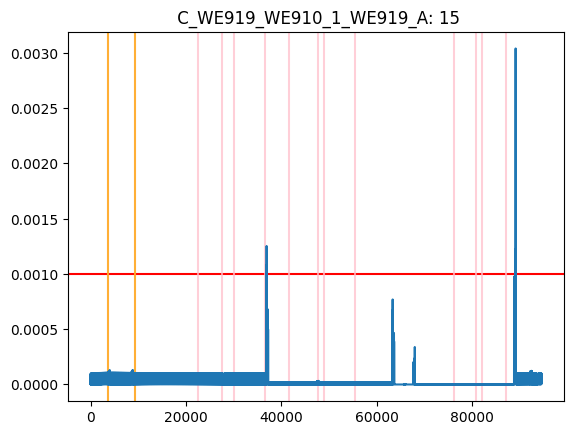

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = None


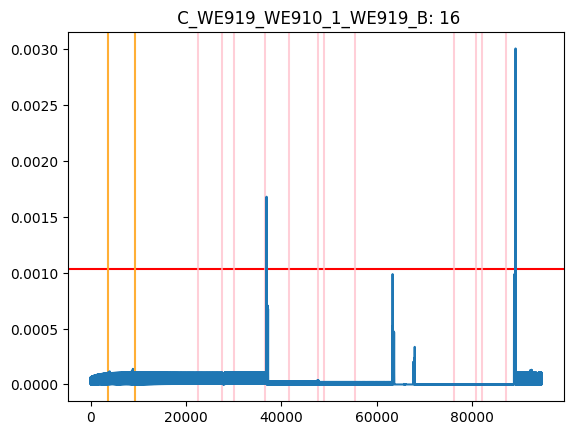

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = None


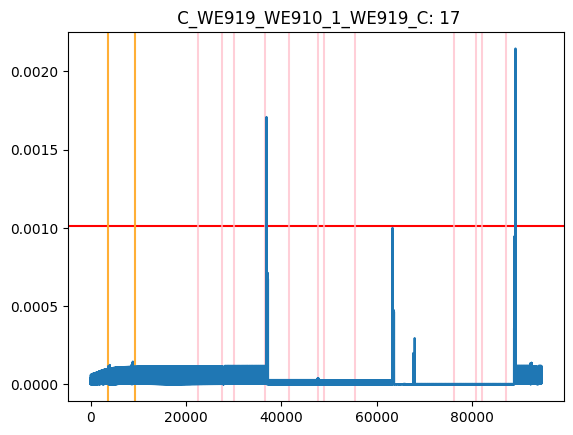

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 16


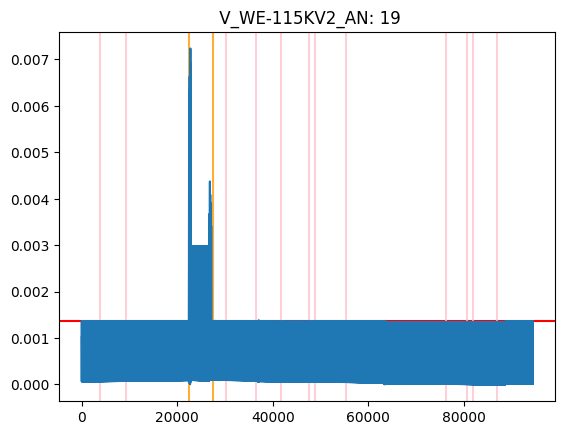

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


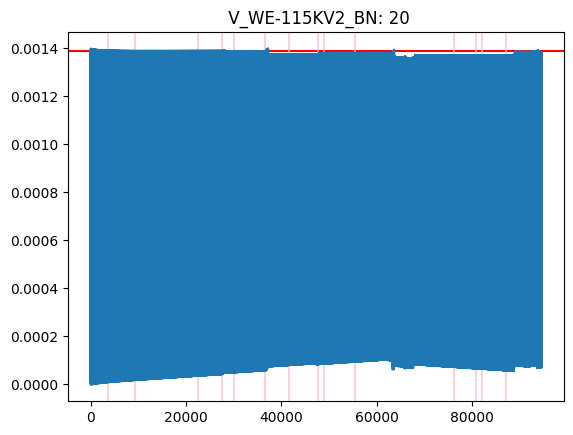

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


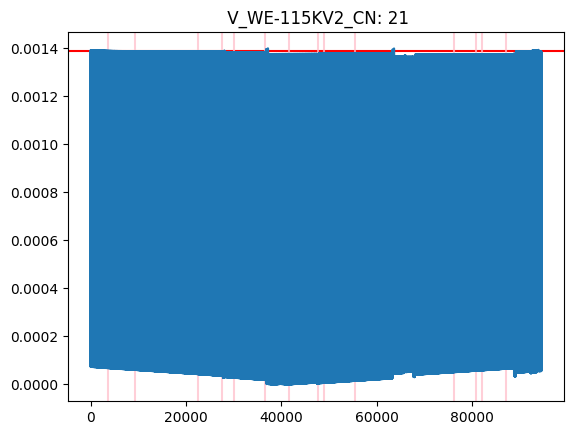

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


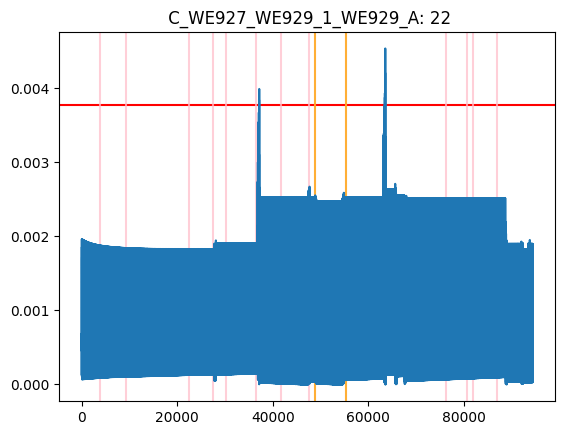

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


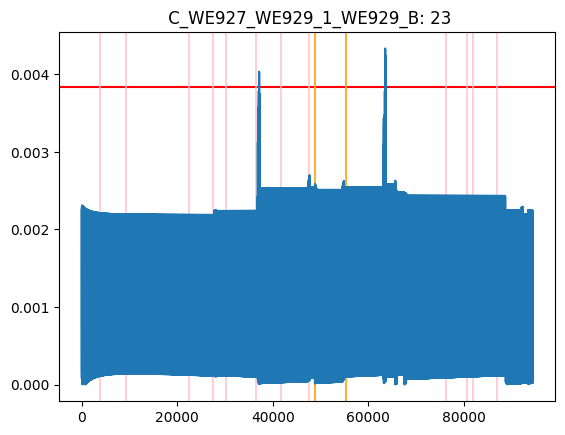

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


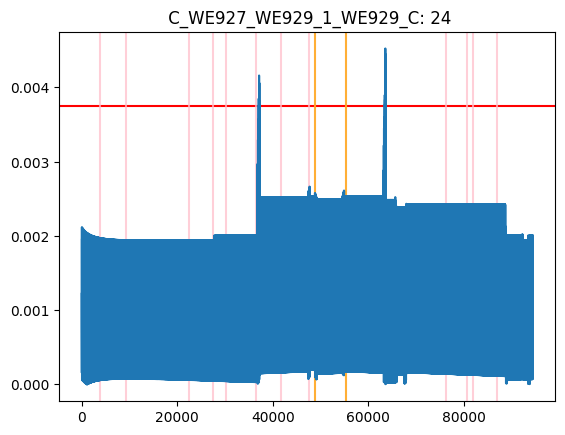

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 16


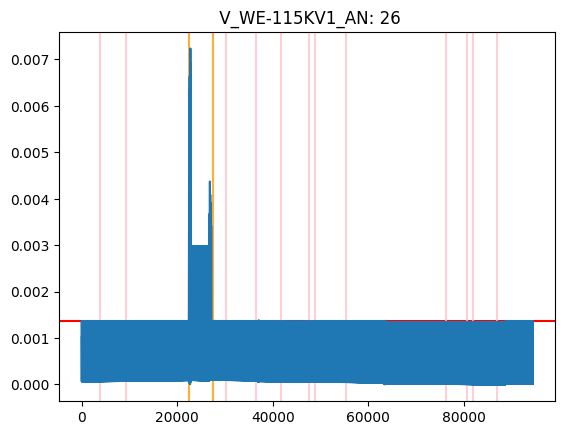

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


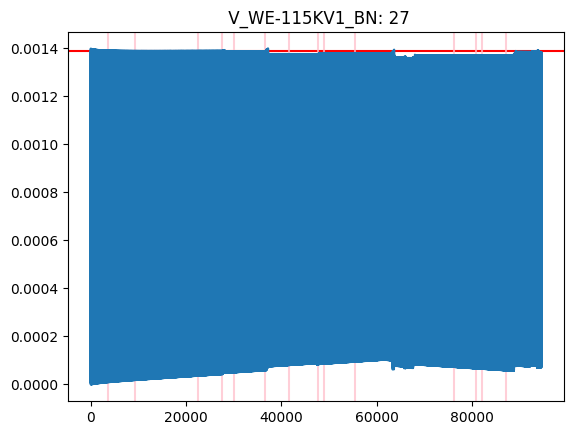

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


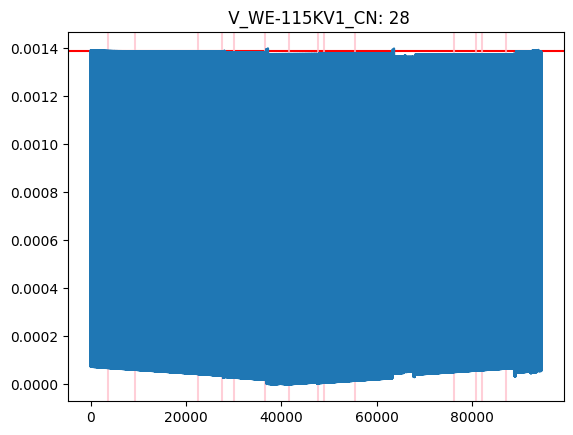

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


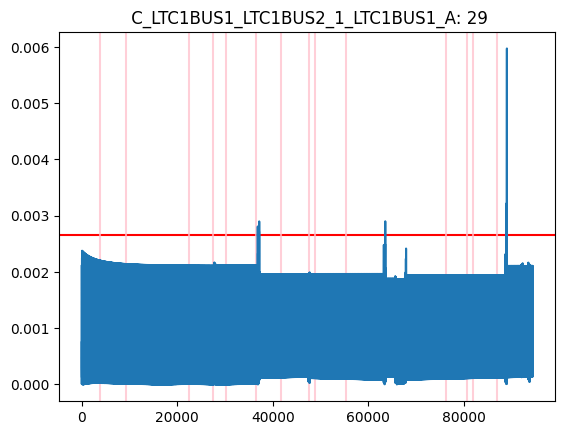

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = 6


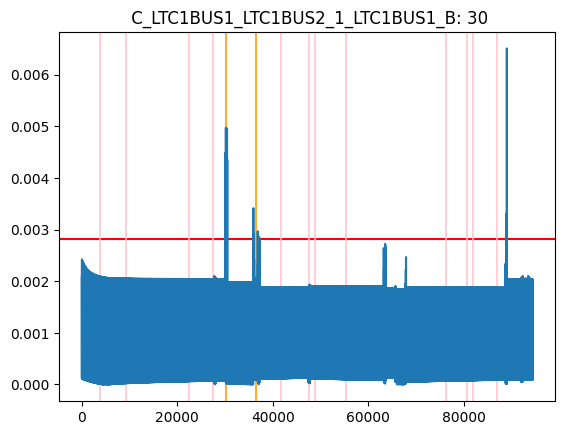

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


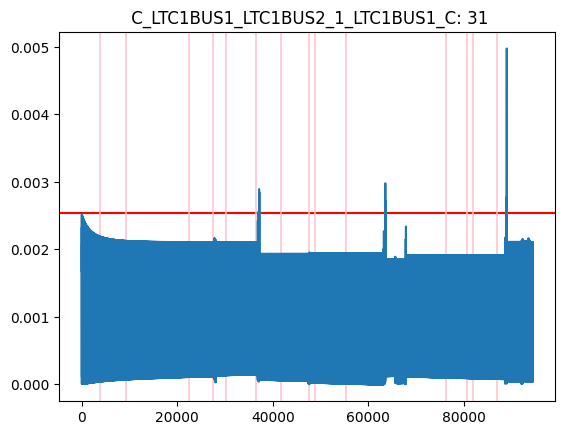

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


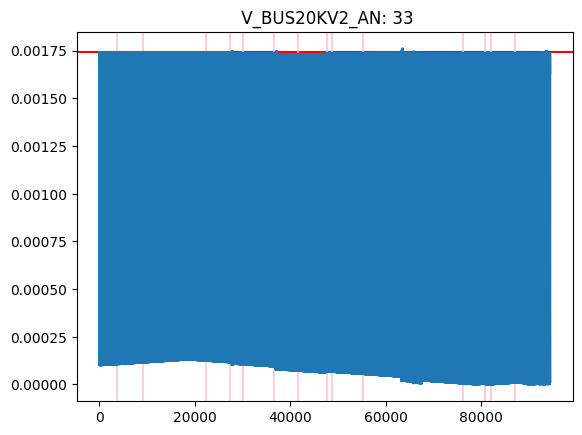

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


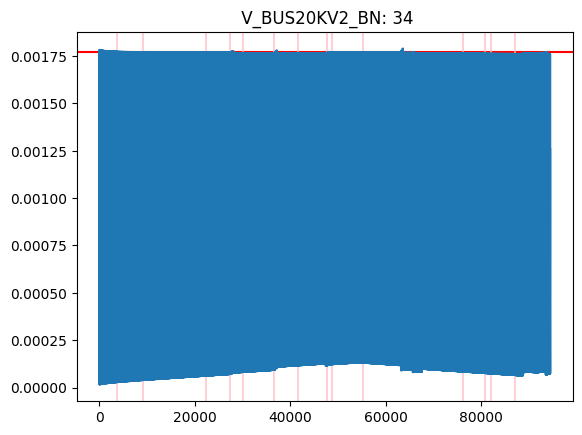

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


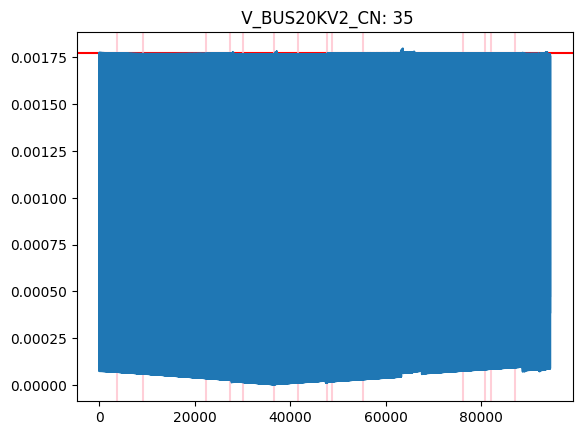

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = 0
DD = 0


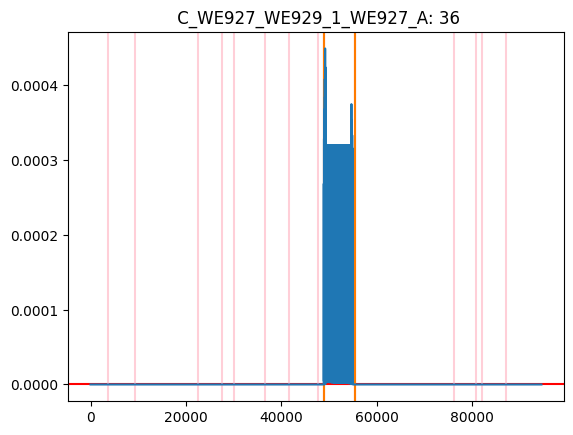

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = 0
DD = 0


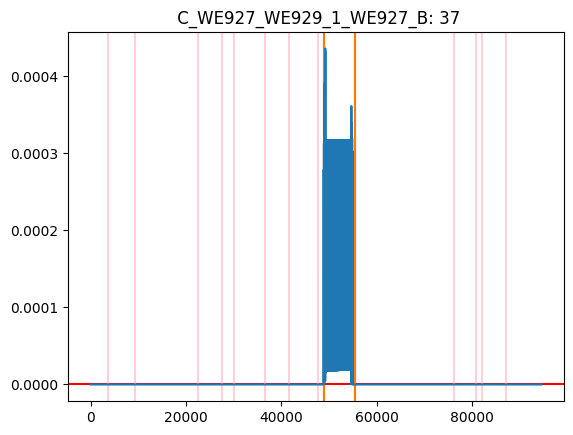

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = 0
DD = 0


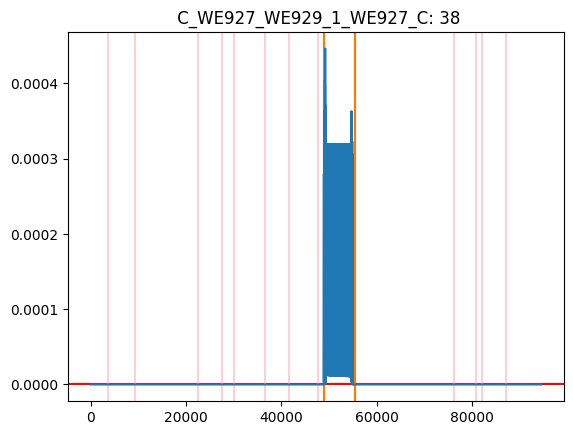

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


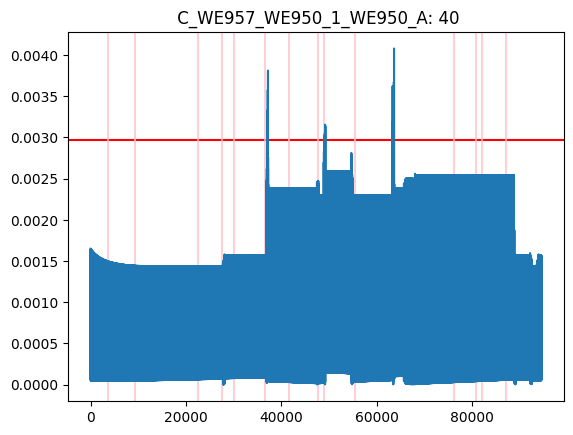

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


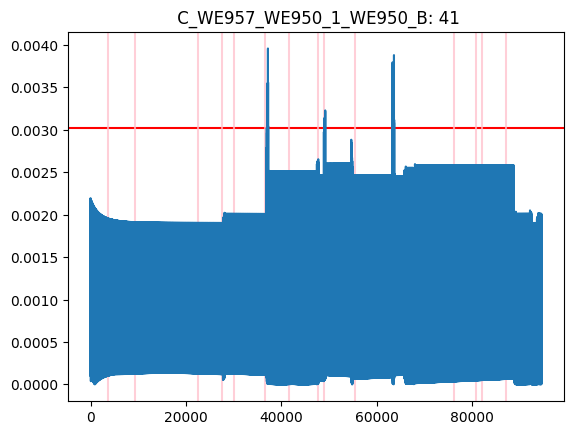

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


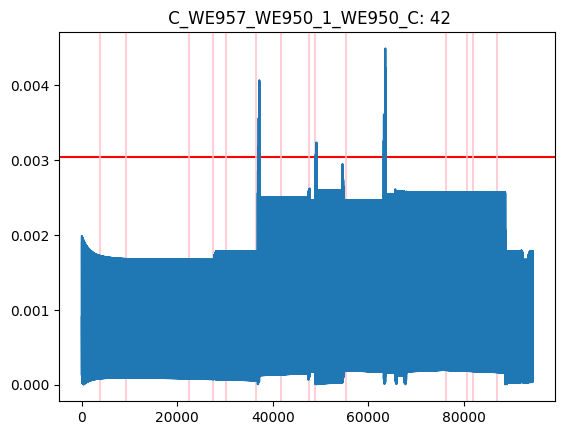

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 4804


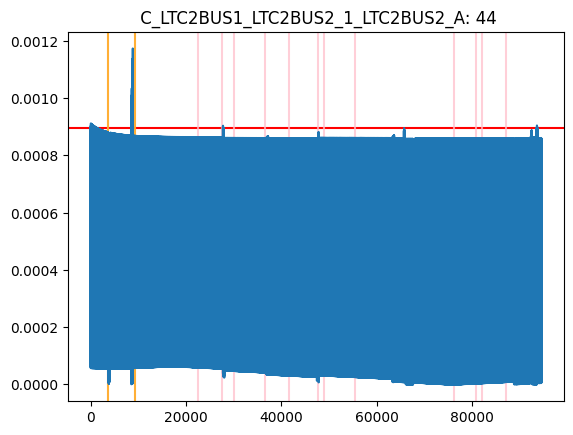

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 4810


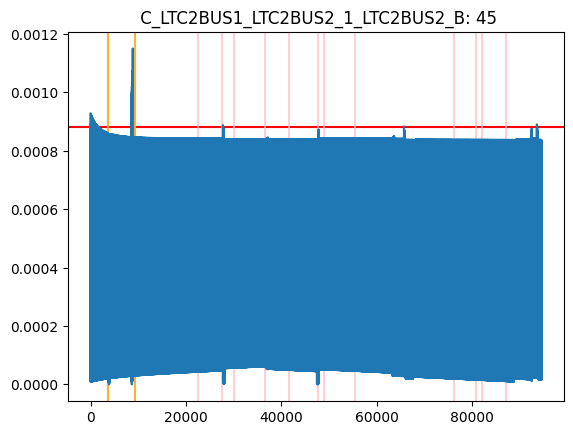

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 4798


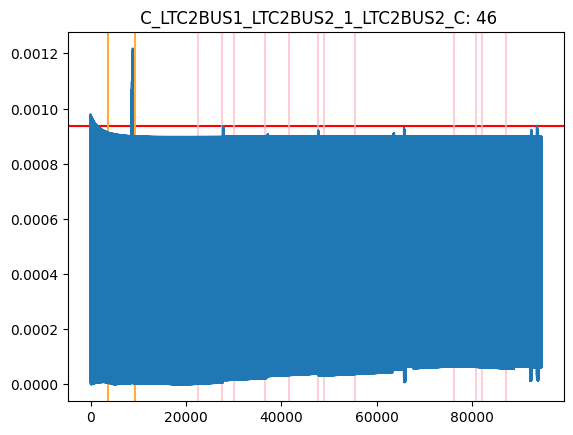

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = None


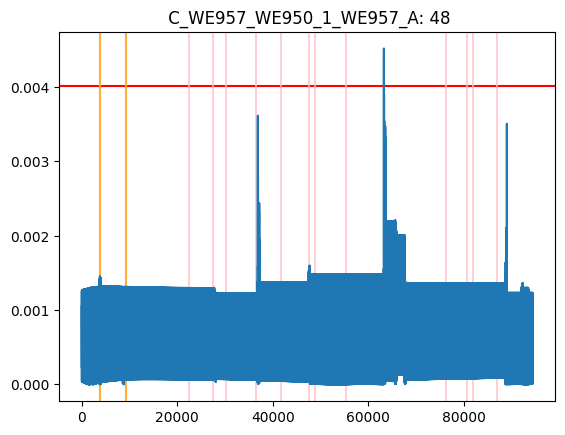

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


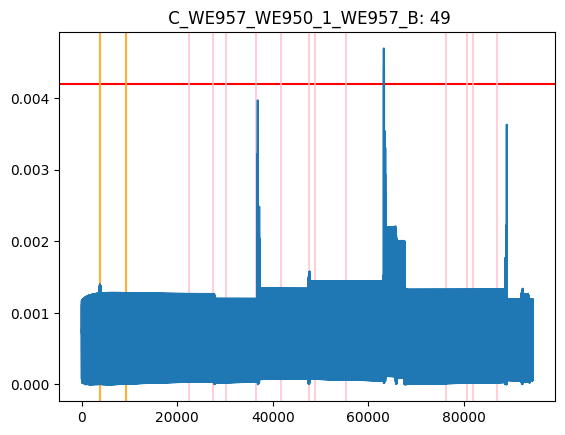

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = None


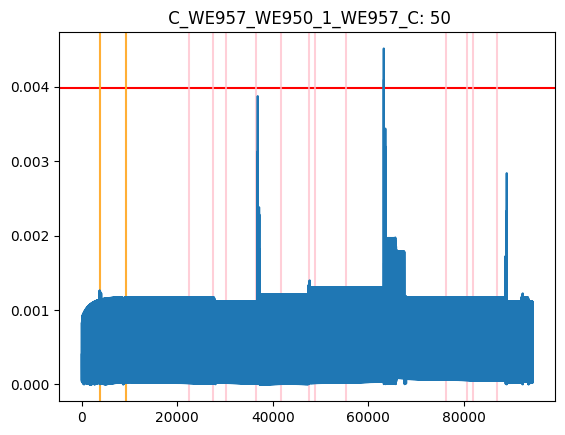

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = None
DD = None


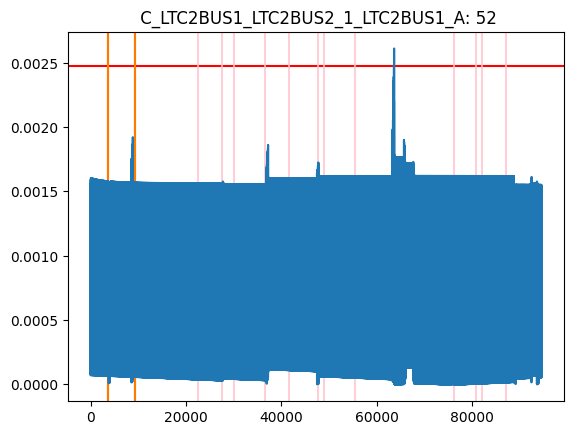

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = None
DD = None


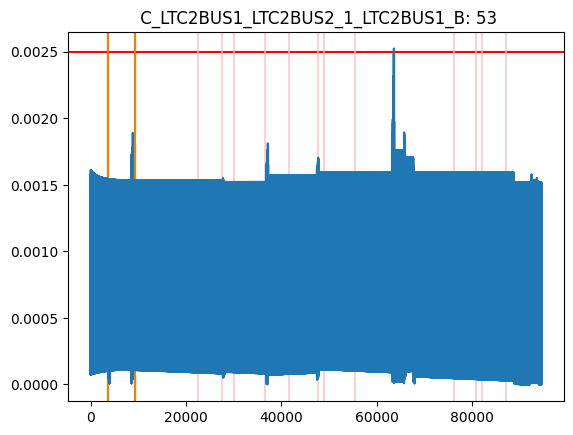

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = None
DD = None


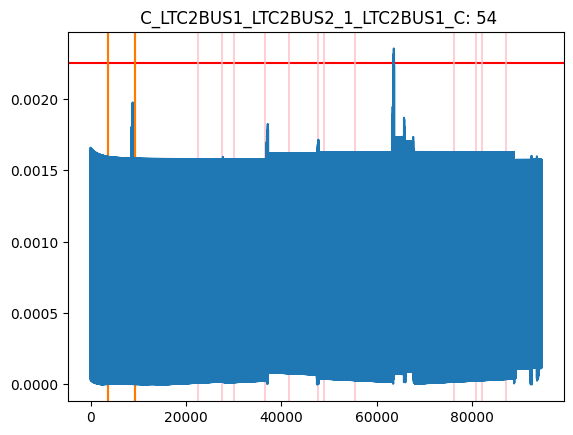

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = 13


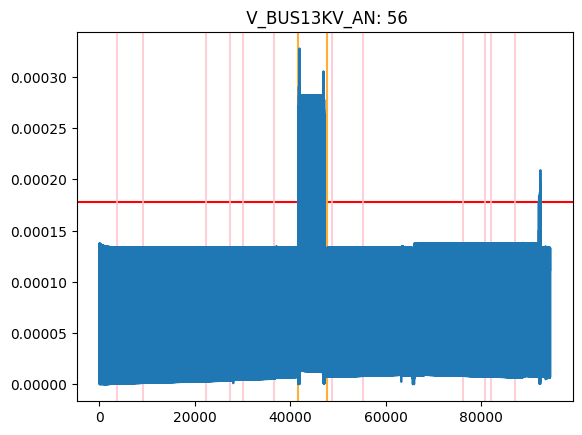

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = 0


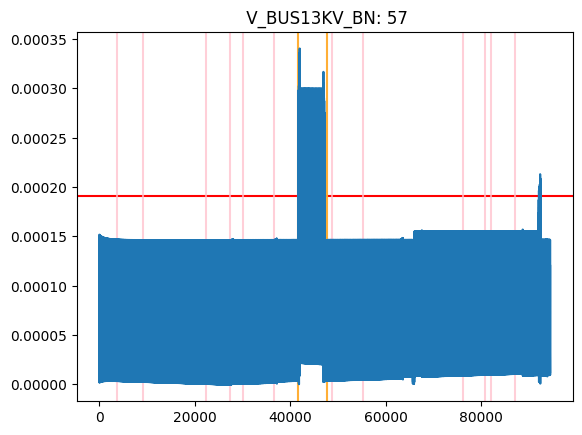

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = 26


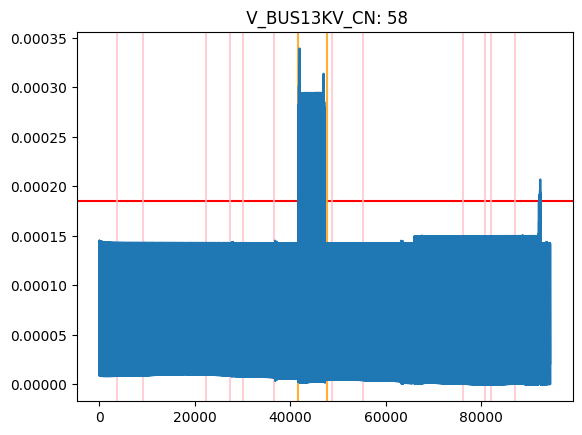

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = 4823
59
DD = None
59
DD = 21


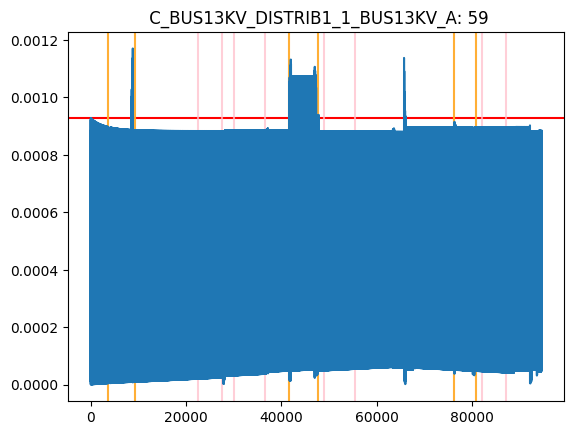

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = 4811
60
DD = None
60
DD = 7


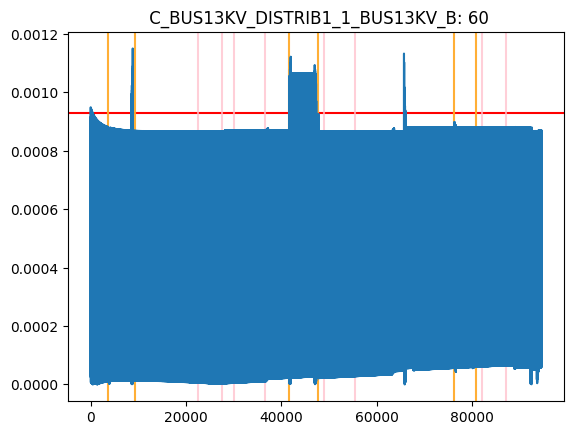

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = 4798
61
DD = None
61
DD = 34


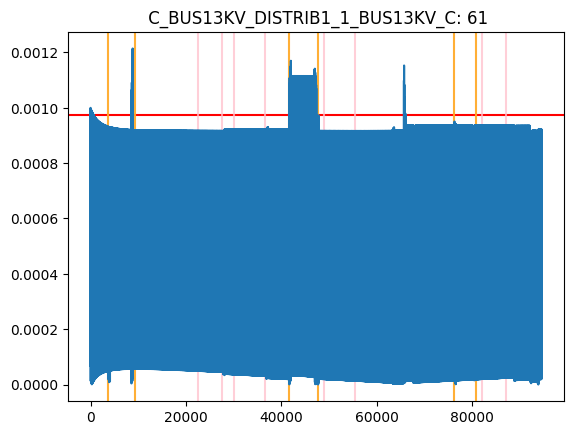

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = None
62
DD = 0


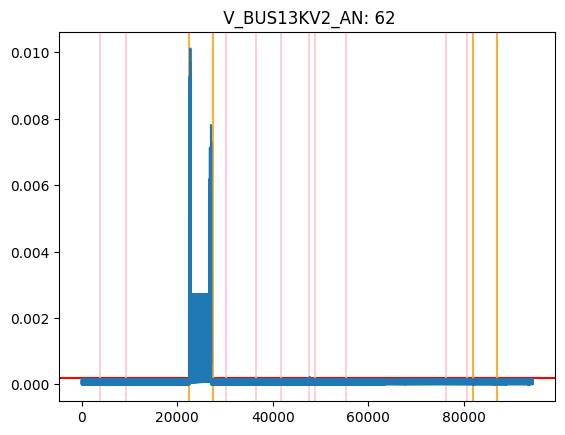

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 0
63
DD = None


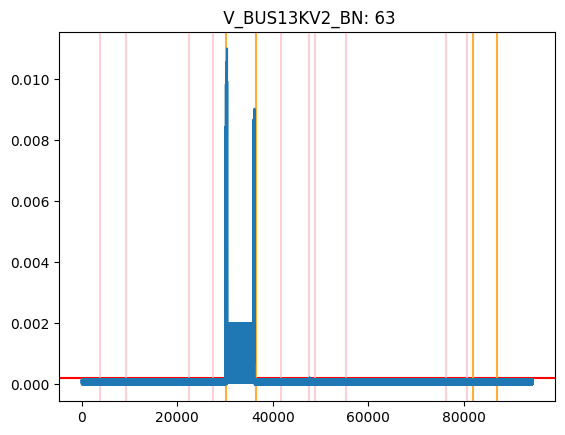

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = None


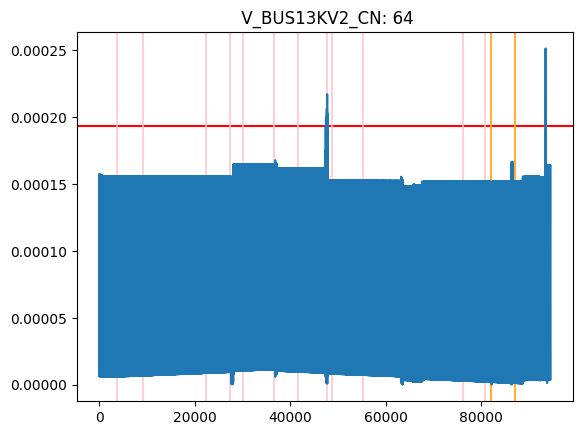

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


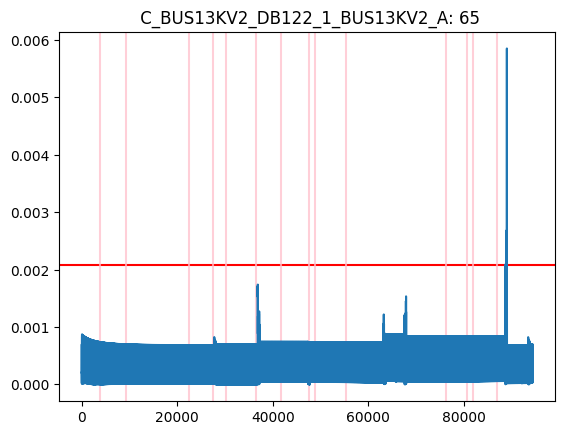

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = 0
DD = 0


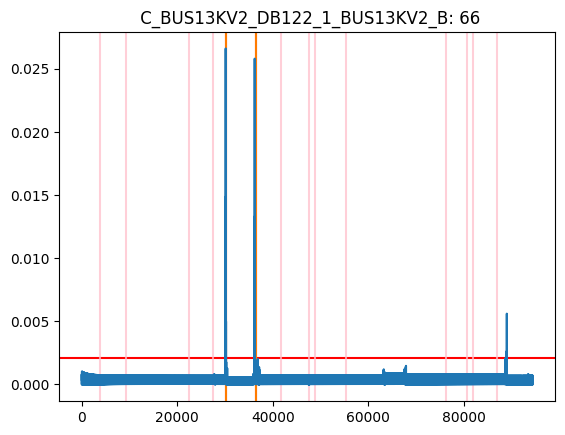

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


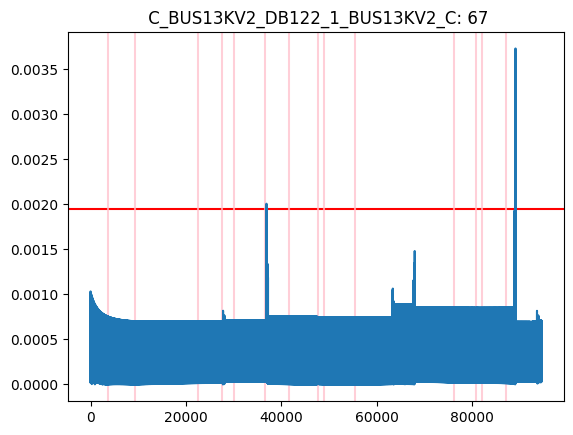

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 14
DD = 14


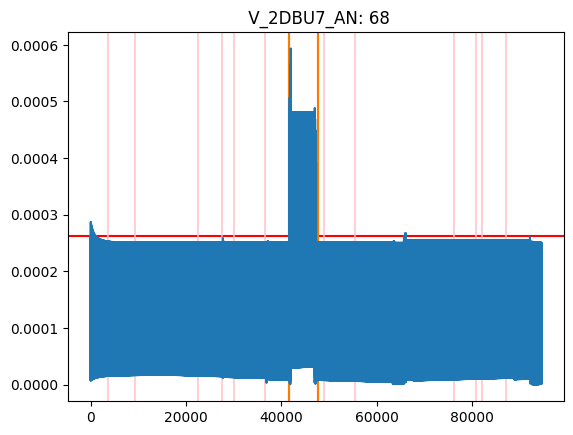

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 1
DD = 1


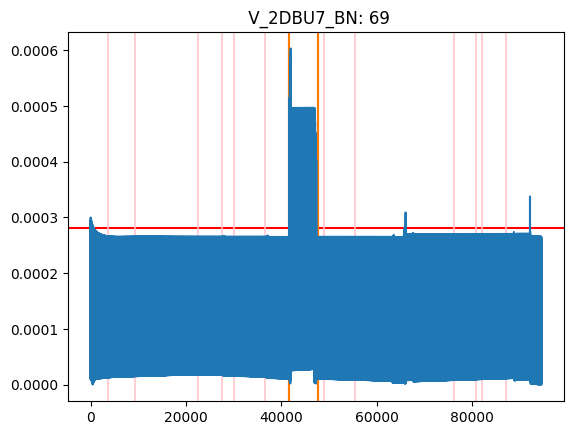

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 0
DD = 0


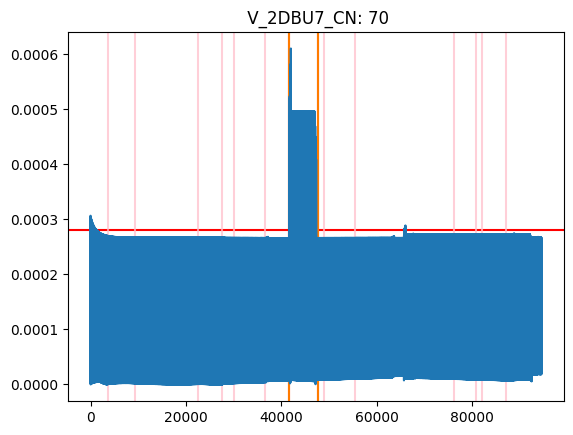

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
DD = None
DD = 17
DD = 17


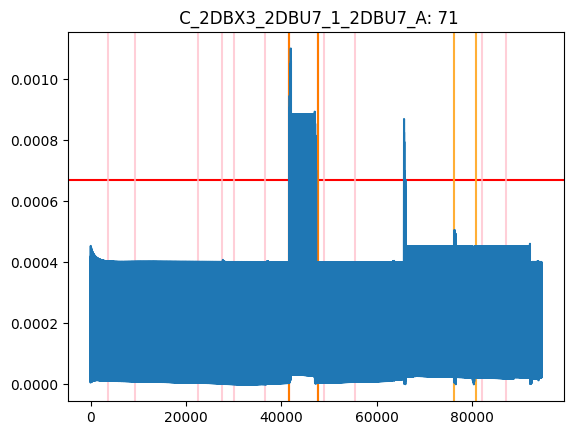

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
DD = None
DD = 4
DD = 4


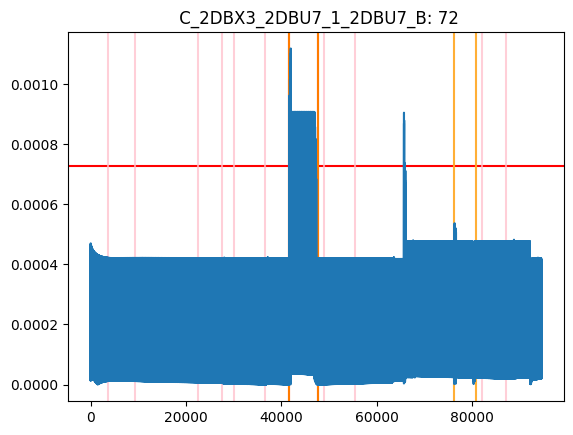

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
DD = None
DD = 30
DD = 30


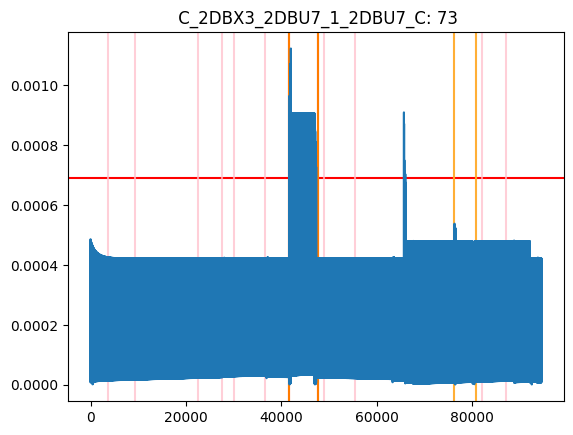

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None
74
DD = None


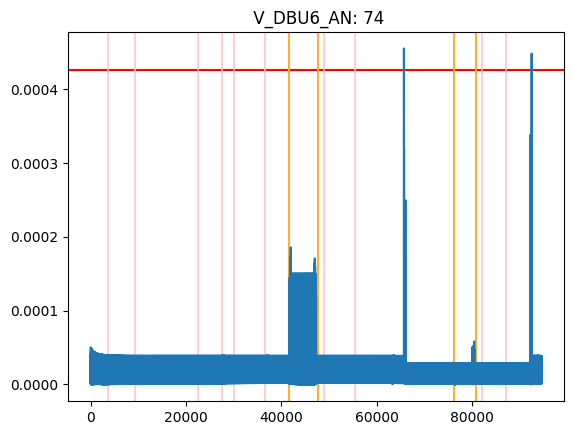

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None
75
DD = None


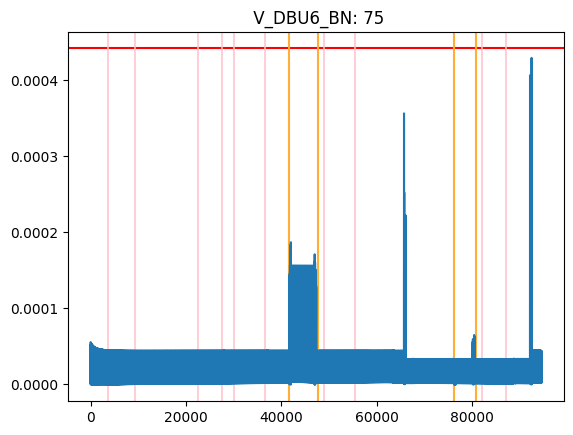

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None
76
DD = None


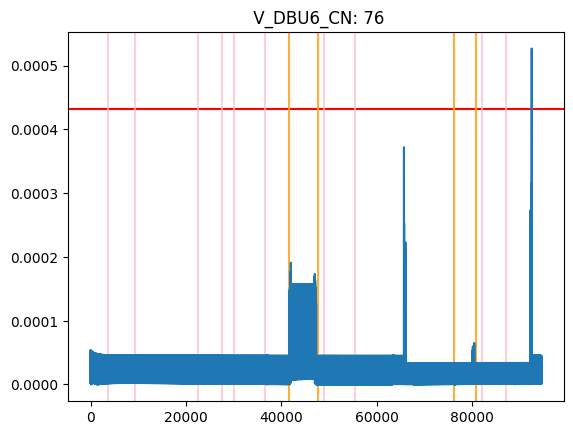

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = None
DD = None
DD = None


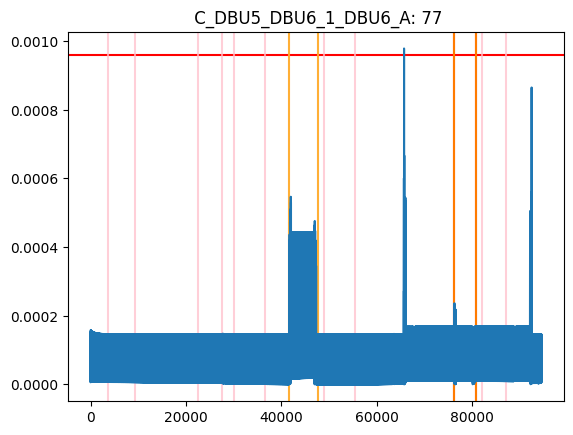

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = None
DD = None
DD = None


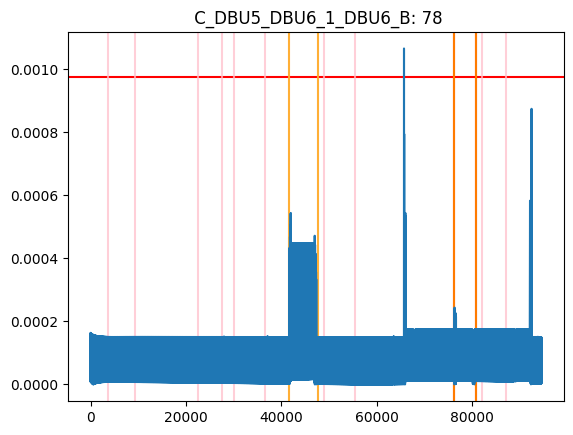

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = None
DD = None
DD = None


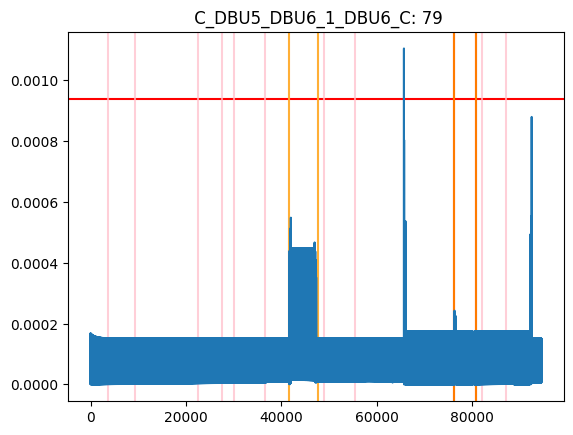

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = None


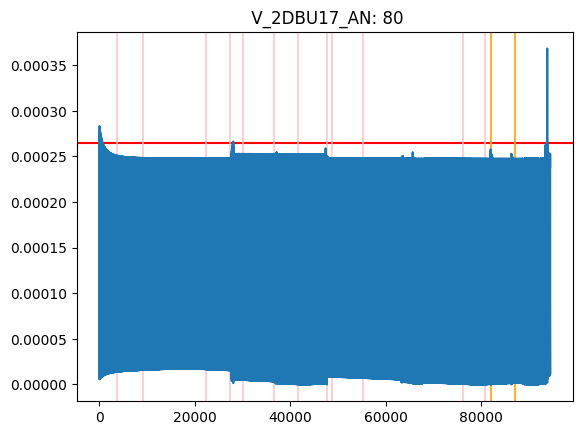

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = None


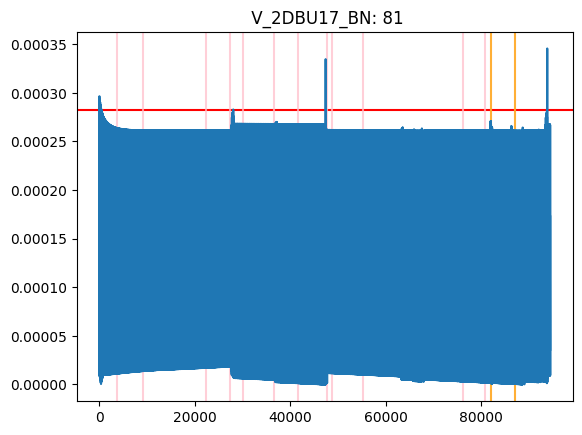

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = None


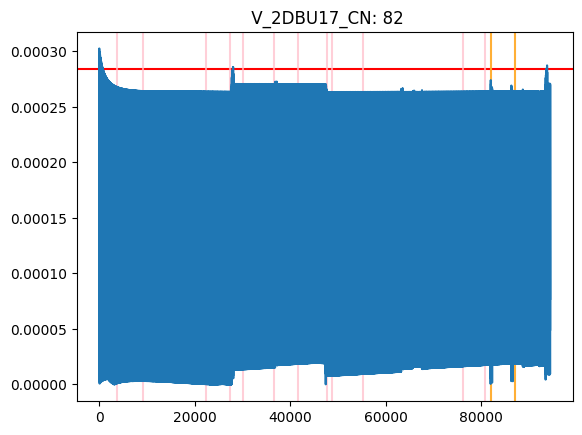

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


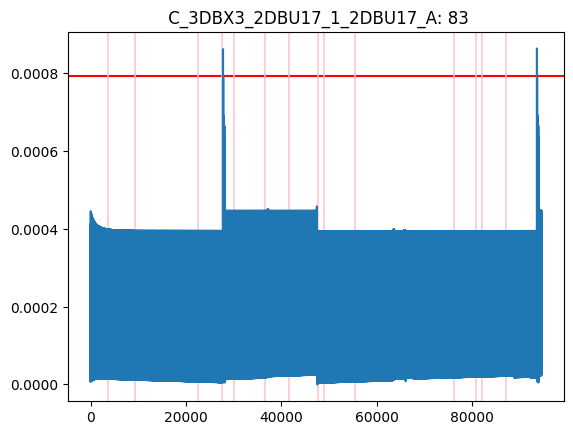

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 2


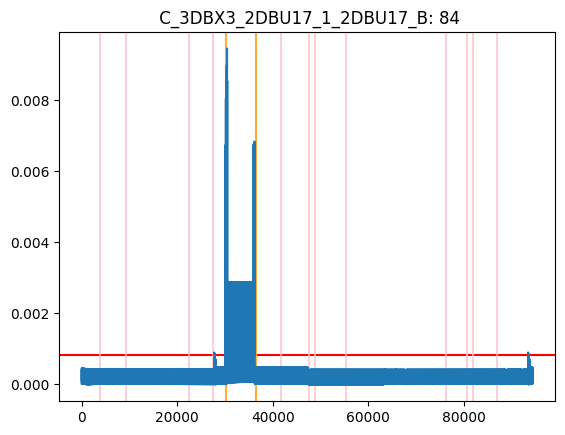

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


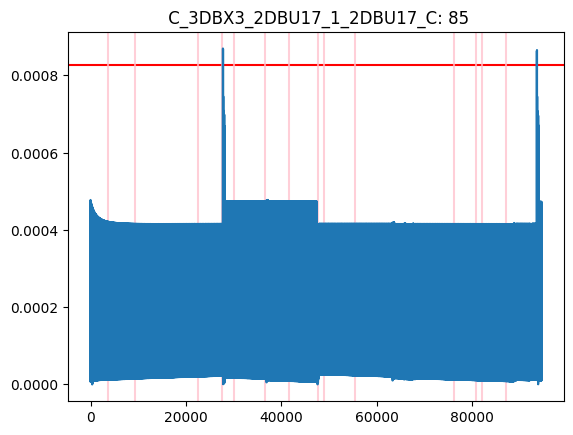

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = None
DD = None


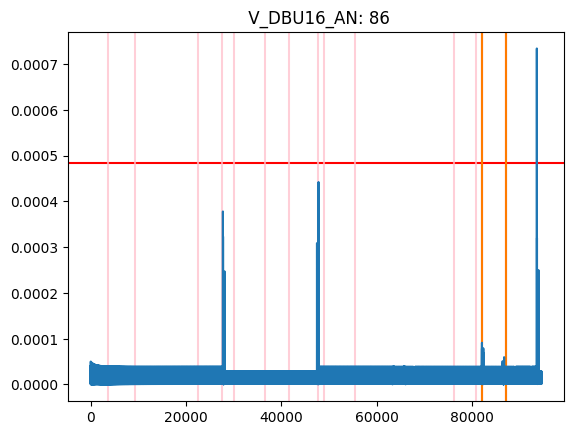

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = None
DD = None


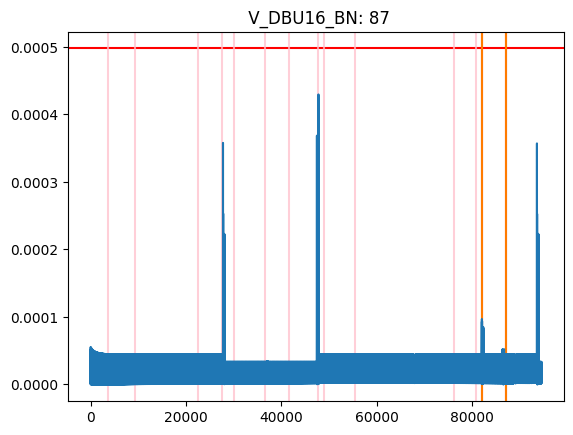

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = None
DD = None


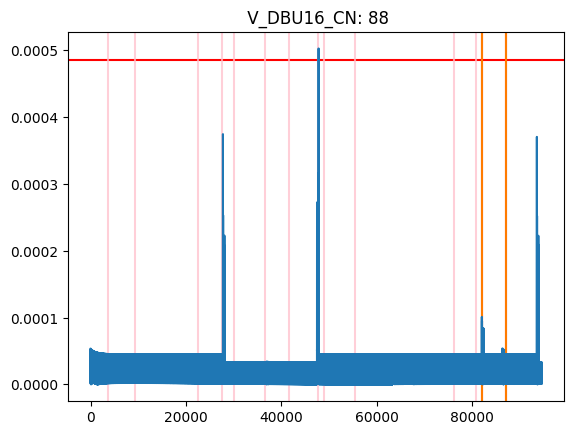

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A
89
DD = None


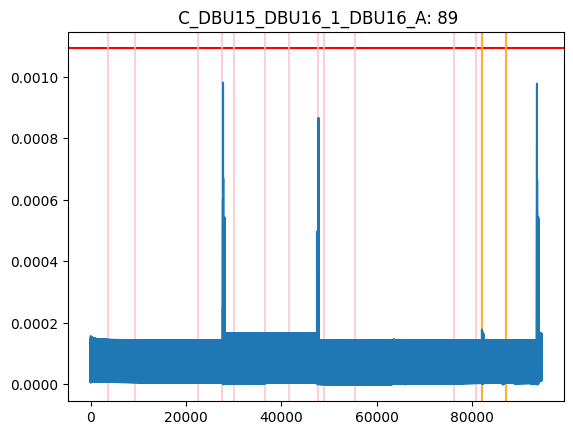

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 1
90
DD = None


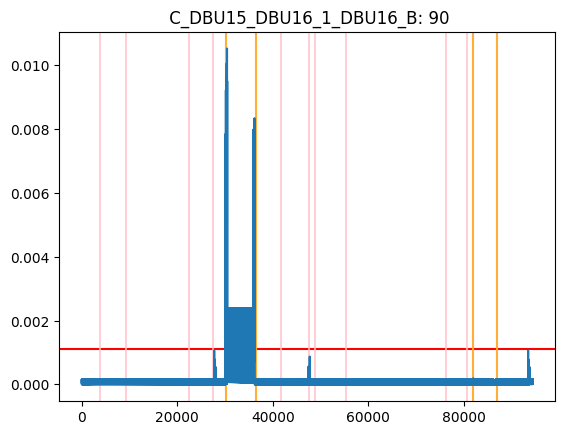

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C
91
DD = None


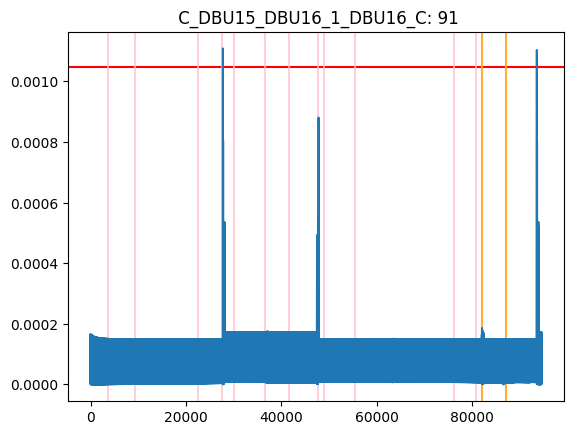

In [200]:
ADD_corr_99 = []
at_neighbors ={}
for index, i in enumerate(rsum_list_corr):
    print("***********************************************************************************************")
    attack_in = (i > thresholds_corr_99[index]).nonzero()
#     for indices, j in enumerate(i):
#         if j > thresholds[index]:
#             attack_in.append(indices)
#     if len(attack_in) > 3:
#       start = (df_test['Time'][attack_in[0]+1201+window+w-1])/1e6
#       end = (df_test['Time'][attack_in[-1]+1201+window+w-1])/1e6
#       a_type = ""
#       if cols[things[index]-1][1] == "C":
#         a_type = "CT_ratio"
#       elif cols[things[index]-1][1] == "V":
#         a_type = "PT_ratio"
    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#       at_sensors += [things[index]]
    at_neighbors[things[index]] = attack_in
#       atk = True
#     else:
#       atk = False
#       print(f"Sensor: {things[index]} {cols[things[index]-1]}, No Attacks")


    plt.title(f"{cols[things[index]-1]}: {things[index]}")
    plt.axhline(thresholds_corr_99[index], color='red')


    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[(df_test['Time'] >= attack_dict[things[index]][0] * 1e6) & (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD_corr_99 = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                ADD_corr_99.append(DD_corr_99)
                print(f"DD = {DD_corr_99}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')


            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

            start_w = start-window-w
            end_w = end+window+w-1
            for starts, ate in attack_i.items():
              if starts == start and things[index] in ate:
                DD_corr_99 = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                ADD_corr_99.append(DD_corr_99)
                print(f"DD = {DD_corr_99}")
                plt.axvline(start_w, color='orange', alpha=0.75)
                plt.axvline(end_w, color='orange', alpha=0.75)
    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_corr_99 = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_corr_99.append(DD_corr_99)
                  print(f"DD = {DD_corr_99}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


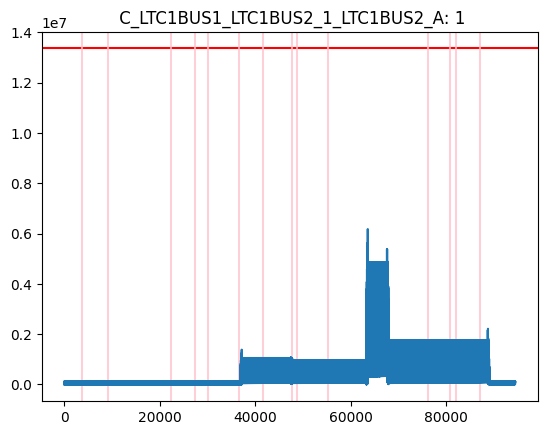

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 1


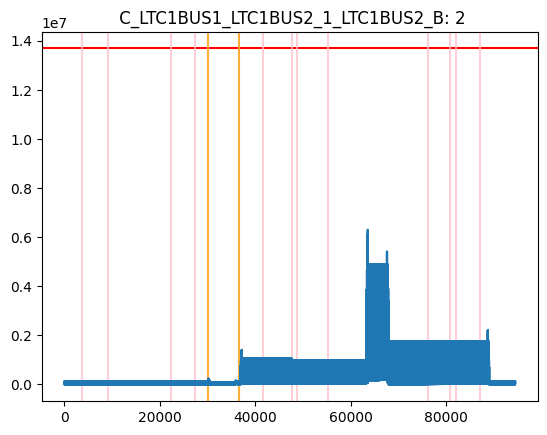

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


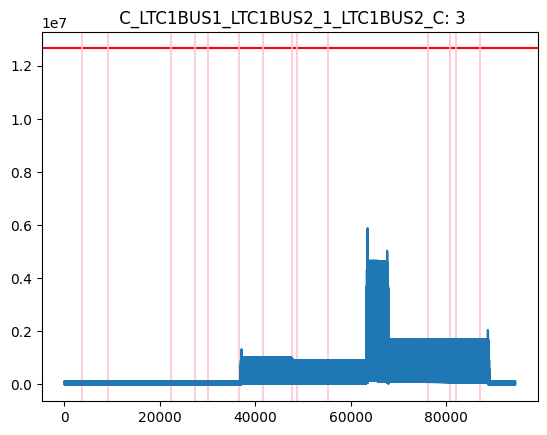

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 18
5
DD = 0


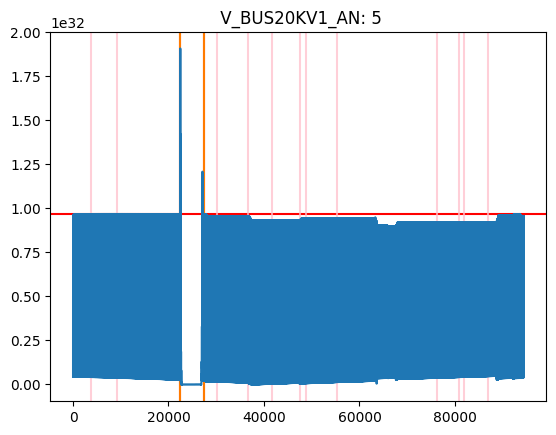

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


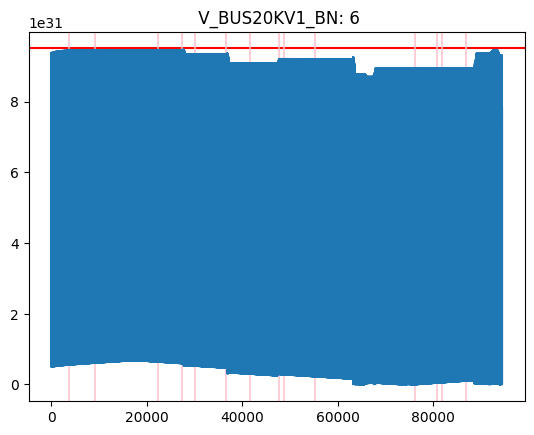

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


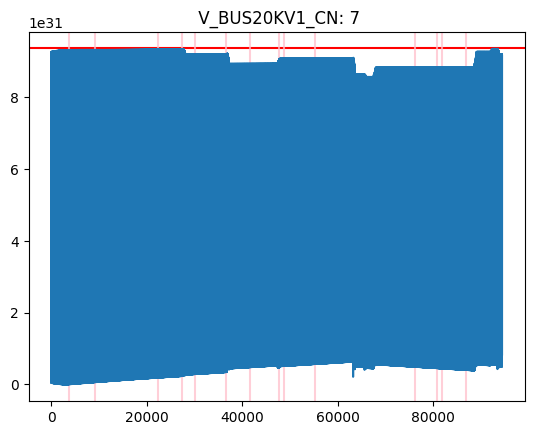

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


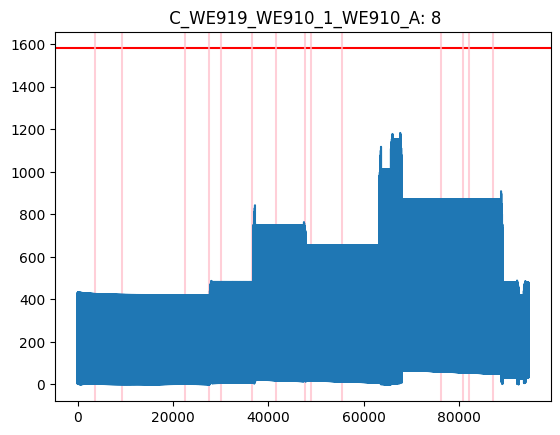

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


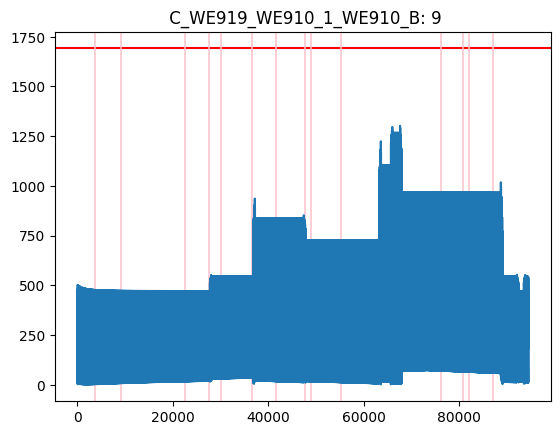

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


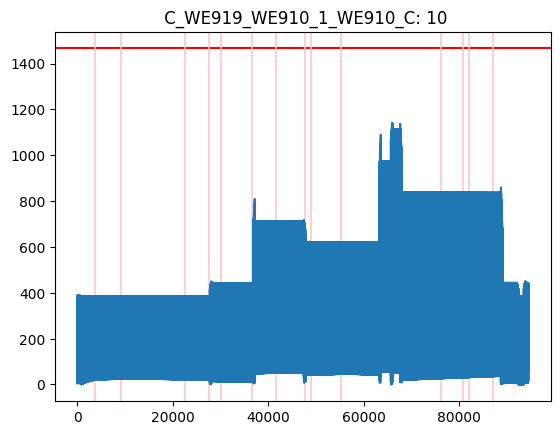

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 16


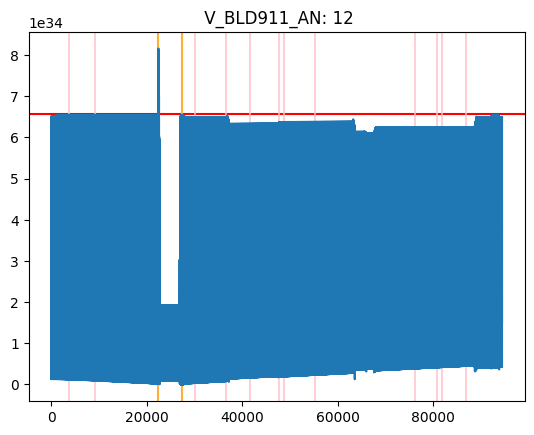

***********************************************************************************************
Sensor: 13  V_BLD911_BN


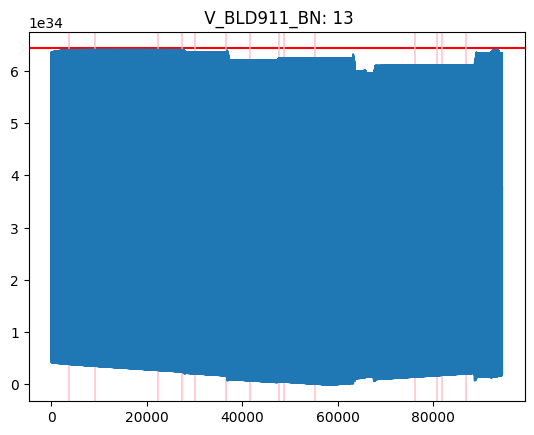

***********************************************************************************************
Sensor: 14  V_BLD911_CN


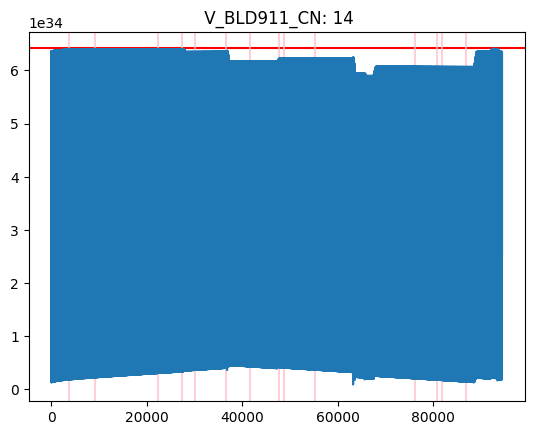

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = None


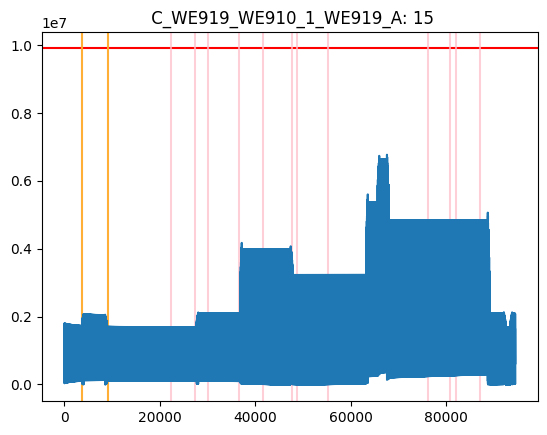

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = None


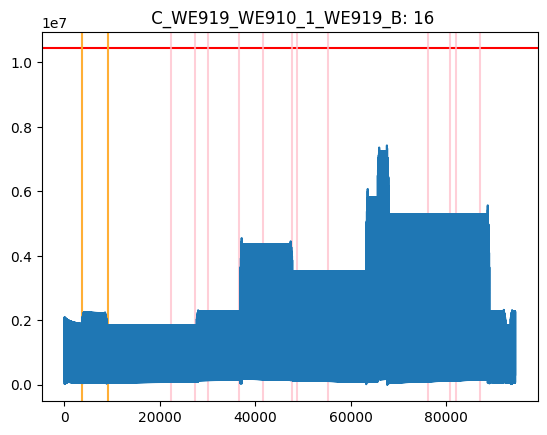

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = None


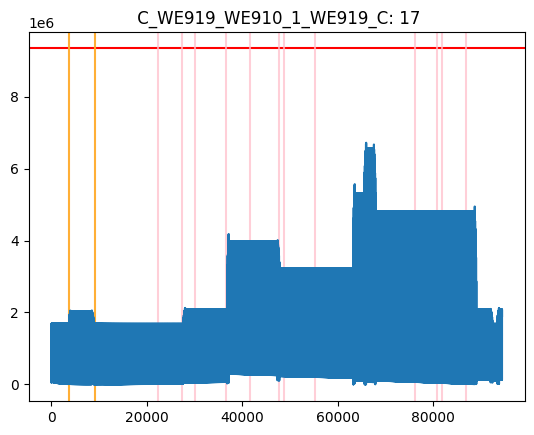

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 16


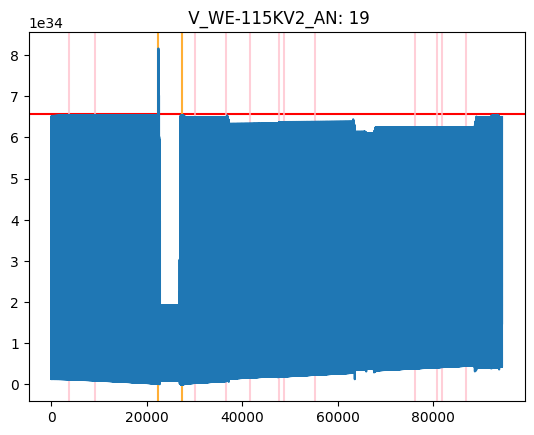

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


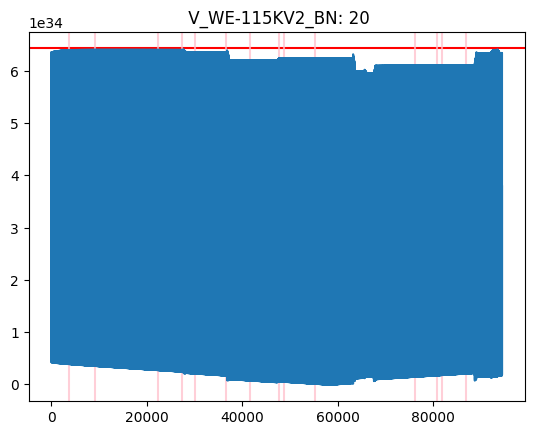

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


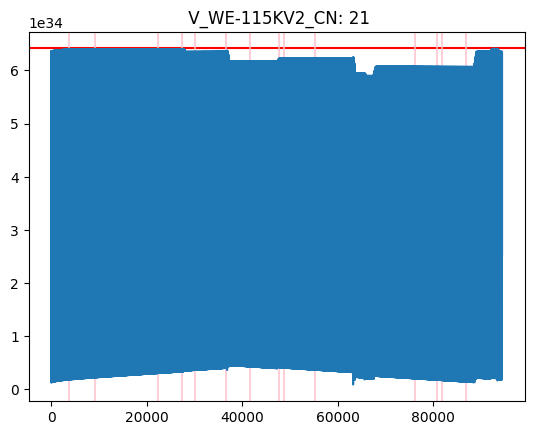

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


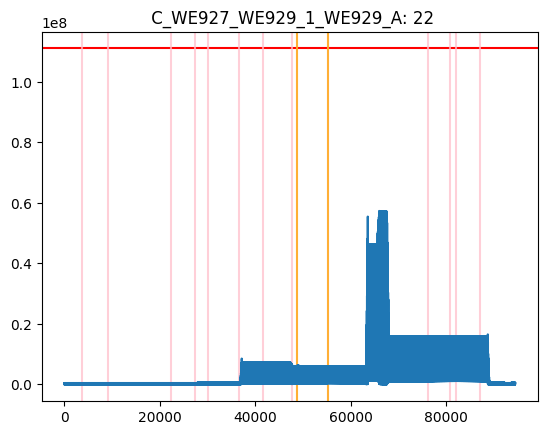

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


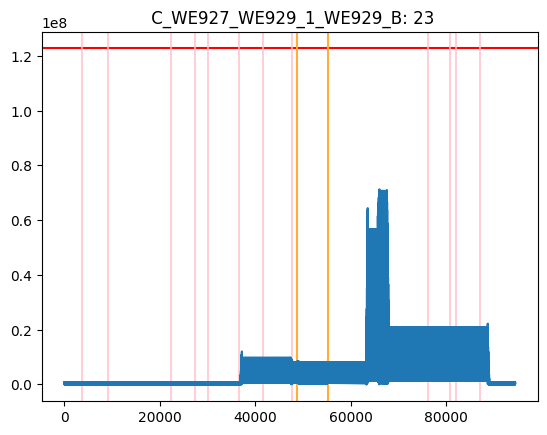

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


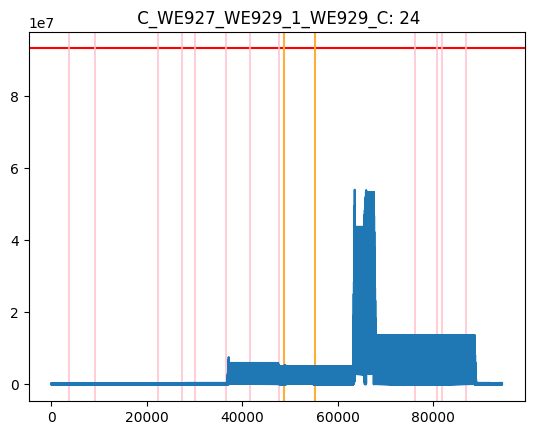

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 16


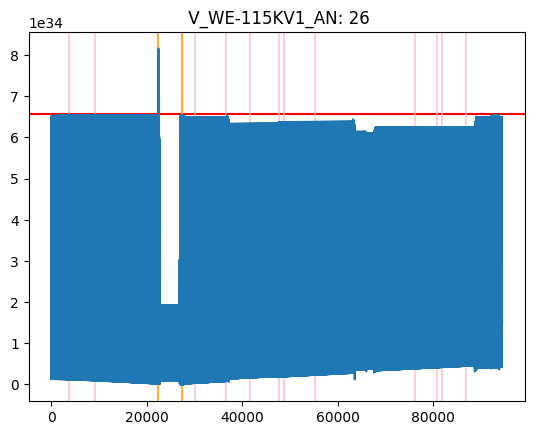

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


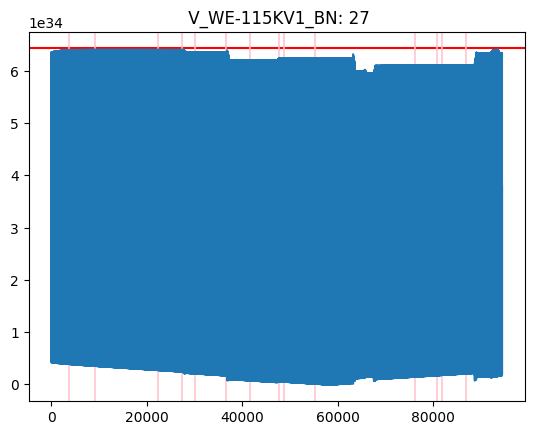

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


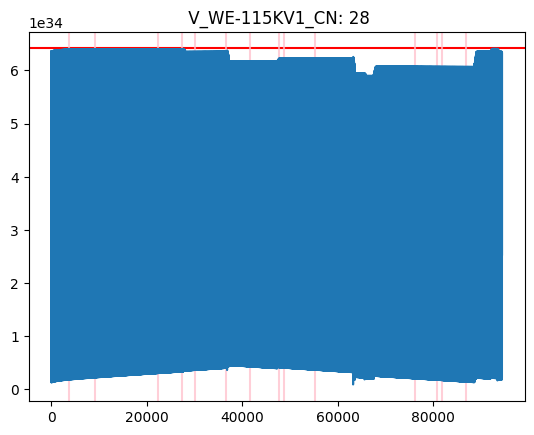

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


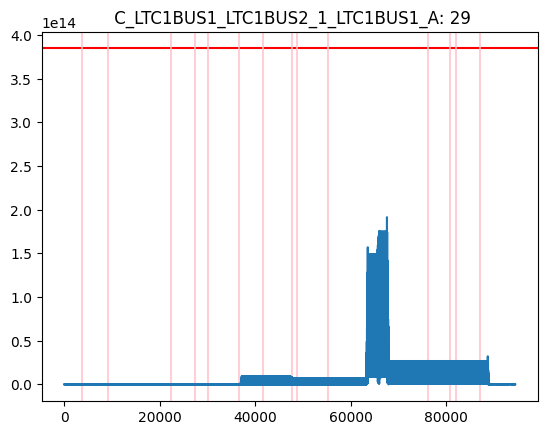

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = 6


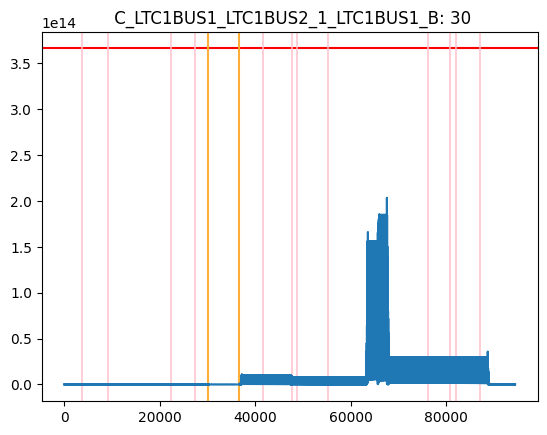

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


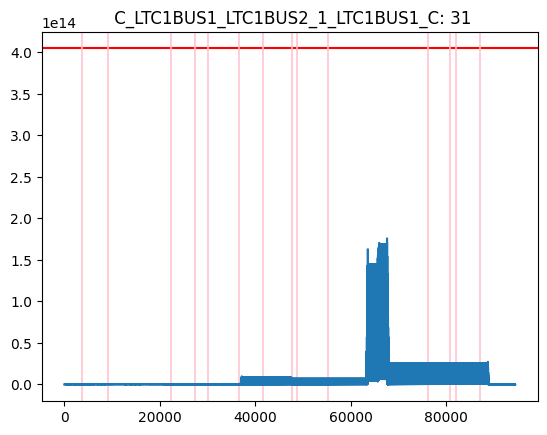

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


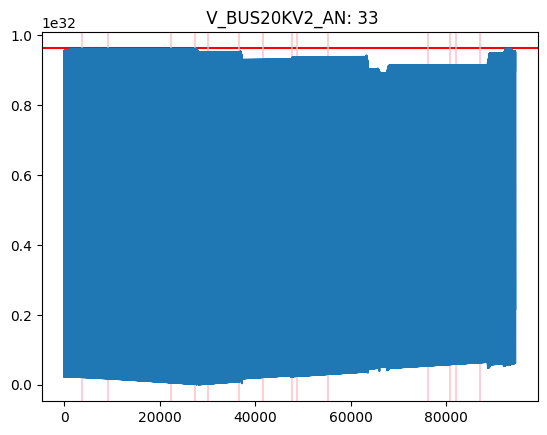

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


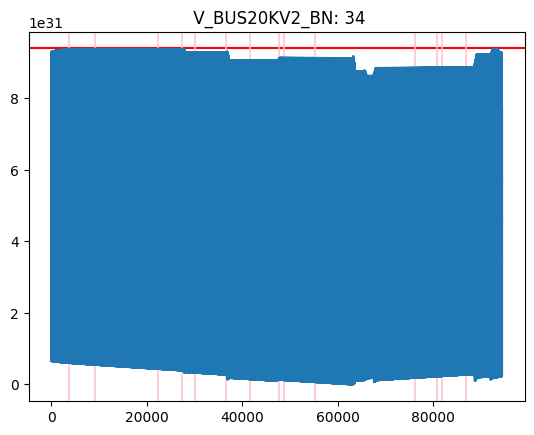

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


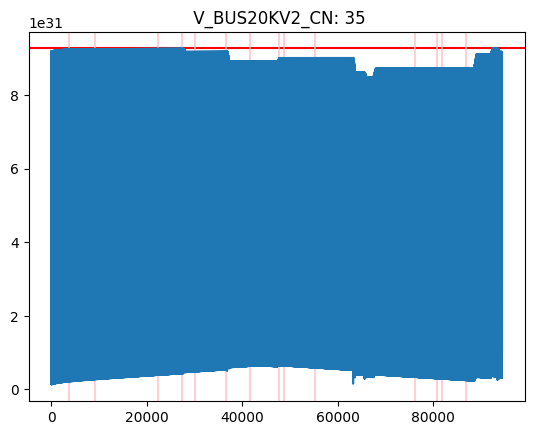

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = None
36
DD = 0


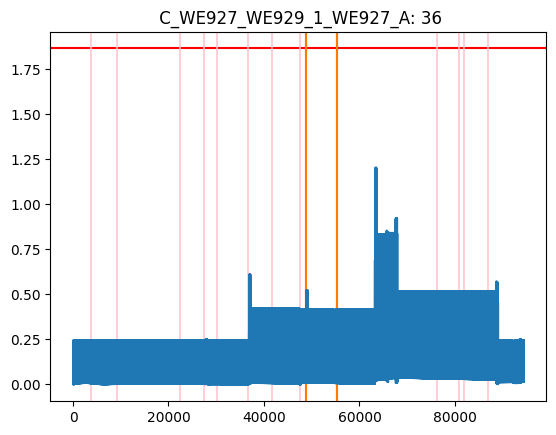

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = None
37
DD = 0


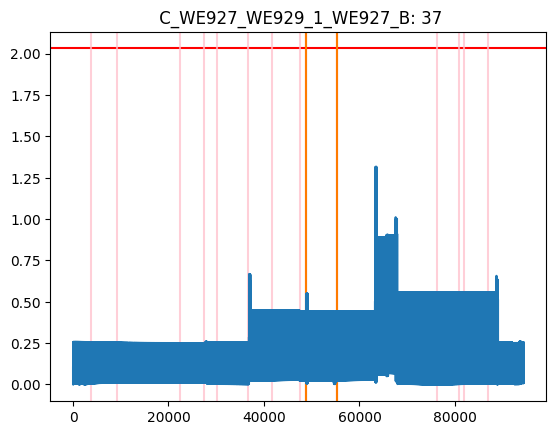

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = None
38
DD = 0


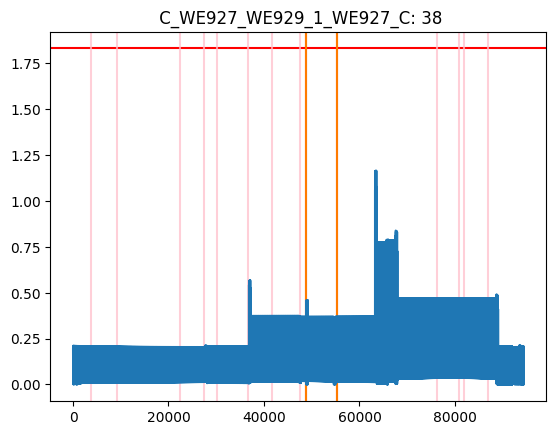

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


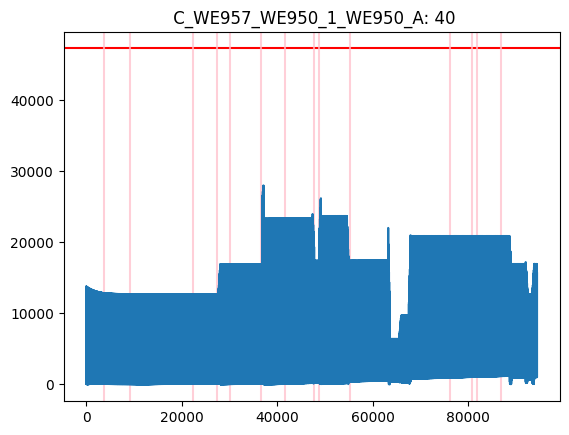

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


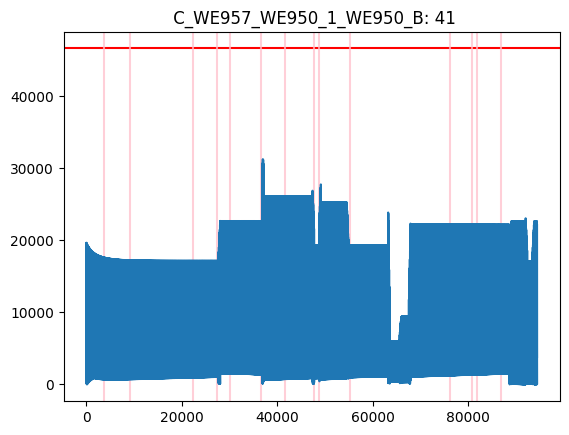

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


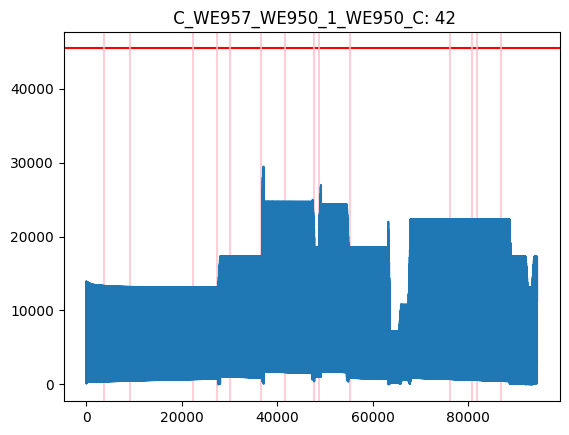

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 4804


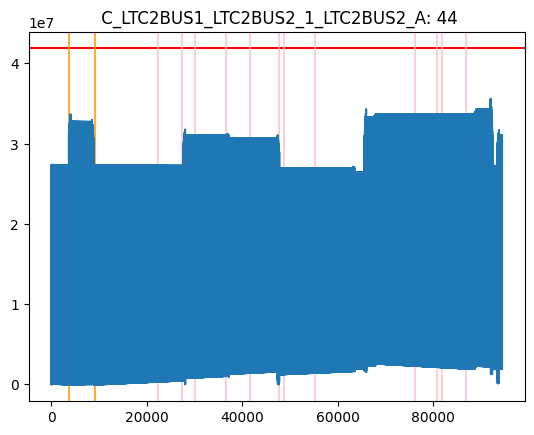

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 4810


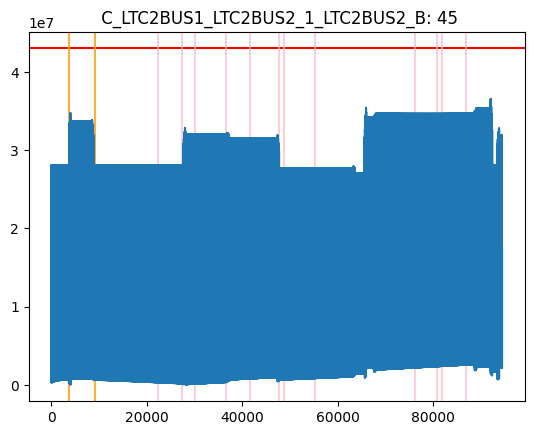

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 4798


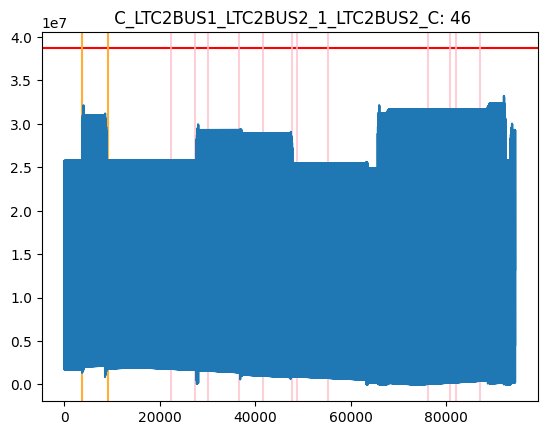

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = None


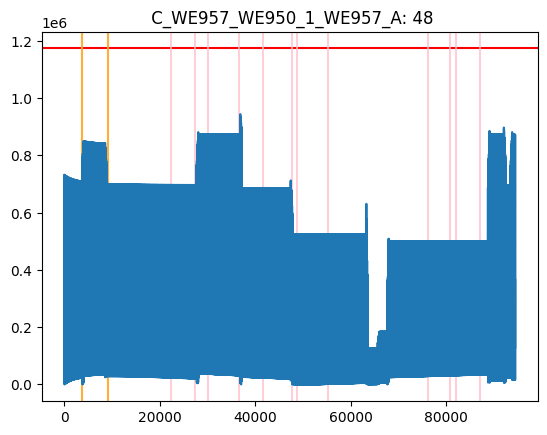

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


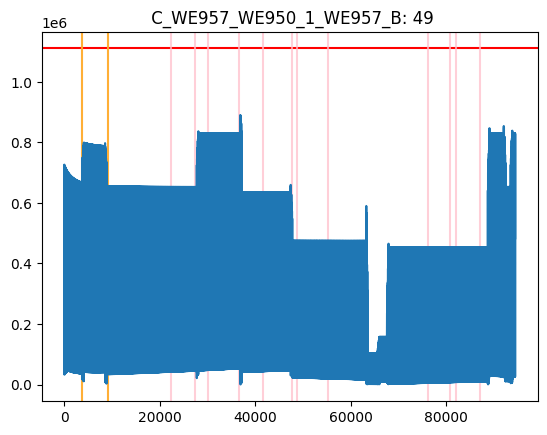

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = None


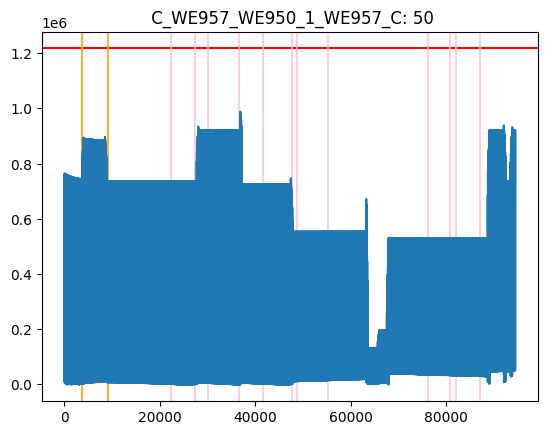

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = 284
52
DD = None


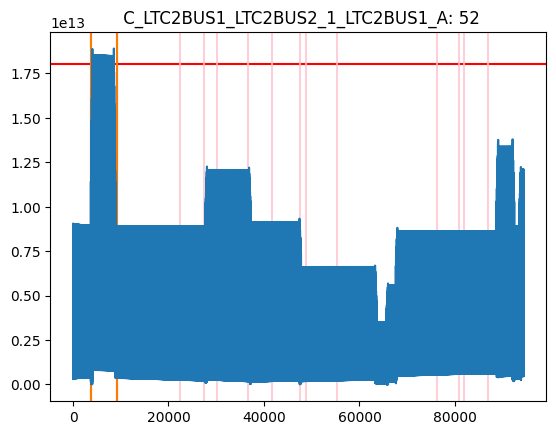

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = 310
53
DD = None


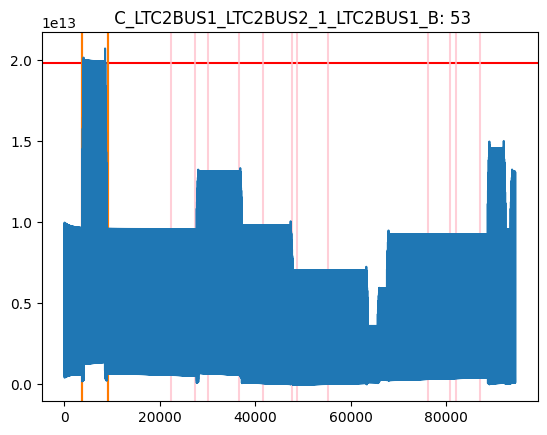

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = 296
54
DD = None


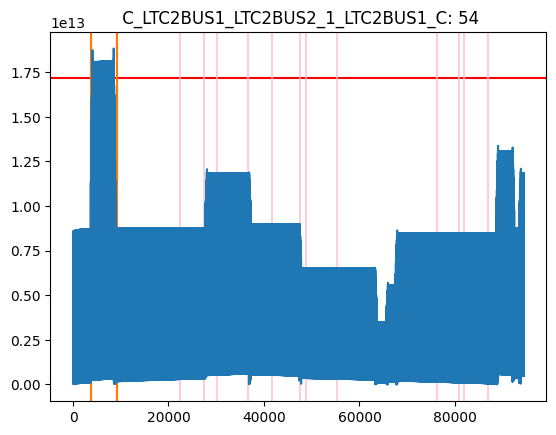

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = 13


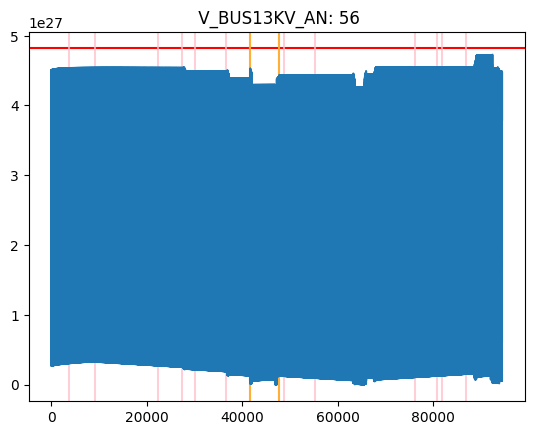

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = 0


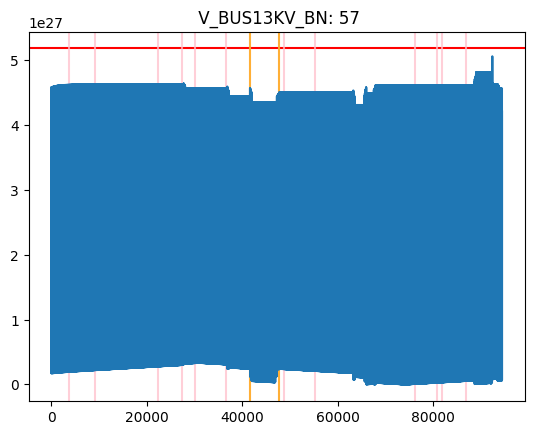

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = 26


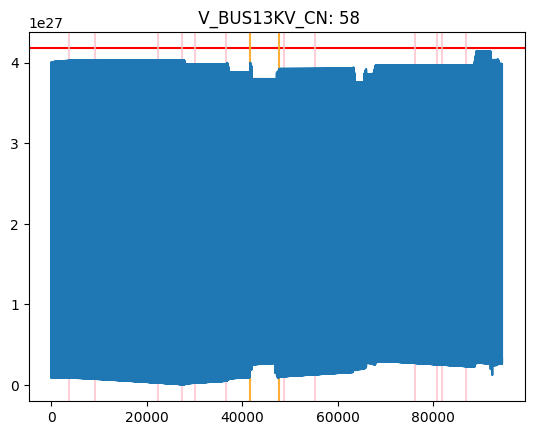

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = 4823
59
DD = None
59
DD = 21


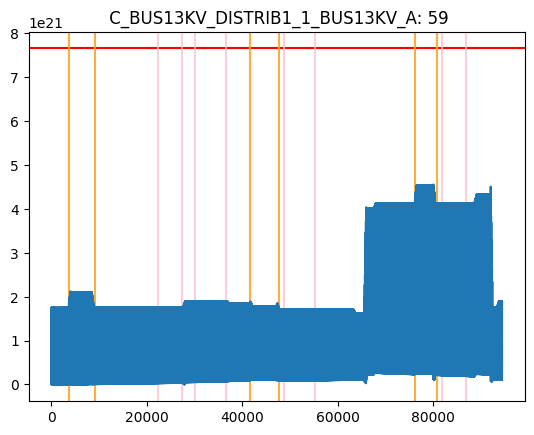

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = 4811
60
DD = None
60
DD = 7


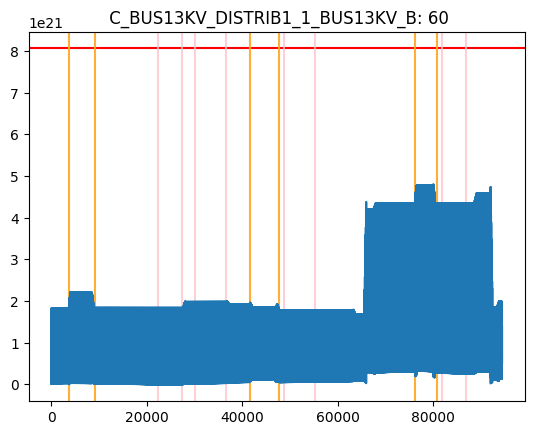

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = 4798
61
DD = None
61
DD = 34


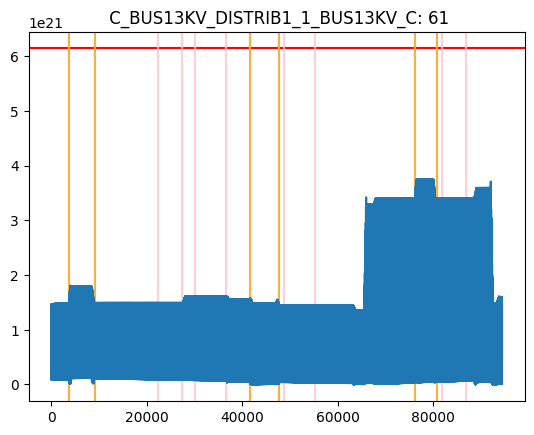

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = None
62
DD = 0


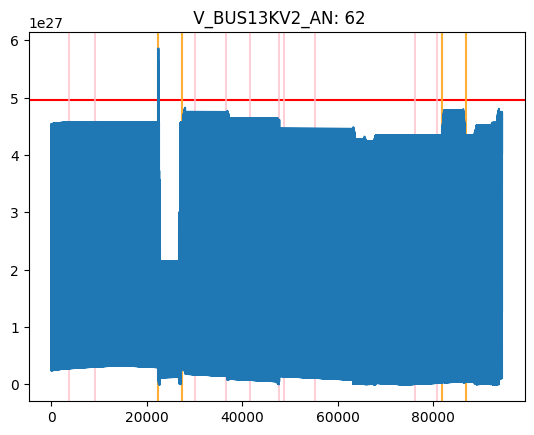

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 0
63
DD = None


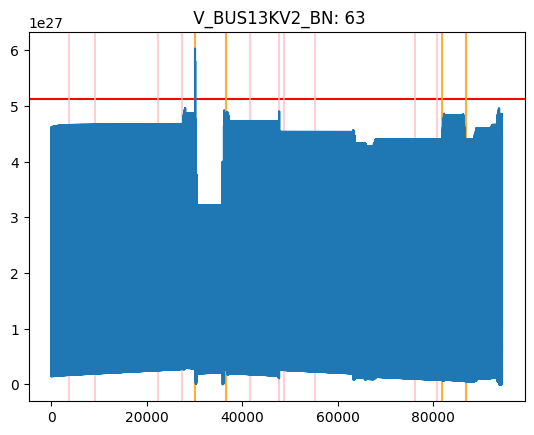

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = None


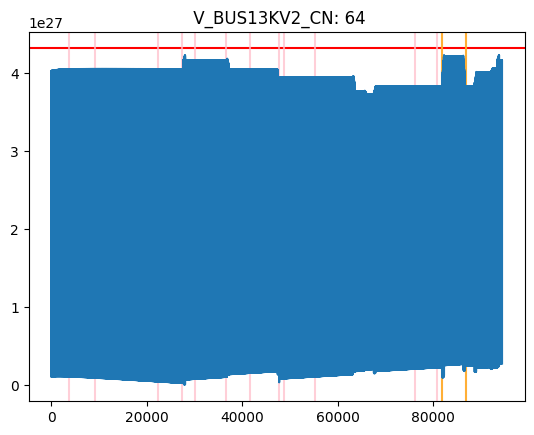

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


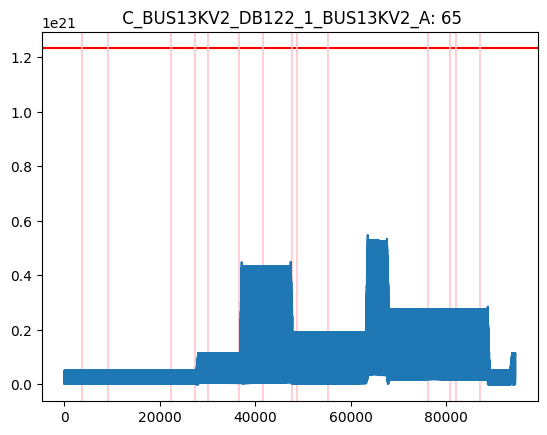

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = None
66
DD = 0


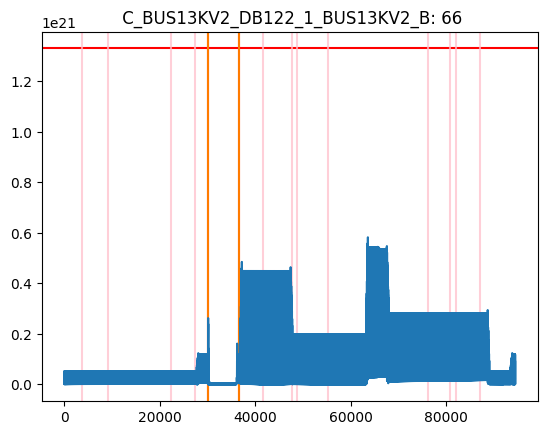

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


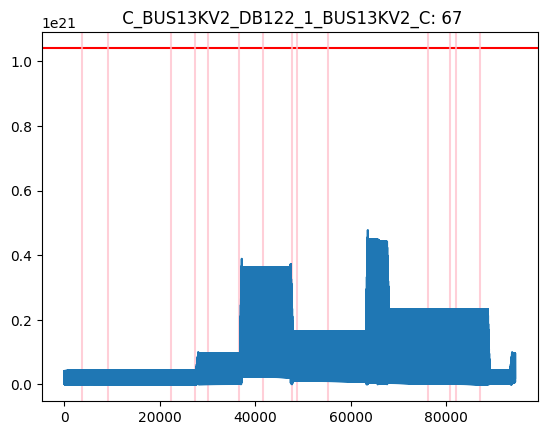

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 0
68
DD = 14


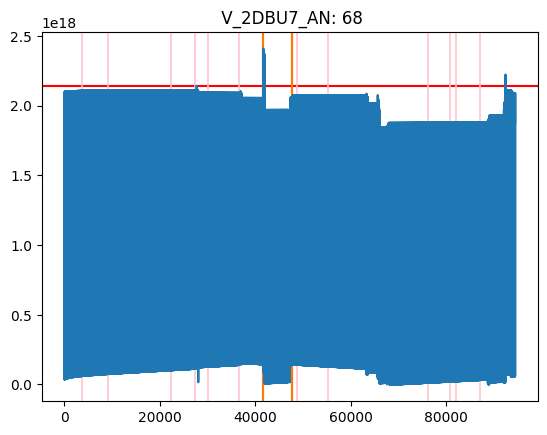

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 5
69
DD = 1


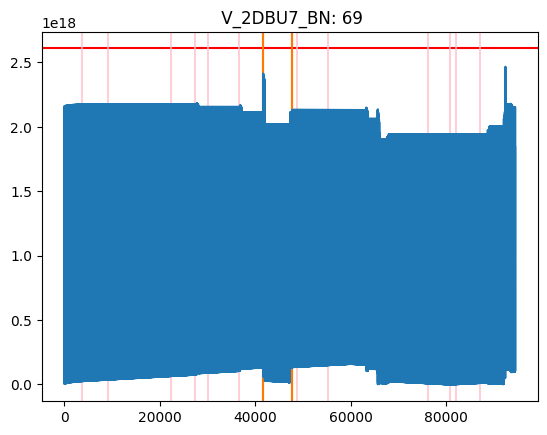

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 12
70
DD = 0


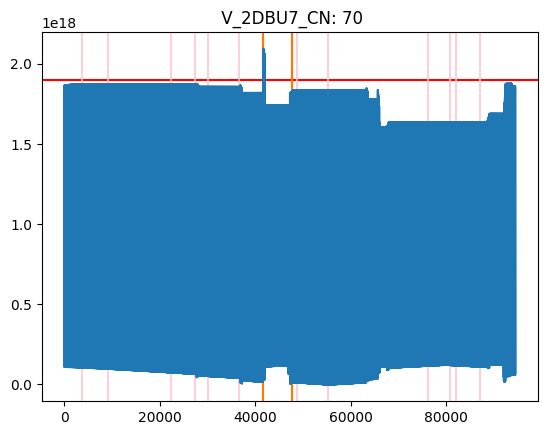

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
71
DD = None
DD = None
71
DD = 17


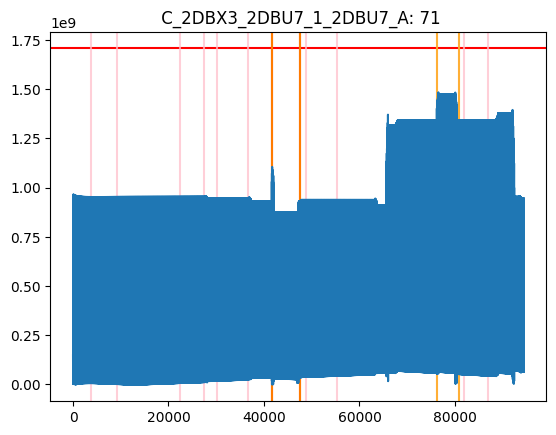

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
72
DD = None
DD = None
72
DD = 4


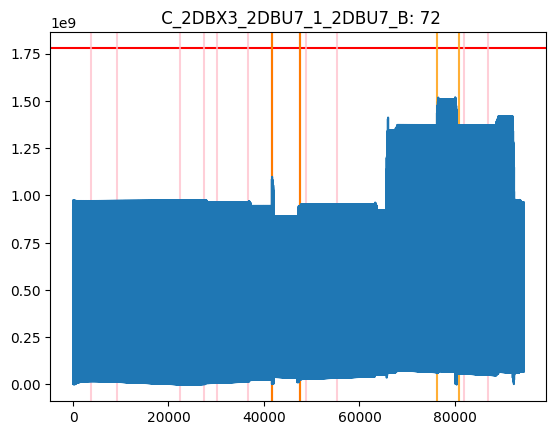

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
73
DD = None
DD = None
73
DD = 30


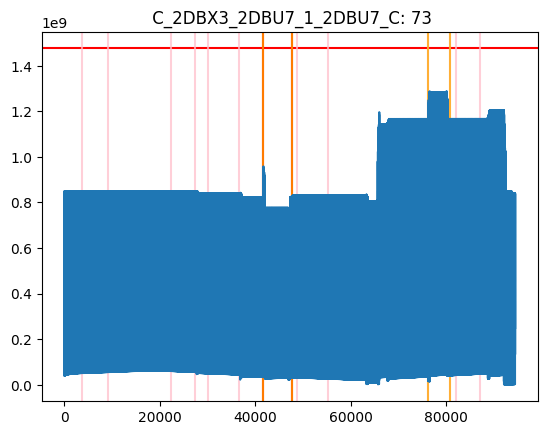

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None
74
DD = None


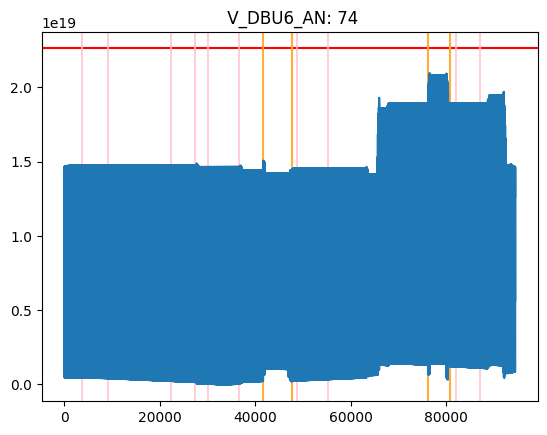

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None
75
DD = None


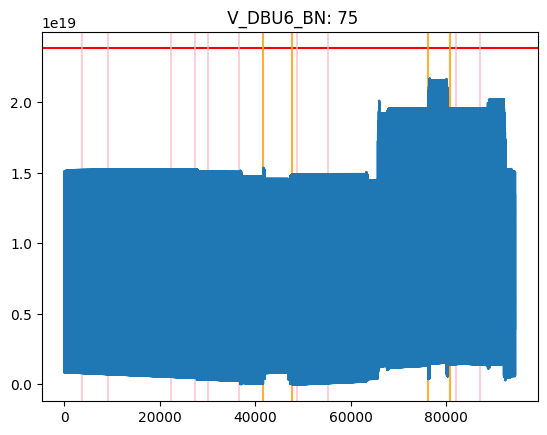

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None
76
DD = None


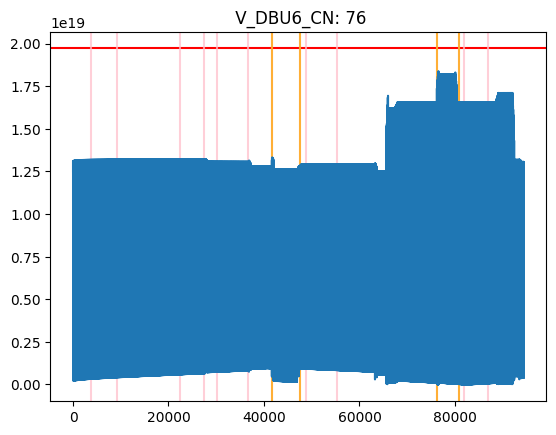

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = None
77
DD = None
77
DD = None


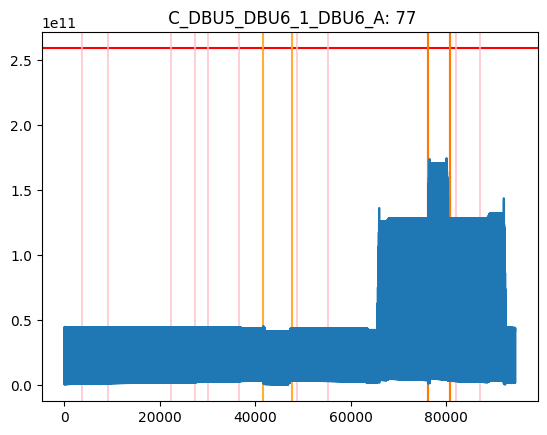

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = None
78
DD = None
78
DD = None


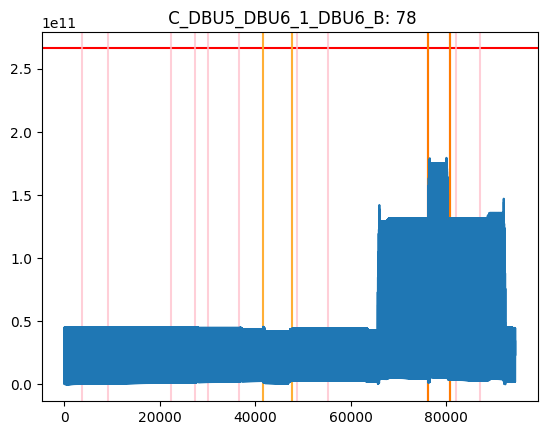

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = None
79
DD = None
79
DD = None


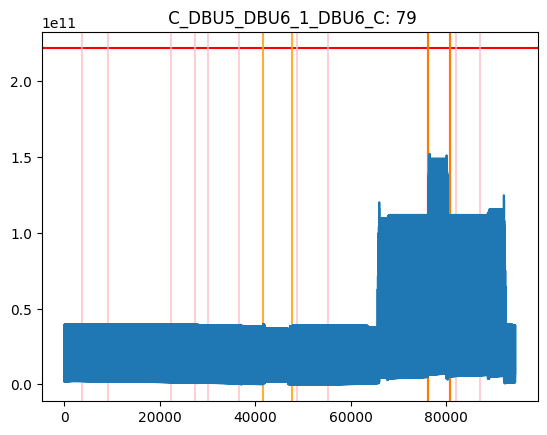

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = None


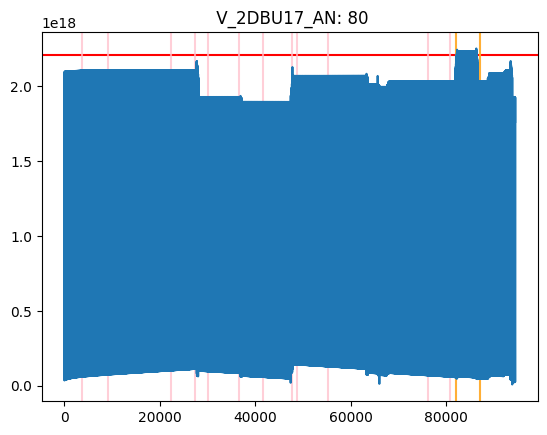

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = None


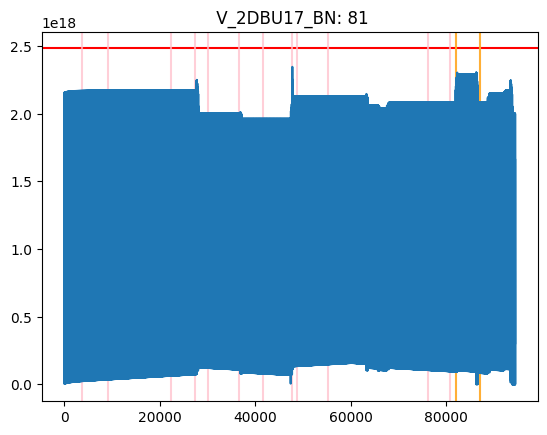

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = None


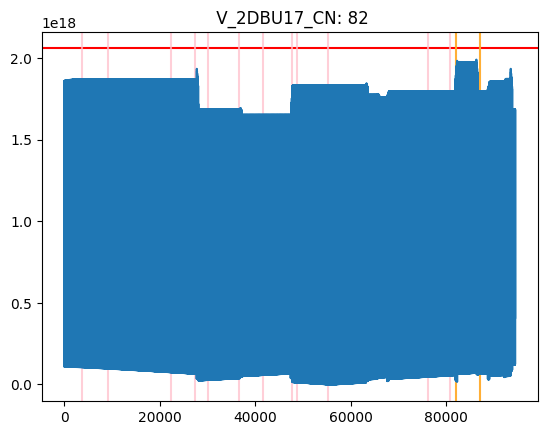

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


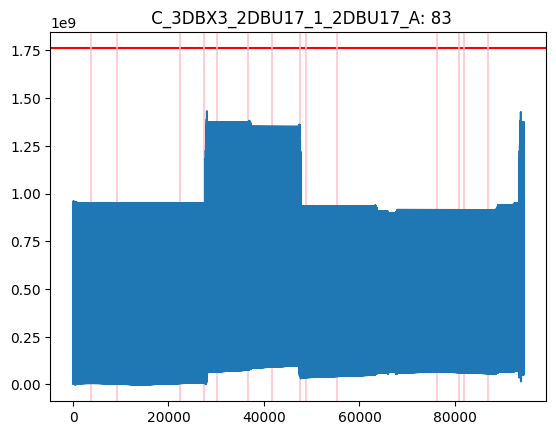

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 2


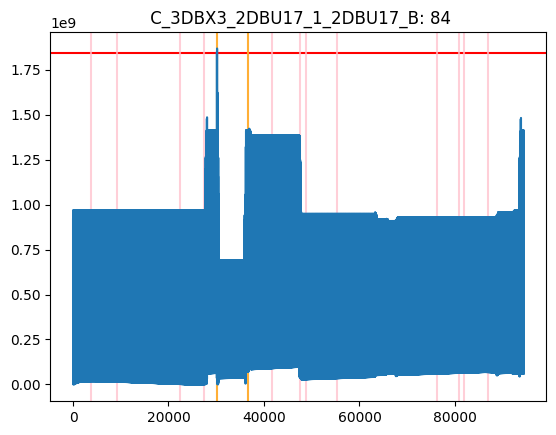

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


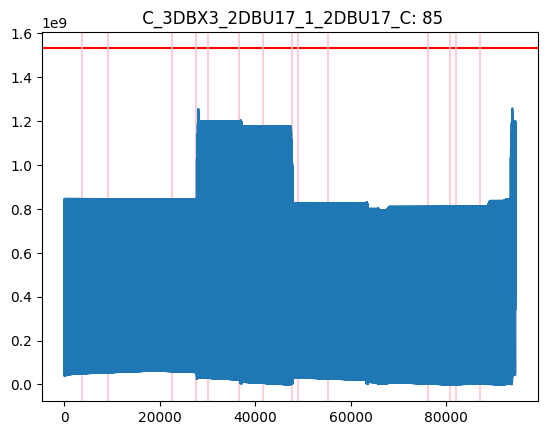

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = None
86
DD = None


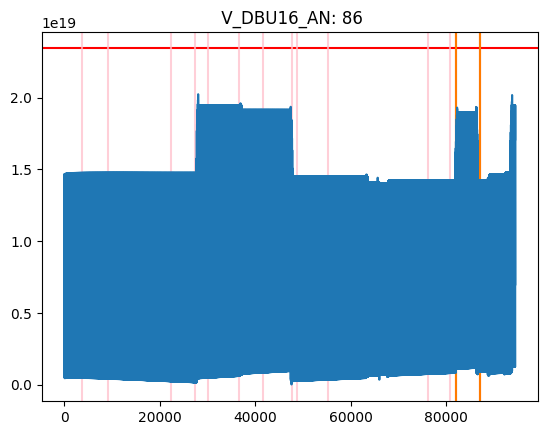

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = None
87
DD = None


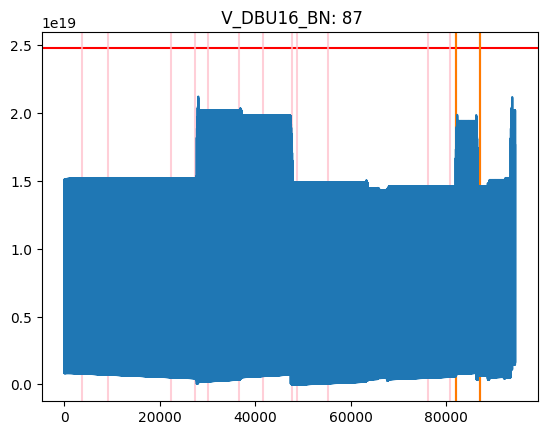

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = None
88
DD = None


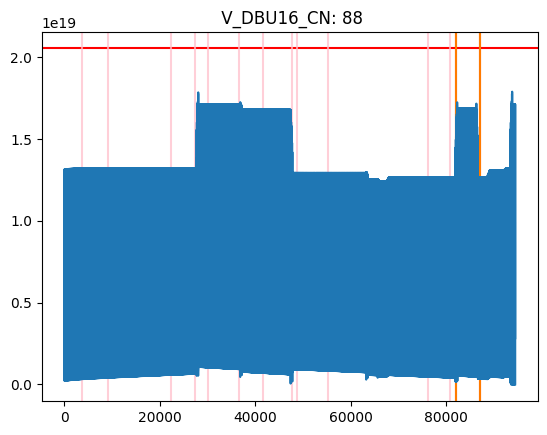

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A
89
DD = None


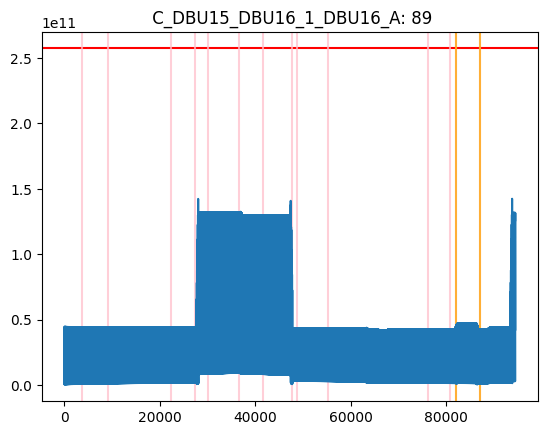

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 1
90
DD = None


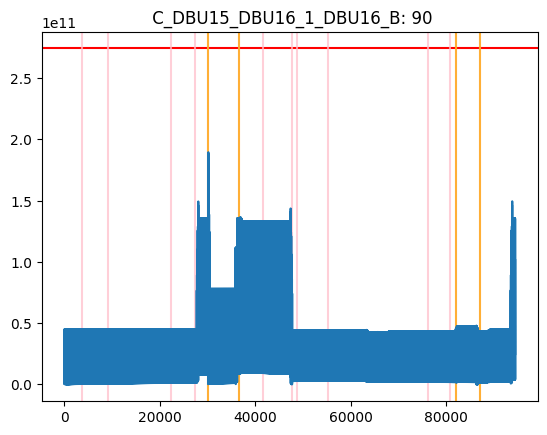

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C
91
DD = None


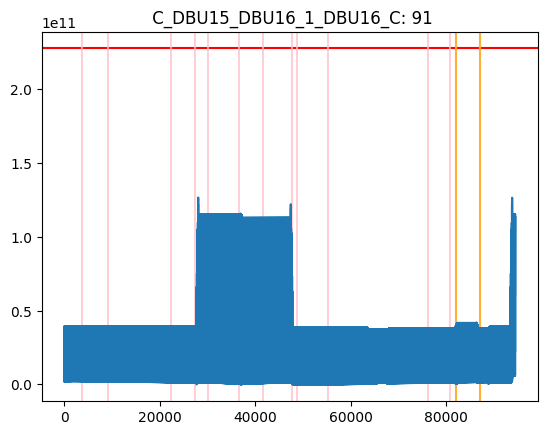

In [201]:
ADD_cov = []
for index, i in enumerate(rsum_list_cov):
    print("***********************************************************************************************")
    attack_in = (i > thresholds_cov[index]).nonzero()
#     for indices, j in enumerate(i):
#         if j > thresholds[index]:
#             attack_in.append(indices)
#     if len(attack_in) > 3:
#       start = (df_test['Time'][attack_in[0]+1201+window+w-1])/1e6
#       end = (df_test['Time'][attack_in[-1]+1201+window+w-1])/1e6
#       a_type = ""
#       if cols[things[index]-1][1] == "C":
#         a_type = "CT_ratio"
#       elif cols[things[index]-1][1] == "V":
#         a_type = "PT_ratio"
    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#       at_sensors += [things[index]]
    at_neighbor[things[index]] = attack_in
#       atk = True
#     else:
#       atk = False
#       print(f"Sensor: {things[index]} {cols[things[index]-1]}, No Attacks")


    plt.title(f"{cols[things[index]-1]}: {things[index]}")
    plt.axhline(thresholds_cov[index], color='red')


    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[(df_test['Time'] >= attack_dict[things[index]][0] * 1e6) & (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD_cov = detection_delay(violations_cov[index], [(start, end)], window, w, persistency)[0]
                ADD_cov.append(DD_cov)
                print(f"DD = {DD_cov}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')


            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_cov = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_cov.append(DD_cov)
                  print(f"DD = {DD_cov}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)
    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_cov = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_cov.append(DD_cov)
                  print(f"DD = {DD_cov}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

***********************************************************************************************
Sensor: 1  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_A


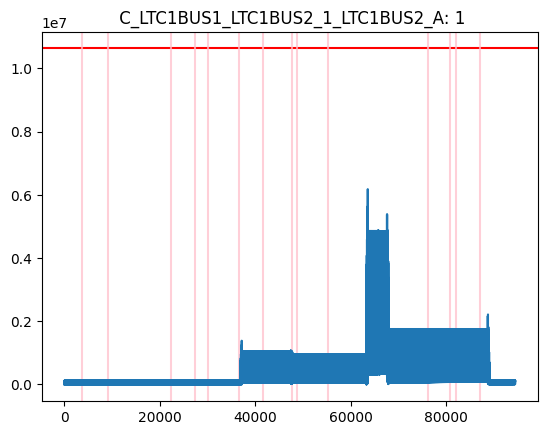

***********************************************************************************************
Sensor: 2  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_B
2
DD = 1


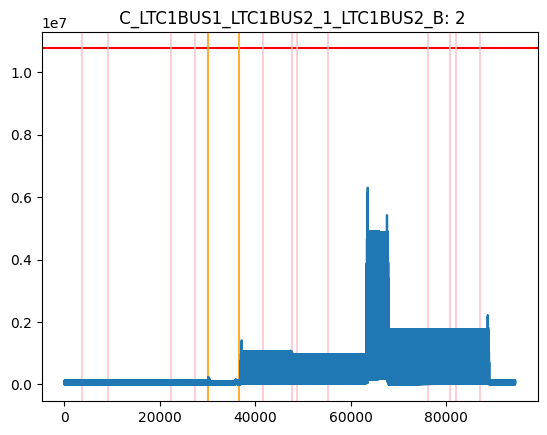

***********************************************************************************************
Sensor: 3  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS2_C


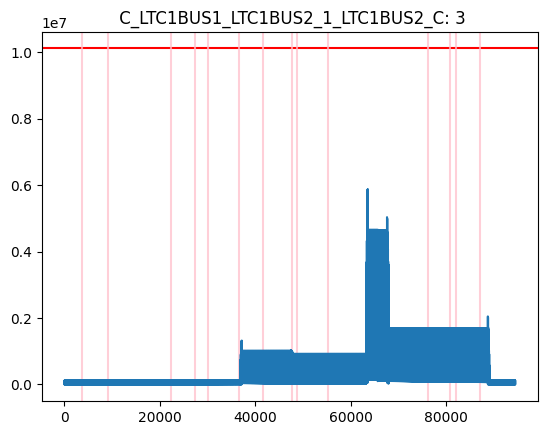

***********************************************************************************************
Sensor: 5  V_BUS20KV1_AN
DD = 18
5
DD = 0


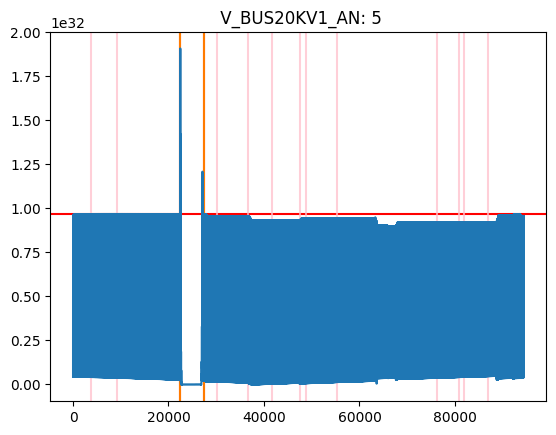

***********************************************************************************************
Sensor: 6  V_BUS20KV1_BN


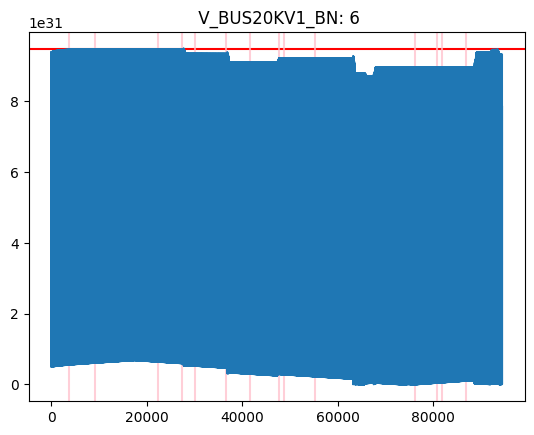

***********************************************************************************************
Sensor: 7  V_BUS20KV1_CN


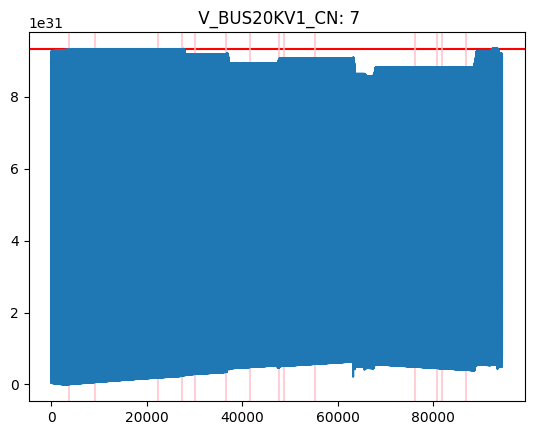

***********************************************************************************************
Sensor: 8  C_WE919_WE910_1_WE910_A


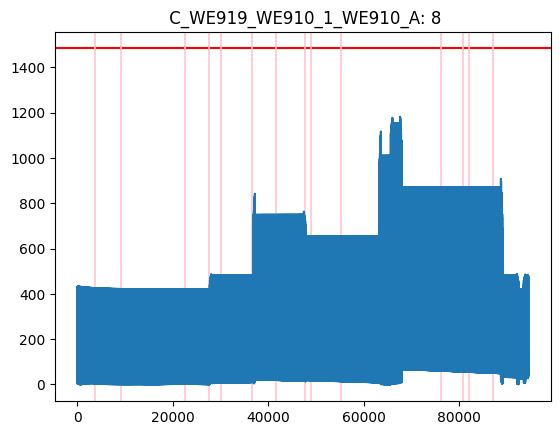

***********************************************************************************************
Sensor: 9  C_WE919_WE910_1_WE910_B


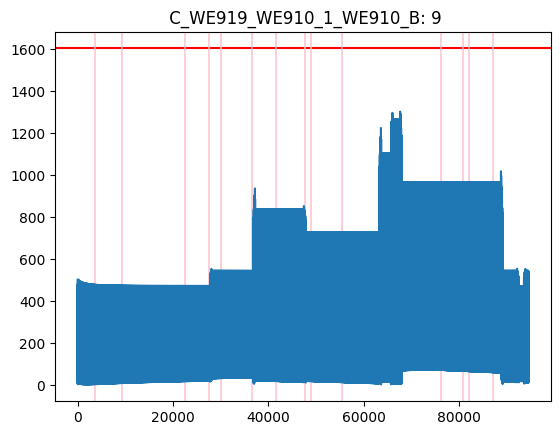

***********************************************************************************************
Sensor: 10  C_WE919_WE910_1_WE910_C


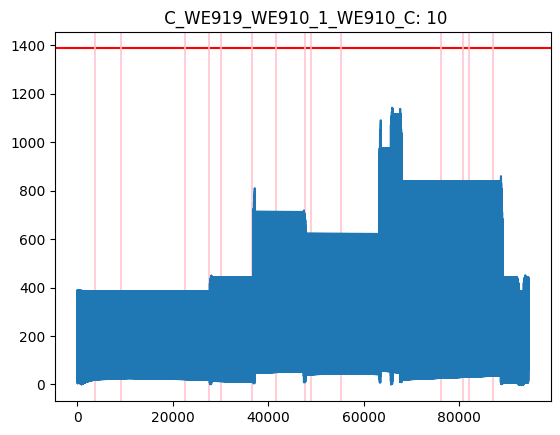

***********************************************************************************************
Sensor: 12  V_BLD911_AN
12
DD = 16


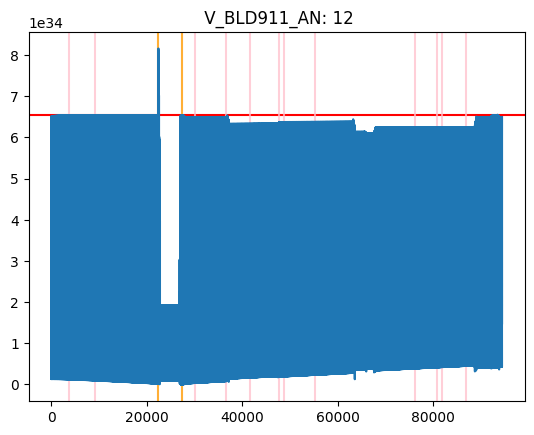

***********************************************************************************************
Sensor: 13  V_BLD911_BN


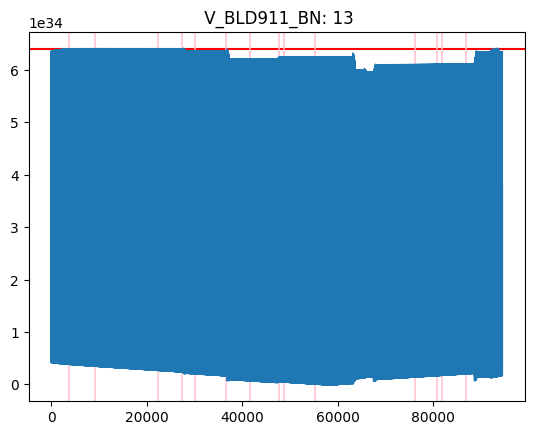

***********************************************************************************************
Sensor: 14  V_BLD911_CN


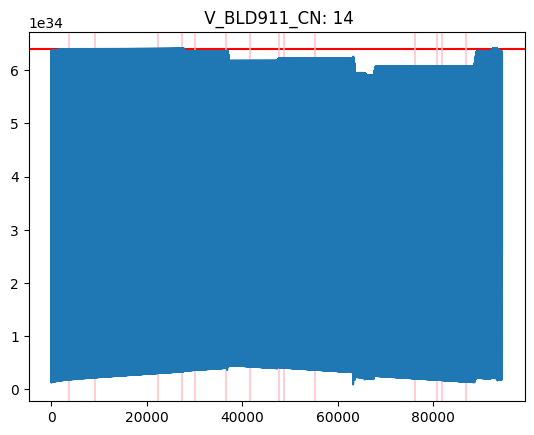

***********************************************************************************************
Sensor: 15  C_WE919_WE910_1_WE919_A
15
DD = None


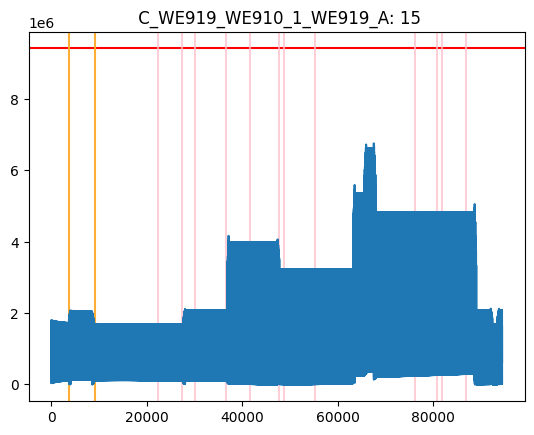

***********************************************************************************************
Sensor: 16  C_WE919_WE910_1_WE919_B
16
DD = None


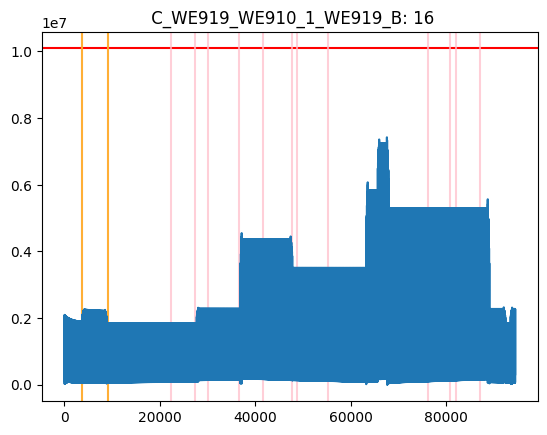

***********************************************************************************************
Sensor: 17  C_WE919_WE910_1_WE919_C
17
DD = None


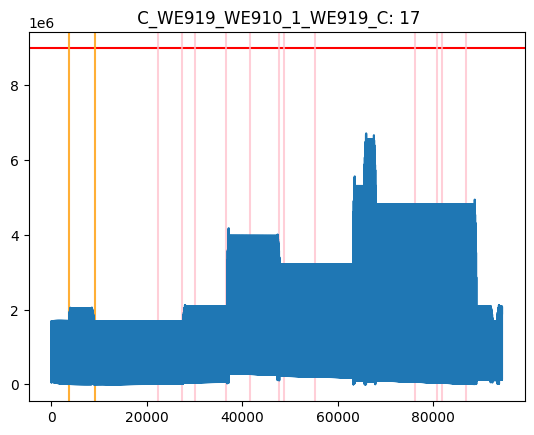

***********************************************************************************************
Sensor: 19  V_WE-115KV2_AN
19
DD = 16


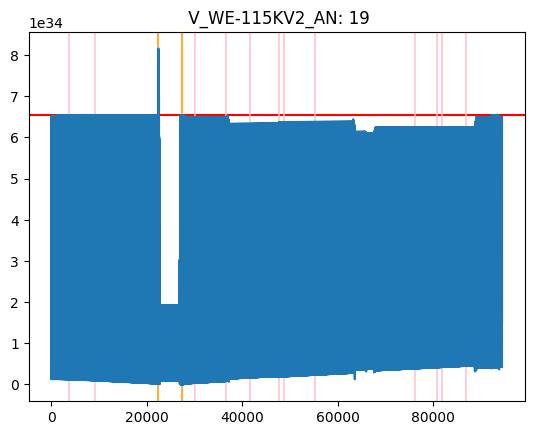

***********************************************************************************************
Sensor: 20  V_WE-115KV2_BN


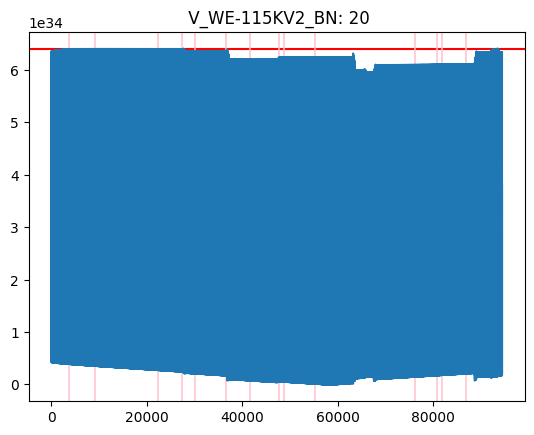

***********************************************************************************************
Sensor: 21  V_WE-115KV2_CN


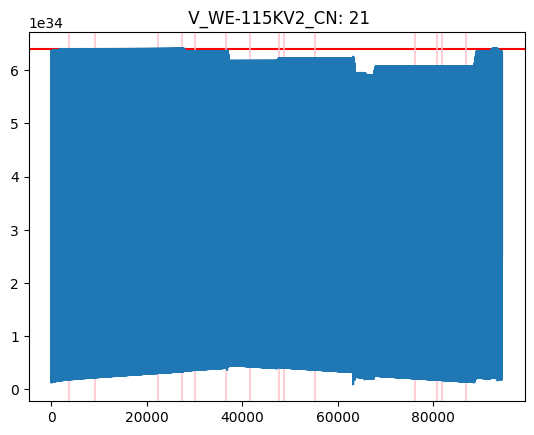

***********************************************************************************************
Sensor: 22  C_WE927_WE929_1_WE929_A
22
DD = None


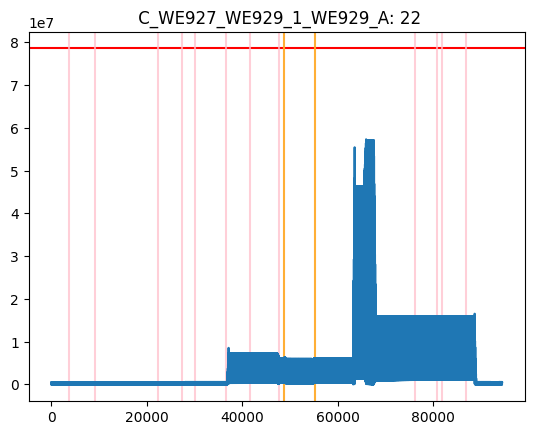

***********************************************************************************************
Sensor: 23  C_WE927_WE929_1_WE929_B
23
DD = None


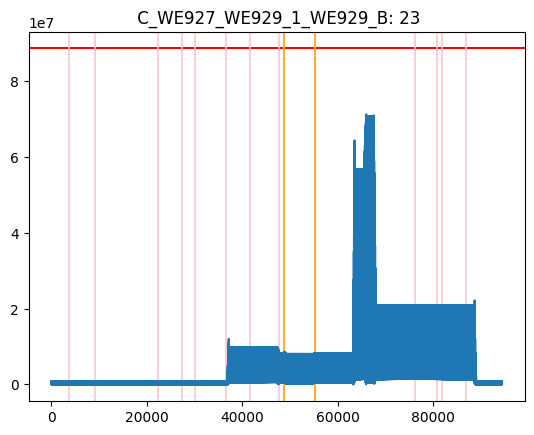

***********************************************************************************************
Sensor: 24  C_WE927_WE929_1_WE929_C
24
DD = None


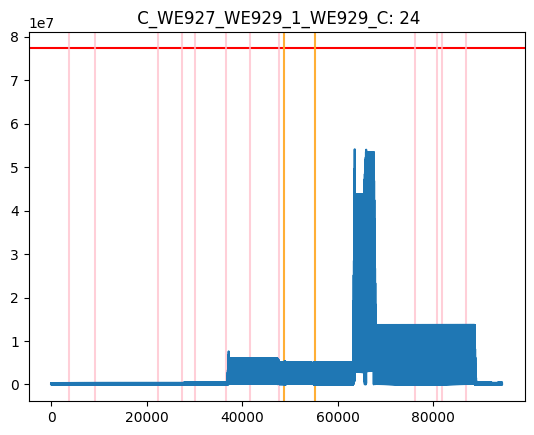

***********************************************************************************************
Sensor: 26  V_WE-115KV1_AN
26
DD = 16


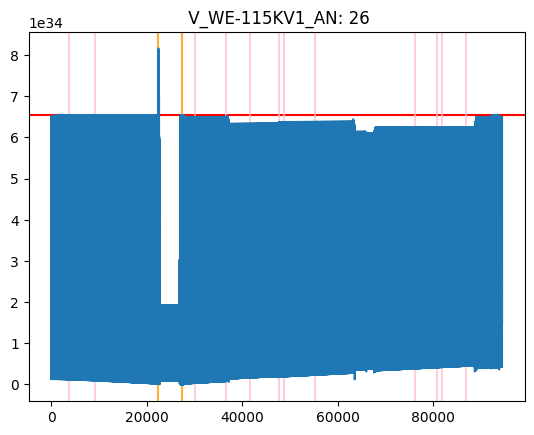

***********************************************************************************************
Sensor: 27  V_WE-115KV1_BN


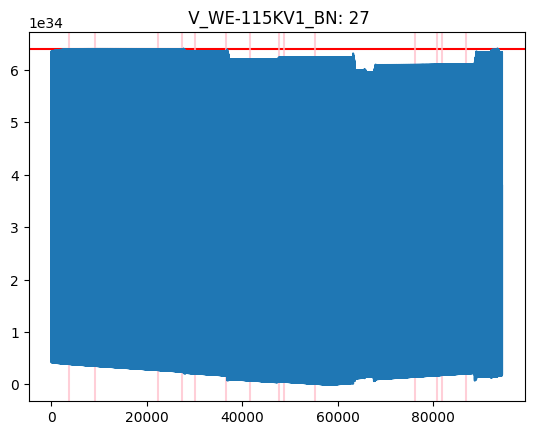

***********************************************************************************************
Sensor: 28  V_WE-115KV1_CN


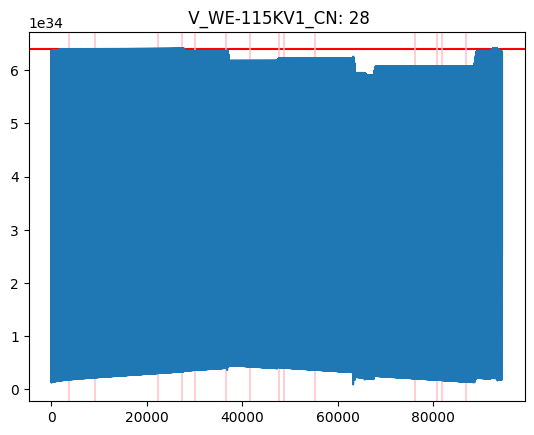

***********************************************************************************************
Sensor: 29  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_A


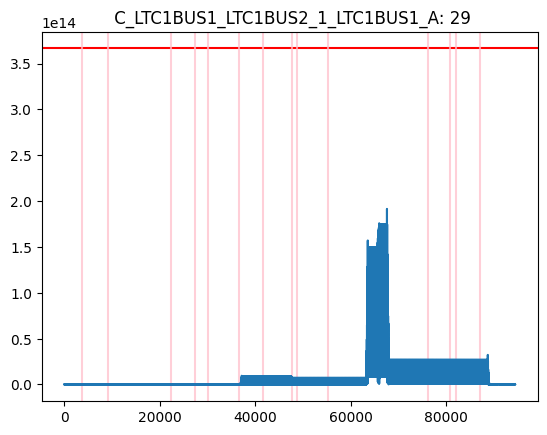

***********************************************************************************************
Sensor: 30  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_B
30
DD = 6


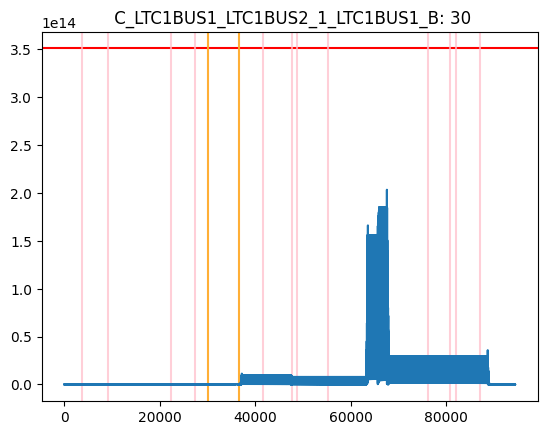

***********************************************************************************************
Sensor: 31  C_LTC1BUS1_LTC1BUS2_1_LTC1BUS1_C


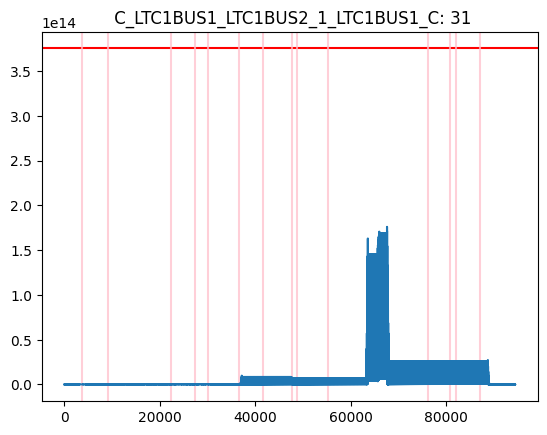

***********************************************************************************************
Sensor: 33  V_BUS20KV2_AN


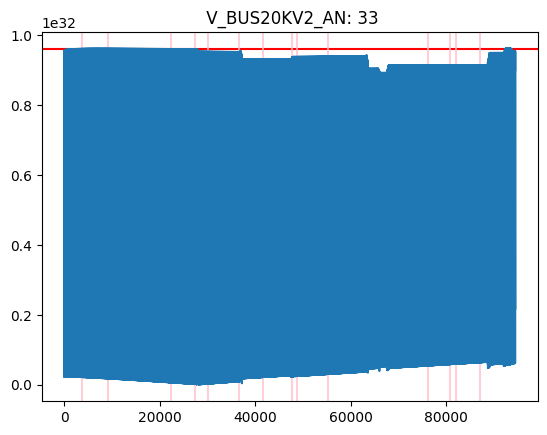

***********************************************************************************************
Sensor: 34  V_BUS20KV2_BN


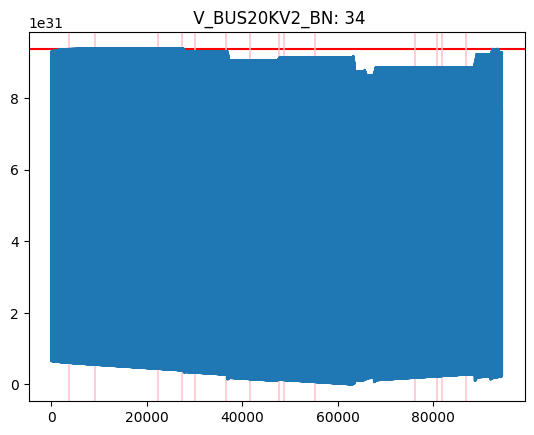

***********************************************************************************************
Sensor: 35  V_BUS20KV2_CN


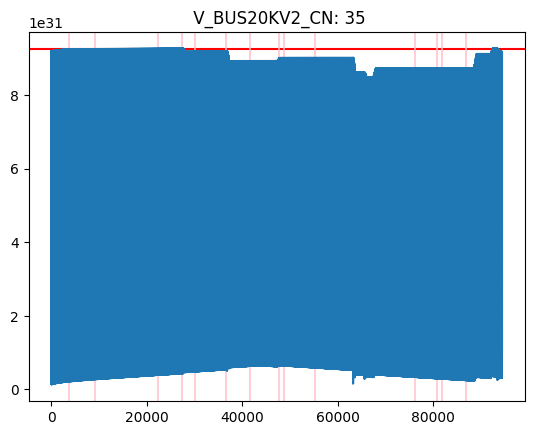

***********************************************************************************************
Sensor: 36  C_WE927_WE929_1_WE927_A
DD = None
36
DD = 0


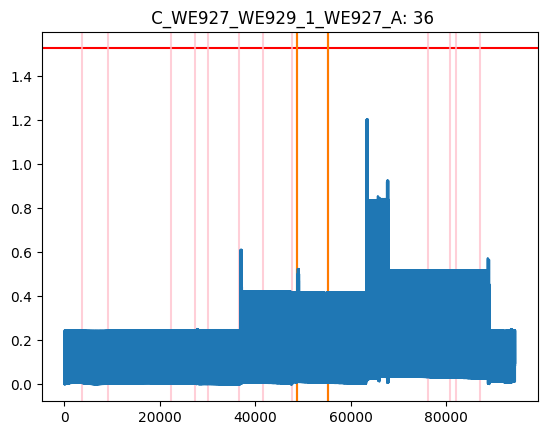

***********************************************************************************************
Sensor: 37  C_WE927_WE929_1_WE927_B
DD = None
37
DD = 0


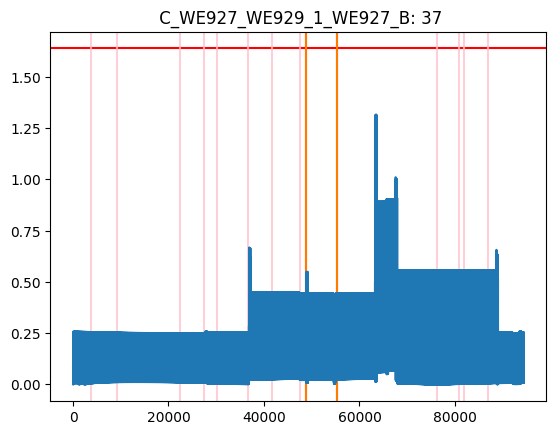

***********************************************************************************************
Sensor: 38  C_WE927_WE929_1_WE927_C
DD = None
38
DD = 0


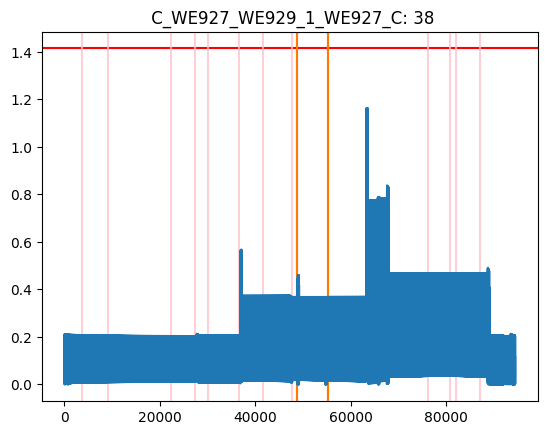

***********************************************************************************************
Sensor: 40  C_WE957_WE950_1_WE950_A


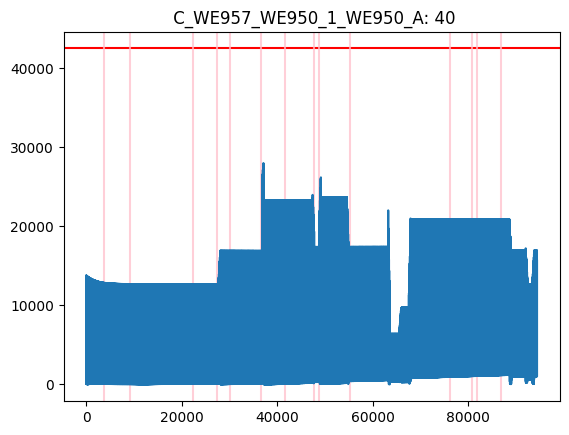

***********************************************************************************************
Sensor: 41  C_WE957_WE950_1_WE950_B


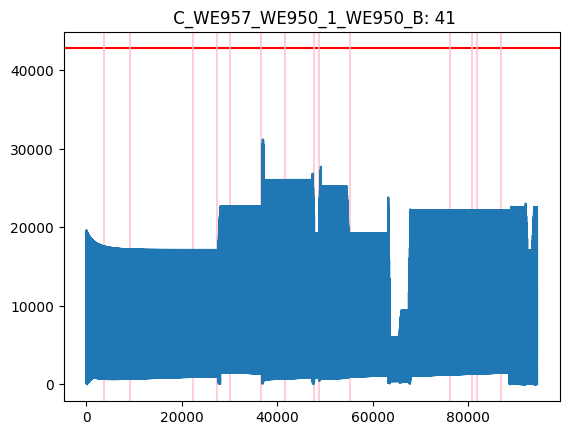

***********************************************************************************************
Sensor: 42  C_WE957_WE950_1_WE950_C


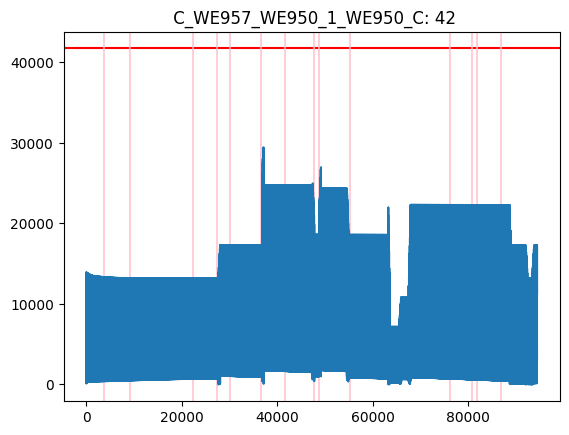

***********************************************************************************************
Sensor: 44  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_A
44
DD = 4804


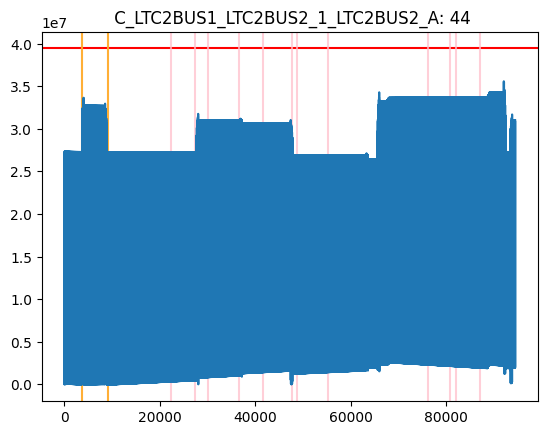

***********************************************************************************************
Sensor: 45  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_B
45
DD = 4810


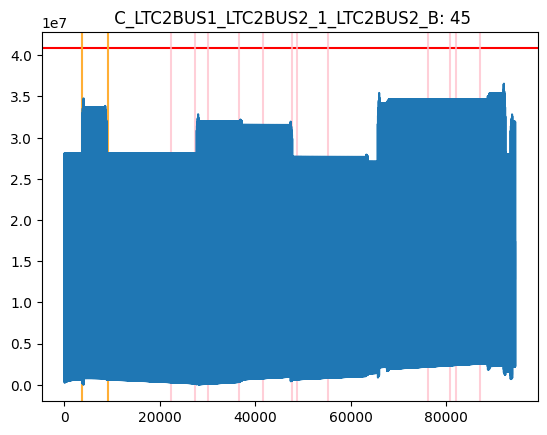

***********************************************************************************************
Sensor: 46  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS2_C
46
DD = 4798


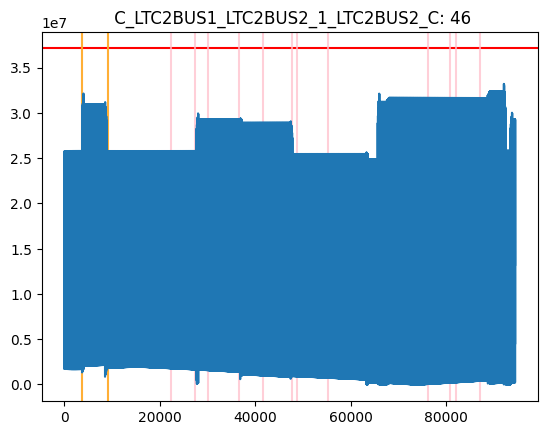

***********************************************************************************************
Sensor: 48  C_WE957_WE950_1_WE957_A
48
DD = None


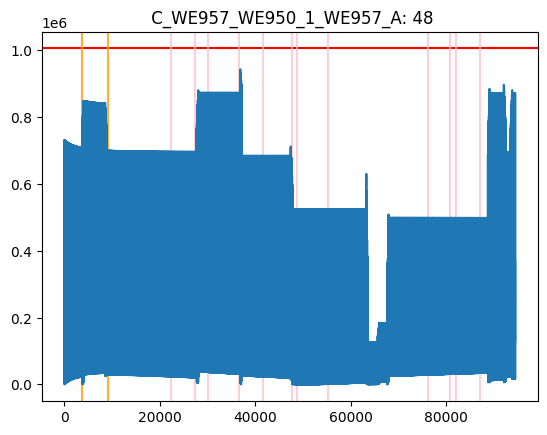

***********************************************************************************************
Sensor: 49  C_WE957_WE950_1_WE957_B
49
DD = None


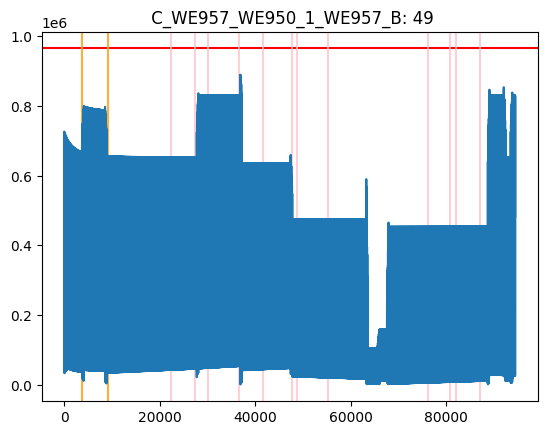

***********************************************************************************************
Sensor: 50  C_WE957_WE950_1_WE957_C
50
DD = None


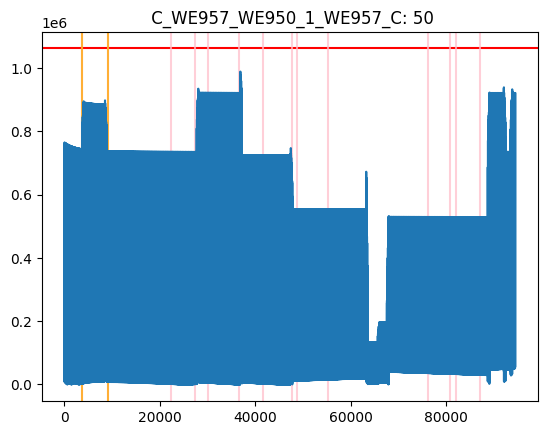

***********************************************************************************************
Sensor: 52  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_A
DD = 284
52
DD = None


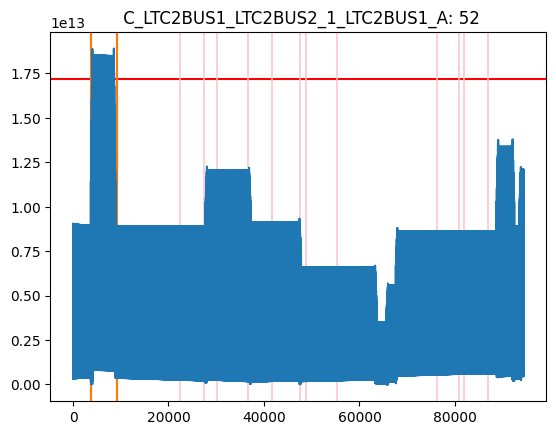

***********************************************************************************************
Sensor: 53  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_B
DD = 310
53
DD = None


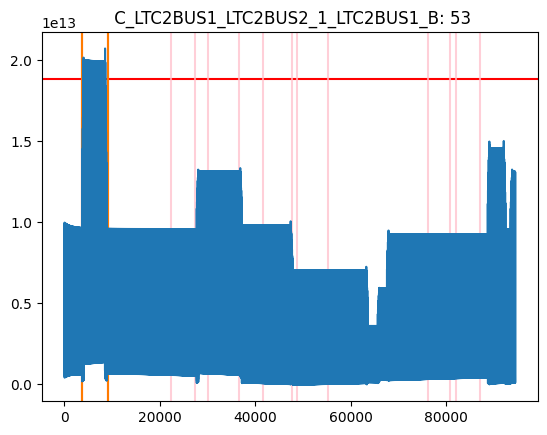

***********************************************************************************************
Sensor: 54  C_LTC2BUS1_LTC2BUS2_1_LTC2BUS1_C
DD = 296
54
DD = None


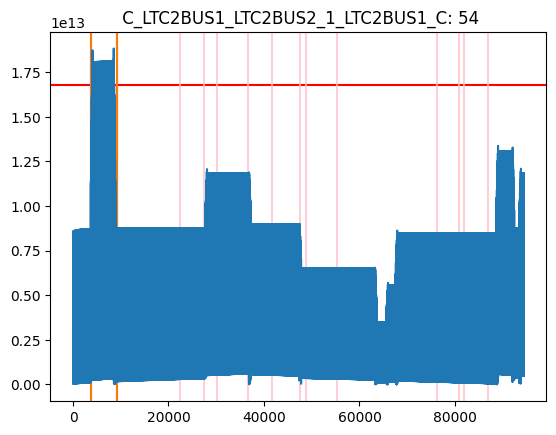

***********************************************************************************************
Sensor: 56  V_BUS13KV_AN
56
DD = 13


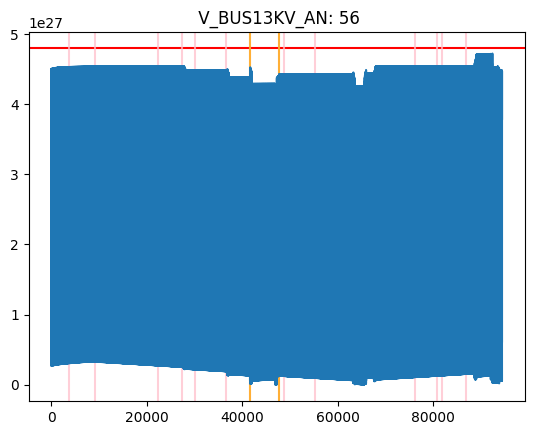

***********************************************************************************************
Sensor: 57  V_BUS13KV_BN
57
DD = 0


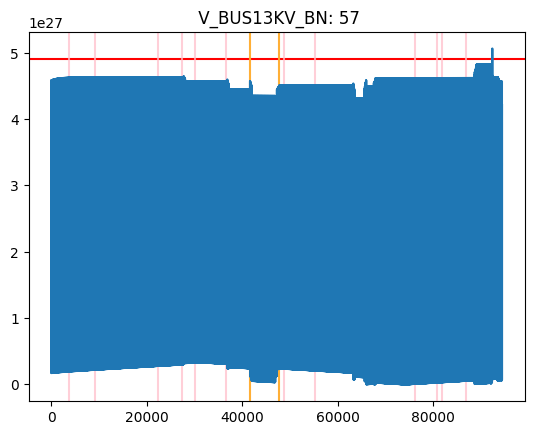

***********************************************************************************************
Sensor: 58  V_BUS13KV_CN
58
DD = 26


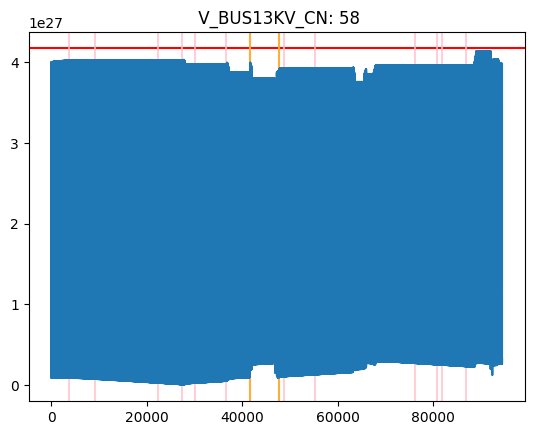

***********************************************************************************************
Sensor: 59  C_BUS13KV_DISTRIB1_1_BUS13KV_A
59
DD = 4823
59
DD = None
59
DD = 21


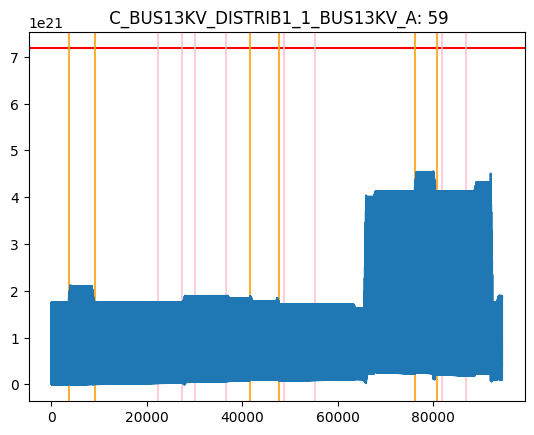

***********************************************************************************************
Sensor: 60  C_BUS13KV_DISTRIB1_1_BUS13KV_B
60
DD = 4811
60
DD = None
60
DD = 7


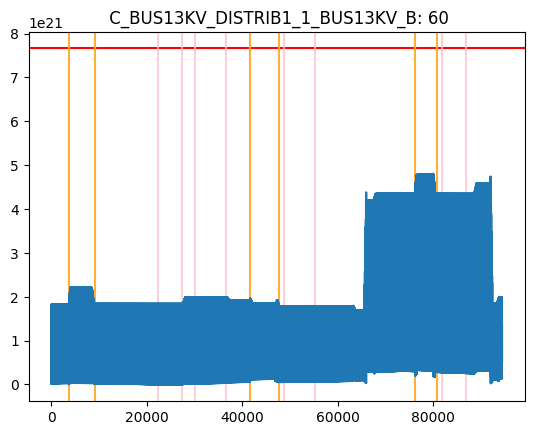

***********************************************************************************************
Sensor: 61  C_BUS13KV_DISTRIB1_1_BUS13KV_C
61
DD = 4798
61
DD = None
61
DD = 34


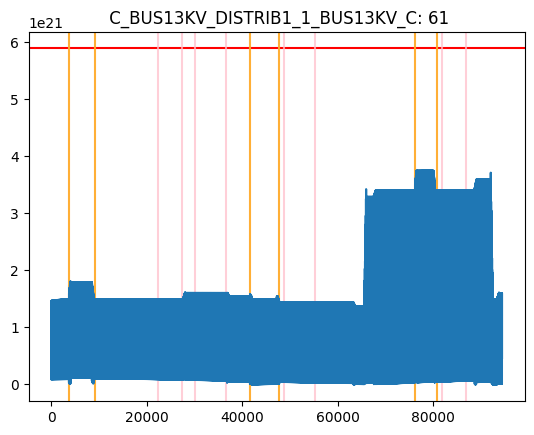

***********************************************************************************************
Sensor: 62  V_BUS13KV2_AN
62
DD = None
62
DD = 0


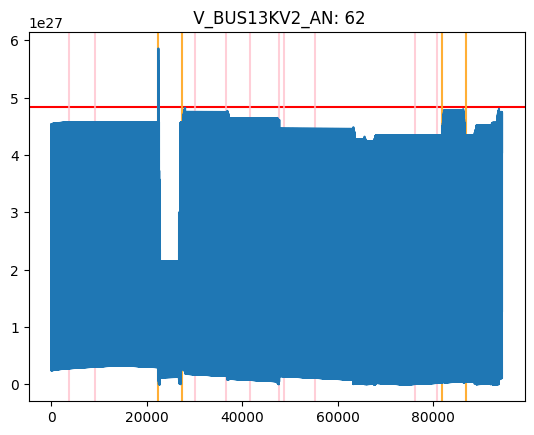

***********************************************************************************************
Sensor: 63  V_BUS13KV2_BN
63
DD = 0
63
DD = None


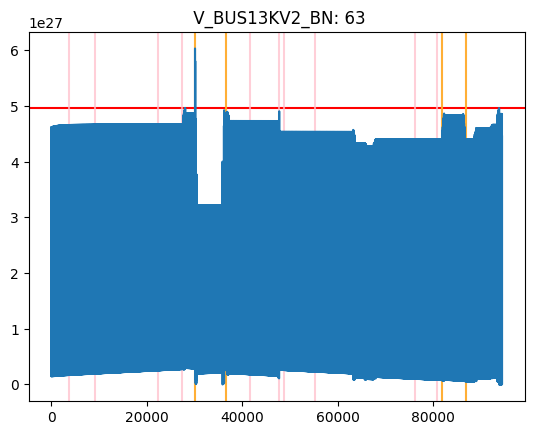

***********************************************************************************************
Sensor: 64  V_BUS13KV2_CN
64
DD = None


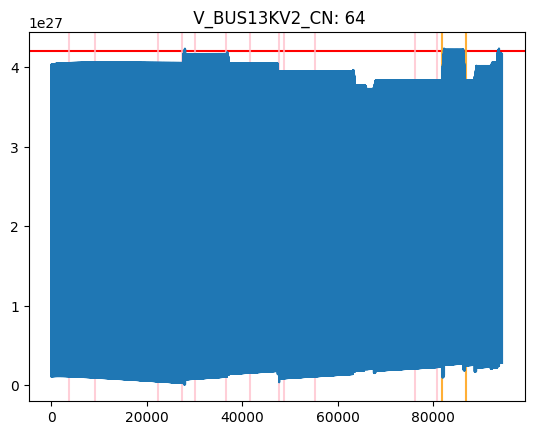

***********************************************************************************************
Sensor: 65  C_BUS13KV2_DB122_1_BUS13KV2_A


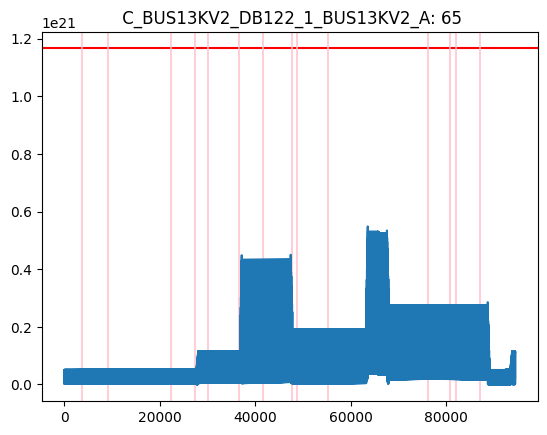

***********************************************************************************************
Sensor: 66  C_BUS13KV2_DB122_1_BUS13KV2_B
DD = None
66
DD = 0


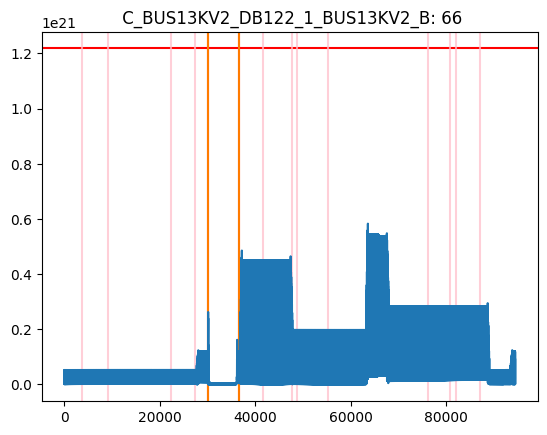

***********************************************************************************************
Sensor: 67  C_BUS13KV2_DB122_1_BUS13KV2_C


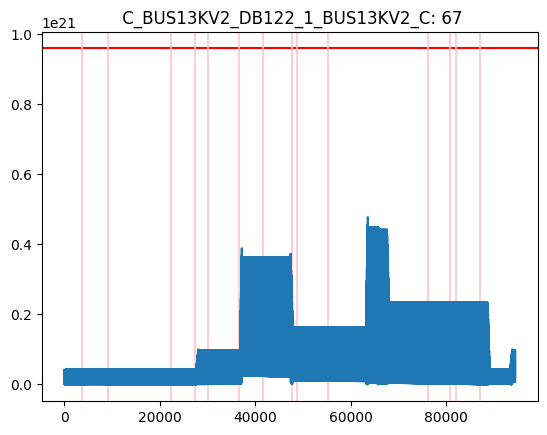

***********************************************************************************************
Sensor: 68  V_2DBU7_AN
DD = 0
68
DD = 14


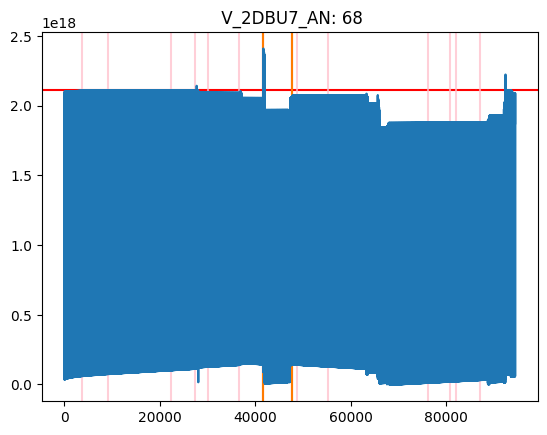

***********************************************************************************************
Sensor: 69  V_2DBU7_BN
DD = 5
69
DD = 1


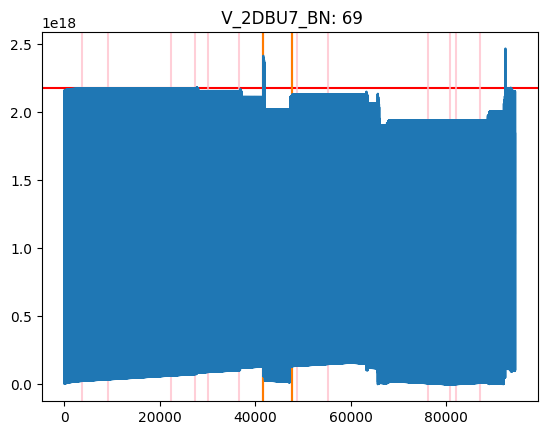

***********************************************************************************************
Sensor: 70  V_2DBU7_CN
DD = 12
70
DD = 0


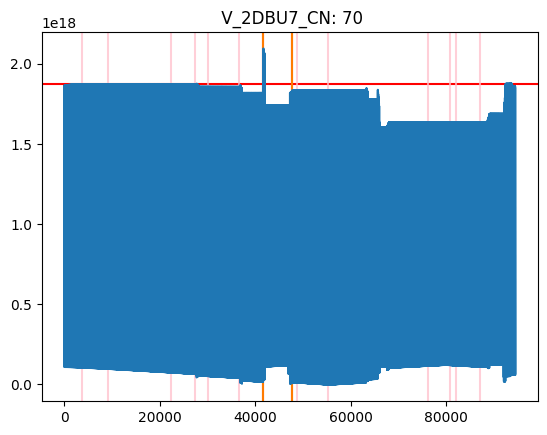

***********************************************************************************************
Sensor: 71  C_2DBX3_2DBU7_1_2DBU7_A
71
DD = None
DD = None
71
DD = 17


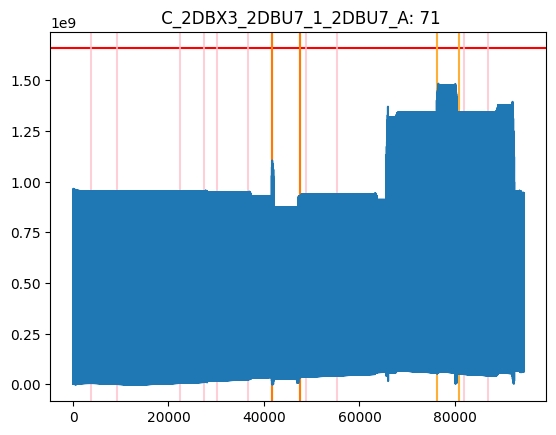

***********************************************************************************************
Sensor: 72  C_2DBX3_2DBU7_1_2DBU7_B
72
DD = None
DD = None
72
DD = 4


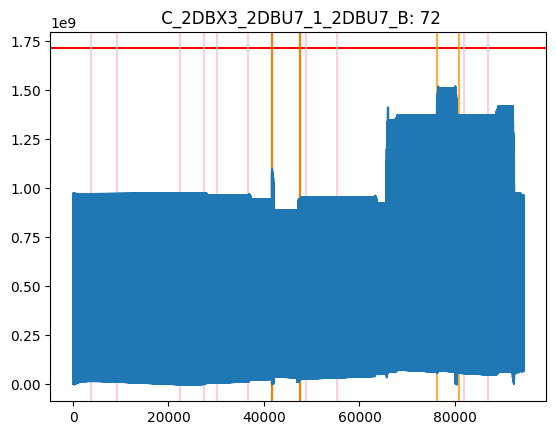

***********************************************************************************************
Sensor: 73  C_2DBX3_2DBU7_1_2DBU7_C
73
DD = None
DD = None
73
DD = 30


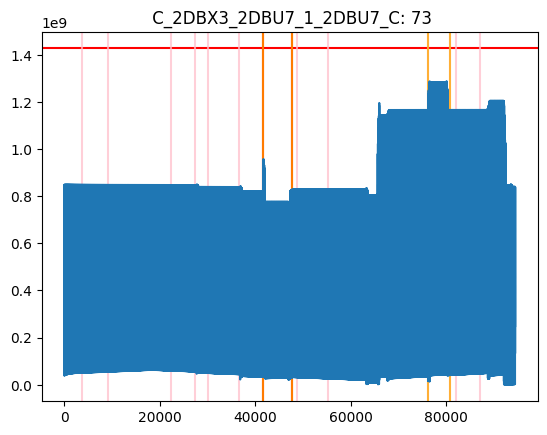

***********************************************************************************************
Sensor: 74  V_DBU6_AN
74
DD = None
74
DD = None


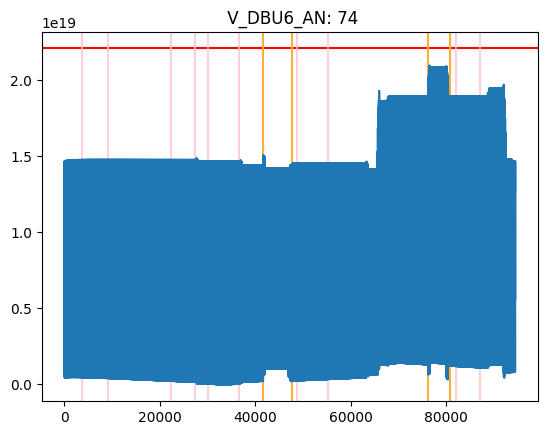

***********************************************************************************************
Sensor: 75  V_DBU6_BN
75
DD = None
75
DD = None


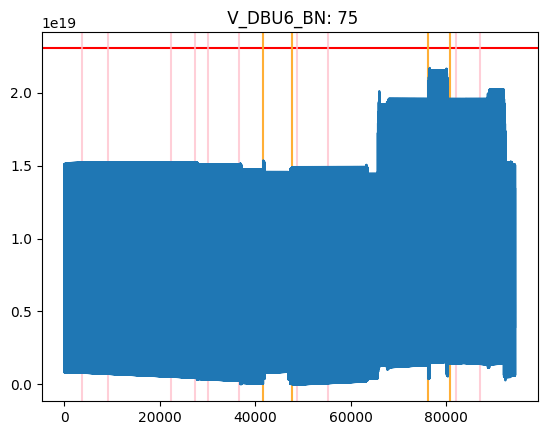

***********************************************************************************************
Sensor: 76  V_DBU6_CN
76
DD = None
76
DD = None


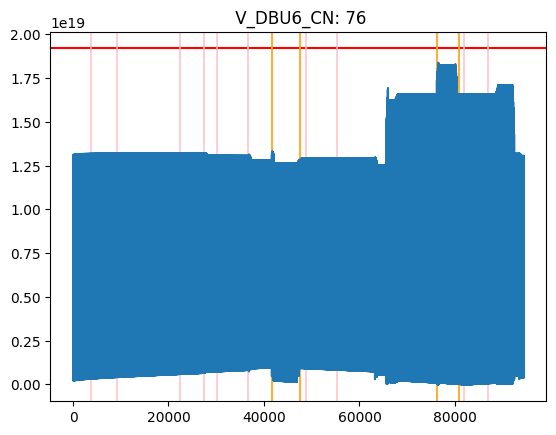

***********************************************************************************************
Sensor: 77  C_DBU5_DBU6_1_DBU6_A
DD = None
77
DD = None
77
DD = None


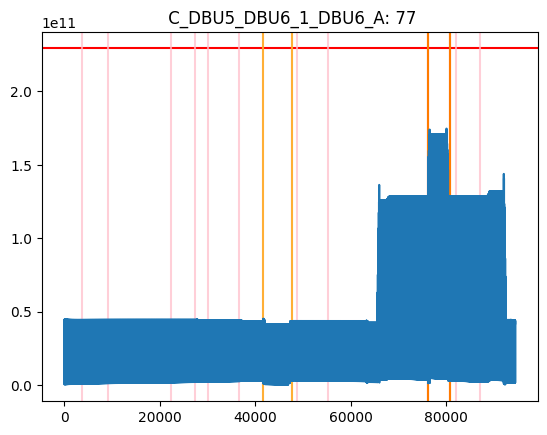

***********************************************************************************************
Sensor: 78  C_DBU5_DBU6_1_DBU6_B
DD = None
78
DD = None
78
DD = None


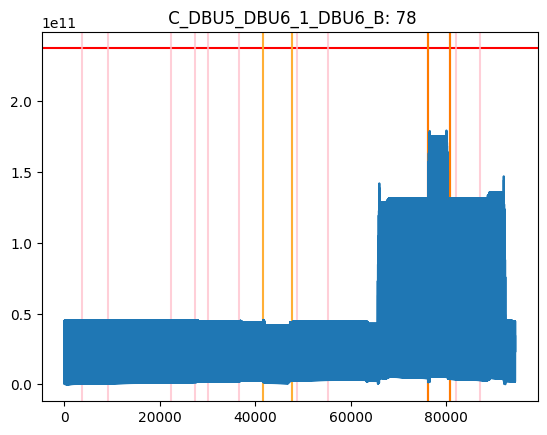

***********************************************************************************************
Sensor: 79  C_DBU5_DBU6_1_DBU6_C
DD = None
79
DD = None
79
DD = None


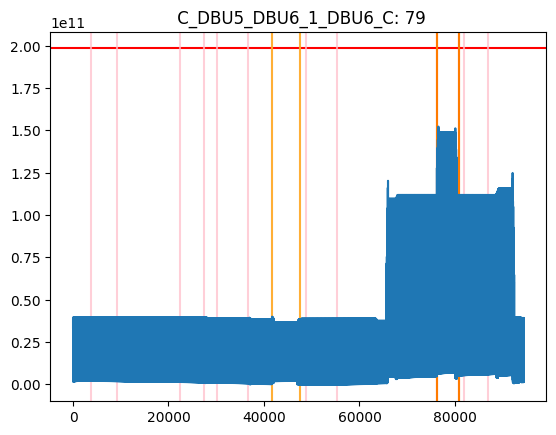

***********************************************************************************************
Sensor: 80  V_2DBU17_AN
80
DD = None


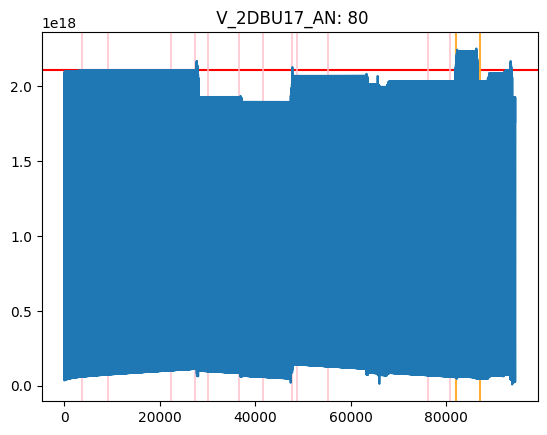

***********************************************************************************************
Sensor: 81  V_2DBU17_BN
81
DD = None


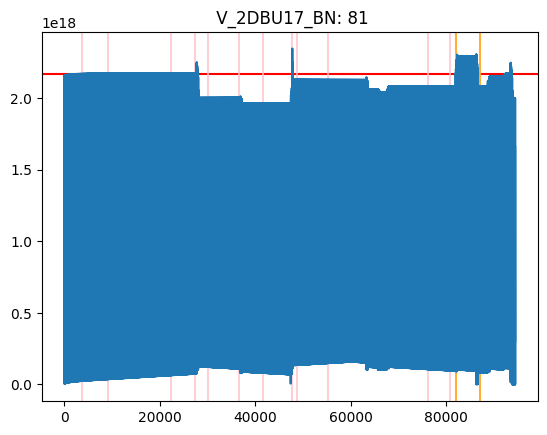

***********************************************************************************************
Sensor: 82  V_2DBU17_CN
82
DD = None


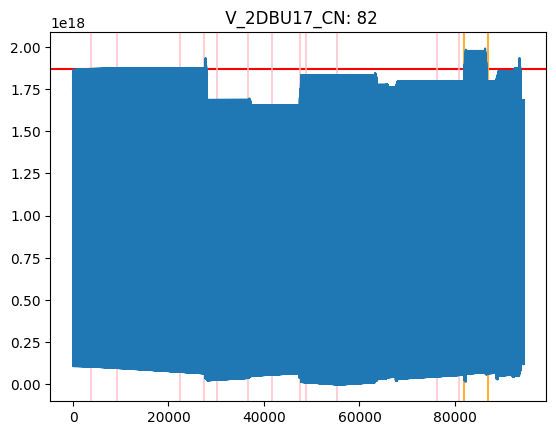

***********************************************************************************************
Sensor: 83  C_3DBX3_2DBU17_1_2DBU17_A


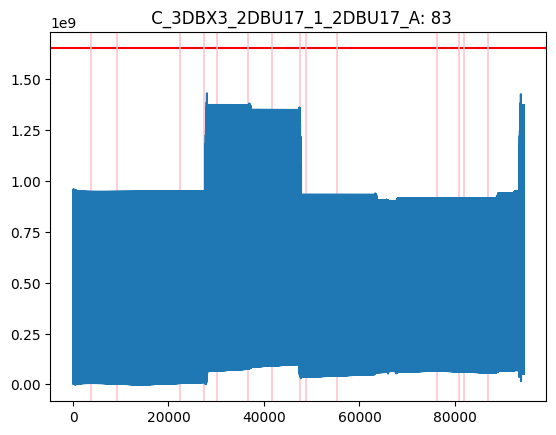

***********************************************************************************************
Sensor: 84  C_3DBX3_2DBU17_1_2DBU17_B
84
DD = 2


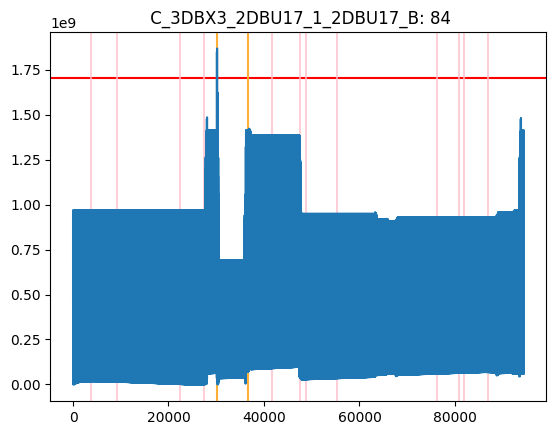

***********************************************************************************************
Sensor: 85  C_3DBX3_2DBU17_1_2DBU17_C


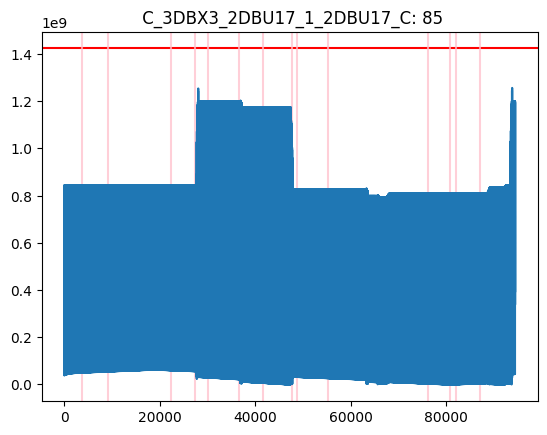

***********************************************************************************************
Sensor: 86  V_DBU16_AN
DD = None
86
DD = None


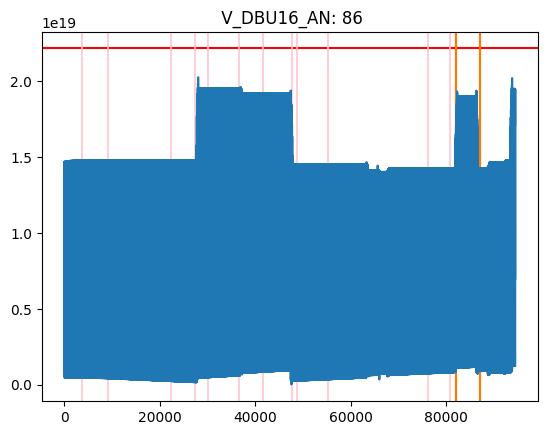

***********************************************************************************************
Sensor: 87  V_DBU16_BN
DD = None
87
DD = None


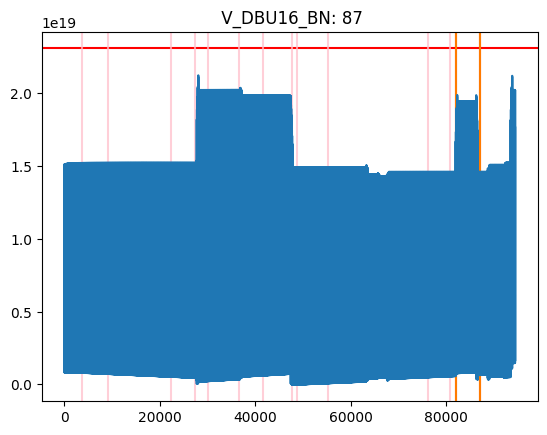

***********************************************************************************************
Sensor: 88  V_DBU16_CN
DD = None
88
DD = None


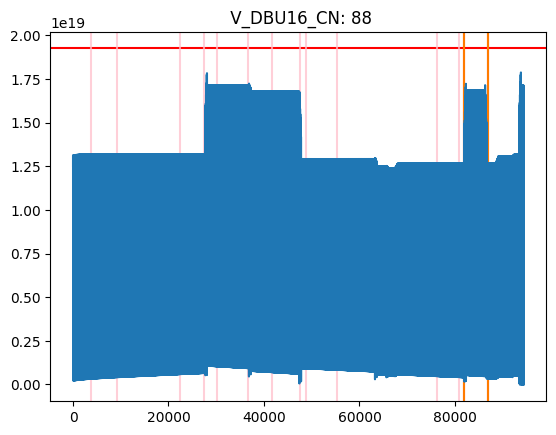

***********************************************************************************************
Sensor: 89  C_DBU15_DBU16_1_DBU16_A
89
DD = None


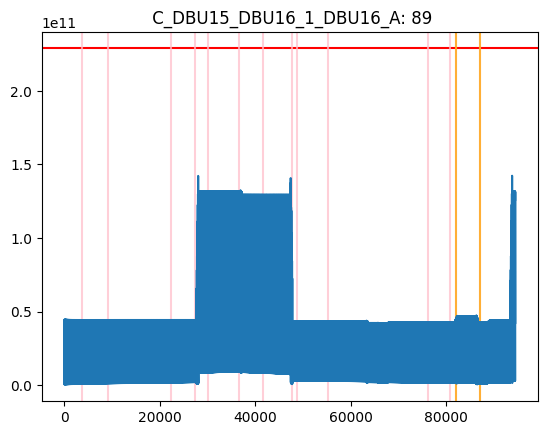

***********************************************************************************************
Sensor: 90  C_DBU15_DBU16_1_DBU16_B
90
DD = 1
90
DD = None


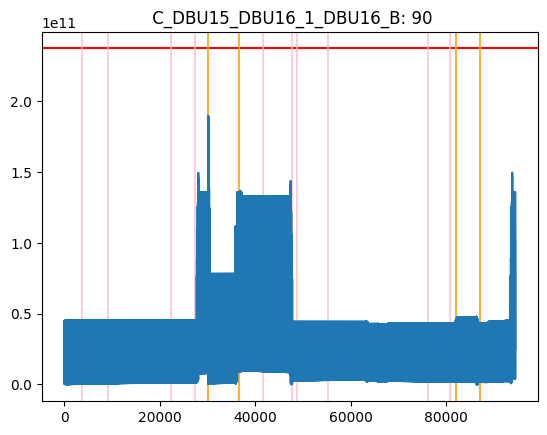

***********************************************************************************************
Sensor: 91  C_DBU15_DBU16_1_DBU16_C
91
DD = None


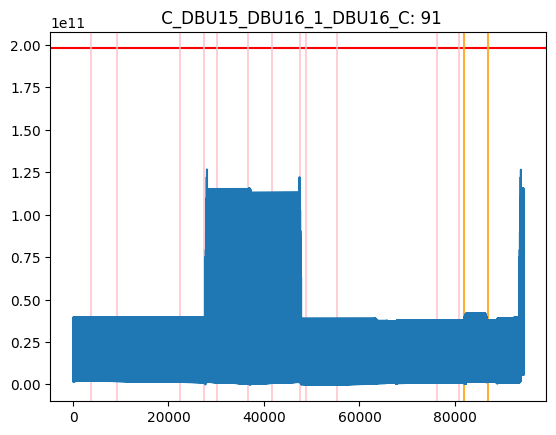

In [202]:
ADD_cov_99 = []
for index, i in enumerate(rsum_list_cov):
    print("***********************************************************************************************")
    attack_in = (i > thresholds_cov_99[index]).nonzero()
#     for indices, j in enumerate(i):
#         if j > thresholds[index]:
#             attack_in.append(indices)
#     if len(attack_in) > 3:
#       start = (df_test['Time'][attack_in[0]+1201+window+w-1])/1e6
#       end = (df_test['Time'][attack_in[-1]+1201+window+w-1])/1e6
#       a_type = ""
#       if cols[things[index]-1][1] == "C":
#         a_type = "CT_ratio"
#       elif cols[things[index]-1][1] == "V":
#         a_type = "PT_ratio"
    print(f"Sensor: {things[index]} {cols[things[index]-1]}")
#       at_sensors += [things[index]]
    at_neighbors[things[index]] = attack_in
#       atk = True
#     else:
#       atk = False
#       print(f"Sensor: {things[index]} {cols[things[index]-1]}, No Attacks")


    plt.title(f"{cols[things[index]-1]}: {things[index]}")
    plt.axhline(thresholds_cov_99[index], color='red')


    if things[index] in attack_dict:
        #if sensor is being attacked

        # ground truth
        attack_indices = df_test.index[(df_test['Time'] >= attack_dict[things[index]][0] * 1e6) & (df_test['Time'] <= attack_dict[things[index]][1] * 1e6)] - 1201
        for start, end in all_attack_indices:

            # if this is the attack time of the sensor, plot solid red lines
            if attack_indices[0] == start:
                DD_cov_99 = detection_delay(violations_cov[index], [(start, end)], window, w, persistency)[0]
                ADD_cov_99.append(DD_cov_99)
                print(f"DD = {DD_cov_99}")
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='red')
                plt.axvline(end_w, color='red')


            # otherwise, plot pink lines
            else:
                start_w = start-window-w
                end_w = end+window+w-1
                plt.axvline(start_w, color='pink', alpha=0.75)
                plt.axvline(end_w, color='pink', alpha=0.75)

            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_cov_99 = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_cov_99.append(DD_cov_99)
                  print(f"DD = {DD_cov_99}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)
    else:
         for start, end in all_attack_indices:
            start_w = start-window-w
            end_w = end+window+w-1
            plt.axvline(start_w, color='pink', alpha=0.75)
            plt.axvline(end_w, color='pink', alpha=0.75)
            for starts, ate in attack_i.items():
              if starts == start:
                if things[index] in ate:
                  print(things[index])
                  DD_corr = detection_delay(violations_corr[index], [(start, end)], window, w, persistency)[0]
                  ADD_corr.append(DD_corr)
                  print(f"DD = {DD_corr}")
                  plt.axvline(start_w, color='orange', alpha=0.75)
                  plt.axvline(end_w, color='orange', alpha=0.75)

    plt.plot(i)
    plt.show()

In [203]:
ADD_corr_99, ADD_cov_99

([1,
  0,
  0,
  16,
  None,
  None,
  None,
  16,
  None,
  None,
  None,
  16,
  6,
  0,
  0,
  0,
  0,
  0,
  0,
  4804,
  4810,
  4798,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  13,
  0,
  26,
  4823,
  None,
  21,
  4811,
  None,
  7,
  4798,
  None,
  34,
  None,
  0,
  0,
  None,
  None,
  0,
  0,
  14,
  14,
  1,
  1,
  0,
  0,
  None,
  17,
  17,
  None,
  4,
  4,
  None,
  30,
  30,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  2,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  1,
  None,
  None],
 [18,
  0,
  None,
  0,
  None,
  0,
  None,
  0,
  284,
  None,
  310,
  None,
  296,
  None,
  None,
  0,
  0,
  14,
  5,
  1,
  12,
  0,
  None,
  None,
  17,
  None,
  None,
  4,
  None,
  None,
  30,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None,
  None])

Visualization for the absolute rolling sum of covariance

In [204]:
order_attack = ['CT', 'Vphase', 'Cphase', 'GPS', 'GPS', 'CT', 'PT']

In [205]:
hops = {}
types = 1.1
for key, value in attack_dict.items():
  if types == value[0]:
    if value[1] not in hops:
      hops[value[1]]= [key]
    else:
      hops[value[1]] += [key]
  else:
    types = value[0]
    hops[value[1]]= [key]

In [206]:
stu = []
for i in hops:
  stu += [i]

In [207]:
all_attack_indice = []
for i in all_attack_indices:
  all_attack_indice += [i]
sorted(all_attack_indice)

[(4080, 8879),
 (22800, 27119),
 (30480, 36239),
 (42000, 47279),
 (49200, 54959),
 (76560, 80399),
 (82320, 86639)]

In [208]:
at_neighbor

{1: (array([], dtype=int64),),
 2: (array([], dtype=int64),),
 3: (array([], dtype=int64),),
 5: (array([22468, 22469, 22470, 22471, 22472, 22473, 22474, 22475, 22476,
         22477, 22478, 22479, 22480, 22481, 22482, 22483, 22509, 22510,
         22511, 22512, 22513, 22514, 22515, 22516, 22517, 22518, 22519,
         22520, 22521, 27112, 27113, 27114, 27115, 27116, 27117]),),
 6: (array([], dtype=int64),),
 7: (array([], dtype=int64),),
 8: (array([], dtype=int64),),
 9: (array([], dtype=int64),),
 10: (array([], dtype=int64),),
 12: (array([22470, 22471, 22472, 22473, 22474, 22475, 22476, 22477, 22478,
         22510, 22511, 22512, 22513, 22514, 22515, 22516, 22517, 22518,
         22552, 22553, 22554, 22555, 22556, 22592, 22593, 22594, 22595,
         22596]),),
 13: (array([], dtype=int64),),
 14: (array([], dtype=int64),),
 15: (array([], dtype=int64),),
 16: (array([], dtype=int64),),
 17: (array([], dtype=int64),),
 19: (array([22470, 22471, 22472, 22473, 22474, 22475, 22476, 2

In [209]:
def false_localization(attack_list ,hop):
  FL = 0
  for attacked_sensor in attack_list:
    if attacked_sensor in hop:
      continue
    else:
      FL += 1
  FLR = FL/len(hop)
  return FLR

Summary:

In [210]:
n = 0
falseLR = []
for start, end in sorted(all_attack_indice):
  attack_list = []
  print("***********************************************************************************************")
  print(f'For the {order_attack[n]} attack starting at index: {start} and ending at index: {end}')
  for key, values in at_neighbor.items():
    for i in values:
      if len(i) > 0:
        for k in i:
          if k+350 > start and k+350 < end:
            if key not in attack_list:
              attack_list += [key]
  print(f'These were the sensors that were detected inside that particular attack interval: {attack_list}')
  for atta in attack_list:
    hop = []
    for j in hops[stu[n]]:
      if j not in emptyr:
        hop += [j]
        hop += adj_list[j]
      else:
        hop +=[j]
    falseLRs = false_localization(attack_list, hop)
    falseLR += [falseLRs]
    if atta in hop:
      print(f'Attacked has been detected at sensor: {atta}')
    else:
      print(f'{atta} is a False Localization')

  if len(attack_list) > 0:
    print(f'This is the 1-hop neighborhood that we are interested in {sorted(hop)}')
  n += 1

***********************************************************************************************
For the CT attack starting at index: 4080 and ending at index: 8879
These were the sensors that were detected inside that particular attack interval: [52, 53, 54]
Attacked has been detected at sensor: 52
Attacked has been detected at sensor: 53
Attacked has been detected at sensor: 54
This is the 1-hop neighborhood that we are interested in [15, 16, 17, 44, 45, 46, 48, 49, 50, 52, 53, 54, 55, 59, 60, 61]
***********************************************************************************************
For the Vphase attack starting at index: 22800 and ending at index: 27119
These were the sensors that were detected inside that particular attack interval: [5, 12, 19, 26, 62]
Attacked has been detected at sensor: 5
Attacked has been detected at sensor: 12
Attacked has been detected at sensor: 19
Attacked has been detected at sensor: 26
Attacked has been detected at sensor: 62
This is the 1-hop ne

In [211]:
falseLR

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]

In [212]:
np.mean(ADD)

61.857142857142854

In [213]:
np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

208.33200075946164

In [214]:
np.mean(ADD) * np.mean(df_test['Time'][df_test['Time'] > 0.25e6].diff())

12886.822332692413

In [215]:
all_attack_indice

[(4080, 8879),
 (30480, 36239),
 (82320, 86639),
 (76560, 80399),
 (49200, 54959),
 (22800, 27119),
 (42000, 47279)]

In [216]:
at_neighbor

{1: (array([], dtype=int64),),
 2: (array([], dtype=int64),),
 3: (array([], dtype=int64),),
 5: (array([22468, 22469, 22470, 22471, 22472, 22473, 22474, 22475, 22476,
         22477, 22478, 22479, 22480, 22481, 22482, 22483, 22509, 22510,
         22511, 22512, 22513, 22514, 22515, 22516, 22517, 22518, 22519,
         22520, 22521, 27112, 27113, 27114, 27115, 27116, 27117]),),
 6: (array([], dtype=int64),),
 7: (array([], dtype=int64),),
 8: (array([], dtype=int64),),
 9: (array([], dtype=int64),),
 10: (array([], dtype=int64),),
 12: (array([22470, 22471, 22472, 22473, 22474, 22475, 22476, 22477, 22478,
         22510, 22511, 22512, 22513, 22514, 22515, 22516, 22517, 22518,
         22552, 22553, 22554, 22555, 22556, 22592, 22593, 22594, 22595,
         22596]),),
 13: (array([], dtype=int64),),
 14: (array([], dtype=int64),),
 15: (array([], dtype=int64),),
 16: (array([], dtype=int64),),
 17: (array([], dtype=int64),),
 19: (array([22470, 22471, 22472, 22473, 22474, 22475, 22476, 2

In [217]:
157*208

32656

In [218]:
at = [62, 64, 80, 82, 86, 87, 88]+[59, 60, 61, 71, 72, 73, 77, 78, 79]+[5, 12, 19, 26, 62]+[52, 53, 54]+[58, 68, 70, 76]
len(at)

28

In [219]:
neighbors = []
for i in attack_dict:
  neighbors += [i]
  if i not in [55,39]:
    for j in adj_list[i]:
      neighbors += [j]